In [ ]:
# create df 
df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
# df_o = pd.read_csv('New_XRF.csv')
df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']

df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)



In [68]:
# create df 
df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')

In [ ]:
df

In [102]:
b = 1
a = 0
test_sz = 2
from scipy import stats 
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
max_rat_val = -9999999999999
max_rat = 0 
max_rat1 = 0 
max_rat0 = 0 
max_rat2 = 0 
X1 = pd.DataFrame(X_train)
Y1 = pd.DataFrame(Y_train)
# print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
# print(Y1.columns)
for rat in np.linspace(0,4,12):
  curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
  if curr > max_rat_val :
    max_rat = rat
    # max_rat1 = rat1
    # max_rat0 = rat0 
    # max_rat2 = rat2
    max_rat_val = curr 
    print(max_rat_val, rat)
print(max_rat_val, max_rat )

df_i['new_sio2'] = df_i['SiO2-%'] -  max_rat*df_i['K2O-%']


# df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
# df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)


# for rat1 in np.linspace(0,1,1): # 8 # 20 
#   for rat in np.linspace(0,8,20):
#     for rat0 in np.linspace(0,8,1):
#       for rat2 in np.linspace(1,2,1): 
#         rat0 = 0 
#         curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%']-rat0*X1['Al2O3-%'] )  #- rat1*X1['Fe2O3-%'] - rat2*X1['MgO-%'])
#         # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
#         if curr > max_rat_val :
#           max_rat = rat
#           max_rat1 = rat1
#           max_rat0 = rat0 
#           max_rat2 = rat2
#           max_rat_val = curr 
# print(max_rat_val,max_rat, max_rat1, max_rat0, max_rat2)

-1.9137657045233083 0.0
-1.7410118730348958 0.36363636363636365
-1.5742624369268645 0.7272727272727273
-1.413517396199214 1.0909090909090908
-1.2587767508519447 1.4545454545454546
-1.110040500885058 1.8181818181818183
-0.967308646298551 2.1818181818181817
-0.830581187092426 2.5454545454545454
-0.6998581232666812 2.909090909090909
-0.5751394548213185 3.272727272727273
-0.4564251817563372 3.6363636363636367
-0.34371530407173667 4.0
-0.34371530407173667 4.0


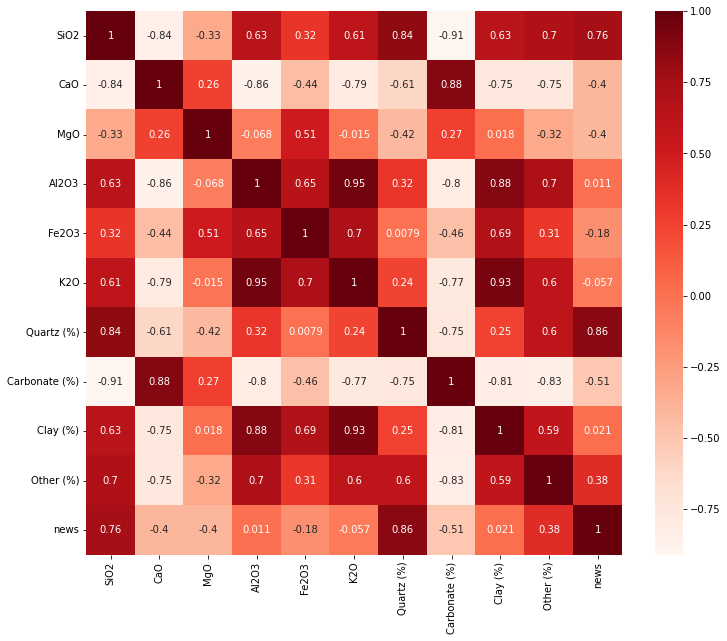

In [87]:
# #importing libraries
# from sklearn.datasets import load_boston
# import pandas as pd
# import numpy as np
# import matplotlib
# import matplotlib.pyplot as plt
# import seaborn as sns
# import statsmodels.api as sm
# %matplotlib inline
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LinearRegression
# from sklearn.feature_selection import RFE
# from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso

# df['news'] = df_i['SiO2-%'] -  max_rat*df_i['K2O-%']

# # 'Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
# # df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]


# # df = df.drop(['Median Depth'], axis = 1)

# # df = df.drop(['Unnamed: 12'], axis = 1)

# # df = df.drop(['Unnamed: 13'], axis = 1)

# df = df.drop(['Total'], axis = 1)


# # df_i = df_i.drop(['SiO2-%'], axis = 1)
# # df_i = df_i.drop(['SiO2-%'], axis = 1)


# #Using Pearson Correlation
# plt.figure(figsize=(12,10))
# cor = df.corr()
# sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
# plt.show()

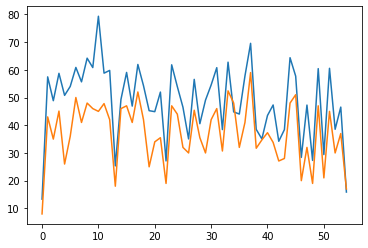

In [103]:
plt.plot(df_i['new_sio2'])
plt.plot(df_o['Quartz-Sio2'])

Feature 0: 5.313180
Feature 1: 2.913224
Feature 2: 4.332881
Feature 3: 1.791185
Feature 4: 1.738206
Feature 5: 1.748075
Feature 6: 5.118335


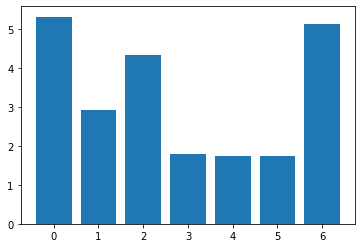

In [104]:
# example of anova f-test feature selection for numerical data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from matplotlib import pyplot

# # load the dataset
# def load_dataset(filename):
# 	# load the dataset as a pandas DataFrame
# 	data = read_csv(filename, header=None)
# 	# retrieve numpy array
# 	dataset = data.values
# 	# split into input (X) and output (y) variables
# 	X = dataset[:, :-1]
# 	y = dataset[:,-1]
# 	return X, y

# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=f_classif, k='all')
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# # load the dataset
# X, y = load_dataset('pima-indians-diabetes.csv')
a = 0
t_s = 2
X = df_i
y = df_o.iloc[:,a] # + df_o.iloc[:,2]
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=t_s, random_state=1)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)

# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

In [67]:
X_train_fs

array([[28.69807143, 21.77311189,  1.23033465,  2.35220419,  0.84101211,
         0.34866174, 25.9087775 ],
       [54.5651934 ,  8.41736934,  0.97503818,  8.46995493,  2.48370015,
         1.8142498 , 40.05119498],
       [41.15737114, 16.30662052,  1.38944392,  4.35483794,  1.33839606,
         0.68231713, 35.69883408],
       [50.29500159, 10.81363305,  1.47976276,  7.31580489,  3.05841501,
         1.26061486, 40.21008267],
       [57.58686468,  5.52609296,  0.83500319, 11.34333801,  2.51194162,
         2.5791939 , 36.9533135 ],
       [67.27796614,  2.6839084 ,  0.7220748 , 10.78131863,  2.80059271,
         2.37680753, 48.26350592],
       [84.78826163,  4.787336  ,  0.77409253,  5.85964938,  1.9472644 ,
         1.3661633 , 73.85895526],
       [69.64779932,  4.12439852,  1.44111509, 10.51677183,  4.07306004,
         2.7298589 , 47.80892809],
       [45.87223369, 15.46454937,  0.98875813,  3.3186338 ,  1.00028379,
         0.58652604, 41.18002537],
       [62.55134909,  8.1093

In [59]:
fs

SelectKBest(k='all')

In [57]:
df_i

,SiO2-%,CaO-%,MgO-%,Al2O3-%,Fe2O3-%,K2O-%,new_sio2
0,16.305379,31.767699,6.539273,2.860344,4.591424,0.742120,8.337353
1,66.985097,7.742991,1.432691,8.889289,2.531020,2.384073,41.387684
2,62.396375,6.120453,1.343693,11.574918,3.631042,3.386245,26.038800
3,69.647799,4.124399,1.441115,10.516772,4.073060,2.729859,40.337735
4,66.467673,1.275411,1.211075,12.175764,4.079206,3.922970,24.347359
5,66.994081,3.018817,1.199315,10.986322,3.977911,3.249736,32.102179
6,66.609577,12.839480,0.723134,5.728626,3.100486,1.438089,51.169042
7,69.852908,1.302223,1.094972,11.720534,3.811557,3.549475,31.742757
8,69.373511,10.436799,1.680929,5.487937,4.322396,1.294069,55.479292
9,64.023994,18.219389,1.545245,3.738166,3.106204,0.805358,55.376994


In [58]:
df_o

,Quartz-Sio2,carbonate,clay,others,together
0,8.0,78.0,14.0,1.0,15.0
1,43.0,11.0,29.0,17.0,46.0
2,35.0,9.0,43.0,13.0,56.0
3,45.1,9.1,38.9,15.8,54.7
4,26.0,28.0,36.0,10.0,46.0
5,36.0,5.0,48.0,11.0,59.0
6,50.0,21.0,19.0,10.0,29.0
7,41.0,1.0,42.0,16.0,58.0
8,48.0,23.0,16.0,13.0,29.0
9,46.0,34.0,8.0,12.0,20.0


In [25]:
# load the data 
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving XRF_XRD_NN_Mayur_AD.csv to XRF_XRD_NN_Mayur_AD (1).csv


In [95]:
# create df 
df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
# df_o = pd.read_csv('New_XRF.csv')
df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']

df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)



Feature 0: 4.243893
Feature 1: 6.146979
Feature 2: 3.791478
Feature 3: 3.393003
Feature 4: 1.938169
Feature 5: 3.063400


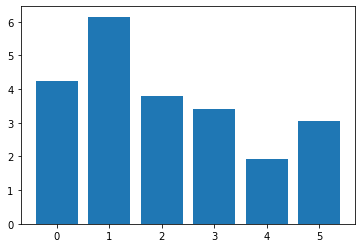

In [47]:
# example of anova f-test feature selection for numerical data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from matplotlib import pyplot

# # load the dataset
# def load_dataset(filename):
# 	# load the dataset as a pandas DataFrame
# 	data = read_csv(filename, header=None)
# 	# retrieve numpy array
# 	dataset = data.values
# 	# split into input (X) and output (y) variables
# 	X = dataset[:, :-1]
# 	y = dataset[:,-1]
# 	return X, y

# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=f_classif, k='all')
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# # load the dataset
# X, y = load_dataset('pima-indians-diabetes.csv')
a = 3
X = df_i
y = df_o.iloc[:,a] + df_o.iloc[:,2]
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=2, random_state=1)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

In [27]:
# new output column 
df_o['together'] = df_o['others'] + df_o['clay']



In [39]:

b =  2000
a = 1
test_sz = 6
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a],  random_state = int(b), test_size= (test_sz/10))
  

In [40]:
# score calculation 
# ...
# configure to select all features
fs = SelectKBest(score_func=f_classif, k='all')
# learn relationship from training data
fs.fit(X_train, Y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)

#  what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
 

Feature 0: 23.749679
Feature 1: 9.184218
Feature 2: 4.059412
Feature 3: 41.074585
Feature 4: 4.732118
Feature 5: 2.568228


In [106]:



# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
test_score = [] 

# b = 6000

a = 0
test_sz = 8 
count = 0 
for test_sz in [6]: #  [9,8,7,6,5,4,3,2]:
  test_score = [] 
    
  for b in [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # , 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # [7000]:  # , 1000, 2000]:  # 

    # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
    #               sep="\s+")


    # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
    #                 sep="\s+")
    # df_i = pd.DataFrame(Df_i)
    # df_o = pd.DataFrame(Df_o)

    # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

    # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
    df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
    # df_o = pd.read_csv('New_XRF.csv')
    df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
    df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
    df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
    df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
    df_o = df_o.drop(['deptho'], axis = 1)
    dep = df_i['depthi']
    df_i = df_i.drop(['depthi'], axis = 1)
    a = 0

    # max_rat_val = -9999999999999
    # max_rat = 0 
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
   

    
    # X1 = pd.DataFrame(X_train)
    # Y1 = pd.DataFrame(Y_train)
    # for rat in np.linspace(0,15,20):
    #   curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
    #   if curr > max_rat_val:
    #     max_rat = rat
    #     max_rat_val = curr
    #     print(max_rat)




    # count = 6
    # col_name = 'ABC' + str(count)
    # df_i.insert( count,col_name, a2)

    # b = 2000
    a = 0
    # test_sz = 5
    from scipy import stats 
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # max_rat_val = -9999999999999
    # max_rat = 0 
    # max_rat1 = 0 
    # max_rat0 = 0 
    # max_rat2 = 0 
    # X1 = pd.DataFrame(X_train)
    # Y1 = pd.DataFrame(Y_train)
    # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
    # # print(Y1.columns)
    # for rat1 in np.linspace(0,1,1): # 8 # 20 
    #   for rat in np.linspace(0,8,20):
    #     for rat0 in np.linspace(0,8,1):
    #       for rat2 in np.linspace(1,2,1): 
    #         rat0 = 0 
    #         curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%']-rat0*X1['Al2O3-%'] )  #- rat1*X1['Fe2O3-%'] - rat2*X1['MgO-%'])
    #         # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
    #         if curr > max_rat_val :
    #           max_rat = rat
    #           max_rat1 = rat1
    #           max_rat0 = rat0 
    #           max_rat2 = rat2
    #           max_rat_val = curr 
    # print(max_rat_val,max_rat, max_rat1, max_rat0, max_rat2) 

    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

    # plt.figure()
    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


    # X1 = pd.DataFrame(X_test)
    # Y1 = pd.DataFrame(Y_test)

    # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

    # plt.figure()
    # plt.scatter()

    # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
    # # df_i['SiO2-%'] 
    # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


    # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
    # # df_i['SiO2-%'] 
    # r2_score(df_i['MgO-%'] , df_o['carbonate'])

    # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
    # print(pearson_coef, p_value)

    # plt.figure()

    # df_i['new_sio2'] = df_i['SiO2-%'] -  max_rat*df_i['K2O-%'] # - max_rat0*df_i['Al2O3-%']  #  - max_rat1*df_i['Fe2O3-%']- max_rat2*df_i['MgO-%'] # df_i['SiO2-%'] - 

    # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']
    # plt.plot(df_i['new_sio2'])
    # plt.plot(df_o.iloc[:,a])
    # print('triplet  score is {}'.format(r2_score(df_o.iloc[:,a] , df_i['SiO2-%'] -  max_rat*df_i['K2O-%']))) # - max_rat0*df_i['Al2O3-%'] ))) #   - max_rat1*df_i['Fe2O3-%']- max_rat2*df_i['MgO-%'])))

    # df_i = df_i.drop(['SiO2-%'], axis = 1)
    df_i = df_i.drop(['CaO-%'], axis = 1)
    df_i = df_i.drop(['MgO-%'], axis = 1)
    df_i = df_i.drop(['Al2O3-%'], axis = 1)
    df_i = df_i.drop(['Fe2O3-%'], axis = 1)
    df_i = df_i.drop(['K2O-%'], axis = 1)
    # df_i['MgO-%'] = 15*df_i['MgO-%']


    
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # print('test  score is {}'.format(r2_score(X_test , Y_test)))
    # test_score.append(r2_score(X_test , Y_test))
    # print(sum(test_score)/len(test_score))






    # plt.figure()
    # plt.plot(df_i['SiO2-%'] -2*df_i['Al2O3-%'])
    # plt.plot(df_o.iloc[:,a])
    # print('al2o3 score is {}'.format(r2_score(df_o.iloc[:,a] , df_i['SiO2-%'] -2*df_i['Al2O3-%'])))





    # plt.scatter(df_i['new_sio2'],df_o.iloc[:,a], label = 'Engineered quartz {}'.format(r2_score(df_i['new_sio2'],df_o.iloc[:,a])) )

    # # plt.scatter(df_i['SiO2-%'],df_o.iloc[:,a], label = 'Raw SiO2' )

    # plt.scatter(df_i['SiO2-%'] -df_i['Al2O3-%'] ,df_o.iloc[:,a], label = 'New SiO2{}'.format(r2_score(df_i['SiO2-%'] -df_i['Al2O3-%'],df_o.iloc[:,a])) ) 

    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Quartz')
    # plt.savefig('quartz_scatter.ps')

    # plt.figure()
    # a = 1


    # plt.scatter(df_i['CaO-%'],df_o.iloc[:,a], label = 'Raw CaO' )

    # plt.scatter(df_i['MgO-%'],df_o.iloc[:,a], label = 'Raw MgO' )

    # plt.scatter(df_i['MgO-%'] + df_i['CaO-%'],df_o.iloc[:,a], label = 'Engineered Carbonate' )


    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Carbonate')
    # plt.savefig('carbonate_scatter.ps')



    # a = 2
    # # 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'
    # plt.figure()


    # plt.scatter(df_i['Al2O3-%'],df_o.iloc[:,a], label = 'Raw Al2O3' )

    # plt.scatter(df_i['Fe2O3-%'],df_o.iloc[:,a], label = 'Raw Fe2O3' )

    # plt.scatter(df_i['K2O-%'] ,df_o.iloc[:,a], label = 'Raw K2O' )

    # plt.scatter(df_i['K2O-%']+df_i['Fe2O3-%']+df_i['Al2O3-%'] +max_rat*df_i['K2O-%'] ,df_o.iloc[:,a], label = 'Engineered Clay' )
    # #df_i['K2O-%']+df_i['Fe2O3-%']+

    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Clay')
    # plt.savefig('clay_scatter.ps')



    






    # # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

    # df_i = df_i.drop(['SiO2-%'], axis = 1)
    # df_i = df_i.drop(['CaO-%'], axis = 1)
    # df_i = df_i.drop(['MgO-%'], axis = 1)
    # df_i = df_i.drop(['Al2O3-%'], axis = 1)
    # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
    # df_i = df_i.drop(['K2O-%'], axis = 1)
    # a = 1

    # print( 'test % is ', test_sz)
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
    # folds = KFold(n_splits = 4, shuffle = True, random_state = 100)
    # hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

    # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

    # # # fit the model
    # model_cv.fit(X_train, Y_train)  

    # Y_pred_N_1 = model_cv.predict(X_test)

    # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
    # a1 = model_cv.predict(df_i)
    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a1)
    # count +=1 

    # print(model_cv.best_params_)
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    folds = KFold(n_splits = 4, shuffle = True, random_state = 100)

    regr_nn =  ElasticNet()
    hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
    model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # fit the model
    model_cv.fit(X_train, Y_train)  

    Y_pred_N_1 = model_cv.predict(X_test)
    a2 = model_cv.predict(df_i)
    col_name = 'ABC' + str(count)
    otp_df.insert( count,col_name, a2)
    count +=1 

    quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

    col_name = 'ABC' + str(count)
    otp_df.insert( count,col_name, a2)  
    count += 1 
    print("test_sz{}".format(test_sz))
    # print('############################################################')

    # # # regr_nn = RandomForestRegressor()
    # # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
    # # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # # # fit the model
    # # # model_cv.fit(X_train, Y_train)  
    # # # Y_pred_N_1 = model_cv.predict(X_test)
    # # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

    # regr_nn = XGBRegressor(objective ='reg:squarederror')
    # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
    # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # fit the model
    # model_cv.fit(X_train, Y_train)  
    # Y_pred_N_1 = model_cv.predict(X_test)

    # # Y_pred_N_1 = model_cv.predict(X_test)
    # a3 = model_cv.predict(df_i)
    # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a3)  
    # count += 1 







  # for k20 and al2O3 

Fitting 4 folds for each of 280 candidates, totalling 1120 fits
Elastic net training average is 0.37520442982124413 testing is  0.6220471037272393
test_sz6
Fitting 4 folds for each of 280 candidates, totalling 1120 fits
Elastic net training average is 0.2452007385619973 testing is  0.5750971718313465
test_sz6
Fitting 4 folds for each of 280 candidates, totalling 1120 fits
Elastic net training average is 0.5725768952035059 testing is  0.6957351072895376
test_sz6
Fitting 4 folds for each of 280 candidates, totalling 1120 fits
Elastic net training average is 0.4710535489922971 testing is  0.6947336932033401
test_sz6
Fitting 4 folds for each of 280 candidates, totalling 1120 fits
Elastic net training average is -0.0034339280761115643 testing is  0.6654928867163163
test_sz6
Fitting 4 folds for each of 280 candidates, totalling 1120 fits
Elastic net training average is 0.704516490386536 testing is  0.5879116808284195
test_sz6
Fitting 4 folds for each of 280 candidates, totalling 1120 fits
El

In [ ]:
df_i

In [20]:
max_rat

12.0

In [19]:
df_i

,SiO2-%,CaO-%,MgO-%,Al2O3-%,Fe2O3-%,K2O-%,new_sio2
0,16.305379,31.767699,6.539273,2.860344,4.591424,0.742120,7.399939
1,66.985097,7.742991,1.432691,8.889289,2.531020,2.384073,38.376223
2,62.396375,6.120453,1.343693,11.574918,3.631042,3.386245,21.761438
3,69.647799,4.124399,1.441115,10.516772,4.073060,2.729859,36.889492
4,66.467673,1.275411,1.211075,12.175764,4.079206,3.922970,19.392028
5,66.994081,3.018817,1.199315,10.986322,3.977911,3.249736,27.997250
6,66.609577,12.839480,0.723134,5.728626,3.100486,1.438089,49.352509
7,69.852908,1.302223,1.094972,11.720534,3.811557,3.549475,27.259210
8,69.373511,10.436799,1.680929,5.487937,4.322396,1.294069,53.844678
9,64.023994,18.219389,1.545245,3.738166,3.106204,0.805358,54.359700


In [19]:
df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
# df_o = pd.read_csv('New_XRF.csv')
df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']

df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)



In [20]:

import io
import pandas as pd 
#from pandas.compat import StringIO\
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

# from sklearn.utils.testing import ignore_warnings
# from sklearn.exceptions import ConvergenceWarning

# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", category=ConvergenceWarning)


# load into df 



In [21]:

b =  2000
a = 3
test_sz = 6
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a] + df_o.iloc[:,a-1], random_state = int(b), test_size= (test_sz/10))
  

In [14]:
X_train

,SiO2-%,CaO-%,MgO-%,Al2O3-%,Fe2O3-%,K2O-%
4,66.467673,1.275411,1.211075,12.175764,4.079206,3.922970
7,69.852908,1.302223,1.094972,11.720534,3.811557,3.549475
33,67.218467,6.451056,0.987024,5.562168,1.428976,1.116560
32,41.157371,16.306621,1.389444,4.354838,1.338396,0.682317
48,28.698071,21.773112,1.230335,2.352204,0.841012,0.348662
25,57.382560,4.129889,1.636824,12.374741,3.244071,2.720928
23,63.903950,9.841365,0.812614,4.482277,0.934542,0.525588
30,64.097818,3.251701,1.017593,10.690084,2.516423,2.395687
12,69.636623,7.129609,0.826364,8.802719,3.268399,2.464628
1,66.985097,7.742991,1.432691,8.889289,2.531020,2.384073


In [22]:



from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from matplotlib import pyplot


In [23]:
...
# configure to select all features
fs = SelectKBest(score_func=f_classif, k='all')
# learn relationship from training data
fs.fit(X_train, Y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)

In [17]:
Y_train

4     46.0
7     58.0
33    22.2
32    16.5
48    12.0
25    53.0
23    15.7
30    50.0
12    46.0
1     46.0
2     56.0
27    27.2
15    35.0
50     6.0
52    17.0
49    35.0
28    13.2
36    50.0
13    26.0
14    28.0
8     29.0
54     5.0
dtype: float64

In [24]:
...
# configure to select all features
fs = SelectKBest(score_func=f_classif, k='all')
# learn relationship from training data
fs.fit(X_train, Y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)

#  what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))

Feature 0: 92.207559
Feature 1: 9.604239
Feature 2: 15.867148
Feature 3: 7.991817
Feature 4: 5.719220
Feature 5: 3.802781


In [18]:
#  what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))

Feature 0: 92.207559
Feature 1: 9.604239
Feature 2: 15.867148
Feature 3: 7.991817
Feature 4: 5.719220
Feature 5: 3.802781


In [ ]:






 
 
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.ylabel("Anova score: features vs quartz ")
pyplot.xlabel("various feature variables")


labels = ['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%', 'new Carbonate']
  
# plt.plot(x, y)
  
# You can specify a rotation for the tick
# labels in degrees or with keywords.
plt.xticks(range(len(fs.scores_)), labels, rotation ='vertical')
# pyplot.xticks('SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%')
pyplot.show()


# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize = (12,4))

N = 7#
ind = np.arange(N) 
width = 0.25
  
xvals = [7.5, 2, 1.8, 1.6, 1.6, 1.6, 8.6]#
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = [5.2, 2, 2.2, 4, 3.2, 3, 5.8]#
bar2 = plt.bar(ind+width, yvals, width, color='g')
  
zvals = [4, 3.5, 1.5, 5.5, 4.5, 6, 0]#
bar3 = plt.bar(ind+width*2, zvals, width, color = 'b')
  
plt.xlabel("Various Input Feature", fontsize=15)#
plt.ylabel(' Anova Scores', fontsize=15)#
# plt.title("Players Sc#ore")
  
plt.xticks(ind+width,['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%', 'Engineered \n Feature'], fontsize=15)    #
plt.legend( (bar1, bar2, bar3), ('Quartz' , ' Carbonate' , 'Clay') , bbox_to_anchor=(1.05, 1.0), loc='upper left', fontsize=10)      # 
# plt.show()       # 

# plt.show() 
plt.savefig("bar_plot.ps")




In [4]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving XRF_XRD_NN_Mayur_AD.csv to XRF_XRD_NN_Mayur_AD.csv


In [ ]:



# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
test_score = [] 

# b = 6000

a = 0
test_sz = 8 
count = 0 
for test_sz in [6]: #  [9,8,7,6,5,4,3,2]:
  test_score = [] 
    
  for b in [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # , 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # [7000]:  # , 1000, 2000]:  # 

    # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
    #               sep="\s+")


    # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
    #                 sep="\s+")
    # df_i = pd.DataFrame(Df_i)
    # df_o = pd.DataFrame(Df_o)

    # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

    # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
    df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
    # df_o = pd.read_csv('New_XRF.csv')
    df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
    df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
    df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
    df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
    df_o = df_o.drop(['deptho'], axis = 1)
    dep = df_i['depthi']
    df_i = df_i.drop(['depthi'], axis = 1)



    # count = 6
    # col_name = 'ABC' + str(count)
    # df_i.insert( count,col_name, a2)

    # b = 2000
    # a = 0
    # test_sz = 5
    from scipy import stats 
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # max_rat_val = -9999999999999
    # max_rat = 0 
    # max_rat1 = 0 
    # max_rat0 = 0 
    # max_rat2 = 0 
    # X1 = pd.DataFrame(X_train)
    # Y1 = pd.DataFrame(Y_train)
    # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
    # # print(Y1.columns)
    # for rat1 in np.linspace(0,1,1): # 8 # 20 
    #   for rat in np.linspace(0,8,20):
    #     for rat0 in np.linspace(0,8,1):
    #       for rat2 in np.linspace(1,2,1): 
    #         rat0 = 0 
    #         curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%']-rat0*X1['Al2O3-%'] )  #- rat1*X1['Fe2O3-%'] - rat2*X1['MgO-%'])
    #         # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
    #         if curr > max_rat_val :
    #           max_rat = rat
    #           max_rat1 = rat1
    #           max_rat0 = rat0 
    #           max_rat2 = rat2
    #           max_rat_val = curr 
    # print(max_rat_val,max_rat, max_rat1, max_rat0, max_rat2) 

    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

    # plt.figure()
    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


    # X1 = pd.DataFrame(X_test)
    # Y1 = pd.DataFrame(Y_test)

    # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

    # plt.figure()
    # plt.scatter()

    # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
    # # df_i['SiO2-%'] 
    # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


    # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
    # # df_i['SiO2-%'] 
    # r2_score(df_i['MgO-%'] , df_o['carbonate'])

    # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
    # print(pearson_coef, p_value)

    # plt.figure()

    # df_i['new_sio2'] = df_i['SiO2-%'] -  max_rat*df_i['K2O-%'] # - max_rat0*df_i['Al2O3-%']  #  - max_rat1*df_i['Fe2O3-%']- max_rat2*df_i['MgO-%'] # df_i['SiO2-%'] - 

    # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']
    # plt.plot(df_i['new_sio2'])
    # plt.plot(df_o.iloc[:,a])
    # print('triplet  score is {}'.format(r2_score(df_o.iloc[:,a] , df_i['SiO2-%'] -  max_rat*df_i['K2O-%']))) # - max_rat0*df_i['Al2O3-%'] ))) #   - max_rat1*df_i['Fe2O3-%']- max_rat2*df_i['MgO-%'])))

    # df_i = df_i.drop(['SiO2-%'], axis = 1)
    # # df_i = df_i.drop(['CaO-%'], axis = 1)
    # df_i = df_i.drop(['MgO-%'], axis = 1)
    # df_i = df_i.drop(['Al2O3-%'], axis = 1)
    # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
    # df_i = df_i.drop(['K2O-%'], axis = 1)


    
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # print('test  score is {}'.format(r2_score(X_test , Y_test)))
    # test_score.append(r2_score(X_test , Y_test))
    # print(sum(test_score)/len(test_score))






    # plt.figure()
    # plt.plot(df_i['SiO2-%'] -2*df_i['Al2O3-%'])
    # plt.plot(df_o.iloc[:,a])
    # print('al2o3 score is {}'.format(r2_score(df_o.iloc[:,a] , df_i['SiO2-%'] -2*df_i['Al2O3-%'])))





    # plt.scatter(df_i['new_sio2'],df_o.iloc[:,a], label = 'Engineered quartz {}'.format(r2_score(df_i['new_sio2'],df_o.iloc[:,a])) )

    # # plt.scatter(df_i['SiO2-%'],df_o.iloc[:,a], label = 'Raw SiO2' )

    # plt.scatter(df_i['SiO2-%'] -df_i['Al2O3-%'] ,df_o.iloc[:,a], label = 'New SiO2{}'.format(r2_score(df_i['SiO2-%'] -df_i['Al2O3-%'],df_o.iloc[:,a])) ) 

    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Quartz')
    # plt.savefig('quartz_scatter.ps')

    # plt.figure()
    # a = 1


    # plt.scatter(df_i['CaO-%'],df_o.iloc[:,a], label = 'Raw CaO' )

    # plt.scatter(df_i['MgO-%'],df_o.iloc[:,a], label = 'Raw MgO' )

    # plt.scatter(df_i['MgO-%'] + df_i['CaO-%'],df_o.iloc[:,a], label = 'Engineered Carbonate' )


    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Carbonate')
    # plt.savefig('carbonate_scatter.ps')



    # a = 2
    # # 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'
    # plt.figure()


    # plt.scatter(df_i['Al2O3-%'],df_o.iloc[:,a], label = 'Raw Al2O3' )

    # plt.scatter(df_i['Fe2O3-%'],df_o.iloc[:,a], label = 'Raw Fe2O3' )

    # plt.scatter(df_i['K2O-%'] ,df_o.iloc[:,a], label = 'Raw K2O' )

    # plt.scatter(df_i['K2O-%']+df_i['Fe2O3-%']+df_i['Al2O3-%'] +max_rat*df_i['K2O-%'] ,df_o.iloc[:,a], label = 'Engineered Clay' )
    # #df_i['K2O-%']+df_i['Fe2O3-%']+

    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Clay')
    # plt.savefig('clay_scatter.ps')



    






    # # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

    df_i = df_i.drop(['SiO2-%'], axis = 1)
    df_i = df_i.drop(['CaO-%'], axis = 1)
    df_i = df_i.drop(['MgO-%'], axis = 1)
    # df_i = df_i.drop(['Al2O3-%'], axis = 1)
    # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
    # df_i = df_i.drop(['K2O-%'], axis = 1)
    a = 2

    print( 'test % is ', test_sz)
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
    folds = KFold(n_splits = 4, shuffle = True, random_state = 100)
    hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

    model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

    # # fit the model
    model_cv.fit(X_train, Y_train)  

    Y_pred_N_1 = model_cv.predict(X_test)

    # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
    a1 = model_cv.predict(df_i)
    col_name = 'ABC' + str(count)
    otp_df.insert( count,col_name, a1)
    count +=1 

    # print(model_cv.best_params_)
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # folds = KFold(n_splits = 4, shuffle = True, random_state = 100)

    # regr_nn =  ElasticNet()
    # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
    # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # fit the model
    # model_cv.fit(X_train, Y_train)  

    # Y_pred_N_1 = model_cv.predict(X_test)
    # a2 = model_cv.predict(df_i)
    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a2)
    # count +=1 

    # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a2)  
    # count += 1 
    # print("test_sz{}".format(test_sz))
    print('############################################################')

    # # # regr_nn = RandomForestRegressor()
    # # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
    # # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # # # fit the model
    # # # model_cv.fit(X_train, Y_train)  
    # # # Y_pred_N_1 = model_cv.predict(X_test)
    # # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

    # regr_nn = XGBRegressor(objective ='reg:squarederror')
    # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
    # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # fit the model
    # model_cv.fit(X_train, Y_train)  
    # Y_pred_N_1 = model_cv.predict(X_test)

    # # Y_pred_N_1 = model_cv.predict(X_test)
    # a3 = model_cv.predict(df_i)
    # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a3)  
    # count += 1 







  # for k20 and al2O3 

test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.6785860419030083 testing is  0.5619729657325918
############################################################
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.8194985492716925 testing is  0.8053232432633606
############################################################
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.9417552549949905 testing is  0.6942147770258584
############################################################
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.5505061000976227 testing is  -0.4389100235365109
############################################################
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.7030756475742855 testing is  0.8250369000536079
#####

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


In [ ]:
df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
# df_o = pd.read_csv('New_XRF.csv')
df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']


In [ ]:
b =  2000
a = 1
test_sz = 2
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  



from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from matplotlib import pyplot

...
# configure to select all features
fs = SelectKBest(score_func=f_classif, k='all')
# learn relationship from training data
fs.fit(X_train, Y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)


#...
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
 
 
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.ylabel("Anova score: features vs quartz ")
pyplot.xlabel("various feature variables")


labels = ['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%', 'new Carbonate']
  
# plt.plot(x, y)
  
# You can specify a rotation for the tick
# labels in degrees or with keywords.
plt.xticks(range(len(fs.scores_)), labels, rotation ='vertical')
# pyplot.xticks('SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%')
pyplot.show()


# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize = (12,4))

N = 7#
ind = np.arange(N) 
width = 0.25
  
xvals = [7.5, 2, 1.8, 1.6, 1.6, 1.6, 8.6]#
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = [5.2, 2, 2.2, 4, 3.2, 3, 5.8]#
bar2 = plt.bar(ind+width, yvals, width, color='g')
  
zvals = [4, 3.5, 1.5, 5.5, 4.5, 6, 0]#
bar3 = plt.bar(ind+width*2, zvals, width, color = 'b')
  
plt.xlabel("Various Input Feature", fontsize=15)#
plt.ylabel(' Anova Scores', fontsize=15)#
# plt.title("Players Sc#ore")
  
plt.xticks(ind+width,['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%', 'Engineered \n Feature'], fontsize=15)    #
plt.legend( (bar1, bar2, bar3), ('Quartz' , ' Carbonate' , 'Clay') , bbox_to_anchor=(1.05, 1.0), loc='upper left', fontsize=10)      # 
# plt.show()       # 

# plt.show() 
plt.savefig("bar_plot.ps")




In [3]:

import io
import pandas as pd 
#from pandas.compat import StringIO\
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

# from sklearn.utils.testing import ignore_warnings
# from sklearn.exceptions import ConvergenceWarning

# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", category=ConvergenceWarning)


# load into df 



In [4]:
df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
# df_o = pd.read_csv('New_XRF.csv')
df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']


No handles with labels found to put in legend.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:73: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the pa

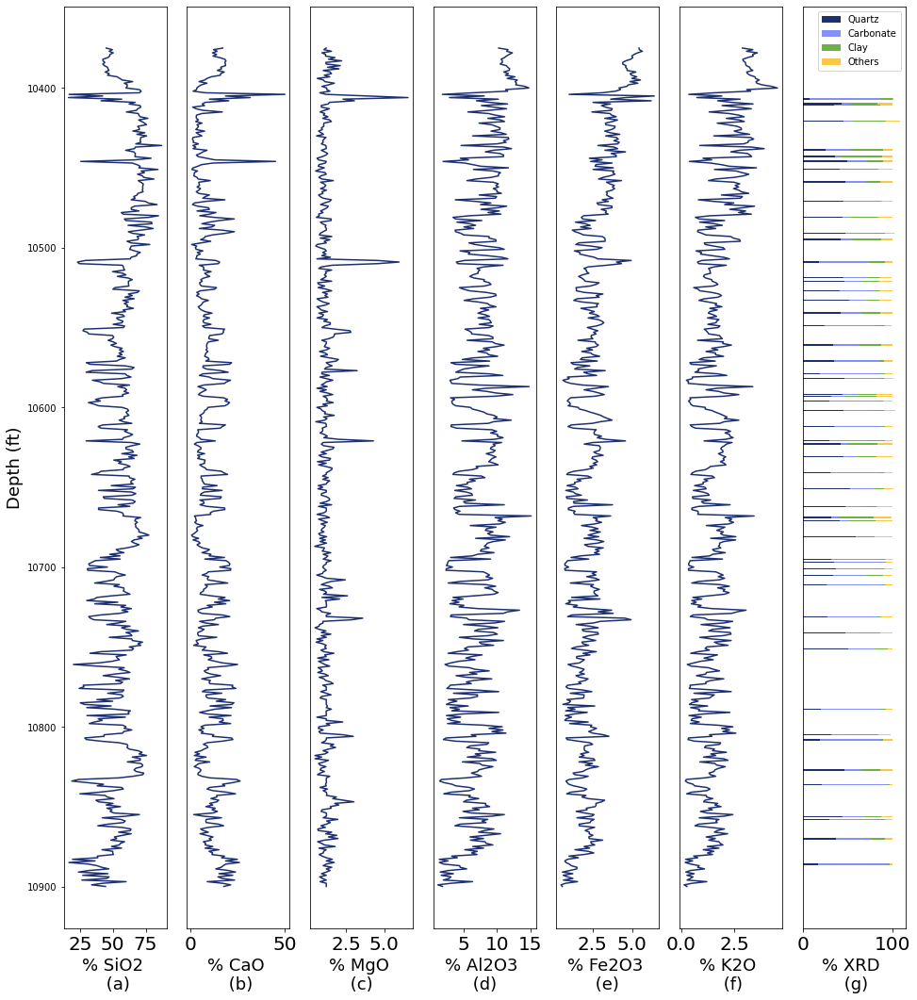

In [5]:
df1 = pd.read_excel('XRF_Data.xlsx')
df1 = df1.fillna(df1.mean())



import matplotlib

matplotlib.rc('xtick', labelsize=20) 
# matplotlib.rc('ytick', labelsize=20) 


fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(1, 7, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

plt.legend(loc=2, prop={'size': 12})
fig.figsize= (4,18)
ax1.plot( df1.iloc[:,1], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: SiO2-%')
ax1.invert_yaxis()
# ax1.gca('ydir',reverse)
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )
ax1.xaxis.label.set_size(18)
ax1.yaxis.label.set_size(18)

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')


ax2.plot( df1.iloc[:,2], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: CaO-%')
ax2.invert_yaxis()
# ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.set(xlabel='% CaO \n (b)' ) # , ylabel='Depth (ft)')
ax2.xaxis.label.set_size(18)
# ax1.yaxis.label.set_size(14)

ax2.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Calcium Oxide ')
# plt.ylabel('Depth (ft)')

ax3.plot( df1.iloc[:,3], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF : MgO-%')
ax3.invert_yaxis()
# ax3.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax3.legend()
ax3.set(xlabel='% MgO \n (c) ' ) # , ylabel='Depth (ft)')
ax3.xaxis.label.set_size(18)
ax3.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Magnesium Oxide ')
# plt.ylabel('Depth (ft)')

ax4.plot( df1.iloc[:,4], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: Al2O3-%')
ax4.invert_yaxis()
# ax4.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax4.legend()
ax4.xaxis.label.set_size(18)
ax4.set(xlabel='% Al2O3 \n (d) ' ) # , ylabel='Depth (ft)')
ax4.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Alluminium Oxide ')
# plt.ylabel('Depth (ft)')

ax5.plot( df1.iloc[:,5], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: Fe2O3-%')
ax5.invert_yaxis()
# ax5.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax5.legend()
ax5.xaxis.label.set_size(18)
ax5.set(xlabel='% Fe2O3 \n (e) ' ) # , ylabel='Depth (ft)')
ax5.set_yticks([], [])  # same for y ticks
# ax5.xlabel('% of Iron Oxide ')
# plt.ylabel('Depth (ft)')

ax6.plot( df1.iloc[:,6], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: K2O-%')
ax6.invert_yaxis()
# ax6.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax6.legend()
ax6.xaxis.label.set_size(18)
ax6.set(xlabel='% K2O \n (f)' ) # , ylabel='Depth (ft)')
ax6.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Pottasium Oxide ')
# plt.ylabel('Depth (ft)')



# ax6.legend(prop={"size":17}, bbox_to_anchor=(-3.8,1.07))
# ax6.xaxis.label.set_size(17)
# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

# plt.figure(figsize= (18, 3))
# ax7.plot(  2*np.ceil(df1.iloc[:,1]/100),df1.iloc[:,0],'ro', color = '#A9A9A9', label = 'XRF depth locations')
# ax7 = df_o[1:4,:].plot.barh(stacked=True)
# ax7.plot(   np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0],'o',color = '#A9A9A9', label = 'XRD samples') #     df1.iloc[:,1] 
# ax7.invert_yaxis()
# ax7.legend()
# ax7.xaxis.label.set_size(18)
# ax7.set(xlabel='XRD \n sample locations \n (g)' ) # , ylabel='Depth (ft)')

# # ax7.xlabel('Grid of Depth points')
# # ax7.ylabel('XRF and XRD depth points')
# # plt.yticks(('xrd' , 'xrf'))
# ax7.set_yticks([], [])  # same for y ticks
# ax7.set_xticks([], [])  # same for y ticks

# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')

# plt.savefig("xrf.ps")


df_grouped = df_o.set_index('deptho') 
fields = ['Quartz-Sio2','carbonate','clay','others']   # 'deptho',
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
labels = ['Quartz', 'Carbonate', 'Clay', 'Others']
# figure and axis
# fig, ax = plt.subplots(1, figsize=(4, 18))
# plot bars
left = len(df_grouped) * [0]
for idx, name in enumerate(fields):
    ax7.barh(df_grouped.index, df_grouped[name], left = left, color=colors[idx] )
    left = left + df_grouped[name]
ax7.set_ylim([10348, 10925])
ax7.invert_yaxis()
ax7.set_yticks([], [])
# title, legend, labels
# plt.title('Video Game Sales By Platform and Region\n', loc='left')
# plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=4, frameon=False)
ax7.legend(labels)
# plt.legend(loc=2, prop={'size': 12})
# ax7.xlabel('% Target Variable \n (XRD)')
ax7.set(xlabel='% XRD \n (g)' )
# remove spines

# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# adjust limits and draw grid lines
# plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
# ax7.set_axisbelow(True)
ax7.xaxis.label.set_size(18)

# ax.xaxis.grid(color='gray', linestyle='dashed')
# plt.show()
plt.savefig("xrf_xrd.ps")




The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


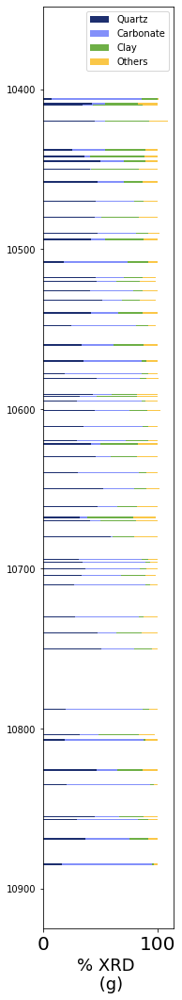

In [15]:
df1 = pd.read_excel('XRF_Data.xlsx')
df1 = df1.fillna(df1.mean())



import matplotlib

matplotlib.rc('xtick', labelsize=20) 
# matplotlib.rc('ytick', labelsize=20) 


fig, (ax7) = plt.subplots(1, 1, figsize=(2.5,18)) #  , ax2, ax3, ax4, ax5, ax6, ax7)

# # fig.suptitle('Horizontally stacked subplots')
# # ax1.plot(x, y)
# # ax2.plot(x, -y)

# # 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

# plt.legend(loc=2, prop={'size': 12})
# fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: SiO2-%')
# ax1.invert_yaxis()
# # ax1.gca('ydir',reverse)
# # ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# # ax1.legend()
# ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )
# ax1.xaxis.label.set_size(18)
# ax1.yaxis.label.set_size(18)

# # ax1.xlabel('% of Silicon Oxide ')
# # ax1.ylabel('Depth (ft)')


# ax2.plot( df1.iloc[:,2], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: CaO-%')
# ax2.invert_yaxis()
# # ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# # ax2.legend()
# ax2.set(xlabel='% CaO \n (b)' ) # , ylabel='Depth (ft)')
# ax2.xaxis.label.set_size(18)
# # ax1.yaxis.label.set_size(14)

# ax2.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Calcium Oxide ')
# # plt.ylabel('Depth (ft)')

# ax3.plot( df1.iloc[:,3], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF : MgO-%')
# ax3.invert_yaxis()
# # ax3.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# # ax3.legend()
# ax3.set(xlabel='% MgO \n (c) ' ) # , ylabel='Depth (ft)')
# ax3.xaxis.label.set_size(18)
# ax3.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Magnesium Oxide ')
# # plt.ylabel('Depth (ft)')

# ax4.plot( df1.iloc[:,4], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: Al2O3-%')
# ax4.invert_yaxis()
# # ax4.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# # ax4.legend()
# ax4.xaxis.label.set_size(18)
# ax4.set(xlabel='% Al2O3 \n (d) ' ) # , ylabel='Depth (ft)')
# ax4.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Alluminium Oxide ')
# # plt.ylabel('Depth (ft)')

# ax5.plot( df1.iloc[:,5], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: Fe2O3-%')
# ax5.invert_yaxis()
# # ax5.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# # ax5.legend()
# ax5.xaxis.label.set_size(18)
# ax5.set(xlabel='% Fe2O3 \n (e) ' ) # , ylabel='Depth (ft)')
# ax5.set_yticks([], [])  # same for y ticks
# # ax5.xlabel('% of Iron Oxide ')
# # plt.ylabel('Depth (ft)')

# ax6.plot( df1.iloc[:,6], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: K2O-%')
# ax6.invert_yaxis()
# # ax6.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# # ax6.legend()
# ax6.xaxis.label.set_size(18)
# ax6.set(xlabel='% K2O \n (f)' ) # , ylabel='Depth (ft)')
# ax6.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Pottasium Oxide ')
# # plt.ylabel('Depth (ft)')



# # ax6.legend(prop={"size":17}, bbox_to_anchor=(-3.8,1.07))
# # ax6.xaxis.label.set_size(17)
# # fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

# # plt.figure(figsize= (18, 3))
# ax7.plot(  2*np.ceil(df1.iloc[:,1]/100),df1.iloc[:,0],'ro', color = '#A9A9A9', label = 'XRF depth locations')
# ax7 = df_o[1:4,:].plot.barh(stacked=True)
# ax7.plot(   np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0],'o',color = '#A9A9A9', label = 'XRD samples') #     df1.iloc[:,1] 
# ax7.invert_yaxis()
# ax7.legend()
# ax7.xaxis.label.set_size(18)
# ax7.set(xlabel='XRD \n sample locations \n (g)' ) # , ylabel='Depth (ft)')

# # ax7.xlabel('Grid of Depth points')
# # ax7.ylabel('XRF and XRD depth points')
# # plt.yticks(('xrd' , 'xrf'))
# ax7.set_yticks([], [])  # same for y ticks
# ax7.set_xticks([], [])  # same for y ticks

# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')

# plt.savefig("xrf.ps")


df_grouped = df_o.set_index('deptho') 
fields = ['Quartz-Sio2','carbonate','clay','others']   # 'deptho',
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
labels = ['Quartz', 'Carbonate', 'Clay', 'Others']
# figure and axis
# fig, ax = plt.subplots(1, figsize=(4, 18))
# plot bars
left = len(df_grouped) * [0]
for idx, name in enumerate(fields):
    ax7.barh(df_grouped.index, df_grouped[name], left = left, color=colors[idx] )
    left = left + df_grouped[name]
ax7.set_ylim([10348, 10925])
ax7.invert_yaxis()
# ax7.set_yticks([], [])
# title, legend, labels
# plt.title('Video Game Sales By Platform and Region\n', loc='left')
# plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=4, frameon=False)
ax7.legend(labels)
# plt.legend(loc=2, prop={'size': 12})
# ax7.xlabel('% Target Variable \n (XRD)')
ax7.set(xlabel='% XRD \n (g)' )
# remove spines

# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# adjust limits and draw grid lines
# plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
# ax7.set_axisbelow(True)
ax7.xaxis.label.set_size(18)
ax7.yaxis.label.set_size(18)
# ax.xaxis.grid(color='gray', linestyle='dashed')
# plt.show()
plt.savefig("xrf_xrd.ps")




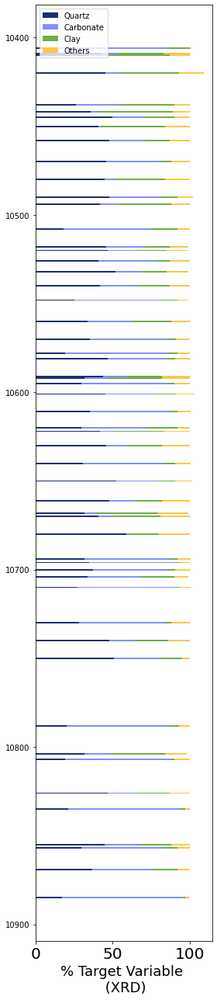

In [9]:
df_grouped = df_o.set_index('deptho') 
fields = ['Quartz-Sio2','carbonate','clay','others']   # 'deptho',
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
labels = ['Quartz', 'Carbonate', 'Clay', 'Others']
# figure and axis
fig, ax = plt.subplots(1, figsize=(4, 18))
# plot bars
left = len(df_grouped) * [0]
for idx, name in enumerate(fields):
    plt.barh(df_grouped.index, df_grouped[name], left = left, color=colors[idx])
    left = left + df_grouped[name]
# title, legend, labels
# plt.title('Video Game Sales By Platform and Region\n', loc='left')
# plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=4, frameon=False)
plt.legend(labels)
# plt.legend(loc=2, prop={'size': 12})
plt.xlabel('% Target Variable \n (XRD)')
# remove spines
ax.invert_yaxis()
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# adjust limits and draw grid lines
# plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
ax.set_axisbelow(True)
ax.xaxis.label.set_size(18)

plt.legend(labels,loc =2) #  bbox_to_anchor=(0, 1, 1, 0.5)) # , mode='expand')
plt.tight_layout()



# ax.xaxis.grid(color='gray', linestyle='dashed')
plt.show()

Saving XRF_XRD_NN_Mayur_AD.csv to XRF_XRD_NN_Mayur_AD.csv


In [ ]:
df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
# df_o = pd.read_csv('New_XRF.csv')
df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']


In [ ]:
df.columns

Index(['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O',
       'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)', 'Total',
       'Unnamed: 12', 'Unnamed: 13'],
      dtype='object')

In [ ]:
df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]

In [ ]:
df_i

In [ ]:
df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]

In [ ]:
df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

In [ ]:
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']

Text(0.5, 0, 'mgo')

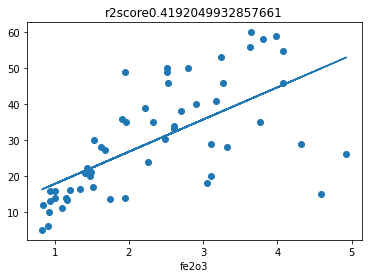

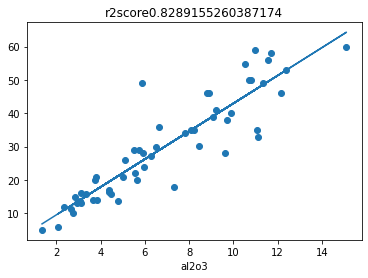

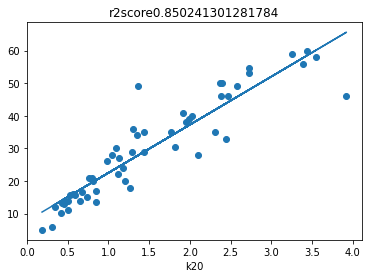

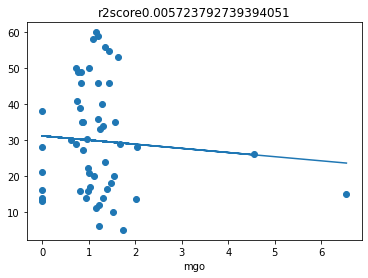

In [ ]:
# plt.scatter(df_i['K2O-%'], df_o['clay']+ df_o['others'], label = "pottasium")

# plt.scatter(df_i['Al2O3-%'], df_o['clay']+ df_o['others'], label = "alluminium")


plt.scatter(df_i['Fe2O3-%'],df_o['clay']+ df_o['others'], label = 'iron')


# plt.legend()
# plt.xlabel('clay + other ')
# plt.ylabel('compounds')
# plt.scatter(df_i['K2O-%'], df_o['clay'])

# plt.scatter(df_i['K2O-%'], df_o['others'])
import matplotlib.pyplot as plt    
from sklearn.linear_model import LinearRegression

X, Y = np.array(df_i['Fe2O3-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("fe2o3")




plt.figure()
plt.scatter(df_i['Al2O3-%'], df_o['clay']+ df_o['others'], label = "alluminium")
X, Y = np.array(df_i['Al2O3-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("al2o3")




plt.figure()
plt.scatter(df_i['K2O-%'], df_o['clay']+ df_o['others'], label = "pottasium")
X, Y = np.array(df_i['K2O-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("k20")


plt.figure()
plt.scatter(df_i['MgO-%'], df_o['clay']+ df_o['others'], label = "pottasium")
X, Y = np.array(df_i['MgO-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("mgo")



In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)

Text(0.5, 0, 'mgo')

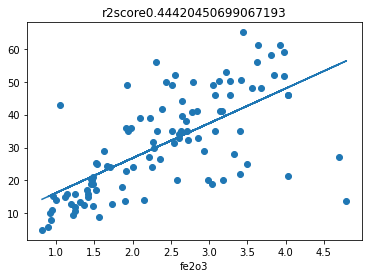

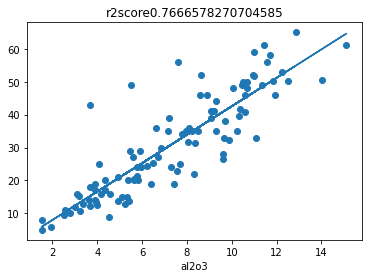

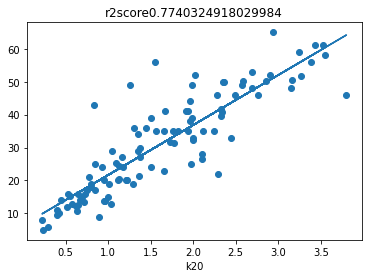

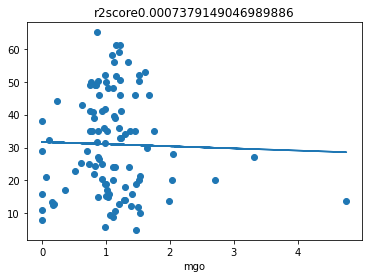

In [ ]:
# plt.scatter(df_i['K2O-%'], df_o['clay']+ df_o['others'], label = "pottasium")

# plt.scatter(df_i['Al2O3-%'], df_o['clay']+ df_o['others'], label = "alluminium")


plt.scatter(df_i['Fe2O3-%'],df_o['clay']+ df_o['others'], label = 'iron')


# plt.legend()
# plt.xlabel('clay + other ')
# plt.ylabel('compounds')
# plt.scatter(df_i['K2O-%'], df_o['clay'])

# plt.scatter(df_i['K2O-%'], df_o['others'])
import matplotlib.pyplot as plt    
from sklearn.linear_model import LinearRegression

X, Y = np.array(df_i['Fe2O3-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("fe2o3")




plt.figure()
plt.scatter(df_i['Al2O3-%'], df_o['clay']+ df_o['others'], label = "alluminium")
X, Y = np.array(df_i['Al2O3-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("al2o3")




plt.figure()
plt.scatter(df_i['K2O-%'], df_o['clay']+ df_o['others'], label = "pottasium")
X, Y = np.array(df_i['K2O-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("k20")


plt.figure()
plt.scatter(df_i['MgO-%'], df_o['clay']+ df_o['others'], label = "pottasium")
X, Y = np.array(df_i['MgO-%']).reshape(-1,1),np.array(df_o['clay']+ df_o['others']).reshape(-1,1)
plt.plot( X, LinearRegression().fit(X, Y).predict(X) )
plt.title("r2score{}".format(LinearRegression().fit(X, Y).score(X,Y)))
plt.xlabel("mgo")



In [ ]:
print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

plt.figure()
plt.scatter()

r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
# df_i['SiO2-%'] 
r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
# df_i['SiO2-%'] 
r2_score(df_i['MgO-%'] , df_o['carbonate'])

In [ ]:



# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
test_score = [] 

# b = 6000

a = 0
test_sz = 8 
count = 0 
for test_sz in [6]: #  [9,8,7,6,5,4,3,2]:
  test_score = [] 
    
  for b in [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # , 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # [7000]:  # , 1000, 2000]:  # 

    # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
    #               sep="\s+")


    # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
    #                 sep="\s+")
    # df_i = pd.DataFrame(Df_i)
    # df_o = pd.DataFrame(Df_o)

    # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

    # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
    df= pd.read_csv('XRF_XRD_NN_Mayur_AD.csv')
    # df_o = pd.read_csv('New_XRF.csv')
    df_i = df[['Median Depth', 'SiO2', 'CaO', 'MgO', 'Al2O3', 'Fe2O3', 'K2O']]
    df_o = df[['Median Depth', 'Quartz (%)', 'Carbonate (%)', 'Clay (%)', 'Other (%)']]
    df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
    df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
    df_o = df_o.drop(['deptho'], axis = 1)
    dep = df_i['depthi']
    df_i = df_i.drop(['depthi'], axis = 1)



    # count = 6
    # col_name = 'ABC' + str(count)
    # df_i.insert( count,col_name, a2)

    # b = 2000
    # a = 0
    # test_sz = 5
    from scipy import stats 
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # max_rat_val = -9999999999999
    # max_rat = 0 
    # max_rat1 = 0 
    # max_rat0 = 0 
    # max_rat2 = 0 
    # X1 = pd.DataFrame(X_train)
    # Y1 = pd.DataFrame(Y_train)
    # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
    # # print(Y1.columns)
    # for rat1 in np.linspace(0,1,1): # 8 # 20 
    #   for rat in np.linspace(0,8,20):
    #     for rat0 in np.linspace(0,8,1):
    #       for rat2 in np.linspace(1,2,1): 
    #         rat0 = 0 
    #         curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%']-rat0*X1['Al2O3-%'] )  #- rat1*X1['Fe2O3-%'] - rat2*X1['MgO-%'])
    #         # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
    #         if curr > max_rat_val :
    #           max_rat = rat
    #           max_rat1 = rat1
    #           max_rat0 = rat0 
    #           max_rat2 = rat2
    #           max_rat_val = curr 
    # print(max_rat_val,max_rat, max_rat1, max_rat0, max_rat2) 

    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

    # plt.figure()
    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


    # X1 = pd.DataFrame(X_test)
    # Y1 = pd.DataFrame(Y_test)

    # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
    # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

    # plt.figure()
    # plt.scatter()

    # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
    # # df_i['SiO2-%'] 
    # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


    # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
    # # df_i['SiO2-%'] 
    # r2_score(df_i['MgO-%'] , df_o['carbonate'])

    # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
    # print(pearson_coef, p_value)

    # plt.figure()

    # df_i['new_sio2'] = df_i['SiO2-%'] -  max_rat*df_i['K2O-%'] # - max_rat0*df_i['Al2O3-%']  #  - max_rat1*df_i['Fe2O3-%']- max_rat2*df_i['MgO-%'] # df_i['SiO2-%'] - 

    # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']
    # plt.plot(df_i['new_sio2'])
    # plt.plot(df_o.iloc[:,a])
    # print('triplet  score is {}'.format(r2_score(df_o.iloc[:,a] , df_i['SiO2-%'] -  max_rat*df_i['K2O-%']))) # - max_rat0*df_i['Al2O3-%'] ))) #   - max_rat1*df_i['Fe2O3-%']- max_rat2*df_i['MgO-%'])))

    # df_i = df_i.drop(['SiO2-%'], axis = 1)
    # # df_i = df_i.drop(['CaO-%'], axis = 1)
    # df_i = df_i.drop(['MgO-%'], axis = 1)
    # df_i = df_i.drop(['Al2O3-%'], axis = 1)
    # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
    # df_i = df_i.drop(['K2O-%'], axis = 1)


    
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # print('test  score is {}'.format(r2_score(X_test , Y_test)))
    # test_score.append(r2_score(X_test , Y_test))
    # print(sum(test_score)/len(test_score))






    # plt.figure()
    # plt.plot(df_i['SiO2-%'] -2*df_i['Al2O3-%'])
    # plt.plot(df_o.iloc[:,a])
    # print('al2o3 score is {}'.format(r2_score(df_o.iloc[:,a] , df_i['SiO2-%'] -2*df_i['Al2O3-%'])))





    # plt.scatter(df_i['new_sio2'],df_o.iloc[:,a], label = 'Engineered quartz {}'.format(r2_score(df_i['new_sio2'],df_o.iloc[:,a])) )

    # # plt.scatter(df_i['SiO2-%'],df_o.iloc[:,a], label = 'Raw SiO2' )

    # plt.scatter(df_i['SiO2-%'] -df_i['Al2O3-%'] ,df_o.iloc[:,a], label = 'New SiO2{}'.format(r2_score(df_i['SiO2-%'] -df_i['Al2O3-%'],df_o.iloc[:,a])) ) 

    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Quartz')
    # plt.savefig('quartz_scatter.ps')

    # plt.figure()
    # a = 1


    # plt.scatter(df_i['CaO-%'],df_o.iloc[:,a], label = 'Raw CaO' )

    # plt.scatter(df_i['MgO-%'],df_o.iloc[:,a], label = 'Raw MgO' )

    # plt.scatter(df_i['MgO-%'] + df_i['CaO-%'],df_o.iloc[:,a], label = 'Engineered Carbonate' )


    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Carbonate')
    # plt.savefig('carbonate_scatter.ps')



    # a = 2
    # # 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'
    # plt.figure()


    # plt.scatter(df_i['Al2O3-%'],df_o.iloc[:,a], label = 'Raw Al2O3' )

    # plt.scatter(df_i['Fe2O3-%'],df_o.iloc[:,a], label = 'Raw Fe2O3' )

    # plt.scatter(df_i['K2O-%'] ,df_o.iloc[:,a], label = 'Raw K2O' )

    # plt.scatter(df_i['K2O-%']+df_i['Fe2O3-%']+df_i['Al2O3-%'] +max_rat*df_i['K2O-%'] ,df_o.iloc[:,a], label = 'Engineered Clay' )
    # #df_i['K2O-%']+df_i['Fe2O3-%']+

    # plt.legend()
    # plt.xlabel('Input Feature')
    # plt.ylabel('Output Variable - Clay')
    # plt.savefig('clay_scatter.ps')



    






    # # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

    # df_i = df_i.drop(['SiO2-%'], axis = 1)
    # df_i = df_i.drop(['CaO-%'], axis = 1)
    # df_i = df_i.drop(['MgO-%'], axis = 1)
    # df_i = df_i.drop(['Al2O3-%'], axis = 1)
    # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
    # df_i = df_i.drop(['K2O-%'], axis = 1)
    a = 1

    print( 'test % is ', test_sz)
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
    folds = KFold(n_splits = 4, shuffle = True, random_state = 100)
    hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

    model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

    # # fit the model
    model_cv.fit(X_train, Y_train)  

    Y_pred_N_1 = model_cv.predict(X_test)

    # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
    a1 = model_cv.predict(df_i)
    col_name = 'ABC' + str(count)
    otp_df.insert( count,col_name, a1)
    count +=1 

    # # print(model_cv.best_params_)
    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # folds = KFold(n_splits = 4, shuffle = True, random_state = 100)

    # regr_nn =  ElasticNet()
    # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
    # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # fit the model
    # model_cv.fit(X_train, Y_train)  

    # Y_pred_N_1 = model_cv.predict(X_test)
    # a2 = model_cv.predict(df_i)
    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a2)
    # count +=1 

    # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a2)  
    # count += 1 
    # print("test_sz{}".format(test_sz))
    # print('############################################################')

    # # # regr_nn = RandomForestRegressor()
    # # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
    # # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # # # fit the model
    # # # model_cv.fit(X_train, Y_train)  
    # # # Y_pred_N_1 = model_cv.predict(X_test)
    # # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

    # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
    # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

    # regr_nn = XGBRegressor(objective ='reg:squarederror')
    # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
    # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
    # # fit the model
    # model_cv.fit(X_train, Y_train)  
    # Y_pred_N_1 = model_cv.predict(X_test)

    # # Y_pred_N_1 = model_cv.predict(X_test)
    # a3 = model_cv.predict(df_i)
    # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
    # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
    # col_name = 'ABC' + str(count)
    # otp_df.insert( count,col_name, a3)  
    # count += 1 







  # for k20 and al2O3 

test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.09724521387009277 testing is  -0.016527292717880115
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.8728825470563568 testing is  0.7657921933367884
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.9352263034801722 testing is  0.5470273493852926
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.7318356988068895 testing is  0.8526571119271507
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.9349945488074005 testing is  0.7514601081457073
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average is 0.8004359667009914 testing is  0.872900301105279
test % is  6
Fitting 4 folds for each of 252 candidates, totalling 1008 fits
NN training average 

In [ ]:
s = [2,3,4]
print(sum(s)/len(s))

3.0


In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving tinput.dat to tinput (1).dat
Saving toutput.dat to toutput (1).dat


In [ ]:

import io
import pandas as pd 
#from pandas.compat import StringIO\
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

# from sklearn.utils.testing import ignore_warnings
# from sklearn.exceptions import ConvergenceWarning

# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", category=ConvergenceWarning)


# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)

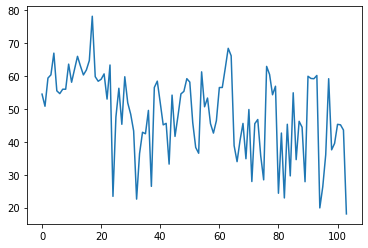

In [ ]:
plt.plot(df_i['SiO2-%'] - df_i['Al2O3-%'])

In [ ]:

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']
# df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
# df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)

In [ ]:



# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 2
test_sz = 8 
count = 0 
for b in [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # [7000]:  # , 1000, 2000]:  # 

  Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


  Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                  sep="\s+")
  df_i = pd.DataFrame(Df_i)
  df_o = pd.DataFrame(Df_o)

  df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  df_o = df_o.drop(['deptho'], axis = 1)
  dep = df_i['depthi']
  df_i = df_i.drop(['depthi'], axis = 1)

  # count = 6
  # col_name = 'ABC' + str(count)
  # df_i.insert( count,col_name, a2)

  # b = 2000
  a = 0
  test_sz = 8 
  from scipy import stats 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  max_rat_val = -9999999999999
  max_rat = 0 
  max_rat1 = 0 
  X1 = pd.DataFrame(X_train)
  Y1 = pd.DataFrame(Y_train)
  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # print(Y1.columns)
  for rat1 in np.linspace(1,8,20):
    for rat in np.linspace(1,8,20):
      # curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
      curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,4])
      if curr > max_rat_val :
        max_rat = rat
        max_rat1 = rat1
        max_rat_val = curr 
      print(Y1.iloc[:,0])
      print()
  print(max_rat_val,max_rat, max_rat1) 

  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # plt.figure()
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  # X1 = pd.DataFrame(X_test)
  # Y1 = pd.DataFrame(Y_test)

  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # plt.figure()
  # plt.scatter()

  # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # print(pearson_coef, p_value)

  # df_i['new_sio2'] =df_i['SiO2-%'] -  max_rat*df_i['K2O-%'] # df_i['SiO2-%'] - 
  # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']
  df_i['new_quart'] =  df_i['SiO2-%'] - max_rat*df_i['K2O-%'] - max_rat1*df_i['Fe2O3-%'] # + df_i['K2O-%'] + df_i['Al2O3-%'] +
  # df_i['new-clay'] = max_rat*df_i['K2O-%']
  df_i = df_i.drop(['SiO2-%'], axis = 1)
  df_i = df_i.drop(['CaO-%'], axis = 1)
  df_i = df_i.drop(['MgO-%'], axis = 1)
  df_i = df_i.drop(['Al2O3-%'], axis = 1)
  df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  df_i = df_i.drop(['K2O-%'], axis = 1)








  # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  a = 0

  # print( 'test % is ', test_sz)
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)

  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # a1 = model_cv.predict(df_i)
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a1)
  # count +=1 

  # # # print(model_cv.best_params_)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  regr_nn =  ElasticNet()
  hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)
  a2 = model_cv.predict(df_i)
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, a2)
  count +=1 

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, a2)  
  count += 1 

  # # # regr_nn = RandomForestRegressor()
  # # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # # fit the model
  # # # model_cv.fit(X_train, Y_train)  
  # # # Y_pred_N_1 = model_cv.predict(X_test)
  # # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









0.8537793308535129 1.0 6.157894736842105
Fitting 2 folds for each of 280 candidates, totalling 560 fits
Elastic net training average is 0.6853532636740559 testing is  0.37653266437436905
0.8304380523833801 2.473684210526316 5.421052631578947
Fitting 2 folds for each of 280 candidates, totalling 560 fits
Elastic net training average is 0.8119105266625988 testing is  0.606873671873959
0.7024062309537129 4.315789473684211 5.421052631578947
Fitting 2 folds for each of 280 candidates, totalling 560 fits
Elastic net training average is 0.7200276953024802 testing is  0.6408276057978384
0.7622584971691909 1.368421052631579 6.526315789473684
Fitting 2 folds for each of 280 candidates, totalling 560 fits
Elastic net training average is 0.7084147298910668 testing is  0.6243959107547011
0.8530701319635109 1.736842105263158 6.526315789473684
Fitting 2 folds for each of 280 candidates, totalling 560 fits
Elastic net training average is 0.7960633001460817 testing is  0.527590233270357
0.8329483533849

In [ ]:
# df_i

In [ ]:
# np.save('train_1_10_quartz_NN', otp_df)
otp_df.to_csv("new_train_1_10_clay_XGB.csv")

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving tinput.dat to tinput (1).dat
Saving toutput.dat to toutput (1).dat


In [ ]:

import io
import pandas as pd 
#from pandas.compat import StringIO\
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

# from sklearn.utils.testing import ignore_warnings
# from sklearn.exceptions import ConvergenceWarning

# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", category=ConvergenceWarning)


# # load into df 

# Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
#                 sep="\s+")


# Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
#                 sep="\s+")
# df_i = pd.DataFrame(Df_i)
# df_o = pd.DataFrame(Df_o)

# df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

# df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
# # df_o = df_o.drop(['deptho'], axis = 1)
# dep = df_i['depthi']
# # df_i = df_i.drop(['depthi'], axis = 1)

In [ ]:
# add the prediction to the original data set 
# but load the data set first. 
# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

In [ ]:



# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 0
test_sz = 8 
count = 0 
for b in [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]: # [7000]:  # , 1000, 2000]:  # 

  Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


  Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                  sep="\s+")
  df_i = pd.DataFrame(Df_i)
  df_o = pd.DataFrame(Df_o)

  df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  df_o = df_o.drop(['deptho'], axis = 1)
  dep = df_i['depthi']
  df_i = df_i.drop(['depthi'], axis = 1)

  # count = 6
  # col_name = 'ABC' + str(count)
  # df_i.insert( count,col_name, a2)

  # b = 2000
  a = 0
  test_sz = 8 
  from scipy import stats 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  max_rat_val = -9999999999999
  max_rat = 0 
  max_rat1 = 0 
  X1 = pd.DataFrame(X_train)
  Y1 = pd.DataFrame(Y_train)
  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # print(Y1.columns)
  for rat1 in np.linspace(1,8,20):
    for rat in np.linspace(1,8,20):
      curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['Al2O3-%'])
      # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
      if curr > max_rat_val :
        max_rat = rat
        max_rat1 = rat1
        max_rat_val = curr 
  print(max_rat_val,max_rat, max_rat1) 

  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # plt.figure()
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  X1 = pd.DataFrame(X_test)
  Y1 = pd.DataFrame(Y_test)

  print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,3] ))
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # plt.figure()
  # plt.scatter()

  # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # print(pearson_coef, p_value)

  df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['Al2O3-%'] # 
  # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  df_i = df_i.drop(['SiO2-%'], axis = 1)
  # df_i = df_i.drop(['CaO-%'], axis = 1)
  # df_i = df_i.drop(['MgO-%'], axis = 1)
  # df_i = df_i.drop(['Al2O3-%'], axis = 1)
  # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  # df_i = df_i.drop(['K2O-%'], axis = 1)
  # a = 2 

  # print( 'test % is ', test_sz)
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)

  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # a1 = model_cv.predict(df_i)
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a1)
  # count +=1 

  # # print(model_cv.best_params_)
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)
  # count +=1 

  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  regr_nn = XGBRegressor(objective ='reg:squarederror')
  hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # fit the model
  model_cv.fit(X_train, Y_train)  
  Y_pred_N_1 = model_cv.predict(X_test)

  # Y_pred_N_1 = model_cv.predict(X_test)
  a3 = model_cv.predict(df_i)
  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, a3)  
  count += 1 









0.7671326450455868 2.1052631578947367 1.0
0.5140064248621556
Fitting 2 folds for each of 1080 candidates, totalling 2160 fits
XGB training average is 0.6418693029988705 testing is  0.5858839298942202
0.8021559853002727 2.1052631578947367 1.0
0.5481395504602959
Fitting 2 folds for each of 1080 candidates, totalling 2160 fits
XGB training average is 0.545952137892241 testing is  0.4239180443024001
0.64691256611878 2.8421052631578947 1.0
0.49974678630669367
Fitting 2 folds for each of 1080 candidates, totalling 2160 fits
XGB training average is 0.37219147956290466 testing is  0.602715157923545
0.5794642799212233 2.1052631578947367 1.0
0.5980274509336946
Fitting 2 folds for each of 1080 candidates, totalling 2160 fits
XGB training average is 0.617059948307283 testing is  0.5235242602943395
0.8497495591420188 2.473684210526316 1.0
0.5775877548479114
Fitting 2 folds for each of 1080 candidates, totalling 2160 fits
XGB training average is 0.5119358107612767 testing is  0.5604843801984071
0.74

In [ ]:
# np.save('train_1_10_quartz_NN', otp_df)
otp_df.to_csv("new_train_1_10_quartz_XGB.csv")

In [ ]:
# temp = np.load('train_1_10_quartz_NN')

FileNotFoundError: ignored

In [ ]:
np.save?

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving tinput.dat to tinput.dat
Saving toutput.dat to toutput.dat
Saving XRF_Data.xlsx to XRF_Data.xlsx


In [ ]:

import io
import pandas as pd 
#from pandas.compat import StringIO\
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor



# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
# df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
# df_i = df_i.drop(['depthi'], axis = 1)

In [ ]:
# df1 = pd.read_excel('XRF_Data.xlsx')

In [ ]:
df1 = pd.read_excel('XRF_Data.xlsx')
df1 = df1.fillna(df1.mean())



import matplotlib

matplotlib.rc('xtick', labelsize=20) 
# matplotlib.rc('ytick', labelsize=20) 


fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(1, 7, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

plt.legend(loc=2, prop={'size': 12})
fig.figsize= (4,18)
ax1.plot( df1.iloc[:,1], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: SiO2-%')
ax1.invert_yaxis()
# ax1.gca('ydir',reverse)
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )
ax1.xaxis.label.set_size(18)
ax1.yaxis.label.set_size(18)

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')


ax2.plot( df1.iloc[:,2], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: CaO-%')
ax2.invert_yaxis()
# ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.set(xlabel='% CaO \n (b)' ) # , ylabel='Depth (ft)')
ax2.xaxis.label.set_size(18)
# ax1.yaxis.label.set_size(14)

ax2.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Calcium Oxide ')
# plt.ylabel('Depth (ft)')

ax3.plot( df1.iloc[:,3], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF : MgO-%')
ax3.invert_yaxis()
# ax3.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax3.legend()
ax3.set(xlabel='% MgO \n (c) ' ) # , ylabel='Depth (ft)')
ax3.xaxis.label.set_size(18)
ax3.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Magnesium Oxide ')
# plt.ylabel('Depth (ft)')

ax4.plot( df1.iloc[:,4], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: Al2O3-%')
ax4.invert_yaxis()
# ax4.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax4.legend()
ax4.xaxis.label.set_size(18)
ax4.set(xlabel='% Al2O3 \n (d) ' ) # , ylabel='Depth (ft)')
ax4.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Alluminium Oxide ')
# plt.ylabel('Depth (ft)')

ax5.plot( df1.iloc[:,5], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: Fe2O3-%')
ax5.invert_yaxis()
# ax5.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax5.legend()
ax5.xaxis.label.set_size(18)
ax5.set(xlabel='% Fe2O3 \n (e) ' ) # , ylabel='Depth (ft)')
ax5.set_yticks([], [])  # same for y ticks
# ax5.xlabel('% of Iron Oxide ')
# plt.ylabel('Depth (ft)')

ax6.plot( df1.iloc[:,6], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: K2O-%')
ax6.invert_yaxis()
# ax6.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax6.legend()
ax6.xaxis.label.set_size(18)
ax6.set(xlabel='% K2O \n (f)' ) # , ylabel='Depth (ft)')
ax6.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Pottasium Oxide ')
# plt.ylabel('Depth (ft)')



# ax6.legend(prop={"size":17}, bbox_to_anchor=(-3.8,1.07))
# ax6.xaxis.label.set_size(17)
# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

# plt.figure(figsize= (18, 3))
# ax7.plot(  2*np.ceil(df1.iloc[:,1]/100),df1.iloc[:,0],'ro', color = '#A9A9A9', label = 'XRF depth locations')
# ax7 = df_o[1:4,:].plot.barh(stacked=True)
# ax7.plot(   np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0],'o',color = '#A9A9A9', label = 'XRD samples') #     df1.iloc[:,1] 
# ax7.invert_yaxis()
# ax7.legend()
# ax7.xaxis.label.set_size(18)
# ax7.set(xlabel='XRD \n sample locations \n (g)' ) # , ylabel='Depth (ft)')

# # ax7.xlabel('Grid of Depth points')
# # ax7.ylabel('XRF and XRD depth points')
# # plt.yticks(('xrd' , 'xrf'))
# ax7.set_yticks([], [])  # same for y ticks
# ax7.set_xticks([], [])  # same for y ticks

# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')

# plt.savefig("xrf.ps")


df_grouped = df_o.set_index('deptho') 
fields = ['Quartz-Sio2','carbonate','clay','others']   # 'deptho',
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
labels = ['Quartz', 'Carbonate', 'Clay', 'Others']
# figure and axis
# fig, ax = plt.subplots(1, figsize=(4, 18))
# plot bars
left = len(df_grouped) * [0]
for idx, name in enumerate(fields):
    ax7.barh(df_grouped.index, df_grouped[name], left = left, color=colors[idx] )
    left = left + df_grouped[name]
ax7.set_ylim([10348, 10925])
ax7.invert_yaxis()
ax7.set_yticks([], [])
# title, legend, labels
# plt.title('Video Game Sales By Platform and Region\n', loc='left')
# plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=4, frameon=False)
ax7.legend(labels)
# plt.legend(loc=2, prop={'size': 12})
# ax7.xlabel('% Target Variable \n (XRD)')
ax7.set(xlabel='% XRD \n (g)' )
# remove spines

# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# adjust limits and draw grid lines
# plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
# ax7.set_axisbelow(True)
ax7.xaxis.label.set_size(18)

# ax.xaxis.grid(color='gray', linestyle='dashed')
# plt.show()
plt.savefig("xrf_xrd.ps")




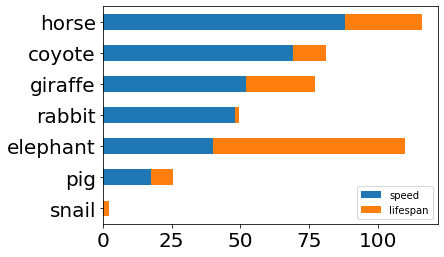

In [ ]:
speed = [0.1, 17.5, 40, 48, 52, 69, 88]
lifespan = [2, 8, 70, 1.5, 25, 12, 28]
index = ['snail', 'pig', 'elephant',
         'rabbit', 'giraffe', 'coyote', 'horse']
df = pd.DataFrame({'speed': speed,
                    'lifespan': lifespan}, index=index)
# ax = df.plot.bar(rot=0)

ax = df.plot.barh(stacked=True)



No handles with labels found to put in legend.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:39: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:59: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the pa

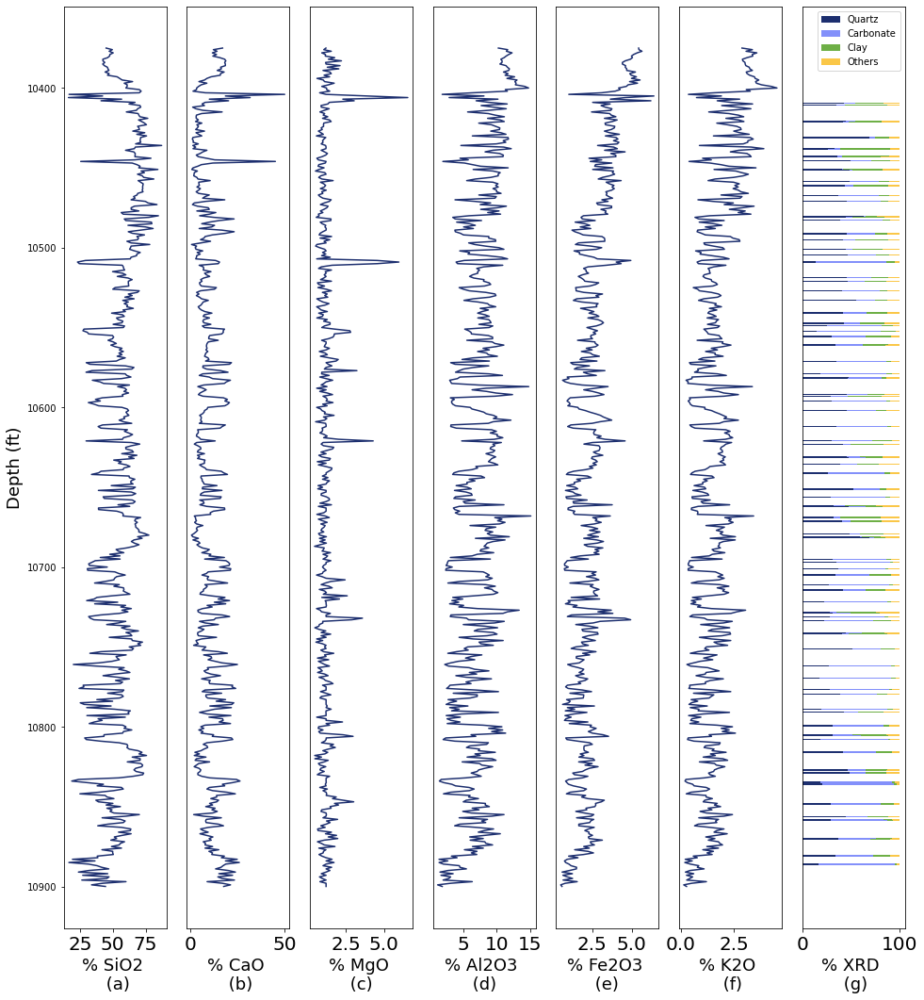

In [ ]:

import matplotlib

matplotlib.rc('xtick', labelsize=20) 
# matplotlib.rc('ytick', labelsize=20) 


fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(1, 7, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

plt.legend(loc=2, prop={'size': 12})
fig.figsize= (4,18)
ax1.plot( df1.iloc[:,1], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: SiO2-%')
ax1.invert_yaxis()
# ax1.gca('ydir',reverse)
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )
ax1.xaxis.label.set_size(18)
ax1.yaxis.label.set_size(18)

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')


ax2.plot( df1.iloc[:,2], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: CaO-%')
ax2.invert_yaxis()
# ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.set(xlabel='% CaO \n (b)' ) # , ylabel='Depth (ft)')
ax2.xaxis.label.set_size(18)
# ax1.yaxis.label.set_size(14)

ax2.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Calcium Oxide ')
# plt.ylabel('Depth (ft)')

ax3.plot( df1.iloc[:,3], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF : MgO-%')
ax3.invert_yaxis()
# ax3.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax3.legend()
ax3.set(xlabel='% MgO \n (c) ' ) # , ylabel='Depth (ft)')
ax3.xaxis.label.set_size(18)
ax3.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Magnesium Oxide ')
# plt.ylabel('Depth (ft)')

ax4.plot( df1.iloc[:,4], df1.iloc[:,0],color = '#1D2F6F', label = 'XRF: Al2O3-%')
ax4.invert_yaxis()
# ax4.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax4.legend()
ax4.xaxis.label.set_size(18)
ax4.set(xlabel='% Al2O3 \n (d) ' ) # , ylabel='Depth (ft)')
ax4.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Alluminium Oxide ')
# plt.ylabel('Depth (ft)')

ax5.plot( df1.iloc[:,5], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: Fe2O3-%')
ax5.invert_yaxis()
# ax5.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax5.legend()
ax5.xaxis.label.set_size(18)
ax5.set(xlabel='% Fe2O3 \n (e) ' ) # , ylabel='Depth (ft)')
ax5.set_yticks([], [])  # same for y ticks
# ax5.xlabel('% of Iron Oxide ')
# plt.ylabel('Depth (ft)')

ax6.plot( df1.iloc[:,6], df1.iloc[:,0], color = '#1D2F6F', label = 'XRF: K2O-%')
ax6.invert_yaxis()
# ax6.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax6.legend()
ax6.xaxis.label.set_size(18)
ax6.set(xlabel='% K2O \n (f)' ) # , ylabel='Depth (ft)')
ax6.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Pottasium Oxide ')
# plt.ylabel('Depth (ft)')



# ax6.legend(prop={"size":17}, bbox_to_anchor=(-3.8,1.07))
# ax6.xaxis.label.set_size(17)
# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

# plt.figure(figsize= (18, 3))
# ax7.plot(  2*np.ceil(df1.iloc[:,1]/100),df1.iloc[:,0],'ro', color = '#A9A9A9', label = 'XRF depth locations')
# ax7 = df_o[1:4,:].plot.barh(stacked=True)
# ax7.plot(   np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0],'o',color = '#A9A9A9', label = 'XRD samples') #     df1.iloc[:,1] 
# ax7.invert_yaxis()
# ax7.legend()
# ax7.xaxis.label.set_size(18)
# ax7.set(xlabel='XRD \n sample locations \n (g)' ) # , ylabel='Depth (ft)')

# # ax7.xlabel('Grid of Depth points')
# # ax7.ylabel('XRF and XRD depth points')
# # plt.yticks(('xrd' , 'xrf'))
# ax7.set_yticks([], [])  # same for y ticks
# ax7.set_xticks([], [])  # same for y ticks

# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')

# plt.savefig("xrf.ps")


df_grouped = df_o.set_index('deptho') 
fields = ['Quartz-Sio2','carbonate','clay','others']   # 'deptho',
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
labels = ['Quartz', 'Carbonate', 'Clay', 'Others']
# figure and axis
# fig, ax = plt.subplots(1, figsize=(4, 18))
# plot bars
left = len(df_grouped) * [0]
for idx, name in enumerate(fields):
    ax7.barh(df_grouped.index, df_grouped[name], left = left, color=colors[idx] )
    left = left + df_grouped[name]
ax7.set_ylim([10348, 10925])
ax7.invert_yaxis()
ax7.set_yticks([], [])
# title, legend, labels
# plt.title('Video Game Sales By Platform and Region\n', loc='left')
# plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=4, frameon=False)
ax7.legend(labels)
# plt.legend(loc=2, prop={'size': 12})
# ax7.xlabel('% Target Variable \n (XRD)')
ax7.set(xlabel='% XRD \n (g)' )
# remove spines

# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# adjust limits and draw grid lines
# plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
# ax7.set_axisbelow(True)
ax7.xaxis.label.set_size(18)

# ax.xaxis.grid(color='gray', linestyle='dashed')
# plt.show()
plt.savefig("xrf_xrd.ps")


In [ ]:
# df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
# temp = df_o(index = 'deptho' )
# temp = df_o.set_index('deptho')
# # plt.figsize=(4,18)
# temp.plot.barh(ax = ax1, stacked=True, figsize=(4,18))
# plt.yticks(['10880', '10860', '10400' ])

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

fig, (ax1) = plt.subplots(1, 1, figsize=(4,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

plt.legend(loc=2, prop={'size': 12})
fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0], color = '#A9A9A9', label = 'XRF: SiO2-%')
# df_o.iloc[:,1:5].plot.barh(y = df_o.iloc[:,0], ax = ax1, stacked=True, width = 0.1)
ax1.barh(df_o.iloc[:,1], df_o.iloc[:,0])
ax1.barh(df_o.iloc[:,2], df_o.iloc[:,0], left = df_o['carbonate'])
ax1.invert_yaxis()
# ax1.gca('ydir',reverse)
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
ax1.set(xlabel='% Target Data', ylabel='Depth (ft)' )
ax1.xaxis.label.set_size(18)
ax1.yaxis.label.set_size(18)
# plt.yticks(('xrd' , 'xrf'))
# ax1.set_yticks(['10400', '10500', '10600', '10700', '10800', '10900'])
ax1.set_yticks([],[])

# plt.savefig("xrd.ps")



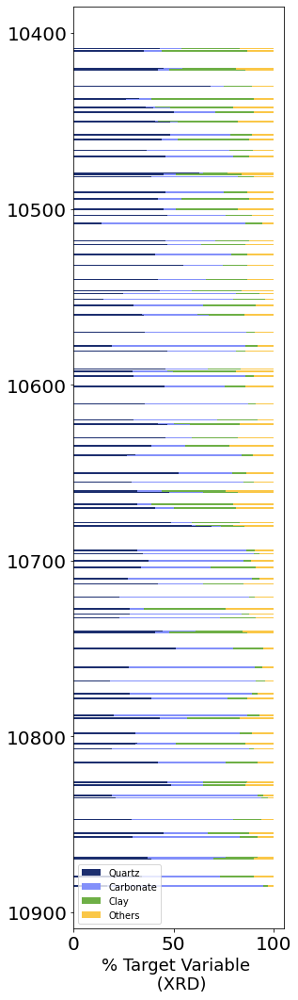

In [ ]:
df_grouped = df_o.set_index('deptho') 
fields = ['Quartz-Sio2','carbonate','clay','others']   # 'deptho',
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
labels = ['Quartz', 'Carbonate', 'Clay', 'Others']
# figure and axis
fig, ax = plt.subplots(1, figsize=(4, 18))
# plot bars
left = len(df_grouped) * [0]
for idx, name in enumerate(fields):
    plt.barh(df_grouped.index, df_grouped[name], left = left, color=colors[idx])
    left = left + df_grouped[name]
# title, legend, labels
# plt.title('Video Game Sales By Platform and Region\n', loc='left')
# plt.legend(labels, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=4, frameon=False)
plt.legend(labels)
# plt.legend(loc=2, prop={'size': 12})
plt.xlabel('% Target Variable \n (XRD)')
# remove spines
ax.invert_yaxis()
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# adjust limits and draw grid lines
# plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
ax.set_axisbelow(True)
ax.xaxis.label.set_size(18)

# ax.xaxis.grid(color='gray', linestyle='dashed')
plt.show()

In [ ]:
dep

0      10408.85
1      10410.00
2      10420.15
3      10420.70
4      10430.25
         ...   
99     10857.20
100    10869.00
101    10869.45
102    10879.60
103    10884.85
Name: depthi, Length: 104, dtype: float64

In [ ]:
df_o[1:4,:].plot.barh(stacked=True)

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving tinput.dat to tinput.dat
Saving toutput.dat to toutput.dat


In [ ]:



import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor



# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)



# now select only useful features for carbonate a = 1 

# # df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)










# df1 = pd.read_excel('XRF_Data.xlsx')

# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))


In [ ]:
# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 2
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
  #               sep="\s+")


  # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
  #                 sep="\s+")
  # df_i = pd.DataFrame(Df_i)
  # df_o = pd.DataFrame(Df_o)

  # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  # df_o = df_o.drop(['deptho'], axis = 1)
  # dep = df_i['depthi']
  # df_i = df_i.drop(['depthi'], axis = 1)

  # count = 6
  # col_name = 'ABC' + str(count)
  # df_i.insert( count,col_name, a2)

  # b = 2000
  # a = 0
  # test_sz = 8 
  # from scipy import stats 
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # max_rat_val = -9999999999999
  # max_rat = 0 
  # max_rat1 = 0 
  # X1 = pd.DataFrame(X_train)
  # Y1 = pd.DataFrame(Y_train)
  # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # # print(Y1.columns)
  # for rat1 in np.linspace(1,8,20):
  #   for rat in np.linspace(1,8,20):
  #     curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
  #     # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
  #     if curr > max_rat_val :
  #       max_rat = rat
  #       max_rat1 = rat1
  #       max_rat_val = curr 
  # print(max_rat_val,max_rat, max_rat1) 

  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # # plt.figure()
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  # X1 = pd.DataFrame(X_test)
  # Y1 = pd.DataFrame(Y_test)

  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # # plt.figure()
  # # plt.scatter()

  # # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # # print(pearson_coef, p_value)

  # df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  # df_i = df_i.drop(['SiO2-%'], axis = 1)
  # df_i = df_i.drop(['CaO-%'], axis = 1)
  # df_i = df_i.drop(['MgO-%'], axis = 1)
  # df_i = df_i.drop(['Al2O3-%'], axis = 1)
  # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  # df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  a1 = model_cv.predict(df_i)
  print(model_cv.best_params_)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









test % is  8
Fitting 2 folds for each of 252 candidates, totalling 504 fits


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multi

NN training average is 0.5591979897965262 testing is  0.7611376669427647
{'activation': 'relu', 'alpha': 1e-05, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 200, 'n_iter_no_change': 10000, 'random_state': 100, 'solver': 'adam'}


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


No handles with labels found to put in legend.


{'activation': 'relu', 'solver': 'adam', 'alpha': 1e-05, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 200, 'loss': 'squared_error', 'hidden_layer_sizes': (4, 2), 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'feature_names_in_': array(['Fe2O3-%', 'K2O-%'], dtype=object), 'n_features_in_': 2, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7FBA83F3A6B0, 'n_iter_': 200, 't_': 4000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-1.06640458e-06,  3.54341485e-01,  4.85456903e-01,
         1.32346909e+00],
       [-3.37268254e-02, -1.11332079e+00,  1.09310267e+00,
         1.39925069e+00]]), array([[-6.71607012e-05, -5.58437003e-03],
       [-1.97199420e+00,  2.721

Text(0, 0.5, 'loss value')

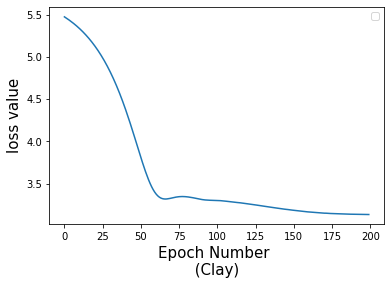

In [ ]:
# model_cv.loss_curve_
dict_par_with = model_cv.best_estimator_.__dict__
# list_r2_score.append(r2_score(Y_test, Y_pred_N))
print(dict_par_with)
plt.plot(np.log(dict_par_with['loss_curve_']))


plt.legend()
plt.xlim()
plt.xlabel('Epoch Number \n (Clay) ', fontsize=15)
plt.ylabel('loss value', fontsize=15)




# plt.plot(dict_par['loss_curve_'])

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

In [ ]:



import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor



# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)



# now select only useful features for carbonate a = 1 

# # df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
df_i = df_i.drop(['Fe2O3-%'], axis = 1)
df_i = df_i.drop(['K2O-%'], axis = 1)










# df1 = pd.read_excel('XRF_Data.xlsx')

# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))


In [ ]:
# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 1
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
  #               sep="\s+")


  # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
  #                 sep="\s+")
  # df_i = pd.DataFrame(Df_i)
  # df_o = pd.DataFrame(Df_o)

  # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  # df_o = df_o.drop(['deptho'], axis = 1)
  # dep = df_i['depthi']
  # df_i = df_i.drop(['depthi'], axis = 1)

  # count = 6
  # col_name = 'ABC' + str(count)
  # df_i.insert( count,col_name, a2)

  # b = 2000
  # a = 0
  # test_sz = 8 
  # from scipy import stats 
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # max_rat_val = -9999999999999
  # max_rat = 0 
  # max_rat1 = 0 
  # X1 = pd.DataFrame(X_train)
  # Y1 = pd.DataFrame(Y_train)
  # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # # print(Y1.columns)
  # for rat1 in np.linspace(1,8,20):
  #   for rat in np.linspace(1,8,20):
  #     curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
  #     # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
  #     if curr > max_rat_val :
  #       max_rat = rat
  #       max_rat1 = rat1
  #       max_rat_val = curr 
  # print(max_rat_val,max_rat, max_rat1) 

  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # # plt.figure()
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  # X1 = pd.DataFrame(X_test)
  # Y1 = pd.DataFrame(Y_test)

  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # # plt.figure()
  # # plt.scatter()

  # # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # # print(pearson_coef, p_value)

  # df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  # df_i = df_i.drop(['SiO2-%'], axis = 1)
  # df_i = df_i.drop(['CaO-%'], axis = 1)
  # df_i = df_i.drop(['MgO-%'], axis = 1)
  # df_i = df_i.drop(['Al2O3-%'], axis = 1)
  # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  # df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  a1 = model_cv.predict(df_i)
  print(model_cv.best_params_)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









test % is  8
Fitting 2 folds for each of 252 candidates, totalling 504 fits


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multi

NN training average is 0.7623514017195486 testing is  0.8297998994976385
{'activation': 'relu', 'alpha': 10, 'hidden_layer_sizes': 3, 'learning_rate_init': 0.01, 'max_iter': 600, 'n_iter_no_change': 10000, 'random_state': 2, 'solver': 'adam'}


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


No handles with labels found to put in legend.


{'activation': 'relu', 'solver': 'adam', 'alpha': 10, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 600, 'loss': 'squared_error', 'hidden_layer_sizes': 3, 'shuffle': True, 'random_state': 2, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'feature_names_in_': array(['CaO-%', 'MgO-%', 'new-mg-ca'], dtype=object), 'n_features_in_': 3, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7FBA83F3A270, 'n_iter_': 600, 't_': 12000, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[-2.92876877e-15,  6.90988184e-01, -4.45100483e-03],
       [-1.05106858e-15, -6.04535257e-01, -1.12591462e-13],
       [ 4.30149931e-14,  9.14561151e-01, -2.88510953e-02]]), array([[ 2.92295493e-12],
       [ 9.06196720e-01],
       [-4

Text(0, 0.5, 'loss value')

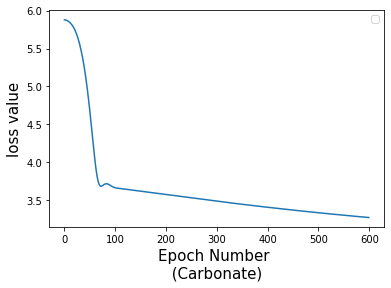

In [ ]:
# model_cv.loss_curve_
dict_par_with = model_cv.best_estimator_.__dict__
# list_r2_score.append(r2_score(Y_test, Y_pred_N))
print(dict_par_with)
plt.plot(np.log(dict_par_with['loss_curve_']))


plt.legend()
plt.xlim()
plt.xlabel('Epoch Number \n (Carbonate) ', fontsize=15)
plt.ylabel('loss value', fontsize=15)




# plt.plot(dict_par['loss_curve_'])

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving tinput.dat to tinput.dat
Saving toutput.dat to toutput.dat


In [ ]:



import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor



# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)







# df1 = pd.read_excel('XRF_Data.xlsx')

# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))


In [ ]:
# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 0
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


  Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                  sep="\s+")
  df_i = pd.DataFrame(Df_i)
  df_o = pd.DataFrame(Df_o)

  df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  df_o = df_o.drop(['deptho'], axis = 1)
  dep = df_i['depthi']
  df_i = df_i.drop(['depthi'], axis = 1)

  # count = 6
  # col_name = 'ABC' + str(count)
  # df_i.insert( count,col_name, a2)

  # b = 2000
  # a = 0
  # test_sz = 8 
  from scipy import stats 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  max_rat_val = -9999999999999
  max_rat = 0 
  max_rat1 = 0 
  X1 = pd.DataFrame(X_train)
  Y1 = pd.DataFrame(Y_train)
  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # print(Y1.columns)
  for rat1 in np.linspace(1,8,20):
    for rat in np.linspace(1,8,20):
      curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
      # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
      if curr > max_rat_val :
        max_rat = rat
        max_rat1 = rat1
        max_rat_val = curr 
  print(max_rat_val,max_rat, max_rat1) 

  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # plt.figure()
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  X1 = pd.DataFrame(X_test)
  Y1 = pd.DataFrame(Y_test)

  print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # plt.figure()
  # plt.scatter()

  # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # print(pearson_coef, p_value)

  df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  df_i = df_i.drop(['SiO2-%'], axis = 1)
  df_i = df_i.drop(['CaO-%'], axis = 1)
  df_i = df_i.drop(['MgO-%'], axis = 1)
  df_i = df_i.drop(['Al2O3-%'], axis = 1)
  df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  a1 = model_cv.predict(df_i)
  print(model_cv.best_params_)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









In [ ]:
# model_cv.loss_curve_
dict_par_with = model_cv.best_estimator_.__dict__
# list_r2_score.append(r2_score(Y_test, Y_pred_N))
print(dict_par_with)
plt.plot(np.log(dict_par_with['loss_curve_']))


plt.legend()
plt.xlim()
plt.xlabel('Epoch Number \n (Quartz) ', fontsize=15)
plt.ylabel('loss value', fontsize=15)




# plt.plot(dict_par['loss_curve_'])

In [ ]:
# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 0
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


  Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                  sep="\s+")
  df_i = pd.DataFrame(Df_i)
  df_o = pd.DataFrame(Df_o)

  df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  df_o = df_o.drop(['deptho'], axis = 1)
  dep = df_i['depthi']
  df_i = df_i.drop(['depthi'], axis = 1)

  # count = 6
  # col_name = 'ABC' + str(count)
  # df_i.insert( count,col_name, a2)

  # b = 2000
  # a = 0
  # test_sz = 8 
  from scipy import stats 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  max_rat_val = -9999999999999
  max_rat = 0 
  max_rat1 = 0 
  X1 = pd.DataFrame(X_train)
  Y1 = pd.DataFrame(Y_train)
  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # print(Y1.columns)
  for rat1 in np.linspace(1,8,20):
    for rat in np.linspace(1,8,20):
      curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
      # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
      if curr > max_rat_val :
        max_rat = rat
        max_rat1 = rat1
        max_rat_val = curr 
  print(max_rat_val,max_rat, max_rat1) 

  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # plt.figure()
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  X1 = pd.DataFrame(X_test)
  Y1 = pd.DataFrame(Y_test)

  print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # plt.figure()
  # plt.scatter()

  # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # print(pearson_coef, p_value)

  df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  df_i = df_i.drop(['SiO2-%'], axis = 1)
  df_i = df_i.drop(['CaO-%'], axis = 1)
  df_i = df_i.drop(['MgO-%'], axis = 1)
  df_i = df_i.drop(['Al2O3-%'], axis = 1)
  df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  a1 = model_cv.predict(df_i)
  print(model_cv.best_params_)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









0.6641705335232329 8.0 1.0
0.35568063145148965
test % is  8
Fitting 2 folds for each of 252 candidates, totalling 504 fits


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multi

NN training average is 0.7424282422968894 testing is  0.6471690098102207
{'activation': 'relu', 'alpha': 300, 'hidden_layer_sizes': 3, 'learning_rate_init': 0.01, 'max_iter': 200, 'n_iter_no_change': 10000, 'random_state': 100, 'solver': 'adam'}


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


In [ ]:
df_i

,SiO2-%,CaO-%,MgO-%,Al2O3-%,Fe2O3-%,K2O-%
0,63.102594,9.620468,1.675737,8.592423,3.080196,2.284424
1,62.396375,6.120453,1.343693,11.574918,3.631042,3.386245
2,70.005880,3.901533,1.457398,10.608489,4.025748,2.767634
3,71.318842,3.084358,1.517102,10.944784,3.852273,2.906143
4,74.660661,4.754999,0.738446,7.683027,3.494631,1.976992
...,...,...,...,...,...,...
99,44.740124,14.780853,1.210927,5.216293,1.737034,1.035603
100,51.260063,11.870366,1.358606,5.938602,2.259193,1.179684
101,52.035423,10.961723,1.639594,6.856778,2.278216,1.374655
102,50.277640,11.441832,0.870714,6.689821,2.209319,1.380866


No handles with labels found to put in legend.


{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 200, 'loss': 'squared_error', 'hidden_layer_sizes': 3, 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'feature_names_in_': array(['new_sio2'], dtype=object), 'n_features_in_': 1, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7FBAA7218160, 'n_iter_': 200, 't_': 4000, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[ 7.76572766e-01, -3.99033860e-05, -2.32516871e-02]]), array([[ 1.12039680e+00],
       [ 4.81022568e-04],
       [-4.29931949e-03]])], 'intercepts_': [array([ 1.49499328, -1.21318608, -0.98805667]), array([0.74130009])], 'loss_curve_': [919.758100897824

Text(0, 0.5, 'loss value')

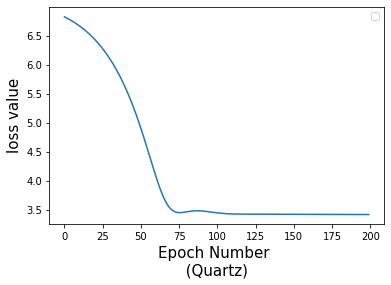

In [ ]:
# model_cv.loss_curve_
dict_par_with = model_cv.best_estimator_.__dict__
# list_r2_score.append(r2_score(Y_test, Y_pred_N))
print(dict_par_with)
plt.plot(np.log(dict_par_with['loss_curve_']))


plt.legend()
plt.xlim()
plt.xlabel('Epoch Number \n (Quartz) ', fontsize=15)
plt.ylabel('loss value', fontsize=15)




# plt.plot(dict_par['loss_curve_'])

In [ ]:
q1_d_nn = dict_par_with

In [ ]:
# asdfg
model_cv.best_params_

# model_cv.loss_curve_
dict_par_with = model_cv.best_estimator_.dict

list_r2_score.append(r2_score(Y_test, Y_pred_N))
print(dict_par_with) 
plt.plot(np.log(dict_par_with['loss_curve_']))

plt.legend()
plt.xlim()
plt.xlabel('Epoch Number  ', fontsize=15)
plt.ylabel('loss value', fontsize=15)



# plt.plot(dict_par['loss_curve_'])

AttributeError: ignored

In [ ]:
df_o


,Quartz-Sio2,carbonate,clay,others
0,43.0,11.0,29.0,17.0
1,35.0,9.0,43.0,13.0
2,45.1,9.1,26.9,18.9
3,42.0,6.0,38.0,14.0
4,68.5,6.6,14.3,10.6
...,...,...,...,...
99,29.6,57.4,6.4,6.6
100,37.0,39.0,16.0,8.0
101,39.0,31.0,20.0,10.0
102,34.0,39.0,17.0,10.0


In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


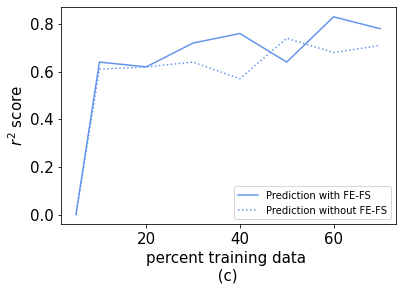

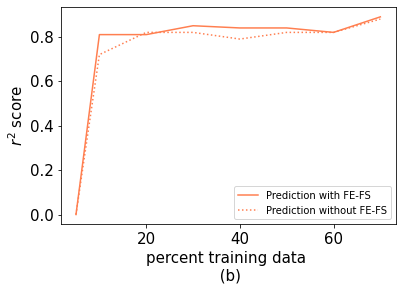

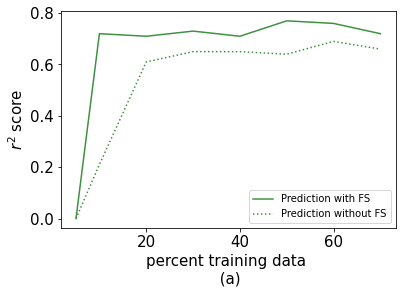

In [ ]:

# import matplotlib as plt 
# import numpy as no 
import matplotlib

matplotlib.rc('xtick', labelsize=15) 
matplotlib.rc('ytick', labelsize=15) 




q = [0, 0.65 , 0.71 , 0.68, 0.59, 0.55, 0.47, 0.28, 0.73]   # 0.73 
q_b10 = [0, 0.64, 0.62, 0.72, 0.76, 0.64, 0.83, 0.78 ] # 0 
cr = [0, 0.81, 0.81 , 0.85 , 0.84 , 0.84, 0.82, 0.89] # 0.89 
cl = [0, 0.72 , 0.71 , 0.73 , 0.71, 0.77, 0.76, 0.72] # 0.84 

q_wfe = [ 0 , 0.64,0.50,0.44,0.53,0.50,0.39,0.004] # 0.70 
q_wfe_b10 = [0, 0.61, 0.62,0.64,0.57,0.74,0.68,0.71] # 0.64 
cr_wfe = [0,0.72,0.82,0.82,0.79,0.82,0.82,0.88] # 0.88 
cl_wfe = [0,0.21,0.61,0.65,0.65,0.64,0.69,0.66] # 0.84 
per = [5, 10, 20, 30, 40, 50, 60, 70]



# f = plt.figure()
# _ = plt.plot(x, y, 'o', np.arange(20), a*np.arange(20)+b, '-')

# f.savefig( "test.png")



plt.plot(per, q_b10, label = 'Prediction with FE-FS', color= '#6495ED')
plt.plot(per, q_wfe_b10, label = 'Prediction without FE-FS', color= '#6495ED', linestyle=':')
plt.legend()
plt.xlim()
plt.xlabel('percent training data \n (c) ', fontsize=15)
plt.ylabel('$r^2$ score', fontsize=15)
# plt.show()
plt.savefig("quartz.ps")

# ax1.xaxis.label.set_size(17)
# ax1.yaxis.label.set_size(20)


plt.figure()
plt.plot(per, cr, label = 'Prediction with FE-FS', color= '#FF7F50')
plt.plot(per, cr_wfe, label = 'Prediction without FE-FS', color= '#FF7F50', linestyle=':')
plt.legend()
plt.xlim()
# plt.xlabel('percent training data \n (b) ')
plt.ylabel('$r^2$ score')


plt.xlabel('percent training data \n (b)', fontsize=15)
plt.ylabel('$r^2$ score', fontsize=15)
# plt.show()
plt.savefig("carbonate.ps")

plt.figure()
plt.plot(per, cl, label = 'Prediction with FS',color= '#3D9140')
plt.plot(per, cl_wfe, label = 'Prediction without FS',color= '#3D9140', linestyle=':')
plt.legend()
plt.xlim()
# plt.xlabel('percent training data \n (a)')
plt.xlabel('percent training data \n (a)', fontsize=15)
# plt.ylabel('r2 score', fontsize=15)
plt.ylabel('$r^2$ score', fontsize=15 )
# plt.show()
plt.savefig("clay.ps")
# () 

# plt.plot(otp_df['median'],dep , label = 'median', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(otp_df['max'], dep,label = 'max' ,linewidth=2.5, linestyle=':',color= '#FF7F50')
# plt.plot(otp_df['min'],dep,  label = 'min', linewidth=2.5, linestyle=':', color = '#3D9140' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'actual', linewidth=2 , color = '#6495ED') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')

In [ ]:

from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.



import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing




# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
# df_o = df_o.drop(['deptho'], axis = 1)
# dep = df_i['depthi']
# df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)







df1 = pd.read_excel('XRF_Data.xlsx')

# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))


KeyError: ignored

([], [])

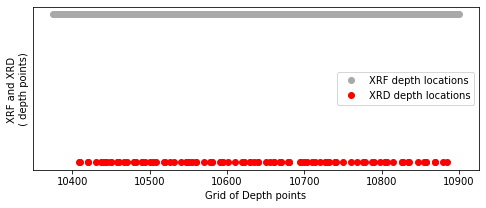

In [ ]:

plt.figure(figsize= (8, 3))
plt.plot( df1.iloc[:,0],2*np.ceil(df1.iloc[:,1]/100),'ro', color = '#A9A9A9', label = 'XRF depth locations')
plt.plot( df_o.iloc[:,0], np.ceil(df_o.iloc[:,1]/100) ,'ro', label = 'XRD depth locations') #     df1.iloc[:,1] 

plt.legend()
plt.xlabel('Grid of Depth points')
plt.ylabel('XRF and XRD \n ( depth points) ')
# plt.yticks(('xrd' , 'xrf'))
plt.yticks([], [])  # same for y ticks


# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving ENet_df_overlap_1-10trials_wmmm.csv to ENet_df_overlap_1-10trials_wmmm.csv
Saving Ensemble_quartz_df_overlap_11trials.csv to Ensemble_quartz_df_overlap_11trials.csv
Saving NN_df_overlap_1-10trials_wommm.csv to NN_df_overlap_1-10trials_wommm.csv
Saving tinput.dat to tinput.dat
Saving toutput.dat to toutput.dat
Saving try_multi_quartz.xlsx to try_multi_quartz.xlsx
Saving XGB_quartz_made.csv to XGB_quartz_made.csv


In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

In [ ]:
df3 = pd.read_csv('ENet_df_overlap_1-10trials_wmmm.csv', header = None)
df5 = pd.read_csv('Ensemble_quartz_df_overlap_11trials.csv', header = None)
df4 = pd.read_csv('NN_df_overlap_1-10trials_wommm.csv', header = None)
df1 = pd.read_csv('XGB_quartz_made.csv', header = None)
df2 = pd.read_excel('try_multi_quartz.xlsx', header = None)
# df6 = pd.read_excel('XRF_Data.xlsx')
# df7 = pd.read_excel('XRF_Data.xlsx')

In [ ]:
# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

In [ ]:
arr = [] 
for QX in range(9):
  # print(QX)
  arr.append(r2_score(df1.iloc[:,QX], df_o.iloc[:,0] ))
  # print(r2_score(df1.iloc[:,QX], df_o.iloc[:,0] ))
print(np.mean(arr))

arr = [] 
for QM in range(5):
  # print(QM)
  arr.append(r2_score(df2.iloc[:,QM], df_o.iloc[:,0] ))
  # print(r2_score(df2.iloc[:,QM], df_o.iloc[:,0] ))
print(np.mean(arr))

arr = [] 
for QE in range(9):
  print(QE)
  arr.append(r2_score(df3.iloc[:,QE], df_o.iloc[:,0] ))
  print(r2_score(df3.iloc[:,QE], df_o.iloc[:,0] ))
print(np.mean(arr))

arr = [] 
for QN in range(10):
  print(QN)
  arr.append(r2_score(df4.iloc[:,QN], df_o.iloc[:,0] ))
  print(r2_score(df4.iloc[:,QN], df_o.iloc[:,0] ))
print(np.mean(arr))

arr = [] 
for QES in range(6,10,1):
  print(QES)
  arr.append(r2_score(df5.iloc[:,QES], df_o.iloc[:,0] ))
  print(r2_score(df5.iloc[:,QES], df_o.iloc[:,0] ))
print(np.mean(arr))



0.577424568485617
0.14937675261252226
0
0.714578625597291
1
0.6860575634963404
2
0.4789430237823248
3
0.6272956623440991
4
0.7102332793312633
5
0.7124586204160397
6
-0.09299254481471442
7
0.6326180976882032
8
0.610268092008668
0.5643844910943906
0
0.62025484172754
1
0.6760299906536777
2
0.5109401918892535
3
0.5493634114239963
4
0.6301331437980202
5
0.392043449271814
6
0.6301331437980202
7
0.6094525586063737
8
0.579493234345549
9
0.5642487619453778
0.5762092727459623
6
0.6301331437980202
7
0.6094525586063737
8
0.579493234345549
9
0.5642487619453778
0.5958319246738302


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:130: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:155: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:178: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor r

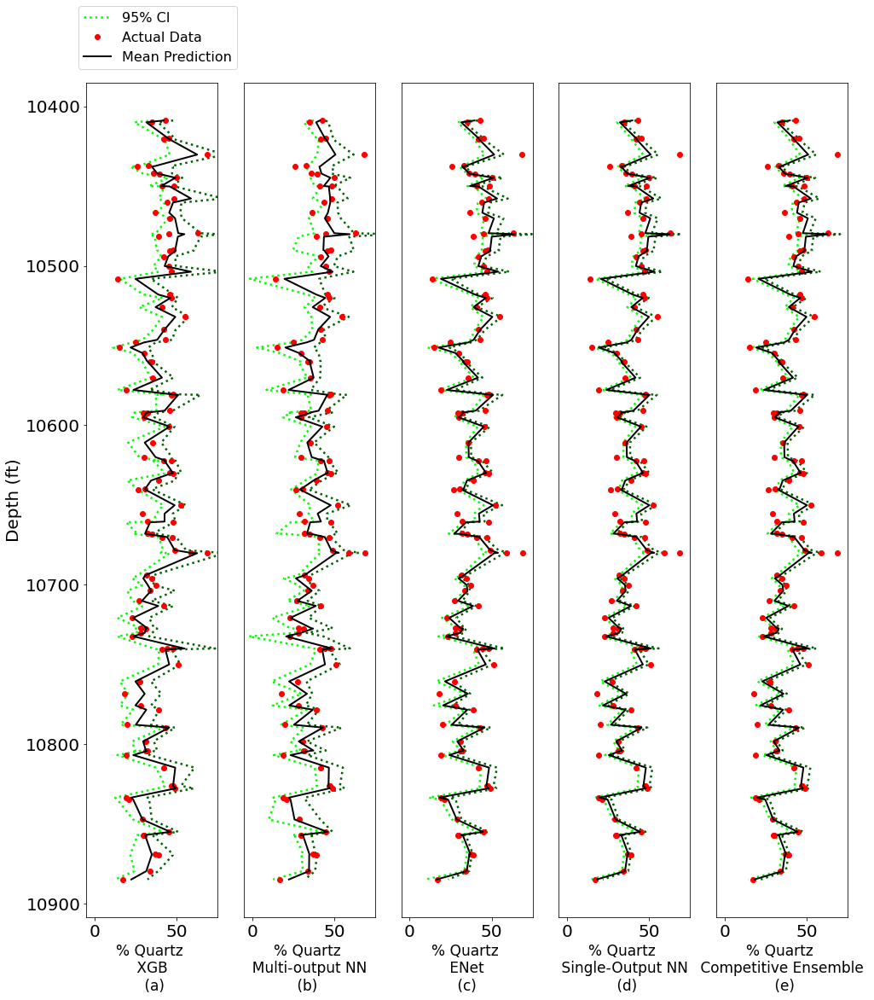

In [ ]:
import matplotlib

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

a = 0
# otp_df_ = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df1 = pd.read_excel('XRF_Data.xlsx')
temp = 2*df1.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df1.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df


# plt.figure(figsize = (4,14))
# # plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
# plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

# fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: SiO2-%')
# ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax1.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # , label = 'Mean + 3*Std Dev '
ax1.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax1.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000') 

# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()

ax1.invert_yaxis()
# # ax1.gca('ydir',reverse)
# # ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
# ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )




ax1.set(xlabel='% Quartz \n XGB \n (a)', ylabel='Depth (ft)')
# ax1.legend(prop={"size":13})
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
ax1.xaxis.label.set_size(17)
ax1.yaxis.label.set_size(20)
ax1.set_xlim([-5, 75])


temp = 2*df2.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df2.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


ax2.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax2.plot(plus,dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax2.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000')
ax2.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax2.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000')

# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.invert_yaxis()
ax2.set(xlabel='% Quartz \n  Multi-output NN  \n (b)  ') # , ylabel='Depth (ft)'
ax2.set_yticks([], [])  # same for y ticks


# ax1.set(xlabel='% Quartz \n XGB \n (a)', ylabel='Depth (ft)')

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
# ax2.legend(prop={"size":13})
ax2.xaxis.label.set_size(17)
ax2.set_xlim([-5, 75])
# ax2.plot( df2.iloc[:,2], df2.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
# # ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
# ax2.set(xlabel='% of Calcium Oxide', ylabel='Depth (ft)')
# ax2.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Calcium Oxide ')
# # plt.ylabel('Depth (ft)')




temp = 2*df3.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df3.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax3.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax3.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax3.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000')
ax3.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax3.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax3.legend()
ax3.invert_yaxis()
ax3.set(xlabel='% Quartz \n ENet \n (c) ') # , ylabel='Depth (ft)'
ax3.set_yticks([], [])  # same for y ticks

# ax3.legend(prop={"size":13})
ax3.xaxis.label.set_size(17)
ax3.set_xlim([-5, 75])



temp = 2*df4.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df4.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax4.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax4.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax4.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
ax4.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax4.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000')

# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax4.legend()
ax4.invert_yaxis()
ax4.set(xlabel='% Quartz \n Single-Output NN \n (d)') # , ylabel='Depth (ft)'
ax4.set_yticks([], [])  # same for y ticks

# ax4.legend(prop={"size":13})
ax4.xaxis.label.set_size(17)
ax4.set_xlim([-5, 75])


temp = 2*df5.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df5.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax5.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax5.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
ax5.plot(df_o.iloc[:,int(a)], dep, 'ro',label = 'Actual Data') # linewidth=2 , color = '#000000') 
# 000000
ax5.plot(mean, dep, label = 'Mean Prediction', linewidth=2, color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax5.legend()
ax5.invert_yaxis()
ax5.set(xlabel='% Quartz \n Competitive Ensemble \n (e)') # , ylabel='Depth (ft)'
ax5.set_yticks([], [])  # same for y ticks

ax5.legend(prop={"size":16}, bbox_to_anchor=(-3.6,1.1))
ax5.xaxis.label.set_size(17)
ax5.set_xlim([-5, 75])
# plt.show() 
plt.savefig("quartz_overlap_ps.ps")

# labels = ['Sending Data', 'Not Sending Data'] #legend labels to be plotted
# colors = ['green', 'red']


# plt.legend(labels, bbox_to_anchor=(2.3, 2), prop={'size':14}) #show the legend defined in labels
# #change values of 'bbox_to_anchor' to move the legend to the desired location

# plt.axis('equal') # Set aspect ratio to be equal so that pie is drawn as a circle.
# plt.tight_layout()
# plt.subplots_adjust(right=0.94) #adjust the spacing on right to see legend clearly
# plt.show()




In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving ENET_Carb_df_overlap_1-10trials_wommm.csv to ENET_Carb_df_overlap_1-10trials_wommm.csv
Saving Ensemble_carb_df_overlap_10trials.csv to Ensemble_carb_df_overlap_10trials.csv
Saving FE_latestNN_Carbonate_mean_median.csv to FE_latestNN_Carbonate_mean_median.csv
Saving tinput.dat to tinput (1).dat
Saving toutput.dat to toutput (1).dat
Saving try_multi_carbonate.xlsx to try_multi_carbonate.xlsx
Saving XGB_Carb_df_overlap_1-10trials_wommm.csv to XGB_Carb_df_overlap_1-10trials_wommm.csv


In [ ]:
df3 = pd.read_csv('ENET_Carb_df_overlap_1-10trials_wommm.csv', header = None)
df5 = pd.read_csv('Ensemble_carb_df_overlap_10trials.csv', header = None)
df4 = pd.read_csv('FE_latestNN_Carbonate_mean_median.csv', header = None)
df1 = pd.read_csv('XGB_Carb_df_overlap_1-10trials_wommm.csv', header = None)
df2 = pd.read_excel('try_multi_carbonate.xlsx', header = None)
# df6 = pd.read_excel('XRF_Data.xlsx')
# df7 = pd.read_excel('XRF_Data.xlsx')

In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

In [ ]:
# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)



In [ ]:
arr = [] 
for QX in range(9):
  # print(QX)
  arr.append(r2_score(df1.iloc[:,QX], df_o.iloc[:,1] ))
  # print(r2_score(df1.iloc[:,QX], df_o.iloc[:,1] ))
print(np.mean(arr))

arr = [] 
for QM in range(5):
  # print(QM)
  arr.append(r2_score(df2.iloc[:,QM], df_o.iloc[:,1] ))
  # print(r2_score(df2.iloc[:,QM], df_o.iloc[:,1] ))
print(np.mean(arr))

arr = [] 
for QE in range(9):
  print(QE)
  arr.append(r2_score(df3.iloc[:,QE], df_o.iloc[:,1] ))
  print(r2_score(df3.iloc[:,QE], df_o.iloc[:,1] ))
print(np.mean(arr))

arr = [] 
for QN in range(10):
  print(QN)
  arr.append(r2_score(df4.iloc[:,QN], df_o.iloc[:,1] ))
  print(r2_score(df4.iloc[:,QN], df_o.iloc[:,1] ))
print(np.mean(arr))

arr = [] 
for QES in range(0,9):
  print(QES)
  arr.append(r2_score(df5.iloc[:,QES], df_o.iloc[:,1] ))
  print(r2_score(df5.iloc[:,QES], df_o.iloc[:,1] ))
print(np.mean(arr))



0.7050445921416469
0.7214903091288072
0
0.8415439208185356
1
0.8174375326786469
2
0.6897502480030753
3
0.8443794199471737
4
0.8257673340339685
5
0.7731161650723293
6
0.803647494192892
7
0.8104781979473442
8
0.7873803457362794
0.799277850936694
0
0.8360400502942267
1
0.8087601554201176
2
0.8286169130664308
3
0.6189967960531313
4
0.7311953969306666
5
0.8019024801373662
6
0.5444088547267466
7
0.8095640702486844
8
0.8113450592666739
9
0.8034007224069213
0.7594230498550966
0
0.8254286843256122
1
0.8149053724661284
2
0.737429402703148
3
0.7479226917195487
4
0.7418623787997125
5
0.7818166736143572
6
0.6841187753017217
7
0.7788277029782105
8
0.8020995532219397
0.7682679150144865


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:91: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:129: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:154: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:177: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor r

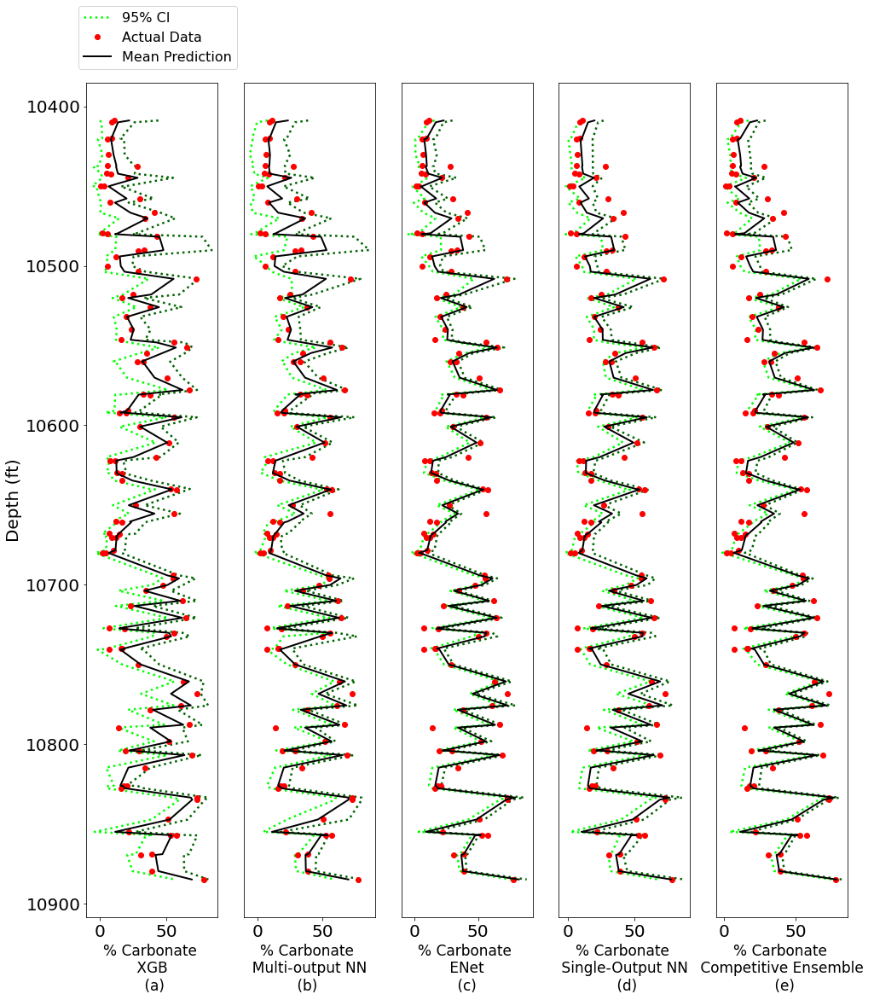

In [ ]:
import matplotlib

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

a = 1
# otp_df_ = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df1 = pd.read_excel('XRF_Data.xlsx')
temp = 2*df1.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df1.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df


# plt.figure(figsize = (4,14))
# # plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
# plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

# fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: SiO2-%')
# ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax1.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # , label = 'Mean + 3*Std Dev '
ax1.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax1.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000') 

# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()

ax1.invert_yaxis()
# # ax1.gca('ydir',reverse)
# # ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
# ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )




ax1.set(xlabel='% Carbonate \n XGB \n (a)', ylabel='Depth (ft)')
# ax1.legend(prop={"size":13})
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
ax1.xaxis.label.set_size(17)
ax1.yaxis.label.set_size(20)


temp = 2*df2.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df2.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


ax2.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax2.plot(plus,dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax2.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000')
ax2.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax2.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000')

# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.invert_yaxis()
ax2.set(xlabel='% Carbonate \n  Multi-output NN  \n (b)  ') # , ylabel='Depth (ft)'
ax2.set_yticks([], [])  # same for y ticks


# ax1.set(xlabel='% Quartz \n XGB \n (a)', ylabel='Depth (ft)')

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
# ax2.legend(prop={"size":13})
ax2.xaxis.label.set_size(17)

# ax2.plot( df2.iloc[:,2], df2.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
# # ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
# ax2.set(xlabel='% of Calcium Oxide', ylabel='Depth (ft)')
# ax2.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Calcium Oxide ')
# # plt.ylabel('Depth (ft)')




temp = 2*df3.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df3.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax3.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax3.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax3.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000')
ax3.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax3.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax3.legend()
ax3.invert_yaxis()
ax3.set(xlabel='% Carbonate \n ENet \n (c) ') # , ylabel='Depth (ft)'
ax3.set_yticks([], [])  # same for y ticks

# ax3.legend(prop={"size":13})
ax3.xaxis.label.set_size(17)




temp = 2*df4.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df4.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax4.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax4.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax4.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
ax4.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax4.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000')

# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax4.legend()
ax4.invert_yaxis()
ax4.set(xlabel='% Carbonate \n Single-Output NN \n (d)') # , ylabel='Depth (ft)'
ax4.set_yticks([], [])  # same for y ticks

# ax4.legend(prop={"size":13})
ax4.xaxis.label.set_size(17)



temp = 2*df5.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df5.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax5.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax5.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
ax5.plot(df_o.iloc[:,int(a)], dep, 'ro',label = 'Actual Data') # linewidth=2 , color = '#000000') 
# 000000
ax5.plot(mean, dep, label = 'Mean Prediction', linewidth=2, color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax5.legend()
ax5.invert_yaxis()
ax5.set(xlabel='% Carbonate \n Competitive Ensemble \n (e)') # , ylabel='Depth (ft)'
ax5.set_yticks([], [])  # same for y ticks

ax5.legend(prop={"size":16}, bbox_to_anchor=(-3.6,1.1))
ax5.xaxis.label.set_size(17)

# plt.show() 
plt.savefig("carbonate_overlap_ps.ps")

# labels = ['Sending Data', 'Not Sending Data'] #legend labels to be plotted
# colors = ['green', 'red']


# plt.legend(labels, bbox_to_anchor=(2.3, 2), prop={'size':14}) #show the legend defined in labels
# #change values of 'bbox_to_anchor' to move the legend to the desired location

# plt.axis('equal') # Set aspect ratio to be equal so that pie is drawn as a circle.
# plt.tight_layout()
# plt.subplots_adjust(right=0.94) #adjust the spacing on right to see legend clearly
# plt.show()




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:109: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:127: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:145: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor r

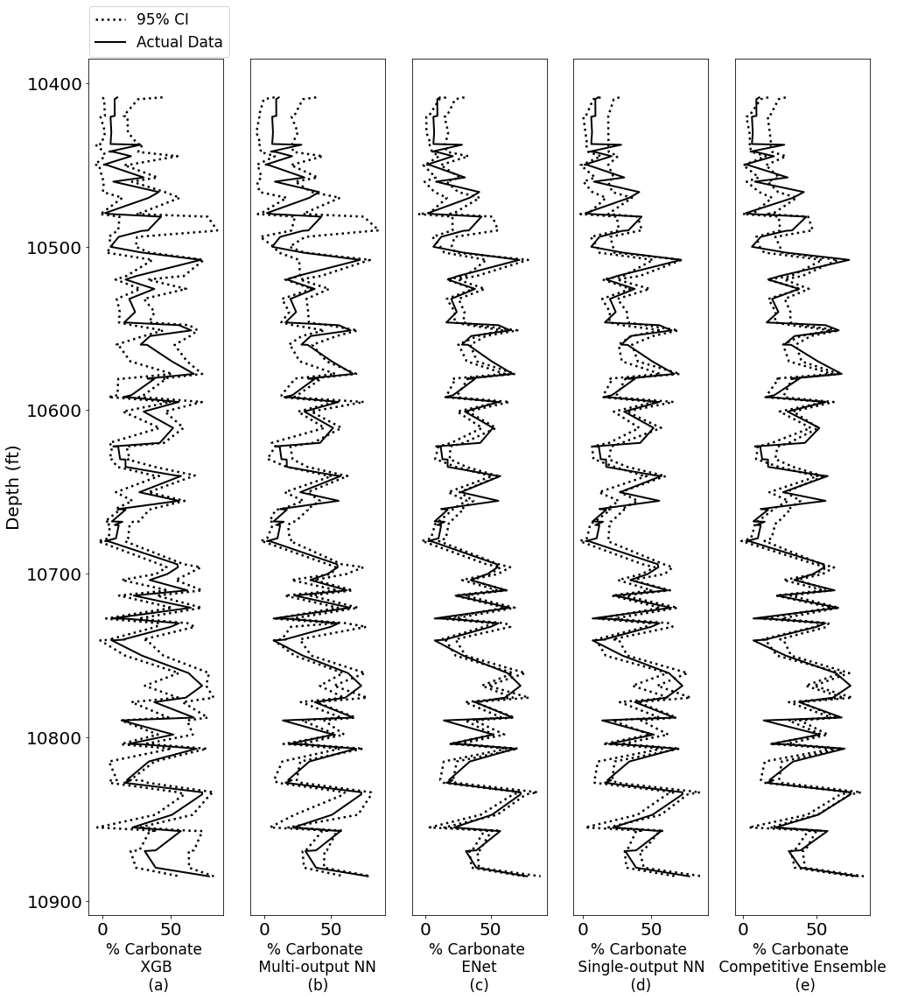

In [ ]:


import matplotlib

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 


a = 1
# otp_df_ = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df1 = pd.read_excel('XRF_Data.xlsx')
temp = 2*df1.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df1.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df


# plt.figure(figsize = (4,14))
# # plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
# plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

# fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: SiO2-%')
# ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # , label = 'Mean + 3*Std Dev '
ax1.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
ax1.invert_yaxis()
ax1.set(xlabel='% Carbonate \n XGB \n (a)', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
ax1.xaxis.label.set_size(17)


ax1.xaxis.label.set_size(17)
ax1.yaxis.label.set_size(20)


temp = 2*df2.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df2.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


ax2.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax2.plot(plus,dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax2.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.invert_yaxis()
ax2.set(xlabel='% Carbonate \n Multi-output NN \n (b) ') # , ylabel='Depth (ft)'
ax2.set_yticks([], [])  # same for y ticks
ax2.xaxis.label.set_size(17)
# ax2.plot( df2.iloc[:,2], df2.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
# # ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
# ax2.set(xlabel='% of Calcium Oxide', ylabel='Depth (ft)')
# ax2.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Calcium Oxide ')
# # plt.ylabel('Depth (ft)')




temp = 2*df3.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df3.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax3.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax3.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax3.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax3.legend()
ax3.invert_yaxis()
ax3.set(xlabel='% Carbonate \n ENet \n (c) ') # , ylabel='Depth (ft)'
ax3.set_yticks([], [])  # same for y ticks
ax3.xaxis.label.set_size(17)


temp = 2*df4.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df4.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax4.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax4.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax4.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax4.legend()
ax4.invert_yaxis()
ax4.set(xlabel='% Carbonate \n Single-output NN \n (d) ') # , ylabel='Depth (ft)'
ax4.set_yticks([], [])  # same for y ticks
ax4.xaxis.label.set_size(17)


temp = 2*df5.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df5.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax5.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax5.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax5.plot(df_o.iloc[:,int(a)], dep, label = 'Actual Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax5.legend()
ax5.invert_yaxis()
ax5.set(xlabel='% Carbonate \n Competitive Ensemble \n (e)') # , ylabel='Depth (ft)'
ax5.set_yticks([], [])  # same for y ticks


ax5.legend(prop={"size":17}, bbox_to_anchor=(-3.7,1.07))
ax5.xaxis.label.set_size(17)

# plt.show() 
plt.savefig("Carbonate_overlap_ps.ps")

# labels = ['Sending Data', 'Not Sending Data'] #legend labels to be plotted
# colors = ['green', 'red']


# plt.legend(labels, bbox_to_anchor=(2.3, 2), prop={'size':14}) #show the legend defined in labels
# #change values of 'bbox_to_anchor' to move the legend to the desired location

# plt.axis('equal') # Set aspect ratio to be equal so that pie is drawn as a circle.
# plt.tight_layout()
# plt.subplots_adjust(right=0.94) #adjust the spacing on right to see legend clearly
# plt.show()







In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving enet_Clay_df_overlap_1-10trials_wommm.csv to enet_Clay_df_overlap_1-10trials_wommm.csv
Saving Ensemble_clay_df_overlap_1-10trials.csv to Ensemble_clay_df_overlap_1-10trials.csv
Saving NN_Clay_mean_median.csv to NN_Clay_mean_median.csv
Saving tinput.dat to tinput (2).dat
Saving toutput.dat to toutput (2).dat
Saving try_multiple_clay.xlsx to try_multiple_clay.xlsx
Saving XGB_Clay_df_overlap_1-10trials_wommm.csv to XGB_Clay_df_overlap_1-10trials_wommm.csv


In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

In [ ]:
df3 = pd.read_csv('enet_Clay_df_overlap_1-10trials_wommm.csv', header = None)
df5 = pd.read_csv('Ensemble_clay_df_overlap_1-10trials.csv', header = None)
df4 = pd.read_csv('NN_Clay_mean_median.csv', header = None)
df1 = pd.read_csv('XGB_Clay_df_overlap_1-10trials_wommm.csv', header = None)
df2 = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df6 = pd.read_excel('XRF_Data.xlsx')
# df7 = pd.read_excel('XRF_Data.xlsx')

In [ ]:
# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:91: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:129: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:154: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:177: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor r

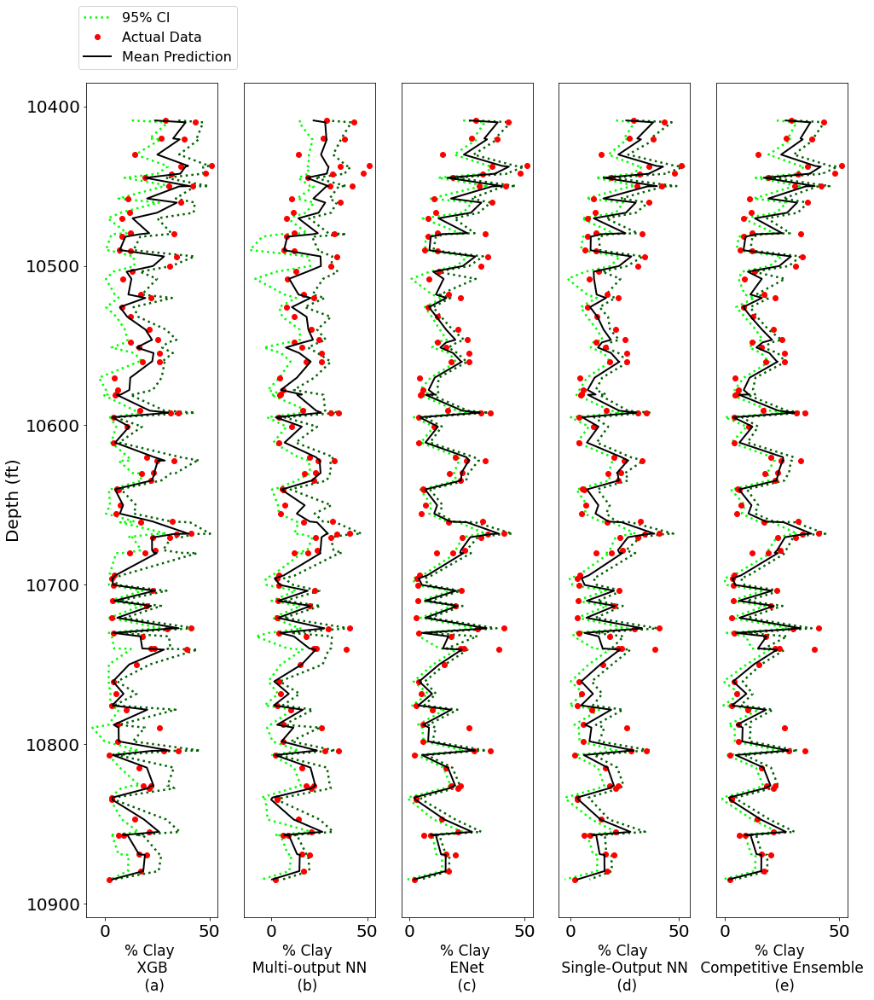

In [ ]:
import matplotlib

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

a = 2
# otp_df_ = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df1 = pd.read_excel('XRF_Data.xlsx')
temp = 2*df1.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df1.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df


# plt.figure(figsize = (4,14))
# # plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
# plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

# fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: SiO2-%')
# ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax1.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # , label = 'Mean + 3*Std Dev '
ax1.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax1.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000') 

# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()

ax1.invert_yaxis()
# # ax1.gca('ydir',reverse)
# # ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
# ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )




ax1.set(xlabel='% Clay \n XGB \n (a)', ylabel='Depth (ft)')
# ax1.legend(prop={"size":13})
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
ax1.xaxis.label.set_size(17)
ax1.yaxis.label.set_size(20)


temp = 2*df2.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df2.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


ax2.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax2.plot(plus,dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax2.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000')
ax2.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax2.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000')

# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.invert_yaxis()
ax2.set(xlabel='% Clay \n  Multi-output NN  \n (b)  ') # , ylabel='Depth (ft)'
ax2.set_yticks([], [])  # same for y ticks


# ax1.set(xlabel='% Quartz \n XGB \n (a)', ylabel='Depth (ft)')

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
# ax2.legend(prop={"size":13})
ax2.xaxis.label.set_size(17)

# ax2.plot( df2.iloc[:,2], df2.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
# # ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
# ax2.set(xlabel='% of Calcium Oxide', ylabel='Depth (ft)')
# ax2.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Calcium Oxide ')
# # plt.ylabel('Depth (ft)')




temp = 2*df3.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df3.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax3.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax3.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax3.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000')
ax3.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax3.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax3.legend()
ax3.invert_yaxis()
ax3.set(xlabel='% Clay \n ENet \n (c) ') # , ylabel='Depth (ft)'
ax3.set_yticks([], [])  # same for y ticks

# ax3.legend(prop={"size":13})
ax3.xaxis.label.set_size(17)




temp = 2*df4.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df4.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax4.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax4.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
# ax4.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
ax4.plot(df_o.iloc[:,int(a)], dep, 'ro', label = 'Test Data', linewidth=2 ) # , color = '#000000') 
ax4.plot(mean, dep, label = 'Mean Data', linewidth=2 , color = '#000000')

# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax4.legend()
ax4.invert_yaxis()
ax4.set(xlabel='% Clay \n Single-Output NN \n (d)') # , ylabel='Depth (ft)'
ax4.set_yticks([], [])  # same for y ticks

# ax4.legend(prop={"size":13})
ax4.xaxis.label.set_size(17)



temp = 2*df5.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df5.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax5.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#00FF00')
ax5.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#006400' ) # label = 'Mean + 3*Std Dev '
ax5.plot(df_o.iloc[:,int(a)], dep, 'ro',label = 'Actual Data') # linewidth=2 , color = '#000000') 
# 000000
ax5.plot(mean, dep, label = 'Mean Prediction', linewidth=2, color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax5.legend()
ax5.invert_yaxis()
ax5.set(xlabel='% Clay \n Competitive Ensemble \n (e)') # , ylabel='Depth (ft)'
ax5.set_yticks([], [])  # same for y ticks

ax5.legend(prop={"size":16}, bbox_to_anchor=(-3.6,1.1))
ax5.xaxis.label.set_size(17)

# plt.show() 
plt.savefig("Clay_overlap_ps.ps")

# labels = ['Sending Data', 'Not Sending Data'] #legend labels to be plotted
# colors = ['green', 'red']


# plt.legend(labels, bbox_to_anchor=(2.3, 2), prop={'size':14}) #show the legend defined in labels
# #change values of 'bbox_to_anchor' to move the legend to the desired location

# plt.axis('equal') # Set aspect ratio to be equal so that pie is drawn as a circle.
# plt.tight_layout()
# plt.subplots_adjust(right=0.94) #adjust the spacing on right to see legend clearly
# plt.show()




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:85: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:113: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:131: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:149: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor r

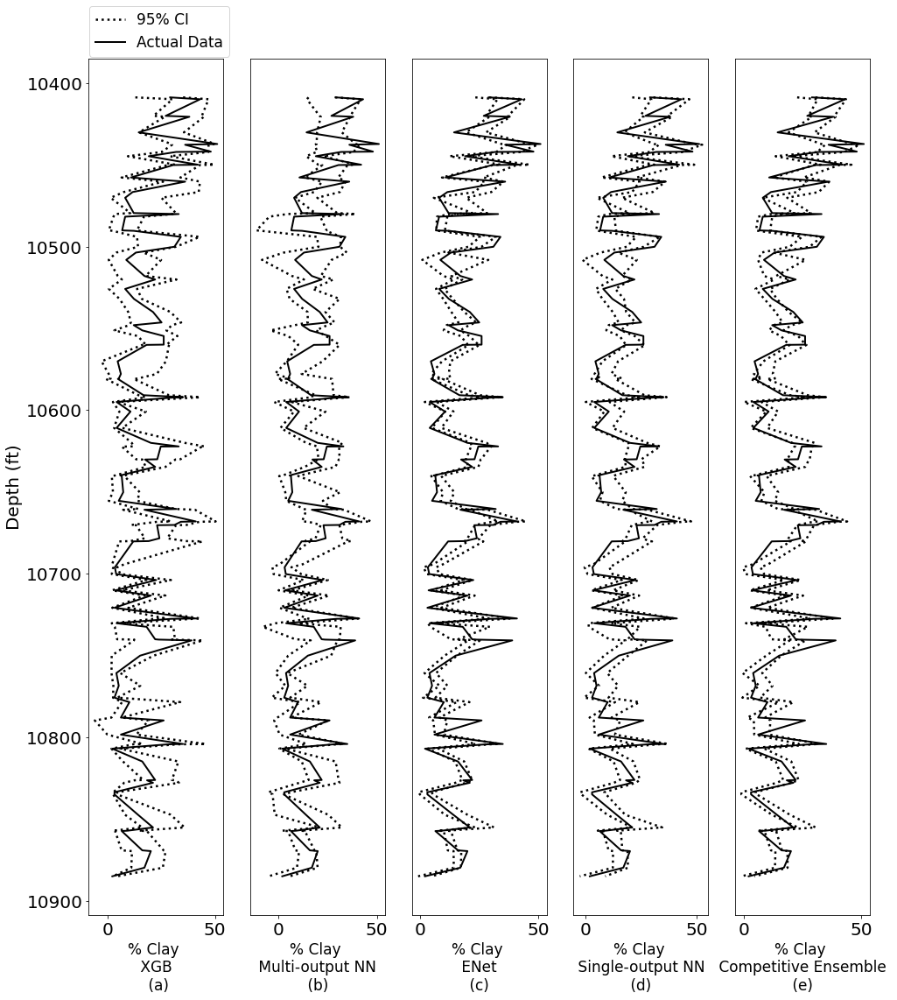

In [ ]:



import matplotlib

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 




a = 2
# otp_df_ = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df1 = pd.read_excel('XRF_Data.xlsx')
temp = 2*df1.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df1.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df


# plt.figure(figsize = (4,14))
# # plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
# plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

# fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: SiO2-%')
# ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # , label = 'Mean + 3*Std Dev '
ax1.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
ax1.invert_yaxis()
ax1.set(xlabel='% Clay \n XGB \n (a)', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')



ax1.xaxis.label.set_size(17)
ax1.yaxis.label.set_size(20)


temp = 2*df2.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df2.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


ax2.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax2.plot(plus,dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax2.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.invert_yaxis()
ax2.set(xlabel='% Clay \n Multi-output NN \n (b) ') # , ylabel='Depth (ft)'
ax2.set_yticks([], [])  # same for y ticks
ax2.xaxis.label.set_size(17)

# ax2.plot( df2.iloc[:,2], df2.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
# # ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
# ax2.set(xlabel='% of Calcium Oxide', ylabel='Depth (ft)')
# ax2.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Calcium Oxide ')
# # plt.ylabel('Depth (ft)')




temp = 2*df3.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df3.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax3.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax3.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax3.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax3.legend()
ax3.invert_yaxis()
ax3.set(xlabel='% Clay \n ENet \n (c) ') # , ylabel='Depth (ft)'
ax3.set_yticks([], [])  # same for y ticks
ax3.xaxis.label.set_size(17)


temp = 2*df4.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df4.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax4.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax4.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax4.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax4.legend()
ax4.invert_yaxis()
ax4.set(xlabel='% Clay \n Single-output NN \n (d) ') # , ylabel='Depth (ft)'
ax4.set_yticks([], [])  # same for y ticks
ax4.xaxis.label.set_size(17)


temp = 2*df5.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df5.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax5.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax5.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax5.plot(df_o.iloc[:,int(a)], dep, label = 'Actual Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax5.legend()
ax5.invert_yaxis()
ax5.set(xlabel='% Clay \n Competitive Ensemble \n (e) ') # , ylabel='Depth (ft)'
ax5.set_yticks([], [])  # same for y ticks




ax5.legend(prop={"size":17}, bbox_to_anchor=(-3.7,1.07))
ax5.xaxis.label.set_size(17)

# plt.show() 
plt.savefig("clay_overlap_ps.ps")





In [ ]:
# 3 array

# bar plot 

# 3 b plot 


# labelling 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
  
N = 7
ind = np.arange(N) 
width = 0.25
  
xvals = [7.5, 2, 1.8, 1.6, 1.6, 1.6, 8.6]
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = [10, 20, 30]
bar2 = plt.bar(ind+width, yvals, width, color='g')
  
zvals = [11, 12, 13]
bar3 = plt.bar(ind+width*2, zvals, width, color = 'b')
  
plt.xlabel("Dates")
plt.ylabel(' Anova Scores')
plt.title("Players Score")
  
plt.xticks(ind+width,['2021Feb01', '2021Feb02', '2021Feb03'])
plt.legend( (bar1, bar2, bar3), ('Player1', 'Player2', 'Player3') )
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


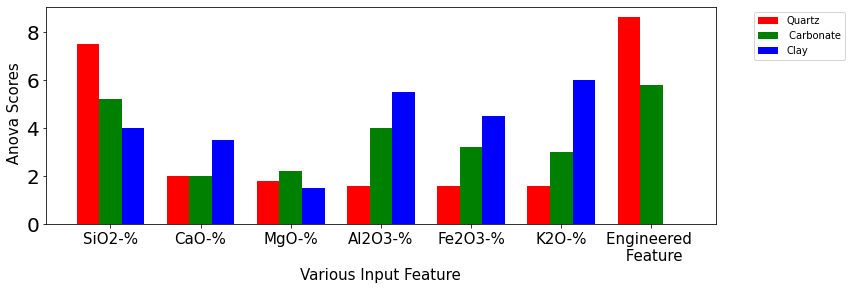

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize = (12,4))

N = 7#
ind = np.arange(N) 
width = 0.25
  
xvals = [7.5, 2, 1.8, 1.6, 1.6, 1.6, 8.6]#
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = [5.2, 2, 2.2, 4, 3.2, 3, 5.8]#
bar2 = plt.bar(ind+width, yvals, width, color='g')
  
zvals = [4, 3.5, 1.5, 5.5, 4.5, 6, 0]#
bar3 = plt.bar(ind+width*2, zvals, width, color = 'b')
  
plt.xlabel("Various Input Feature", fontsize=15)#
plt.ylabel(' Anova Scores', fontsize=15)#
# plt.title("Players Sc#ore")
  
plt.xticks(ind+width,['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%', 'Engineered \n Feature'], fontsize=15)    #
plt.legend( (bar1, bar2, bar3), ('Quartz' , ' Carbonate' , 'Clay') , bbox_to_anchor=(1.05, 1.0), loc='upper left', fontsize=10)      # 
# plt.show()       # 

# plt.show() 
plt.savefig("bar_plot.ps")


In [ ]:
dep

0      10408.85
1      10410.00
2      10420.15
3      10420.70
4      10430.25
         ...   
99     10857.20
100    10869.00
101    10869.45
102    10879.60
103    10884.85
Name: depthi, Length: 104, dtype: float64

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving XRF_Data.xlsx to XRF_Data.xlsx


In [ ]:
df1 = pd.read_excel('XRF_Data.xlsx')

NameError: ignored

([], [])

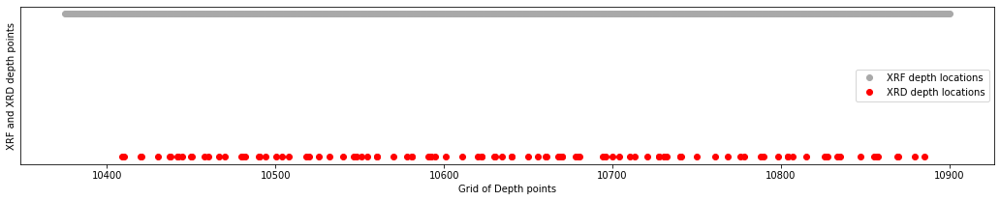

In [ ]:

from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.



import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor






df1 = pd.read_excel('XRF_Data.xlsx')

# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

plt.figure(figsize= (18, 3))
plt.plot(  df1.iloc[:,0],2*np.ceil(df1.iloc[:,1]/100),'ro', color = '#A9A9A9', label = 'XRF depth locations')
plt.plot(  df_o.iloc[:,0], np.ceil(df_o.iloc[:,1]/100) ,'ro', label = 'XRD depth locations') #     df1.iloc[:,1] 

plt.legend()
plt.xlabel('Grid of Depth points')
plt.ylabel('XRF and XRD depth points')
# plt.yticks(('xrd' , 'xrf'))
plt.yticks([], [])  # same for y ticks


# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving tinput.dat to tinput (1).dat
Saving toutput.dat to toutput (1).dat


In [ ]:
# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
# df_o = df_o.drop(['deptho'], axis = 1)
# dep = df_i['depthi']
# df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

Text(0, 0.5, 'Depth (ft)')

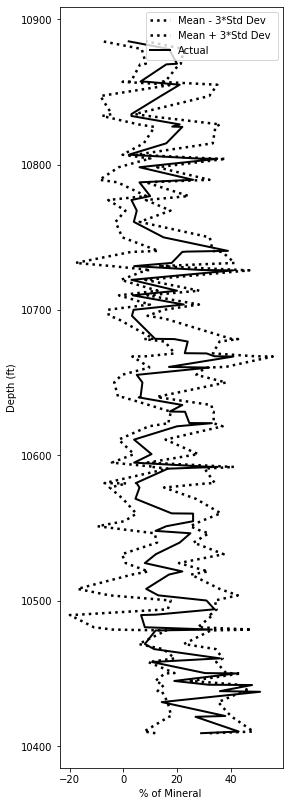

In [ ]:
a = 2
otp_df = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df1 = pd.read_excel('XRF_Data.xlsx')
temp = 3*otp_df.std(axis=1)
otp_df['mean'] = otp_df.mean(axis = 1 )
plus =  otp_df['mean']+ temp
minus  = otp_df['mean'] - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df

plt.figure(figsize = (4,14))
# plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('% of Mineral ')
plt.ylabel('Depth (ft)')

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving tinput.dat to tinput.dat
Saving toutput.dat to toutput.dat
Saving XRF_Data.xlsx to XRF_Data.xlsx


In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

In [ ]:
# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

In [ ]:
df1 = pd.read_excel('XRF_Data.xlsx')
df1 = df1.fillna(df1.mean())


In [ ]:
df1 = df1.fillna(df1.mean())

In [ ]:
df1

,Median Depth- ftMD,SiO2-%,CaO-%,MgO-%,Al2O3-%,Fe2O3-%,K2O-%
0,10375,45.01,17.05,1.21,10.25,5.42,2.89
1,10376,49.70,12.13,1.07,11.65,5.44,3.38
2,10377,47.31,14.09,1.56,11.45,5.63,3.08
3,10378,50.38,11.61,0.94,12.30,5.33,3.59
4,10379,47.84,13.80,1.18,11.81,5.11,3.37
...,...,...,...,...,...,...,...
521,10896,26.47,23.40,NaN,1.95,0.67,0.28
522,10897,60.13,8.78,0.82,6.33,1.56,1.21
523,10898,42.54,16.89,NaN,3.12,0.81,0.52
524,10899,33.89,21.29,NaN,1.13,0.52,0.14


In [ ]:
c = df1[::-1]

In [ ]:
df1.iloc[:,0]

0      10375
1      10376
2      10377
3      10378
4      10379
       ...  
521    10896
522    10897
523    10898
524    10899
525    10900
Name: Median Depth- ftMD, Length: 526, dtype: int64

No handles with labels found to put in legend.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:39: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:59: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the pa

[]

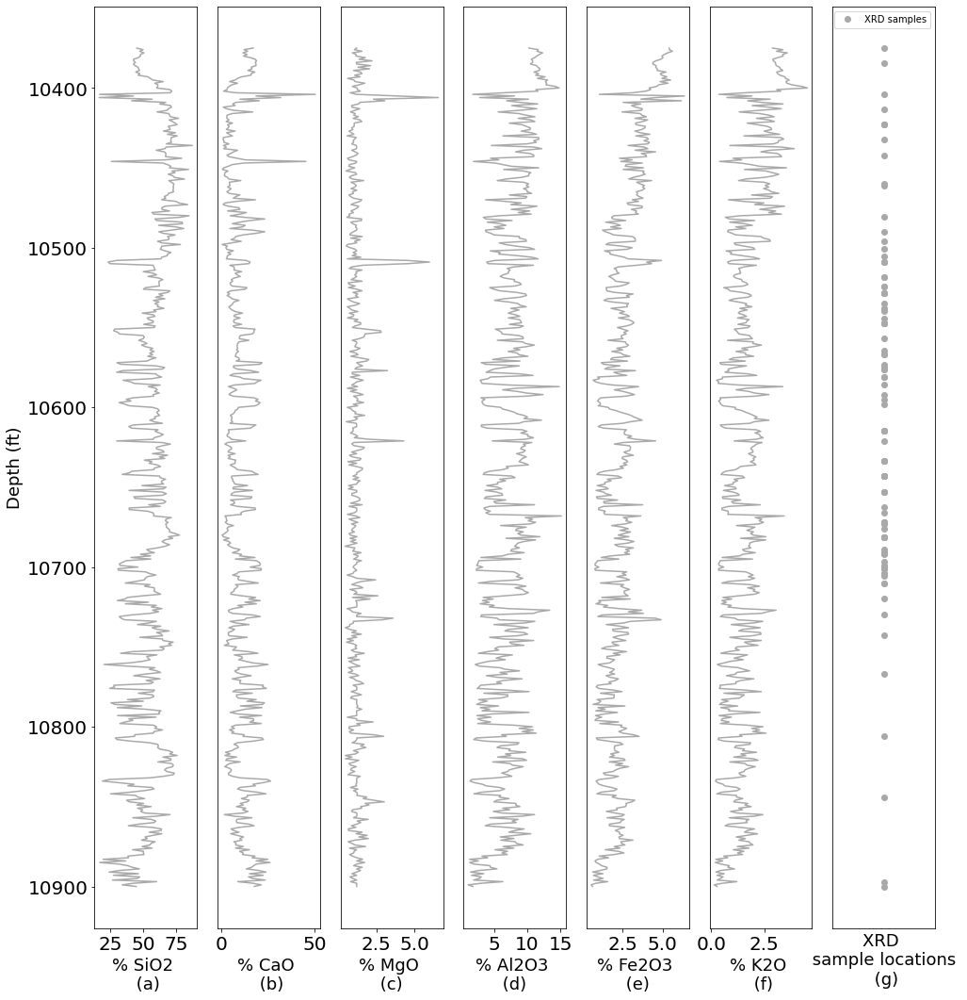

In [ ]:

import matplotlib

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 


fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(1, 7, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

plt.legend(loc=2, prop={'size': 12})
fig.figsize= (4,18)
ax1.plot( df1.iloc[:,1], df1.iloc[:,0], color = '#A9A9A9', label = 'XRF: SiO2-%')
ax1.invert_yaxis()
# ax1.gca('ydir',reverse)
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )
ax1.xaxis.label.set_size(18)
ax1.yaxis.label.set_size(18)

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')


ax2.plot( df1.iloc[:,2], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
ax2.invert_yaxis()
# ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.set(xlabel='% CaO \n (b)' ) # , ylabel='Depth (ft)')
ax2.xaxis.label.set_size(18)
# ax1.yaxis.label.set_size(14)

ax2.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Calcium Oxide ')
# plt.ylabel('Depth (ft)')

ax3.plot( df1.iloc[:,3], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF : MgO-%')
ax3.invert_yaxis()
# ax3.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax3.legend()
ax3.set(xlabel='% MgO \n (c) ' ) # , ylabel='Depth (ft)')
ax3.xaxis.label.set_size(18)
ax3.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Magnesium Oxide ')
# plt.ylabel('Depth (ft)')

ax4.plot( df1.iloc[:,4], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: Al2O3-%')
ax4.invert_yaxis()
# ax4.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax4.legend()
ax4.xaxis.label.set_size(18)
ax4.set(xlabel='% Al2O3 \n (d) ' ) # , ylabel='Depth (ft)')
ax4.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Alluminium Oxide ')
# plt.ylabel('Depth (ft)')

ax5.plot( df1.iloc[:,5], df1.iloc[:,0], color = '#A9A9A9', label = 'XRF: Fe2O3-%')
ax5.invert_yaxis()
# ax5.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax5.legend()
ax5.xaxis.label.set_size(18)
ax5.set(xlabel='% Fe2O3 \n (e) ' ) # , ylabel='Depth (ft)')
ax5.set_yticks([], [])  # same for y ticks
# ax5.xlabel('% of Iron Oxide ')
# plt.ylabel('Depth (ft)')

ax6.plot( df1.iloc[:,6], df1.iloc[:,0], color = '#A9A9A9', label = 'XRF: K2O-%')
ax6.invert_yaxis()
# ax6.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
# ax6.legend()
ax6.xaxis.label.set_size(18)
ax6.set(xlabel='% K2O \n (f)' ) # , ylabel='Depth (ft)')
ax6.set_yticks([], [])  # same for y ticks
# plt.xlabel('% of Pottasium Oxide ')
# plt.ylabel('Depth (ft)')



# ax6.legend(prop={"size":17}, bbox_to_anchor=(-3.8,1.07))
# ax6.xaxis.label.set_size(17)
# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

# plt.figure(figsize= (18, 3))
# ax7.plot(  2*np.ceil(df1.iloc[:,1]/100),df1.iloc[:,0],'ro', color = '#A9A9A9', label = 'XRF depth locations')

ax7.plot(   np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0],'o',color = '#A9A9A9', label = 'XRD samples') #     df1.iloc[:,1] 
ax7.invert_yaxis()
ax7.legend()
ax7.xaxis.label.set_size(18)
ax7.set(xlabel='XRD \n sample locations \n (g)' ) # , ylabel='Depth (ft)')

# ax7.xlabel('Grid of Depth points')
# ax7.ylabel('XRF and XRD depth points')
# plt.yticks(('xrd' , 'xrf'))
ax7.set_yticks([], [])  # same for y ticks
ax7.set_xticks([], [])  # same for y ticks

# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')




In [ ]:
import matplotlib

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

a = 0
# otp_df_ = pd.read_excel('try_multiple_clay.xlsx', header = None)
# df1 = pd.read_excel('XRF_Data.xlsx')
temp = 2*df1.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df1.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df


# plt.figure(figsize = (4,14))
# # plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
# plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

# fig.figsize= (4,18)
# ax1.plot( df1.iloc[:,1], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: SiO2-%')
# ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax1.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # , label = 'Mean + 3*Std Dev '
ax1.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()

ax1.invert_yaxis()
# # ax1.gca('ydir',reverse)
# # ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax1.legend()
# ax1.set(xlabel='% SiO2 \n (a)', ylabel='Depth (ft)' )




ax1.set(xlabel='% Quartz \n XGB \n (a)', ylabel='Depth (ft)')
# ax1.legend(prop={"size":13})
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
ax1.xaxis.label.set_size(17)
ax1.yaxis.label.set_size(20)


temp = 2*df2.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df2.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]


ax2.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax2.plot(plus,dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax2.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
ax2.invert_yaxis()
ax2.set(xlabel='% Quartz \n  Single NN  \n (b)  ') # , ylabel='Depth (ft)'
ax2.set_yticks([], [])  # same for y ticks


# ax1.set(xlabel='% Quartz \n XGB \n (a)', ylabel='Depth (ft)')

# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')
# ax1.title.set_text('First Plot')
# ax2.legend(prop={"size":13})
ax2.xaxis.label.set_size(17)

# ax2.plot( df2.iloc[:,2], df2.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
# # ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax2.legend()
# ax2.set(xlabel='% of Calcium Oxide', ylabel='Depth (ft)')
# ax2.set_yticks([], [])  # same for y ticks
# # plt.xlabel('% of Calcium Oxide ')
# # plt.ylabel('Depth (ft)')




temp = 2*df3.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df3.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax3.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax3.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax3.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax3.legend()
ax3.invert_yaxis()
ax3.set(xlabel='% Quartz \n ENet \n (c) ') # , ylabel='Depth (ft)'
ax3.set_yticks([], [])  # same for y ticks

# ax3.legend(prop={"size":13})
ax3.xaxis.label.set_size(17)




temp = 2*df4.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df4.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax4.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax4.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax4.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
# ax4.legend()
ax4.invert_yaxis()
ax4.set(xlabel='% Quartz \n Individual NN \n (d)') # , ylabel='Depth (ft)'
ax4.set_yticks([], [])  # same for y ticks

# ax4.legend(prop={"size":13})
ax4.xaxis.label.set_size(17)



temp = 2*df5.std(axis=1)
# df1['mean'] = df1.mean(axis = 1 )
mean = df5.mean(axis = 1 )
plus =  mean + temp
minus  = mean  - temp
actual  = df_o.iloc[:,int(a)]

ax5.plot(minus, dep,label = '95% CI' ,linewidth=2.5, linestyle=':',color= '#000000')
ax5.plot(plus, dep, linewidth=2.5, linestyle=':', color = '#000000' ) # label = 'Mean + 3*Std Dev '
ax5.plot(df_o.iloc[:,int(a)], dep, label = 'Test Data', linewidth=2 , color = '#000000') 
# 3x1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax5.legend()
ax5.invert_yaxis()
ax5.set(xlabel='% Quartz \n Competitive Ensemble \n (e)') # , ylabel='Depth (ft)'
ax5.set_yticks([], [])  # same for y ticks

ax5.legend(prop={"size":17}, bbox_to_anchor=(-3.8,1.07))
ax5.xaxis.label.set_size(17)

# labels = ['Sending Data', 'Not Sending Data'] #legend labels to be plotted
# colors = ['green', 'red']


# plt.legend(labels, bbox_to_anchor=(2.3, 2), prop={'size':14}) #show the legend defined in labels
# #change values of 'bbox_to_anchor' to move the legend to the desired location

# plt.axis('equal') # Set aspect ratio to be equal so that pie is drawn as a circle.
# plt.tight_layout()
# plt.subplots_adjust(right=0.94) #adjust the spacing on right to see legend clearly
# plt.show()




In [ ]:
plt.plot()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdceba57590>,
      dtype=object)

<Figure size 720x720 with 0 Axes>

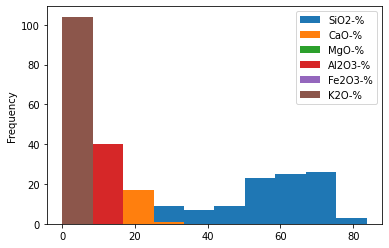

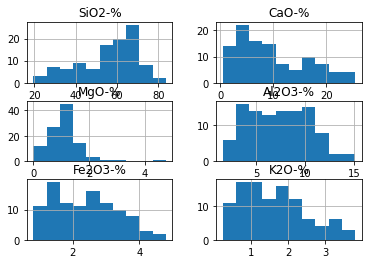

In [ ]:
plt.figure(figsize = (10,10))
df_i.plot.hist()

df_i.hist()

# https://www.machinelearningplus.com/pandas/pandas-histogram/




array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdcebd7cb50>,
      dtype=object)

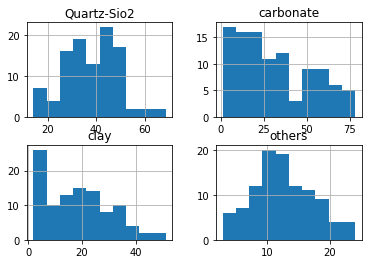

In [ ]:
df_o.hist()

In [ ]:

  # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
  #               sep="\s+")


  # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
  #                 sep="\s+")
  # df_i = pd.DataFrame(Df_i)
  # df_o = pd.DataFrame(Df_o)

  # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  # df_o = df_o.drop(['deptho'], axis = 1)
  # dep = df_i['depthi']
  # df_i = df_i.drop(['depthi'], axis = 1)

b = 2000
a = 0
test_sz = 8 
from scipy import stats 
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
max_rat_val = -9999999999999
max_rat = 0 
max_rat1 = 0 
X1 = pd.DataFrame(X_train)
Y1 = pd.DataFrame(Y_train)
# print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
# print(Y1.columns)
for rat1 in np.linspace(1,8,20):
  for rat in np.linspace(1,8,20):
    curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
    # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
    if curr > max_rat_val :
      max_rat = rat
      max_rat1 = rat1
      max_rat_val = curr 
print(max_rat_val,max_rat, max_rat1) 

# plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

# plt.figure()
# plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


X1 = pd.DataFrame(X_test)
Y1 = pd.DataFrame(Y_test)

print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
# plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

# plt.figure()
# plt.scatter()

# r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
# # df_i['SiO2-%'] 
# r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


# r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
# # df_i['SiO2-%'] 
# r2_score(df_i['MgO-%'] , df_o['carbonate'])

# pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
# print(pearson_coef, p_value)

# df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
# # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

# df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
# df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)



0.11761820772585507 8.0 1.0
0.5211657205516687


In [ ]:
df_i

,SiO2-%,CaO-%,MgO-%,Al2O3-%,Fe2O3-%,K2O-%,new-mg-ca
0,63.102594,9.620468,1.675737,8.592423,3.080196,2.284424,22.940364
1,62.396375,6.120453,1.343693,11.574918,3.631042,3.386245,19.011420
2,70.005880,3.901533,1.457398,10.608489,4.025748,2.767634,12.592249
3,71.318842,3.084358,1.517102,10.944784,3.852273,2.906143,10.977959
4,74.660661,4.754999,0.738446,7.683027,3.494631,1.976992,12.184688
...,...,...,...,...,...,...,...
99,44.740124,14.780853,1.210927,5.216293,1.737034,1.035603,47.270946
100,51.260063,11.870366,1.358606,5.938602,2.259193,1.179684,39.362458
101,52.035423,10.961723,1.639594,6.856778,2.278216,1.374655,37.454927
102,50.277640,11.441832,0.870714,6.689821,2.209319,1.380866,39.442353


In [ ]:
b =  2000
a = 1
test_sz = 2
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from matplotlib import pyplot

In [ ]:
...
# configure to select all features
fs = SelectKBest(score_func=f_classif, k='all')
# learn relationship from training data
fs.fit(X_train, Y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)

Feature 0: 5.456691
Feature 1: 2.139100
Feature 2: 2.369091
Feature 3: 4.145903
Feature 4: 3.315527
Feature 5: 3.048617
Feature 6: 5.743460


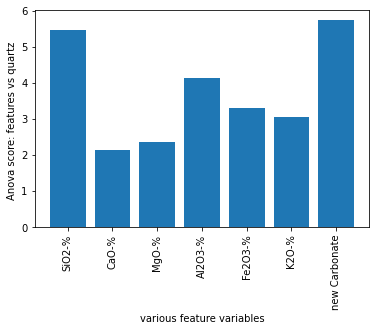

In [ ]:
b =  2000
a = 1
test_sz = 2
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  



from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from matplotlib import pyplot

...
# configure to select all features
fs = SelectKBest(score_func=f_classif, k='all')
# learn relationship from training data
fs.fit(X_train, Y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)


#...
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
 
 
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.ylabel("Anova score: features vs quartz ")
pyplot.xlabel("various feature variables")


labels = ['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%', 'new Carbonate']
  
# plt.plot(x, y)
  
# You can specify a rotation for the tick
# labels in degrees or with keywords.
plt.xticks(range(len(fs.scores_)), labels, rotation ='vertical')
# pyplot.xticks('SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%')
pyplot.show()


# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize = (12,4))

N = 7#
ind = np.arange(N) 
width = 0.25
  
xvals = [7.5, 2, 1.8, 1.6, 1.6, 1.6, 8.6]#
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = [5.2, 2, 2.2, 4, 3.2, 3, 5.8]#
bar2 = plt.bar(ind+width, yvals, width, color='g')
  
zvals = [4, 3.5, 1.5, 5.5, 4.5, 6, 0]#
bar3 = plt.bar(ind+width*2, zvals, width, color = 'b')
  
plt.xlabel("Various Input Feature", fontsize=15)#
plt.ylabel(' Anova Scores', fontsize=15)#
# plt.title("Players Sc#ore")
  
plt.xticks(ind+width,['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%', 'Engineered \n Feature'], fontsize=15)    #
plt.legend( (bar1, bar2, bar3), ('Quartz' , ' Carbonate' , 'Clay') , bbox_to_anchor=(1.05, 1.0), loc='upper left', fontsize=10)      # 
# plt.show()       # 

# plt.show() 
plt.savefig("bar_plot.ps")




In [ ]:
 # features selection model uses anova (and) domain knowledge together. 


In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif

In [ ]:
...
# configure to select all features
fs = SelectKBest(score_func=mutual_info_classif, k='all')
# learn relationship from training data
fs.fit(X_train, Y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)

In [ ]:
X_test_fs

In [ ]:
X_test

In [ ]:
# example of anova f-test feature selection for numerical data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from matplotlib import pyplot

# # load the dataset
# def load_dataset(filename):
# 	# load the dataset as a pandas DataFrame
# 	data = read_csv(filename, header=None)
# 	# retrieve numpy array
# 	dataset = data.values
# 	# split into input (X) and output (y) variables
# 	X = dataset[:, :-1]
# 	y = dataset[:,-1]
# 	return X, y

# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=f_classif, k='all')
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# load the dataset
X, y = load_dataset('pima-indians-diabetes.csv')
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

In [ ]:
# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 1
test_sz = 8 
count = 0 
for b in [6000]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
  #               sep="\s+")


  # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
  #                 sep="\s+")
  # df_i = pd.DataFrame(Df_i)
  # df_o = pd.DataFrame(Df_o)

  # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  # df_o = df_o.drop(['deptho'], axis = 1)
  # dep = df_i['depthi']
  # df_i = df_i.drop(['depthi'], axis = 1)
  # # b = 2000
  # # a = 0
  # # test_sz = 8 
  # from scipy import stats 
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # max_rat_val = -9999999999999
  # max_rat = 0 
  # max_rat1 = 0 
  # X1 = pd.DataFrame(X_train)
  # Y1 = pd.DataFrame(Y_train)
  # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # # print(Y1.columns)
  # for rat1 in np.linspace(1,8,20):
  #   for rat in np.linspace(1,8,20):
  #     curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
  #     # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
  #     if curr > max_rat_val :
  #       max_rat = rat
  #       max_rat1 = rat1
  #       max_rat_val = curr 
  # print(max_rat_val,max_rat, max_rat1) 

  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # # plt.figure()
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  # X1 = pd.DataFrame(X_test)
  # Y1 = pd.DataFrame(Y_test)

  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # # plt.figure()
  # # plt.scatter()

  # # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # # print(pearson_coef, p_value)

  # df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  # df_i = df_i.drop(['SiO2-%'], axis = 1)
  # df_i = df_i.drop(['CaO-%'], axis = 1)
  # df_i = df_i.drop(['MgO-%'], axis = 1)
  # df_i = df_i.drop(['Al2O3-%'], axis = 1)
  # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  # df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o, random_state = int(b), test_size= (test_sz/10))

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [  (8,4,2), ( 16,8,4,2) , (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000, 5000, 10000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  a1 = model_cv.predict(df_i)
  print(model_cv.best_params_)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









In [ ]:
# Y_pred_N_1
from numpy import savetxt
savetxt('multi_trial_fds_6000.csv', a1, delimiter=',')

In [ ]:

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
# df_o = df_o.drop(['deptho'], axis = 1)
# dep = df_i['depthi']
# df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files.

Saving tinput.dat to tinput.dat
Saving toutput.dat to toutput.dat


In [ ]:
hjklp

In [ ]:
df1 = pd.read_excel('XRF_Data.xlsx')

Text(0, 0.5, 'XRF and XRD depth points')

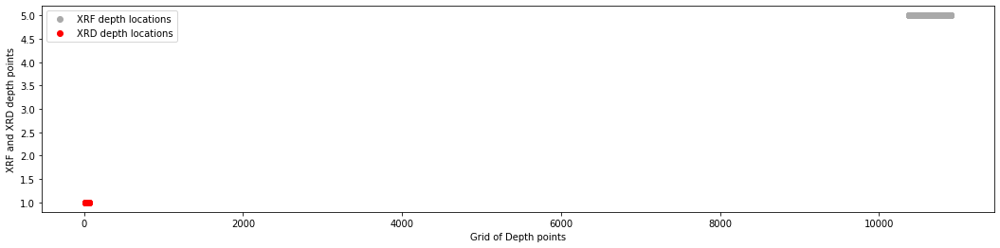

In [ ]:
# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

plt.figure(figsize= (18, 4))
plt.plot(  df1.iloc[:,0],5*np.ceil(df1.iloc[:,1]/100),'ro', color = '#A9A9A9', label = 'XRF depth locations')
plt.plot(  df_o.iloc[:,0], np.ceil(df_o.iloc[:,1]/100) ,'ro', label = 'XRD depth locations') #     df1.iloc[:,1] 
plt.legend()
plt.xlabel('Grid of Depth points')
plt.ylabel('XRF and XRD depth points')
# ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')

In [ ]:
# 505 input deths 
# 104 output depths 
dep_inp = array of XRF depths 
len_inp = len(dep_inp)
dep_output = array of xrd depths 
len_out = len(dep_out)
arr_xrf = np.ones(len_inp)

arr_xrd = np.ones(len_out)


plt.plot(dep_inp, arr_xrf, label = 'XRF depth locations ' )
plt.plot(dep_output, arr_xrd, label = 'XRD depth locations ' )
plt.legend()

plt.xlabel('Depth Grid Points')
plt.ylabel('Measured XRF and XRD depth points')


SyntaxError: ignored

In [ ]:
# now select only useful features for carbonate a = 1 

# # df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
# # df_i = df_i.drop(['CaO-%'], axis = 1)
# # df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
df_i = df_i.drop(['Fe2O3-%'], axis = 1)
df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
# add the prediction to the original data set 
# but load the data set first. 
# load into df 

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

NameError: ignored

In [ ]:
# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 0
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


  Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                  sep="\s+")
  df_i = pd.DataFrame(Df_i)
  df_o = pd.DataFrame(Df_o)

  df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  df_o = df_o.drop(['deptho'], axis = 1)
  dep = df_i['depthi']
  df_i = df_i.drop(['depthi'], axis = 1)

  # count = 6
  # col_name = 'ABC' + str(count)
  # df_i.insert( count,col_name, a2)

  # b = 2000
  # a = 0
  # test_sz = 8 
  from scipy import stats 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  max_rat_val = -9999999999999
  max_rat = 0 
  max_rat1 = 0 
  X1 = pd.DataFrame(X_train)
  Y1 = pd.DataFrame(Y_train)
  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # print(Y1.columns)
  for rat1 in np.linspace(1,8,20):
    for rat in np.linspace(1,8,20):
      curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
      # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
      if curr > max_rat_val :
        max_rat = rat
        max_rat1 = rat1
        max_rat_val = curr 
  print(max_rat_val,max_rat, max_rat1) 

  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # plt.figure()
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  X1 = pd.DataFrame(X_test)
  Y1 = pd.DataFrame(Y_test)

  print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # plt.figure()
  # plt.scatter()

  # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # df_i['SiO2-%'] 
  # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # print(pearson_coef, p_value)

  df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  df_i = df_i.drop(['SiO2-%'], axis = 1)
  df_i = df_i.drop(['CaO-%'], axis = 1)
  df_i = df_i.drop(['MgO-%'], axis = 1)
  df_i = df_i.drop(['Al2O3-%'], axis = 1)
  df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)

  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # a1 = model_cv.predict(df_i)
  # print(model_cv.best_params_)

  regr_nn =  ElasticNet()
  hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)
  a2 = model_cv.predict(df_i)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









0.6641705335232329 8.0 1.0
0.35568063145148965
test % is  8
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Elastic net training average is 0.7216137779918465 testing is  0.5966257838800869


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    2.3s finished


In [ ]:
# now select only useful features for carbonate a = 1 

# # df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
df_i

,Fe2O3-%,K2O-%,ABC6
0,3.080196,2.284424,20.657812
1,3.631042,3.386245,14.116614
2,4.025748,2.767634,6.157880
3,3.852273,2.906143,3.988760
4,3.494631,1.976992,6.033985
...,...,...,...
99,1.737034,1.035603,48.538313
100,2.259193,1.179684,38.612840
101,2.278216,1.374655,36.180316
102,2.209319,1.380866,38.183233


In [ ]:
# run the Model for carbonate 

from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 2
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
  #               sep="\s+")


  # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
  #                 sep="\s+")
  # df_i = pd.DataFrame(Df_i)
  # df_o = pd.DataFrame(Df_o)

  # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  # df_o = df_o.drop(['deptho'], axis = 1)
  # dep = df_i['depthi']
  # df_i = df_i.drop(['depthi'], axis = 1)
  # # b = 2000
  # # a = 0
  # # test_sz = 8 
  # from scipy import stats 
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # max_rat_val = -9999999999999
  # max_rat = 0 
  # max_rat1 = 0 
  # X1 = pd.DataFrame(X_train)
  # Y1 = pd.DataFrame(Y_train)
  # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # # print(Y1.columns)
  # for rat1 in np.linspace(1,8,20):
  #   for rat in np.linspace(1,8,20):
  #     curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
  #     # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
  #     if curr > max_rat_val :
  #       max_rat = rat
  #       max_rat1 = rat1
  #       max_rat_val = curr 
  # print(max_rat_val,max_rat, max_rat1) 

  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # # plt.figure()
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  # X1 = pd.DataFrame(X_test)
  # Y1 = pd.DataFrame(Y_test)

  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # # plt.figure()
  # # plt.scatter()

  # # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # # print(pearson_coef, p_value)

  # df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  # df_i = df_i.drop(['SiO2-%'], axis = 1)
  # df_i = df_i.drop(['CaO-%'], axis = 1)
  # df_i = df_i.drop(['MgO-%'], axis = 1)
  # df_i = df_i.drop(['Al2O3-%'], axis = 1)
  # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  # df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)

  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # a1 = model_cv.predict(df_i)
  # print(model_cv.best_params_)

  regr_nn =  ElasticNet()
  hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)
  a2 = model_cv.predict(df_i)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 









test % is  8
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Elastic net training average is 0.5384539104831314 testing is  0.7284090885671606


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    2.1s finished


In [ ]:
print("hello world")

hello world


In [ ]:
df1 = pd.read_excel('XRF_Data.xlsx')

Text(0, 0.5, 'Depth (ft)')

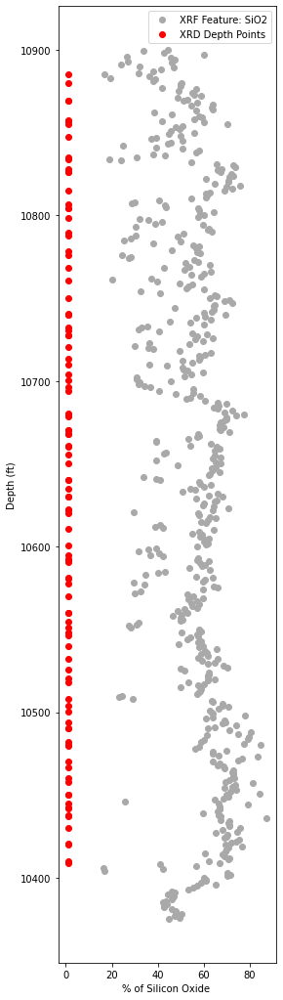

In [ ]:
import math

plt.figure(figsize= (4,18))
plt.plot( df1.iloc[:,1], df1.iloc[:,0], 'ro',color = '#A9A9A9', label = 'XRF Feature: SiO2')
plt.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depth Points') #     df1.iloc[:,1] 
plt.legend()
plt.xlabel('% of Silicon Oxide ')
plt.ylabel('Depth (ft)')


[Text(0, 0.5, 'Depth (ft)'), Text(0.5, 0, '% of Pottasium Oxide')]

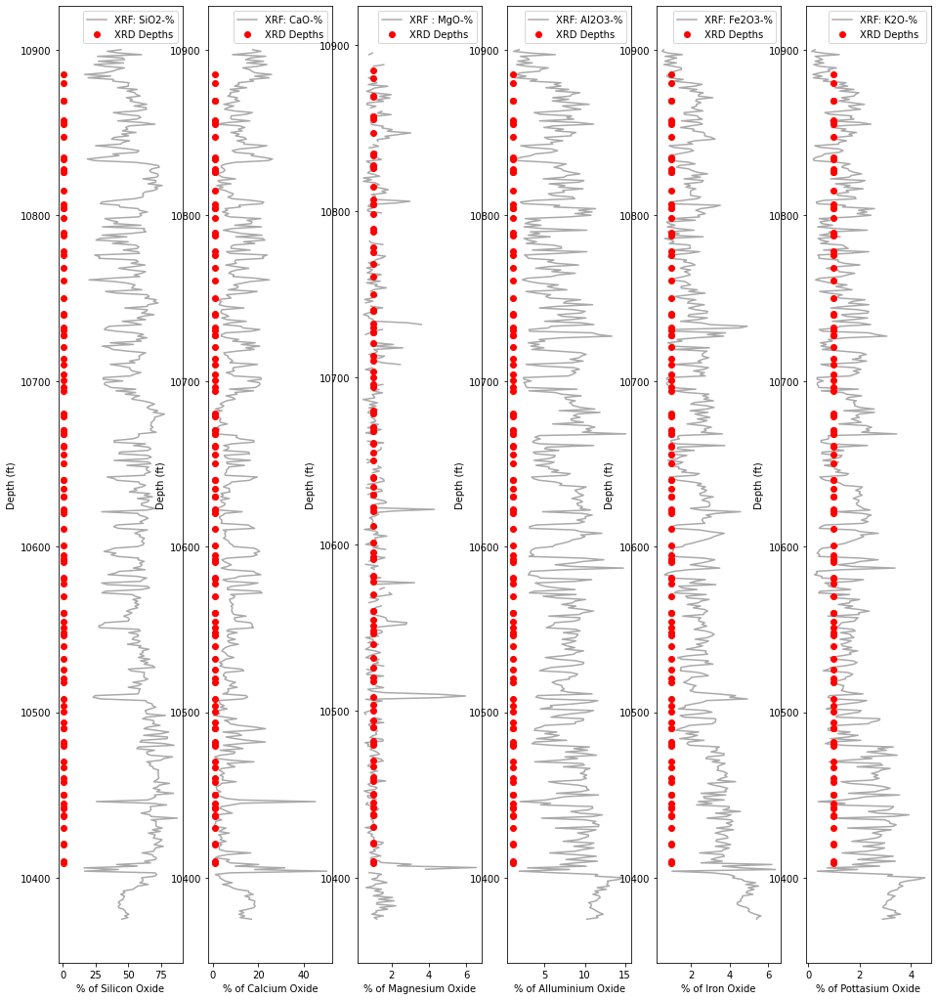

In [ ]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16,18))

# fig.suptitle('Horizontally stacked subplots')
# ax1.plot(x, y)
# ax2.plot(x, -y)

# 'SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'

fig.figsize= (4,18)
ax1.plot( df1.iloc[:,1], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: SiO2-%')
ax1.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax1.legend()
ax1.set(xlabel='% of Silicon Oxide', ylabel='Depth (ft)')
# ax1.xlabel('% of Silicon Oxide ')
# ax1.ylabel('Depth (ft)')


ax2.plot( df1.iloc[:,2], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: CaO-%')
ax2.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths') #     df1.iloc[:,1] 
ax2.legend()
ax2.set(xlabel='% of Calcium Oxide', ylabel='Depth (ft)')
# plt.xlabel('% of Calcium Oxide ')
# plt.ylabel('Depth (ft)')

ax3.plot( df1.iloc[:,3], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF : MgO-%')
ax3.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
ax3.legend()
ax3.set(xlabel='% of Magnesium Oxide', ylabel='Depth (ft)')
# plt.xlabel('% of Magnesium Oxide ')
# plt.ylabel('Depth (ft)')

ax4.plot( df1.iloc[:,4], df1.iloc[:,0],color = '#A9A9A9', label = 'XRF: Al2O3-%')
ax4.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
ax4.legend()
ax4.set(xlabel='% of Alluminium Oxide', ylabel='Depth (ft)')
# plt.xlabel('% of Alluminium Oxide ')
# plt.ylabel('Depth (ft)')

ax5.plot( df1.iloc[:,5], df1.iloc[:,0], color = '#A9A9A9', label = 'XRF: Fe2O3-%')
ax5.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
ax5.legend()
ax5.set(xlabel='% of Iron Oxide', ylabel='Depth (ft)')
# ax5.xlabel('% of Iron Oxide ')
# plt.ylabel('Depth (ft)')

ax6.plot( df1.iloc[:,6], df1.iloc[:,0], color = '#A9A9A9', label = 'XRF: K2O-%')
ax6.plot( np.ceil(df_o.iloc[:,1]/100) , df_o.iloc[:,0], 'ro', label = 'XRD Depths ') #     df1.iloc[:,1] 
ax6.legend()
ax6.set(xlabel='% of Pottasium Oxide', ylabel='Depth (ft)')
# plt.xlabel('% of Pottasium Oxide ')
# plt.ylabel('Depth (ft)')


In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

In [ ]:
# otp_df = pd.read_csv('Ensemble_clay_df_overlap.csv', header = None)
otp_df = pd.read_csv('NN_clay_df_overlap_1-10trials.csv', header = None)
# a3 = pd.read_csv('Ensemble_carbonate_df_overlap.csv', header = None)

In [ ]:
otp_df.drop[:,3:]

TypeError: ignored

In [ ]:
from google.colab import files 
uploaded = files.upload()

Saving NN_clay_df_overlap_1-10trials.csv to NN_clay_df_overlap_1-10trials.csv


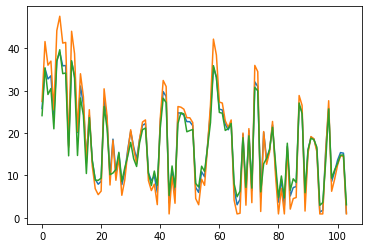

In [ ]:
plt.plot(a1.iloc[:,0:3])

Text(0, 0.5, 'Depth (ft)')

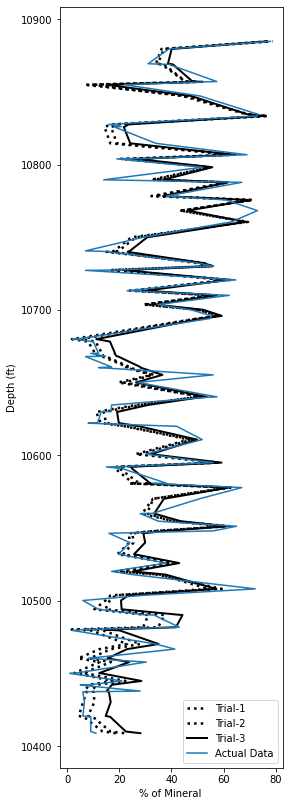

In [ ]:
plt.figure(figsize = (4,14))
# plt.plot(otp_df['median'],dep , label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(a3.iloc[:,0:1], dep ,label = 'Trial-1' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(a3.iloc[:,1:2], dep,  label = 'Trial-2', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(a3.iloc[:,2:3], dep, label = 'Trial-3', linewidth=2 , color = '#000000')
plt.plot(df_o['carbonate'], dep, label = 'Actual Data')
plt.legend()
plt.xlabel('% of Mineral ')
plt.ylabel('Depth (ft)')

In [ ]:
df_o

,deptho,Quartz-Sio2,carbonate,clay,others
0,10408.85,43.0,11.0,29.0,17.0
1,10410.00,35.0,9.0,43.0,13.0
2,10420.15,45.1,9.1,26.9,18.9
3,10420.70,42.0,6.0,38.0,14.0
4,10430.25,68.5,6.6,14.3,10.6
...,...,...,...,...,...
99,10857.20,29.6,57.4,6.4,6.6
100,10869.00,37.0,39.0,16.0,8.0
101,10869.45,39.0,31.0,20.0,10.0
102,10879.60,34.0,39.0,17.0,10.0


In [ ]:
# # df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
# # df_i = df_i.drop(['CaO-%'], axis = 1)
# # df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
df_i = df_i.drop(['Fe2O3-%'], axis = 1)
df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
# df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

In [ ]:
b = 10
a = 0
test_sz = 8 
from scipy import stats 
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
max_rat_val = -9999999999999
max_rat = 0 
max_rat1 = 0 
X1 = pd.DataFrame(X_train)
Y1 = pd.DataFrame(Y_train)
print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
for rat1 in np.linspace(1,8,20):
  for rat in np.linspace(1,8,20):
    curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
    # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
    if curr > max_rat_val :
      max_rat = rat
      max_rat1 = rat1
      max_rat_val = curr 
print(max_rat_val,max_rat, max_rat1) 

plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

plt.figure()
plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


X1 = pd.DataFrame(X_test)
Y1 = pd.DataFrame(Y_test)

print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

# plt.figure()
# plt.scatter()

# # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
# # # df_i['SiO2-%'] 
# # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


# # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
# # # df_i['SiO2-%'] 
# # r2_score(df_i['MgO-%'] , df_o['carbonate'])

# # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
# # print(pearson_coef, p_value)

df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
# # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
df_i = df_i.drop(['Fe2O3-%'], axis = 1)
df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
otp_df = pd.DataFrame()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 1
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
  #               sep="\s+")


  # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
  #                 sep="\s+")
  # df_i = pd.DataFrame(Df_i)
  # df_o = pd.DataFrame(Df_o)

  # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  # df_o = df_o.drop(['deptho'], axis = 1)
  # dep = df_i['depthi']
  # df_i = df_i.drop(['depthi'], axis = 1)
  # # b = 2000
  # # a = 0
  # # test_sz = 8 
  # from scipy import stats 
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # max_rat_val = -9999999999999
  # max_rat = 0 
  # max_rat1 = 0 
  # X1 = pd.DataFrame(X_train)
  # Y1 = pd.DataFrame(Y_train)
  # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # # print(Y1.columns)
  # for rat1 in np.linspace(1,8,20):
  #   for rat in np.linspace(1,8,20):
  #     curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
  #     # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
  #     if curr > max_rat_val :
  #       max_rat = rat
  #       max_rat1 = rat1
  #       max_rat_val = curr 
  # print(max_rat_val,max_rat, max_rat1) 

  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # # plt.figure()
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  # X1 = pd.DataFrame(X_test)
  # Y1 = pd.DataFrame(Y_test)

  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # # plt.figure()
  # # plt.scatter()

  # # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # # print(pearson_coef, p_value)

  # df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  # df_i = df_i.drop(['SiO2-%'], axis = 1)
  # df_i = df_i.drop(['CaO-%'], axis = 1)
  # df_i = df_i.drop(['MgO-%'], axis = 1)
  # df_i = df_i.drop(['Al2O3-%'], axis = 1)
  # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  # df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  a1 = model_cv.predict(df_i)
  print(model_cv.best_params_)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 








test % is  8
Fitting 5 folds for each of 252 candidates, totalling 1260 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached a

NN training average is 0.4341682029986071 testing is  -1.375969068042707
{'activation': 'relu', 'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 1000, 'n_iter_no_change': 10000, 'random_state': 2, 'solver': 'adam'}


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float) 
# # df_o = df_o.astype(float)

In [ ]:
count = 6

col_name = 'ABC' + str(count)
df_i.insert( count,col_name, a1)

In [ ]:
# df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
otp_df = pd.DataFrame()
import warnings
# from sklearn.exceptions import ConvergenceWarning
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


# b = 6000

a = 2
test_sz = 8 
count = 0 
for b in [10]:  # [10, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]:

  # Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
  #               sep="\s+")


  # Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
  #                 sep="\s+")
  # df_i = pd.DataFrame(Df_i)
  # df_o = pd.DataFrame(Df_o)

  # df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

  # df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  # df_o = df_o.drop(['deptho'], axis = 1)
  # dep = df_i['depthi']
  # df_i = df_i.drop(['depthi'], axis = 1)
  # # b = 2000
  # # a = 0
  # # test_sz = 8 
  # from scipy import stats 
  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  # max_rat_val = -9999999999999
  # max_rat = 0 
  # max_rat1 = 0 
  # X1 = pd.DataFrame(X_train)
  # Y1 = pd.DataFrame(Y_train)
  # # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0]))
  # # print(Y1.columns)
  # for rat1 in np.linspace(1,8,20):
  #   for rat in np.linspace(1,8,20):
  #     curr = r2_score(Y1['Quartz-Sio2'], X1['SiO2-%'] - rat*X1['K2O-%'])
  #     # curr = r2_score(Y1.iloc[:,0], X1.iloc[:,0] - rat*X1.iloc[:,5] - rat1*X1.iloc[:,3])
  #     if curr > max_rat_val :
  #       max_rat = rat
  #       max_rat1 = rat1
  #       max_rat_val = curr 
  # print(max_rat_val,max_rat, max_rat1) 

  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0])

  # # plt.figure()
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )


  # X1 = pd.DataFrame(X_test)
  # Y1 = pd.DataFrame(Y_test)

  # print(r2_score(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] ))
  # # plt.scatter(Y1.iloc[:,0], X1.iloc[:,0] - max_rat*X1.iloc[:,5] )

  # # plt.figure()
  # # plt.scatter()

  # # r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


  # # r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
  # # # df_i['SiO2-%'] 
  # # r2_score(df_i['MgO-%'] , df_o['carbonate'])

  # # pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
  # # print(pearson_coef, p_value)

  # df_i['new_sio2'] = df_i['SiO2-%'] - max_rat*df_i['K2O-%']
  # # # df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

  # # # df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

  # df_i = df_i.drop(['SiO2-%'], axis = 1)
  # df_i = df_i.drop(['CaO-%'], axis = 1)
  # df_i = df_i.drop(['MgO-%'], axis = 1)
  # df_i = df_i.drop(['Al2O3-%'], axis = 1)
  # df_i = df_i.drop(['Fe2O3-%'], axis = 1)
  # df_i = df_i.drop(['K2O-%'], axis = 1)

  print( 'test % is ', test_sz)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] , 'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print('NN training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  a1 = model_cv.predict(df_i)
  print(model_cv.best_params_)

  # regr_nn =  ElasticNet()
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  

  # Y_pred_N_1 = model_cv.predict(X_test)
  # a2 = model_cv.predict(df_i)

  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('Elastic net training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))

  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a2)  
  # count += 1 

  # # regr_nn = RandomForestRegressor()
  # # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # # fit the model
  # # model_cv.fit(X_train, Y_train)  
  # # Y_pred_N_1 = model_cv.predict(X_test)
  # # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # # print('RF training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))


  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      
  # # fit the model
  # model_cv.fit(X_train, Y_train)  
  # Y_pred_N_1 = model_cv.predict(X_test)

  # # Y_pred_N_1 = model_cv.predict(X_test)
  # a3 = model_cv.predict(df_i)
  # quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  # print('XGB training average is' , model_cv.best_score_, 'testing is ', r2_score(Y_test, Y_pred_N_1))
  # col_name = 'ABC' + str(count)
  # otp_df.insert( count,col_name, a3)  
  # count += 1 








test % is  8
Fitting 5 folds for each of 252 candidates, totalling 1260 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached a

NN training average is 0.4941570404202791 testing is  0.7022923641561183
{'activation': 'relu', 'alpha': 1e-06, 'hidden_layer_sizes': 3, 'learning_rate_init': 0.01, 'max_iter': 400, 'n_iter_no_change': 10000, 'random_state': 2, 'solver': 'adam'}


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
[Parallel(n_jobs=1)]: Done 1260 out of 1260 | elapsed:  6.3min finished
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 200, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 2), 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7FB47DC6E6B0, 'n_iter_': 200, 't_': 4000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-4.28104961e-02,  2.22968722e-05,  6.13213485e-01,
         4.61348022e-01]]), array([[ 2.27490655e-04,  2.48250930e-03],
       [ 2.03616977e-04, -5.77068746e-05],
       [ 8.00803423e-01, -6.18936750e-01],
       [ 8.12271031e-01,  5.36571518e-01]]), array([[ 0.96947851],
       [-0.25921476]])], 'intercepts_': [array([-1.

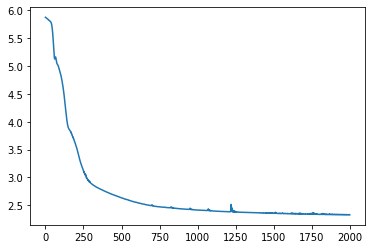

In [ ]:
# model_cv.loss_curve_
dict_par_with = model_cv.best_estimator_.__dict__
# list_r2_score.append(r2_score(Y_test, Y_pred_N))
print(dict_par_with)
plt.plot(np.log(dict_par['loss_curve_']))
# plt.plot(dict_par['loss_curve_'])

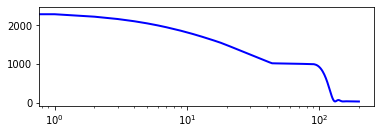

In [ ]:
import pylab
import matplotlib.pyplot as plt
a = dict_par_with['loss_curve_']
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)

line, = ax.plot(a, color='blue', lw=2)

ax.set_xscale('log')

pylab.show()

{'activation': 'relu', 'solver': 'adam', 'alpha': 1, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 200, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 2), 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7FB47D26B6B0, 'n_iter_': 200, 't_': 4000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-5.89384655e-07,  6.62541476e-01, -1.29541748e-01,
         8.55535804e-01],
       [-6.21648836e-06, -8.24546109e-01,  7.07463745e-02,
         4.93346156e-01],
       [-5.61841352e-05, -1.63658907e+00,  4.43993549e-05,
        -4.00316235e-01],
       [ 2.11301267e-05, -1.71350499e+00, -7.75893338e-05,
         8.14852540e-0

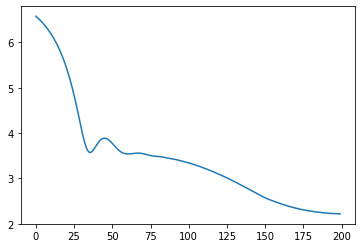

In [ ]:
# model_cv.loss_curve_
dict_par_wo = model_cv.best_estimator_.__dict__
# list_r2_score.append(r2_score(Y_test, Y_pred_N))
print(dict_par_wo)
plt.plot(np.log(dict_par_wo['loss_curve_']))
# plt.plot(dict_par['loss_curve_'])

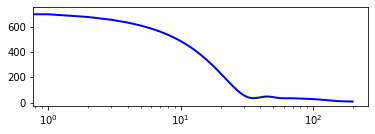

In [ ]:
import pylab
import matplotlib.pyplot as plt
a = dict_par_wo['loss_curve_']
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)

line, = ax.plot(a, color='blue', lw=2)

ax.set_xscale('log')

pylab.show()

In [ ]:
# # model_cv.loss_curve_
# dict_par_1 = model_cv.best_estimator_.__dict__
# # list_r2_score.append(r2_score(Y_test, Y_pred_N))
# print(dict_par_1)
# plt.plot(np.log(dict_par['loss_curve_']))
# # plt.plot(dict_par['loss_curve_'])

In [ ]:
import pylab
import matplotlib.pyplot as plt
a = dict_par['loss_curve_']
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)

line, = ax.plot(a, color='blue', lw=2)

ax.set_xscale('log')

pylab.show()

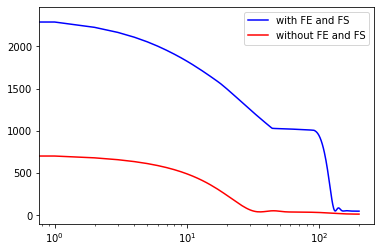

In [ ]:
import pylab
import matplotlib.pyplot as plt
a = dict_par_with['loss_curve_']
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)

line, = ax.plot(a, color='blue', label= 'with FE and FS')

ax.set_xscale('log')


a1 = dict_par_wo['loss_curve_']
# fig = plt.figure()
# ax = fig.add_subplot(2, 1, 1)

line, = ax.plot(a1, color='red', label = 'without FE and FS')
plt.legend()
ax.set_xscale('log')

# pylab.show()



In [ ]:
# count = 4

# col_name = 'ABC' + str(count)
# otp_df.insert( count,col_name, a1)

In [ ]:
otp_df

,ABC0
0,45.636792
1,37.019893
2,48.386013
3,48.571451
4,58.323515
...,...
99,38.059699
100,42.917433
101,42.207494
102,40.571619


In [ ]:
# otp_df = otp_df.drop(['ABC6'], axis = 1)

In [ ]:
count = 0
col_name = 'ABC' + str(count)
otp_df.insert( count,col_name, a1)

In [ ]:
otp_df = pd.read_csv('XGB_clay_df_overlap1_10.csv', header = None)

Text(0, 0.5, 'Depth (ft)')

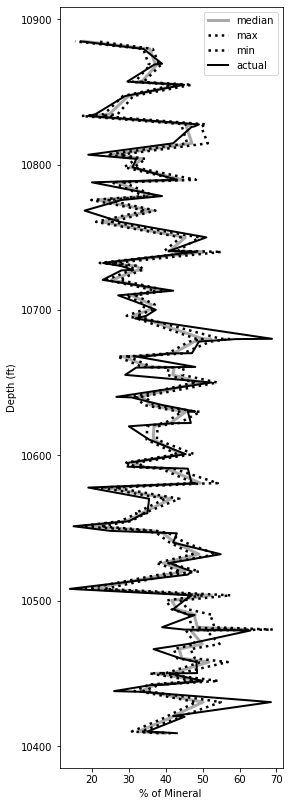

In [ ]:
otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (4,14))
plt.plot(otp_df['median'],dep , label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(otp_df['max'], dep,label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(otp_df['min'],dep,  label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(df_o.iloc[:,int(a)], dep, label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('% of Mineral ')
plt.ylabel('Depth (ft)')

Text(0, 0.5, 'Depth (ft)')

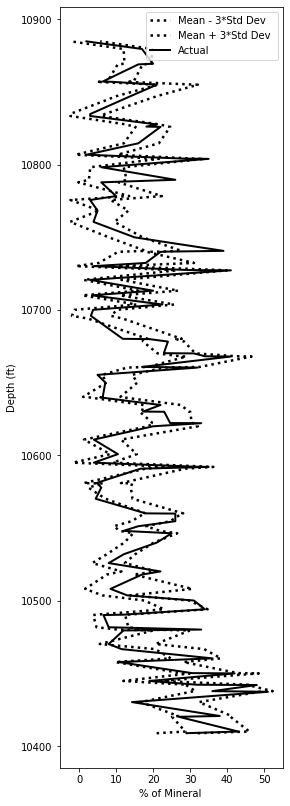

In [ ]:
a = 2
otp_df = pd.read_csv('XGB_clay_df_overlap1_10.csv', header = None)
temp = 3*otp_df.std(axis=1)
otp_df['mean'] = otp_df.mean(axis = 1 )
plus =  otp_df['mean']+ temp
minus  = otp_df['mean'] - temp
actual  = df_o.iloc[:,int(a)]


# plt.plot(c)
# plt.plot(df_o.iloc[:,int(a)] )
# otp_df['mean'] = otp_df.mean(axis = 1 )
# otp_df['max'] = otp_df.max(axis = 1 )
# otp_df['min'] = otp_df.min(axis = 1 )
# otp_df

plt.figure(figsize = (4,14))
# plt.plot(actual, dep , label = 'mean', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(minus, dep,label = 'Mean - 3*Std Dev' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(plus,dep,  label = 'Mean + 3*Std Dev ', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(df_o.iloc[:,int(a)], dep, label = 'Actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('% of Mineral ')
plt.ylabel('Depth (ft)')

In [ ]:
otp_df

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,38.9,38.9,38.9,38.9,38.9,38.9,38.9,38.9,38.9,38.9,NaN,NaN,NaN
1,31.5,31.5,31.5,31.5,31.5,31.5,31.5,31.5,31.5,31.5,NaN,NaN,NaN
2,41.2,41.2,41.2,41.2,41.2,41.2,41.2,41.2,41.2,41.2,NaN,NaN,NaN
3,41.4,41.4,41.4,41.4,41.4,41.4,41.4,41.4,41.4,41.4,NaN,NaN,NaN
4,49.7,49.7,49.7,49.7,49.7,49.7,49.7,49.7,49.7,49.7,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,32.4,32.4,32.4,32.4,32.4,32.4,32.4,32.4,32.4,32.4,NaN,NaN,NaN
100,36.6,36.6,36.6,36.6,36.6,36.6,36.6,36.6,36.6,36.6,NaN,NaN,NaN
101,36.0,36.0,36.0,36.0,36.0,36.0,36.0,36.0,36.0,36.0,NaN,NaN,NaN
102,34.6,34.6,34.6,34.6,34.6,34.6,34.6,34.6,34.6,34.6,NaN,NaN,NaN


In [ ]:
from numpy import savetxt
savetxt('enet_Clay_df_overlap_1-10trials_wommm.csv', otp_df, delimiter=',')

In [ ]:
otp_df = pd.DataFrame()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

# from sklearn.exceptions import UndefinedMetricWarning
# warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

b = 10
a = 1
for test_sz in  [8]: # [9.5, 9, 8, 7,6,5,4,3,2]: #  [6.25, 5, 3.75, 2.5, 1.25]: # [9]: # ,

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # folds = ShuffleSplit(n_splits=4, test_size=.75, random_state=0)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] ,  'max_iter': [100, 200, 300, 400, 500, 600, 1000,1500, 2000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]
  # [100, 200, 300, 1000, 2000, 10000, 20000, 200000] 400, 500, 600, 700,800,900, 50, 100, 150, 200, 220, 250, 270, 290, 300, 350,380, 382, 384, 386, 388, 390, 392, 394, 396, 398, 400, 500, 600, 700,800,900 

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_1 = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_1))
  print(r2_score(Y_test, Y_pred_N_1))



Fitting 2 folds for each of 252 candidates, totalling 504 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 504 out of 504 | elapsed:  3.1min finished


0.8297998994976385


Text(0, 0.5, 'r2_score')

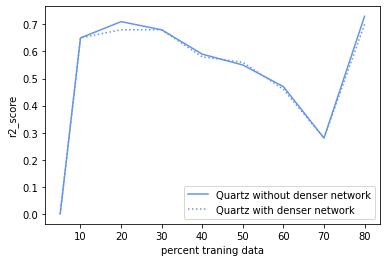

In [ ]:

q = [0, 0.65 , 0.71 , 0.68, 0.59, 0.55, 0.47, 0.28, 0.73]
# q_b10 = [0, 0.64, 0.62, 0.72, 0.76, 0.64, 0.83, 0.78 , 0]
q_2000_higher = [0,0.65 , 0.68,0.68,0.58,0.56,0.46,0.28,0.70]
# cr = [0, 0.81, 0.81 , 0.85 , 0.84 , 0.84, 0.82, 0.89, 0.89]
# cl = [0, 0.72 , 0.71 , 0.73 , 0.71, 0.77, 0.76, 0.72, 0.84]

# q_wfe = [ 0 , 0.64,0.50,0.44,0.53,0.50,0.39,0.004,0.70]
# q_wfe_b10 = [0, 0.61, 0.62,0.64,0.57,0.74,0.68,0.71,0.64]
# cr_wfe = [0,0.72,0.82,0.82,0.79,0.82,0.82,0.88,0.88]
# cl_wfe = [0,0.21,0.61,0.65,0.65,0.64,0.69,0.66,0.84 ]
per = [5, 10, 20, 30, 40, 50, 60, 70, 80]
plt.plot(per, q, label = 'Quartz without denser network', color= '#6495ED')
plt.plot(per, q_2000_higher, label = 'Quartz with denser network', color= '#6495ED', linestyle=':')
plt.legend()
plt.xlim()
plt.xlabel('percent traning data')
plt.ylabel('r2_score')
# plt.figure()
# plt.plot(per, cr, label = 'carbonate', color= '#FF7F50')

# plt.plot(per, cr_wfe, label = 'carbonate w/o FE', color= '#FF7F50', linestyle=':')
# plt.legend()
# plt.xlim()
# plt.xlabel('percent traning data')
# plt.ylabel('r2_score')

# plt.figure()
# plt.plot(per, cl, label = 'clay',color= '#3D9140')
# plt.plot(per, cl_wfe, label = 'clay w/o FE',color= '#3D9140', linestyle=':')
# plt.legend()
# plt.xlim()
# plt.xlabel('percent traning data')
# plt.ylabel('r2_score')



# plt.plot(otp_df['median'],dep , label = 'median', color = '#A9A9A9' , linewidth=3)
# # plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
# plt.plot(otp_df['max'], dep,label = 'max' ,linewidth=2.5, linestyle=':',color= '#FF7F50')
# plt.plot(otp_df['min'],dep,  label = 'min', linewidth=2.5, linestyle=':', color = '#3D9140' )
# plt.plot(df_o.iloc[:,int(a)], dep, label = 'actual', linewidth=2 , color = '#6495ED') 
# plt.legend()
# plt.xlabel('% of Mineral ')
# plt.ylabel('Depth (ft)')

In [ ]:
  model_cv.best_params_


{'activation': 'relu',
 'alpha': 10,
 'hidden_layer_sizes': (4, 2),
 'learning_rate_init': 0.01,
 'max_iter': 400,
 'n_iter_no_change': 10000,
 'random_state': 2,
 'solver': 'adam'}

In [ ]:
  model_cv.best_params_


{'activation': 'relu',
 'alpha': 300,
 'hidden_layer_sizes': 3,
 'learning_rate_init': 0.01,
 'max_iter': 2000,
 'n_iter_no_change': 10000,
 'random_state': 2,
 'solver': 'adam'}

In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float)
# # df_o = df_o.astype(float)

In [ ]:
# df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

# from sklearn.exceptions import UndefinedMetricWarning
# warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

b = 2000
a = 2
for test_sz in  [8]: # [9.5, 9, 8, 7,6,5,4,3,2]: #  [6.25, 5, 3.75, 2.5, 1.25]: # [9]: # ,

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # folds = ShuffleSplit(n_splits=4, test_size=.75, random_state=0)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] ,  'max_iter': [100, 200, 300, 400, 500, 600, 1000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]
  # [100, 200, 300, 1000, 2000, 10000, 20000, 200000] 400, 500, 600, 700,800,900, 50, 100, 150, 200, 220, 250, 270, 290, 300, 350,380, 382, 384, 386, 388, 390, 392, 394, 396, 398, 400, 500, 600, 700,800,900 

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_2 = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_2))
  print(r2_score(Y_test, Y_pred_N_2))



Fitting 2 folds for each of 196 candidates, totalling 392 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.6883254819144666


[Parallel(n_jobs=1)]: Done 392 out of 392 | elapsed:  1.5min finished


In [ ]:
model_cv.best_params_

{'activation': 'relu',
 'alpha': 1,
 'hidden_layer_sizes': (4, 2),
 'learning_rate_init': 0.01,
 'max_iter': 100,
 'n_iter_no_change': 10000,
 'random_state': 100,
 'solver': 'adam'}

In [ ]:
model_cv.best_params_

{'activation': 'relu',
 'alpha': 1e-06,
 'hidden_layer_sizes': 3,
 'learning_rate_init': 0.01,
 'max_iter': 3000,
 'n_iter_no_change': 10000,
 'random_state': 2,
 'solver': 'adam'}

In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")


Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float)
# # df_o = df_o.astype(float)

In [ ]:

# b = 1000
# a = 0
# test_sz = 8

# X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

#  for a in linspace(1,10,20):


df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
df_i = df_i.drop(['Fe2O3-%'], axis = 1)
df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

# from sklearn.exceptions import UndefinedMetricWarning
# warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

b = 2000
a = 0
for test_sz in  [8]: # [9.5, 9, 8, 7,6,5,4,3,2]: #  [6.25, 5, 3.75, 2.5, 1.25]: # [9]: # ,

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # folds = ShuffleSplit(n_splits=4, test_size=.75, random_state=0)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] ,  'max_iter':[100, 200, 300, 1000, 2000 ], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]
  # [100, 200, 300, 1000, 2000, 10000, 20000, 200000] 400, 500, 600, 700,800,900, 50, 100, 150, 200, 220, 250, 270, 290, 300, 350,380, 382, 384, 386, 388, 390, 392, 394, 396, 398, 400, 500, 600, 700,800,900 
  #  [100, 200, 300, 1000, 2000 ]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_0 = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_0))
  print(r2_score(Y_test, Y_pred_N_0))


Y_pred_N_00 = model_cv.predict(X_train)

quartz_trainsplit_r2.append(r2_score(Y_train, Y_pred_N_00))
print(r2_score(Y_train, Y_pred_N_00))
print(model_cv.best_score_)
model_cv.best_params_

Fitting 2 folds for each of 80 candidates, totalling 160 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.7174241444788341
0.801365168914177
0.8003775808738322


[Parallel(n_jobs=1)]: Done 160 out of 160 | elapsed:   58.2s finished


{'activation': 'relu',
 'alpha': 1e-06,
 'hidden_layer_sizes': (4, 2),
 'learning_rate_init': 0.01,
 'max_iter': 300,
 'n_iter_no_change': 10000,
 'random_state': 100,
 'solver': 'adam'}

In [ ]:
print(model_cv.best_score_)

0.6681594208199514


In [ ]:
model_cv.best_params_

{'activation': 'relu',
 'alpha': 300,
 'hidden_layer_sizes': (4, 2),
 'learning_rate_init': 0.01,
 'max_iter': 50,
 'n_iter_no_change': 10000,
 'random_state': 100,
 'solver': 'adam'}

In [ ]:
print(model_cv.best_params_)

Y_pred_N_0 = model_cv.predict(X_train)

quartz_trainsplit_r2.append(r2_score(Y_train, Y_pred_N_0))
print(r2_score(Y_train, Y_pred_N_0))



{'activation': 'relu', 'alpha': 300, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 50, 'n_iter_no_change': 10000, 'random_state': 100, 'solver': 'adam'}
0.5341997463644874


In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

# from sklearn.exceptions import UndefinedMetricWarning
# warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

b = 2240 
a = 1
for test_sz in  [8]: # [9.5, 9, 8, 7,6,5,4,3,2]: #  [6.25, 5, 3.75, 2.5, 1.25]: # [9]: # ,

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # folds = ShuffleSplit(n_splits=4, test_size=.75, random_state=0)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] ,  'max_iter': [100, 200, 300, 1000, 2000 , 10000, 20000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]
  # [100, 200, 300, 1000, 2000, 10000, 20000, 200000] 400, 500, 600, 700,800,900, 50, 100, 150, 200, 220, 250, 270, 290, 300, 350,380, 382, 384, 386, 388, 390, 392, 394, 396, 398, 400, 500, 600, 700,800,900 

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N))
  print(r2_score(Y_test, Y_pred_N))



Fitting 2 folds for each of 196 candidates, totalling 392 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 392 out of 392 | elapsed: 14.6min finished


0.7255099853464118


In [ ]:

# from scipy import stats 

# r2_score(df_i['new_sio2'], df_o['Quartz-Sio2'])
# # df_i['SiO2-%'] 
# r2_score(df_i['SiO2-%'] , df_o['Quartz-Sio2'])


# r2_score(df_i['new-mg-ca'] , df_o['carbonate'])
# # df_i['SiO2-%'] 
# r2_score(df_i['MgO-%'] , df_o['carbonate'])

# pearson_coef, p_value = stats.pearsonr(df_i['CaO-%'] , df_o['carbonate'])
# print(pearson_coef, p_value)


0.8578433914475342 2.966642622625653e-31


In [ ]:
model_cv.best_params_

{'activation': 'relu',
 'alpha': 1e-05,
 'hidden_layer_sizes': (4, 2),
 'learning_rate_init': 0.01,
 'max_iter': 1000,
 'n_iter_no_change': 10000,
 'random_state': 2,
 'solver': 'adam'}

In [ ]:
df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
df_i = df_i.drop(['Fe2O3-%'], axis = 1)
df_i = df_i.drop(['K2O-%'], axis = 1)


df_i = df_i.drop(['new-mg-ca'], axis = 1)




In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

# from sklearn.exceptions import UndefinedMetricWarning
# warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

b = 2240 
a = 0
for test_sz in  [8]: # [9.5, 9, 8, 7,6,5,4,3,2]: #  [6.25, 5, 3.75, 2.5, 1.25]: # [9]: # ,

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # folds = ShuffleSplit(n_splits=4, test_size=.75, random_state=0)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] ,  'max_iter': [100, 200, 300, 1000, 2000 , 10000, 20000], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]
  # [100, 200, 300, 1000, 2000, 10000, 20000, 200000] 400, 500, 600, 700,800,900, 50, 100, 150, 200, 220, 250, 270, 290, 300, 350,380, 382, 384, 386, 388, 390, 392, 394, 396, 398, 400, 500, 600, 700,800,900 

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N_0 = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N_0))
  print(r2_score(Y_test, Y_pred_N_0))



Text(0.5, 0, '% training data')

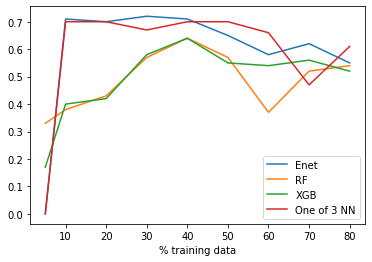

In [ ]:


Quartz_Enet = [0, 0.71, 0.70, 0.72, 0.71, 0.65, 0.58, 0.62, 0.55]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Quartz_Enet, label = 'Enet')
Quartz_RF = [0.33, 0.38, 0.43, 0.57, 0.64, 0.57, 0.37, 0.52, 0.54]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Quartz_RF, label = 'RF')
Quartz_XGB = [0.17, 0.40, 0.42, 0.58, 0.64, 0.55, 0.54, 0.56, 0.52]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Quartz_XGB, label = 'XGB')
Quartz_NN = [0, 0.7, 0.7, 0.67, 0.70, 0.70, 0.66, 0.47, 0.61]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Quartz_NN, label = 'One of 3 NN')
plt.legend()
# plt.xaxis([5, 10, 20, 30, 40, 50, 60, 70, 80])
plt.xlabel('% training data')

Text(0.5, 0, '% training data')

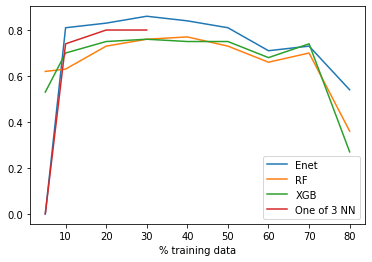

In [ ]:
Carbonate_Enet = [0, 0.81, 0.83, 0.86, 0.84, 0.81, 0.71, 0.73, 0.54]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Carbonate_Enet, label = 'Enet')
Carbonate_RF = [0.62 , 0.63, 0.73, 0.76, 0.77, 0.73, 0.66, 0.7, 0.36]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Carbonate_RF, label = 'RF')
Carbonate_XGB = [0.53, 0.70, 0.75, 0.76, 0.75, 0.75, 0.68, 0.74, 0.27 ]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Carbonate_XGB, label = 'XGB')
Carbonate_NN = [0, 0.74, 0.80, 0.80]
plt.plot([5, 10, 20, 30], Carbonate_NN, label = 'One of 3 NN')
plt.legend()
# plt.xaxis([5, 10, 20, 30, 40, 50, 60, 70, 80])
plt.xlabel('% training data')

Text(0.5, 0, '% training data')

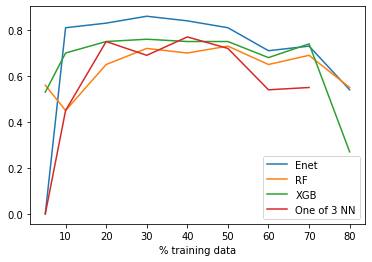

In [ ]:
Clay_Enet = [0, 0.52, 0.72, 0.72, 0.69, 0.68, 0.68, 0.64, 0.55]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Carbonate_Enet, label = 'Enet')
Carbonate_RF = [0.56, 0.45, 0.65, 0.72, 0.70, 0.73, 0.65, 0.69, 0.55]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Carbonate_RF, label = 'RF')
Clay_XGB = [0.44, 0.43, 0.67, 0.55, 0.53, 0.71, 0.56, 0.56, 0.49 ]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70, 80], Carbonate_XGB, label = 'XGB')
Clay_NN = [0, 0.45, 0.75, 0.69, 0.77, 0.72, 0.54, 0.55]
plt.plot([5, 10, 20, 30, 40, 50, 60, 70], Clay_NN, label = 'One of 3 NN')
plt.legend()
# plt.xaxis([5, 10, 20, 30, 40, 50, 60, 70, 80])
plt.xlabel('% training data')

In [ ]:
import numpy as np
from sklearn.model_selection import ShuffleSplit
X = np.array([[1, 2], [3, 4], [5, 6], [7, 8], [3, 4], [5, 6], [1,6], [2,7]])
y = np.array([1, 2, 1, 2, 1, 2,4,5])
rs = ShuffleSplit(n_splits=5, test_size=.75, random_state=0)
rs.get_n_splits(X)

print(rs)

for train_index, test_index in rs.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)





rs = ShuffleSplit(n_splits=5, train_size=0.5, test_size=.25,
                  random_state=0)
for train_index, test_index in rs.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)


ShuffleSplit(n_splits=5, random_state=0, test_size=0.75, train_size=None)
TRAIN: [5 4] TEST: [6 2 1 7 3 0]
TRAIN: [2 5] TEST: [1 6 3 7 0 4]
TRAIN: [6 1] TEST: [5 2 3 4 7 0]
TRAIN: [1 0] TEST: [2 5 6 7 3 4]
TRAIN: [0 7] TEST: [4 5 1 6 3 2]
TRAIN: [1 7 3 0] TEST: [6 2]
TRAIN: [3 7 0 4] TEST: [1 6]
TRAIN: [3 4 7 0] TEST: [5 2]
TRAIN: [6 7 3 4] TEST: [2 5]
TRAIN: [1 6 3 2] TEST: [4 5]


In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

# from sklearn.exceptions import UndefinedMetricWarning
# warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)
# 
b = 2240 
a = 0
for test_sz in  [8]: # [9.5, 9, 8, 7,6,5,4,3,2]: #  [6.25, 5, 3.75, 2.5, 1.25]: # [9]: # ,

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  # regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam') # .fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)
  # folds = ShuffleSplit(n_splits=4, test_size=.75, random_state=0)

  # step-2: specify range of hyperparameters to tune
  hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # hyper_params = [{  'activation' : ['relu'],   'solver' : ['adam'], 'hidden_layer_sizes': [ (4,2), (3)] ,  'max_iter': [100, 200, 300, 1000, 2000 ], 'alpha': [ 0.0001, 0.00001, 0.000001, 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]
  # [100, 200, 300, 1000, 2000, 10000, 20000, 200000] 400, 500, 600, 700,800,900, 50, 100, 150, 200, 220, 250, 270, 290, 300, 350,380, 382, 384, 386, 388, 390, 392, 394, 396, 398, 400, 500, 600, 700,800,900 

  # 3.2 call GridSearchCV()
  model_cve = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cve.fit(X_train, Y_train)  

  Y_pred_Ne = model_cve.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_Ne))
  print(r2_score(Y_test, Y_pred_Ne))



Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.6837641316318575


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    2.1s finished


In [ ]:
from sklearn.metrics import mean_squared_error
print(r2_score(Y_test, (Y_pred_Ne+Y_pred_N)/2))
# print(r2_score(Y_test,  list(map(max, zip(Y_pred_Ne, Y_pred_N)))))
#  list(map(max, zip(Y_pred_Ne, Y_pred_N)))

0.6834403274775844


In [ ]:
# https://scikit-learn.org/stable/modules/ensemble.html

# https://towardsdatascience.com/ensemble-learning-using-scikit-learn-85c4531ff86a

#  voting regressor 

# when both models are doing good and one model is doing good on one set of dat and other is doing good on another set of data. 
# hence we are removing the extremities of the any one model. 

In [ ]:
# model_cv.loss_curve_
pd.set_option("display.max_colwidth", -1)
print(pd.DataFrame(model_cv.cv_results_).sort_values('mean_test_score',  ascending=[False])[['params', 'mean_test_score']])
# test = df.sort_values(['one'], ascending=[False])

                                                                                                                                         params  mean_test_score
475  {'alpha': 10, 'hidden_layer_sizes': 3, 'learning_rate_init': 0.01, 'max_iter': 700, 'n_iter_no_change': 10000, 'random_state': 100}         0.670103       
32   {'alpha': 0.0001, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 600, 'n_iter_no_change': 10000, 'random_state': 2}  0.669816       
477  {'alpha': 10, 'hidden_layer_sizes': 3, 'learning_rate_init': 0.01, 'max_iter': 800, 'n_iter_no_change': 10000, 'random_state': 100}         0.669603       
30   {'alpha': 0.0001, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 500, 'n_iter_no_change': 10000, 'random_state': 2}  0.669438       
473  {'alpha': 10, 'hidden_layer_sizes': 3, 'learning_rate_init': 0.01, 'max_iter': 600, 'n_iter_no_change': 10000, 'random_state': 100}         0.669100       
..                                

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
# model_cv.loss_curve_
pd.set_option("display.max_colwidth", -1)
print(pd.DataFrame(model_cv.cv_results_).sort_values('mean_test_score',  ascending=[False])[['params', 'mean_test_score']])
# test = df.sort_values(['one'], ascending=[False])

                                                                                                                                       params  mean_test_score
76  {'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 386, 'n_iter_no_change': 10000, 'random_state': 2}      0.838765       
82  {'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 392, 'n_iter_no_change': 10000, 'random_state': 2}      0.838127       
88  {'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 398, 'n_iter_no_change': 10000, 'random_state': 2}      0.837050       
80  {'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 390, 'n_iter_no_change': 10000, 'random_state': 2}      0.836272       
74  {'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 384, 'n_iter_no_change': 10000, 'random_state': 2}      0.835821       
..                                            

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
# model_cv.loss_curve_
pd.set_option("display.max_colwidth", -1)
print(pd.DataFrame(model_cv.cv_results_).sort_values('mean_test_score',  ascending=[False])[['params', 'mean_test_score']])
# test = df.sort_values(['one'], ascending=[False])

                                                                                                                                        params  mean_test_score
100  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 392, 'n_iter_no_change': 10000, 'random_state': 2}     0.799352       
106  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 398, 'n_iter_no_change': 10000, 'random_state': 2}     0.796461       
104  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 396, 'n_iter_no_change': 10000, 'random_state': 2}     0.794995       
96   {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 388, 'n_iter_no_change': 10000, 'random_state': 2}     0.794292       
94   {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 386, 'n_iter_no_change': 10000, 'random_state': 2}     0.793516       
..                                      

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
# model_cv.loss_curve_
pd.set_option("display.max_colwidth", -1)
print(pd.DataFrame(model_cv.cv_results_).sort_values('mean_test_score',  ascending=[False])[['params', 'mean_test_score']])
# test = df.sort_values(['one'], ascending=[False])

                                                                                                                                        params  mean_test_score
130  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 380, 'n_iter_no_change': 10000, 'random_state': 2}     0.792277       
128  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 350, 'n_iter_no_change': 10000, 'random_state': 2}     0.783943       
126  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 300, 'n_iter_no_change': 10000, 'random_state': 2}     0.768508       
124  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 290, 'n_iter_no_change': 10000, 'random_state': 2}     0.765825       
122  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 270, 'n_iter_no_change': 10000, 'random_state': 2}     0.755479       
..                                      

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
# model_cv.loss_curve_
pd.set_option("display.max_colwidth", -1)
print(pd.DataFrame(model_cv.cv_results_).sort_values('mean_test_score',  ascending=[False])[['params', 'mean_test_score']])
# test = df.sort_values(['one'], ascending=[False])

                                                                                                                                           params  mean_test_score
61   {'alpha': 0.001, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 700, 'n_iter_no_change': 10000, 'random_state': 100}   0.714813       
1    {'alpha': 0.0001, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 700, 'n_iter_no_change': 10000, 'random_state': 100}  0.714813       
41   {'alpha': 1e-06, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 700, 'n_iter_no_change': 10000, 'random_state': 100}   0.714813       
21   {'alpha': 1e-05, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 700, 'n_iter_no_change': 10000, 'random_state': 100}   0.714813       
101  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 700, 'n_iter_no_change': 10000, 'random_state': 100}      0.714115       
..                    

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
# model_cv.loss_curve_
pd.set_option("display.max_colwidth", -1)
print(pd.DataFrame(model_cv.cv_results_).sort_values('mean_test_score',  ascending=[False])[['params', 'mean_test_score']])
# test = df.sort_values(['one'], ascending=[False])

                                                                                                                                         params  mean_test_score
60  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 400, 'n_iter_no_change': 10000, 'random_state': 2}       0.787641       
62  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 500, 'n_iter_no_change': 10000, 'random_state': 2}       0.780373       
53  {'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 600, 'n_iter_no_change': 10000, 'random_state': 100}      0.764045       
51  {'alpha': 1, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 500, 'n_iter_no_change': 10000, 'random_state': 100}      0.743759       
29  {'alpha': 1e-06, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 600, 'n_iter_no_change': 10000, 'random_state': 100}  0.737366       
..                                

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
  # fit the model
  model_cv.refit(X_train, Y_train)  

  Y_pred_N = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N))
  print(r2_score(Y_test, Y_pred_N))



TypeError: ignored

In [ ]:
model_cv.get_params

<bound method BaseEstimator.get_params of GridSearchCV(cv=KFold(n_splits=2, random_state=100, shuffle=True),
             error_score=nan,
             estimator=MLPRegressor(activation='relu', alpha=0.0001,
                                    batch_size='auto', beta_1=0.9, beta_2=0.999,
                                    early_stopping=False, epsilon=1e-08,
                                    hidden_layer_sizes=(100,),
                                    learning_rate='constant',
                                    learning_rate_init=0.001, max_fun=15000,
                                    max_iter=200, momentum=0.9,
                                    n_iter_no_change=10,
                                    nes...
                                    validation_fraction=0.1, verbose=False,
                                    warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid=[{'alpha': [0.0001, 1e-05, 1e-06, 0.001, 1, 10, 300],
                   

In [ ]:
# model_cv.loss_curve_
pd.set_option("display.max_colwidth", -1)
print(pd.DataFrame(model_cv.cv_results_).sort_values('mean_test_score',  ascending=[False])[['params', 'mean_test_score']])
# test = df.sort_values(['one'], ascending=[False])

                                                                                                                                           params  mean_test_score
84  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 300, 'n_iter_no_change': 10000, 'random_state': 2}         0.768508       
87  {'alpha': 10, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 1000, 'n_iter_no_change': 10000, 'random_state': 100}      0.689805       
39  {'alpha': 1e-06, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 1000, 'n_iter_no_change': 10000, 'random_state': 100}   0.689694       
23  {'alpha': 1e-05, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 1000, 'n_iter_no_change': 10000, 'random_state': 100}   0.689694       
7   {'alpha': 0.0001, 'hidden_layer_sizes': (4, 2), 'learning_rate_init': 0.01, 'max_iter': 1000, 'n_iter_no_change': 10000, 'random_state': 100}  0.689694       
..                    

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
model_cv.best_estimator_

MLPRegressor(activation='relu', alpha=10, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(4, 2), learning_rate='constant',
             learning_rate_init=0.01, max_fun=15000, max_iter=300, momentum=0.9,
             n_iter_no_change=10000, nesterovs_momentum=True, power_t=0.5,
             random_state=2, shuffle=True, solver='adam', tol=0.0001,
             validation_fraction=0.1, verbose=False, warm_start=False)

In [ ]:
model_cv.best_score_

0.7685080679761992

In [ ]:
model_cv.best_params_

{'alpha': 10,
 'hidden_layer_sizes': (4, 2),
 'learning_rate_init': 0.01,
 'max_iter': 300,
 'n_iter_no_change': 10000,
 'random_state': 2}

In [ ]:
from numpy import savetxt
savetxt('ENet_Clay_trainsplit_r2.csv', quartz_trainsplit_r2, delimiter=',')

In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

b = 1120 
a = 1
for test_sz in [6,5,4,3,2]: 

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam').fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{ 'hidden_layer_sizes': [ (4,2), (3) ] ,  'max_iter': [100, 1000, 2000,5000, 10000, 20000,40000], 'alpha': [ 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N))
  print(r2_score(Y_test, Y_pred_N))




Fitting 5 folds for each of 112 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed: 30.9min finished


0.80376731451719
Fitting 5 folds for each of 112 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed: 30.6min finished


0.8016124683533087
Fitting 5 folds for each of 112 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed: 30.5min finished


0.6758984252900813
Fitting 5 folds for each of 112 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed: 30.6min finished


0.7541581217067794
Fitting 5 folds for each of 112 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed: 31.0min finished


0.4797566586441214


In [ ]:
from numpy import savetxt
savetxt('NN_Carbonate_trainsplit_r2.csv', quartz_trainsplit_r2, delimiter=',')

In [ ]:
from sklearn.preprocessing import MinMaxScaler

quartz_trainsplit_r2 = [] 
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)

from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

b = 1120 
a = 2
for test_sz in [9.5 , 9, 8, 7,6,5,4,3,2]: 

  # X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,a], random_state = int(b), test_size= (test_sz/10))

  # scaler_input = MinMaxScaler()
  # scaler_input.fit(X_train)
  # X_train = scaler_input.transform(X_train)
  # X_test = scaler_input.transform(X_test)


  # scaler_output = MinMaxScaler()
  # scaler_output.fit(Y_train)
  # Y_train = scaler_output.transform(Y_train)
  # Y_test = scaler_output.transform(Y_test)

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam').fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 200, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{ 'hidden_layer_sizes': [ (4,2), (3) ] ,  'max_iter': [100, 1000, 2000,5000, 10000, 20000,40000], 'alpha': [ 0.001,  1, 10, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  

  Y_pred_N = model_cv.predict(X_test)

  quartz_trainsplit_r2.append(r2_score(Y_test, Y_pred_N))
  print(r2_score(Y_test, Y_pred_N))




In [ ]:
from numpy import savetxt
savetxt('NN_clay_trainsplit_r2.csv', quartz_trainsplit_r2, delimiter=',')

In [ ]:
# r2_score(Y_test, Y_pred_N)
Y_test = pd.DataFrame(Y_test)
Y_pred_N = pd.DataFrame(Y_pred_N)
Y_test.columns = ['1', '2', '3','4']
Y_pred_N.columns = ['1', '2', '3' , '4']
for i in ['1', '2', '3','4']: 
  # print(r2_score(pd.DataFrame(Y_test).iloc[:i], pd.DataFrame(Y_pred_N).iloc[:i]))
  print(r2_score(Y_test[[i]],Y_pred_N[[i]] ))

0.1598182463715656
0.5233076174473925
0.4744920599630069
0.15701598484182389


In [ ]:
from sklearn.preprocessing import StandardScaler
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o, random_state = int(1120), test_size= (8/10))

X_train, X_test, Y_train, Y_test
print(X_test)
scaler_input = StandardScaler()
scaler_input.fit(X_test)
X_test = scaler_input.transform(X_test)
print(X_test)
X_orig = scaler_input.inverse_transform(X_test)
# X_test = scaler_input.transform(X_test)
# print(X_orig)

       SiO2-%      CaO-%     MgO-%    Al2O3-%   Fe2O3-%     K2O-%
6   66.616116   1.558439  1.213629  11.948019  4.032905  3.801720
64  75.808423   0.585900  0.898425   9.631453  2.356433  2.108760
39  63.581690   9.319177  0.873580   5.119776  1.116684  0.687963
38  62.937169   8.274801  0.995511   6.394774  1.480967  1.012713
20  63.130724  21.407333  0.939987   4.095840  1.532737  0.849648
..        ...        ...       ...        ...       ...       ...
96  41.903313  12.970123  2.709763   5.812269  2.988758  1.226438
81  47.178767  13.717327  1.113319   4.502600  1.558719  0.898576
78  62.958340   4.402758  0.992162   8.638492  2.553418  2.017909
98  41.934395  16.387470  1.022169   4.364230  1.521043  0.849588
45  45.618531  16.420101  0.178425   3.969358  1.363185  0.642861

[84 rows x 6 columns]
[[ 0.75706709 -1.25644085  0.17933912  1.53861552  1.73702455  2.51761901]
 [ 1.38110777 -1.40160553 -0.28154389  0.79392924 -0.00660237  0.60145521]
 [ 0.55106816 -0.09804475 -0.317872

In [ ]:



from sklearn.linear_model import ElasticNet
a = 1
# b = 2240 
test_per = 8
list_alpha = []
list_l1 = [] 
list_iter = []
otp_df = pd.DataFrame()
list_r2_score = [] 
count = -1 

import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


for b in  [1120]: #  np.linspace(10,10000,10):  # [7780,8890, 10000]: #
  count+=1 

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc], random_state = int(b), test_size= (test_per/10))

  
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam').fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{ 'hidden_layer_sizes': [(3), (4), (4,4), (4,2)] ,  'max_iter': [100, 1000, 2000,5000, 10000, 20000], 'alpha': [ 0.001,  1, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  


  Y_pred_N = model_cv.predict(X_test)
  print(r2_score(Y_test, Y_pred_N))
  dict_par = model_cv.best_estimator_.__dict__
  list_r2_score.append(r2_score(Y_test, Y_pred_N))
  print(dict_par)
  list_alpha.append(dict_par['alpha'])
  # list_l1.append(dict_par['l1_ratio'])
  # list_iter.append(dict_par['max_iter'])


  y1 = model_cv.predict(df_i) 
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)

otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (14,4))
plt.plot(dep, otp_df['median'], label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(dep, otp_df['max'], label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(dep, otp_df['min'], label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(dep, df_o.iloc[:,int(a)], label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('Depth (ft)')
plt.ylabel('% of Mineral')

  # cv_results = pd.DataFrame(model_cv.cv_results_)
  # print(model_cv.best_estimator_)
  # print(cv_results.columns)


  # with open("cv_results_2.txt", 'w') as output:
  #     for row in cv_results:
  #         output.write(str(row) + '\n')


  # cv_results[['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
  #       'param_l1_ratio', 'params', 'split0_test_score', 'split1_test_score',
  #       'mean_test_score', 'std_test_score', 'rank_test_score',
  #       'split0_train_score', 'split1_train_score', 'mean_train_score',
  #       'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 



Fitting 2 folds for each of 144 candidates, totalling 288 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.8min finished


0.6395592625127533
{'activation': 'relu', 'solver': 'adam', 'alpha': 1, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 1000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 2), 'shuffle': True, 'random_state': 2, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 1000, 't_': 20000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[ 1.97609851e-01, -6.58490348e-02, -4.38067713e-03,
        -6.79867922e-02],
       [ 7.04317124e-01,  8.70937139e-04, -4.69296138e-15,
         3.34625061e-02],
       [ 1.16295994e+00,  2.20372877e+00,  7.98997373e-22,
        -9.64607332e-14],
       [-1.59477160e+00,  8.44507805e-01, -7.98454577e-03,
  

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 12.1min finished


0.8107297890562647
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 2000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 2), 'shuffle': True, 'random_state': 2, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901755A0, 'n_iter_': 2000, 't_': 40000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-1.60741662e-01, -2.78531378e-01,  2.05503601e-46,
         5.79283184e-47],
       [ 5.81129423e-01,  7.33079129e-01,  6.44434050e-47,
        -2.95166471e-47],
       [ 1.35019658e-02,  1.40385467e-02,  1.18380453e-47,
         1.25183612e-47],
       [-1.42586234e-01, -3.14381390e-01,  2.93977786e-47,


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 12.0min finished


0.8011165992730652
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 10000, 'loss': 'squared_loss', 'hidden_layer_sizes': 4, 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 10000, 't_': 200000, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[-5.17685893e-230,  7.44797781e-001, -3.35042972e-001,
        -4.20787309e-001],
       [-4.53960375e-228, -3.15040070e-001,  1.44308623e-001,
         1.80600161e-001],
       [ 9.90118040e-229, -2.23135365e-002,  1.57933965e-002,
         1.96344175e-002],
       [ 3.29723575e-229,  6.18106887e-001, -2.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.9min finished


0.7634196475927033
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 10000, 'loss': 'squared_loss', 'hidden_layer_sizes': 3, 'shuffle': True, 'random_state': 2, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901755A0, 'n_iter_': 10000, 't_': 200000, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[-7.58928093e-001, -1.28203522e-227,  4.64630847e-155],
       [ 4.49770651e-001, -5.83067434e-005,  1.18685901e-222],
       [ 1.53308061e-001,  4.81811392e-027,  9.63808471e-229],
       [-5.90224157e-001, -6.05075682e-026,  1.13973228e-219],
       [ 2.91031703e-002, -1.41798509e-010,  1.05762724e-227],
 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.7min finished


0.7917060342289456
{'activation': 'relu', 'solver': 'adam', 'alpha': 1, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 2000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 4), 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 2000, 't_': 40000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-1.30782431e-47, -3.92011430e-47, -1.39355628e-01,
        -1.28857476e-01],
       [-4.03077638e-45,  5.46898782e-46,  7.00589248e-02,
         8.57762245e-01],
       [-4.89964779e-46, -3.17426122e-47, -6.81527322e-46,
         1.97209746e+00],
       [-1.69145756e-46,  6.37314713e-46, -3.40868661e-04,


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.5min finished


0.7499136072351513
{'activation': 'relu', 'solver': 'adam', 'alpha': 1, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 20000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 4), 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901755A0, 'n_iter_': 20000, 't_': 400000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-8.66852978e-004,  2.46018729e-147, -6.53621952e-242,
        -1.30500989e-001],
       [-2.36332782e-004, -1.21033427e-187,  3.06463511e-253,
         2.19891653e-001],
       [-2.44232620e-009,  6.82719778e-214, -3.12825483e-105,
         3.83701655e-001],
       [-1.50279158e-011,  2.07693791e-213, 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.7min finished


0.753908128375173
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 20000, 'loss': 'squared_loss', 'hidden_layer_sizes': 4, 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 18301, 't_': 366020, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[-2.76938388e-06, -3.48000676e-04, -5.45358778e-01,
        -6.28411204e-01],
       [ 1.63168272e-08, -8.08585811e-05,  3.44873295e-01,
         3.98126348e-01],
       [-6.19276941e-14,  1.40033396e-06,  1.46448915e-02,
         1.94940249e-02],
       [ 1.83332365e-08, -3.61902300e-08, -1.62798988e-01,
 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


In [ ]:
# a1 = pd.read_csv('NN_Quartz_list_r2_score.csv')
# a2 = pd.read_csv('XGB_Quartz_list_r2_score.csv')
# a3 = pd.read_csv('RF_Quartz_list_r2_score (1).csv')
# a4 = pd.read_csv('enet_quartztest_r2_score.csv')
# import io
# plot_train_error_spear_2 = pd.read_csv(io.BytesIO(uploaded['plot_train_error_spear_2.csv']), header = None)


a1 = pd.read_csv('FE_latestNN_Carbonate_mean_median.csv', header = None)
a2 = pd.read_csv('NN_Clay_mean_median.csv', header = None)
a3 = pd.read_csv('NN_Quartz_mean_median.csv', header = None)
# a4 = pd.read_csv('enet_carbonate_test_r2_score.csv')

# a1 = pd.read_csv('NN_Clay_list_r2_score.csv')
# a2 = pd.read_csv('XGB_Clay_list_r2_score.csv')
# a3 = pd.read_csv('RF_clay_list_r2_score.csv')
# a4 = pd.read_csv('enet_clay_test_r2_score.csv')

Text(0, 0.5, 'Depth (ft) ')

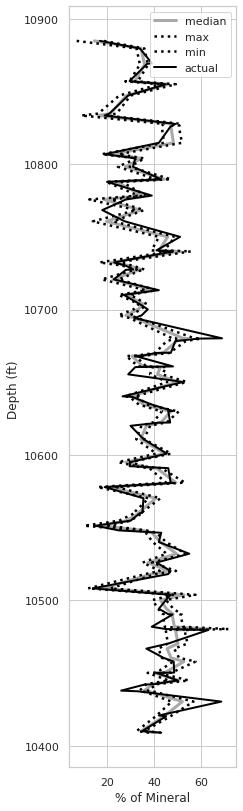

In [ ]:
# plt.plot(a1.transpose())
import seaborn
import matplotlib.pyplot as plt
       
# seaborn.set(style = 'whitegrid')  
# # tip = seaborn.load_dataset("tips")  
       
# seaborn.stripplot( data=a1) #x="day", y="total_bill",
# a1.shape
a =0
otp_df = a3
otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (3,14))
plt.plot( otp_df['median'],dep, label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot( otp_df['max'],dep, label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(otp_df['min'],dep,  label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot( df_o.iloc[:,int(a)],dep, label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('% of Mineral')
plt.ylabel('Depth (ft) ')



In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor

In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.iloc[: , 1:]
# df_o = df_o.iloc[: , 1:]
# # df_i = df_i.astype(float)
# # df_o = df_o.astype(float)

In [ ]:
# df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

# df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
# df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)

In [ ]:
from sklearn.linear_model import ElasticNet
a = 1
# b = 2240 
test_per = 8
list_alpha = []
list_l1 = [] 
list_iter = []
otp_df = pd.DataFrame()
list_r2_score = [] 
count = -1 

import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


for b in   np.linspace(10,10000,10):  # [7780,8890, 10000]: #
  count+=1 

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    
  regr_nn  = MLPRegressor( activation = 'relu',   solver = 'adam').fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,,hidden_layer_sizes=(4,2)
  # regr_nn  = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{ 'hidden_layer_sizes': [(3), (4), (4,4), (4,2)] ,  'max_iter': [100, 1000, 2000,5000, 10000, 20000], 'alpha': [ 0.001,  1, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  


  Y_pred_N = model_cv.predict(X_test)
  print(r2_score(Y_test, Y_pred_N))
  dict_par = model_cv.best_estimator_.__dict__
  list_r2_score.append(r2_score(Y_test, Y_pred_N))
  print(dict_par)
  list_alpha.append(dict_par['alpha'])
  # list_l1.append(dict_par['l1_ratio'])
  # list_iter.append(dict_par['max_iter'])


  y1 = model_cv.predict(df_i) 
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)

otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (14,4))
plt.plot(dep, otp_df['median'], label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(dep, otp_df['max'], label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(dep, otp_df['min'], label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(dep, df_o.iloc[:,int(a)], label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('Depth (ft)')
plt.ylabel('% of Mineral')

  # cv_results = pd.DataFrame(model_cv.cv_results_)
  # print(model_cv.best_estimator_)
  # print(cv_results.columns)


  # with open("cv_results_2.txt", 'w') as output:
  #     for row in cv_results:
  #         output.write(str(row) + '\n')


  # cv_results[['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
  #       'param_l1_ratio', 'params', 'split0_test_score', 'split1_test_score',
  #       'mean_test_score', 'std_test_score', 'rank_test_score',
  #       'split0_train_score', 'split1_train_score', 'mean_train_score',
  #       'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 



Fitting 2 folds for each of 144 candidates, totalling 288 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.8min finished


0.6395592625127533
{'activation': 'relu', 'solver': 'adam', 'alpha': 1, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 1000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 2), 'shuffle': True, 'random_state': 2, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 1000, 't_': 20000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[ 1.97609851e-01, -6.58490348e-02, -4.38067713e-03,
        -6.79867922e-02],
       [ 7.04317124e-01,  8.70937139e-04, -4.69296138e-15,
         3.34625061e-02],
       [ 1.16295994e+00,  2.20372877e+00,  7.98997373e-22,
        -9.64607332e-14],
       [-1.59477160e+00,  8.44507805e-01, -7.98454577e-03,
  

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 12.1min finished


0.8107297890562647
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 2000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 2), 'shuffle': True, 'random_state': 2, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901755A0, 'n_iter_': 2000, 't_': 40000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-1.60741662e-01, -2.78531378e-01,  2.05503601e-46,
         5.79283184e-47],
       [ 5.81129423e-01,  7.33079129e-01,  6.44434050e-47,
        -2.95166471e-47],
       [ 1.35019658e-02,  1.40385467e-02,  1.18380453e-47,
         1.25183612e-47],
       [-1.42586234e-01, -3.14381390e-01,  2.93977786e-47,


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 12.0min finished


0.8011165992730652
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 10000, 'loss': 'squared_loss', 'hidden_layer_sizes': 4, 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 10000, 't_': 200000, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[-5.17685893e-230,  7.44797781e-001, -3.35042972e-001,
        -4.20787309e-001],
       [-4.53960375e-228, -3.15040070e-001,  1.44308623e-001,
         1.80600161e-001],
       [ 9.90118040e-229, -2.23135365e-002,  1.57933965e-002,
         1.96344175e-002],
       [ 3.29723575e-229,  6.18106887e-001, -2.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.9min finished


0.7634196475927033
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 10000, 'loss': 'squared_loss', 'hidden_layer_sizes': 3, 'shuffle': True, 'random_state': 2, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901755A0, 'n_iter_': 10000, 't_': 200000, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[-7.58928093e-001, -1.28203522e-227,  4.64630847e-155],
       [ 4.49770651e-001, -5.83067434e-005,  1.18685901e-222],
       [ 1.53308061e-001,  4.81811392e-027,  9.63808471e-229],
       [-5.90224157e-001, -6.05075682e-026,  1.13973228e-219],
       [ 2.91031703e-002, -1.41798509e-010,  1.05762724e-227],
 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.7min finished


0.7917060342289456
{'activation': 'relu', 'solver': 'adam', 'alpha': 1, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 2000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 4), 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 2000, 't_': 40000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-1.30782431e-47, -3.92011430e-47, -1.39355628e-01,
        -1.28857476e-01],
       [-4.03077638e-45,  5.46898782e-46,  7.00589248e-02,
         8.57762245e-01],
       [-4.89964779e-46, -3.17426122e-47, -6.81527322e-46,
         1.97209746e+00],
       [-1.69145756e-46,  6.37314713e-46, -3.40868661e-04,


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.5min finished


0.7499136072351513
{'activation': 'relu', 'solver': 'adam', 'alpha': 1, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 20000, 'loss': 'squared_loss', 'hidden_layer_sizes': (4, 4), 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901755A0, 'n_iter_': 20000, 't_': 400000, 'n_layers_': 4, 'out_activation_': 'identity', 'coefs_': [array([[-8.66852978e-004,  2.46018729e-147, -6.53621952e-242,
        -1.30500989e-001],
       [-2.36332782e-004, -1.21033427e-187,  3.06463511e-253,
         2.19891653e-001],
       [-2.44232620e-009,  6.82719778e-214, -3.12825483e-105,
         3.83701655e-001],
       [-1.50279158e-011,  2.07693791e-213, 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 11.7min finished


0.753908128375173
{'activation': 'relu', 'solver': 'adam', 'alpha': 300, 'batch_size': 'auto', 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'power_t': 0.5, 'max_iter': 20000, 'loss': 'squared_loss', 'hidden_layer_sizes': 4, 'shuffle': True, 'random_state': 100, 'tol': 0.0001, 'verbose': False, 'warm_start': False, 'momentum': 0.9, 'nesterovs_momentum': True, 'early_stopping': False, 'validation_fraction': 0.1, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-08, 'n_iter_no_change': 10000, 'max_fun': 15000, 'n_outputs_': 1, '_random_state': RandomState(MT19937) at 0x7F24901756B0, 'n_iter_': 18301, 't_': 366020, 'n_layers_': 3, 'out_activation_': 'identity', 'coefs_': [array([[-2.76938388e-06, -3.48000676e-04, -5.45358778e-01,
        -6.28411204e-01],
       [ 1.63168272e-08, -8.08585811e-05,  3.44873295e-01,
         3.98126348e-01],
       [-6.19276941e-14,  1.40033396e-06,  1.46448915e-02,
         1.94940249e-02],
       [ 1.83332365e-08, -3.61902300e-08, -1.62798988e-01,
 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


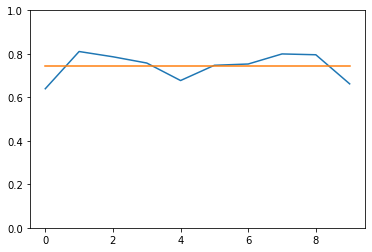

In [ ]:
plt.plot(list_r2_score)
plt.ylim((0,1))
plt.plot([sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10,sum(list_r2_score)/10])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor


# Create a random dataset
rng = np.random.RandomState(1)
X = np.sort(200 * rng.rand(600, 1) - 100, axis=0)
y = np.array([np.pi * np.sin(X).ravel(), np.pi * np.cos(X).ravel()]).T
y += (0.5 - rng.rand(*y.shape))

X_train, X_test, y_train, y_test = train_test_split(
    df_i, df_o, train_size=10, test_size=94, random_state=4)

max_depth = 30
regr_multirf = MultiOutputRegressor(MLPRegressor)
regr_multirf.fit(X_train, y_train)

regr_rf = RandomForestRegressor(n_estimators=100, max_depth=max_depth, random_state=2)
regr_rf.fit(X_train, y_train)

# Predict on new data
y_multirf = regr_multirf.predict(X_test)
y_rf = regr_rf.predict(X_test)


TypeError: ignored

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor


# Create a random dataset
rng = np.random.RandomState(1)
X = np.sort(200 * rng.rand(600, 1) - 100, axis=0)
y = np.array([np.pi * np.sin(X).ravel(), np.pi * np.cos(X).ravel()]).T
y += (0.5 - rng.rand(*y.shape))

X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=400, test_size=200, random_state=4)

max_depth = 30 # early_stopping = True ,
regr_multirf = MultiOutputRegressor(MLPRegressor( max_iter=20000 ,activation = 'relu', learning_rate_init= 0.01,n_iter_no_change = 1000,  solver = 'adam',hidden_layer_sizes=(4,2)) # learning_rate_init= 0.01,n_iter_no_change = 1000,) .fit(X_train, Y_train))
regr_multirf.fit(X_train, y_train)

# regr_rf = RandomForestRegressor(n_estimators=100, max_depth=max_depth,
#                                 random_state=2)
# regr_rf.fit(X_train, y_train)

# Predict on new data
y_multirf = regr_multirf.predict(X_test)
y_rf = regr_rf.predict(X_test)

# Plot the results
plt.figure()
s = 50
a = 0.4
plt.scatter(y_test[:, 0], y_test[:, 1], edgecolor='k', c="navy", s=s, marker="s", alpha=a, label="Data")
plt.scatter(y_multirf[:, 0], y_multirf[:, 1], edgecolor='k', c="cornflowerblue", s=s, alpha=a, label="Multi RF score=%.2f" % regr_multirf.score(X_test, y_test))
# plt.scatter(y_rf[:, 0], y_rf[:, 1], edgecolor='k',             c="c", s=s, marker="^", alpha=a,             label="RF score=%.2f" % regr_rf.score(X_test, y_test))
plt.xlim([-6, 6])
plt.ylim([-6, 6])
plt.xlabel("target 1")
plt.ylabel("target 2")
plt.title("Comparing random forests and the multi-output meta estimator")
plt.legend()
plt.show()

SyntaxError: ignored

0.4267707779249407


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


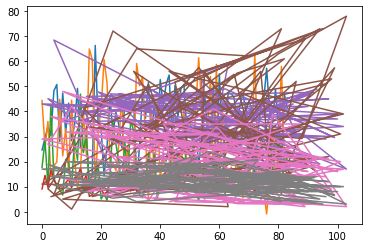

In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
X, y = make_regression(n_samples=200, random_state=1)
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1)
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o, random_state = int(b), test_size= (8/10))
                                                    
regr = MLPRegressor(random_state=1, max_iter=500).fit(X_train, Y_train)
c = regr.predict(X_test) # [:2])
# print(c.iloc[: , 0].shape)
# print(Y_test.iloc[: , 0].shape)
# print(regr.score(c.iloc[: , 0], np.array(Y_test.iloc[: , 0])))
print(r2_score(c,Y_test))


In [ ]:
# a = 2
# b = 9980 
test_per = 8 
val = [] 
val_0 = [] 
val_elastic = [] 


for b in  np.linspace(1,10000,3):  # [9980]: #
    
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o, random_state = int(b), test_size= (test_per/10))
  
  # X_train, X_test, Y_train_0, Y_test_0 = model_selection.train_test_split(df_i, df_o.iloc[:,int(0)], random_state = int(b), test_size= (test_per/10))
  regr_nn  = MLPRegressor(  early_stopping = True , max_iter=20000 ,activation = 'relu',   solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,
  # regr_nn  = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{'alpha': [ 0.001,  1, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(np.array(X_train, Y_train))










/usr/local/lib/python3.7/dist-packages/sklearn/base.py:434: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multioutput='uniform_average').", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:434: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multi

TypeError: ignored

In [ ]:
# Y_pred_N = model_cv.predict(X_test)
# print('multi_output', r2_score(Y_test, Y_pred_N))
# dict_par = model_cv.best_estimator_.__dict__
# list_r2_score.append(r2_score(Y_test, Y_pred_N))
# list_alpha.append(dict_par['alpha'])
# val_elastic.append(r2_score(Y_test_0, Y_pred_N))





# plt.plot(np.array(Y_test_0)) 
# plt.plot(np.array(Y_pred_0))

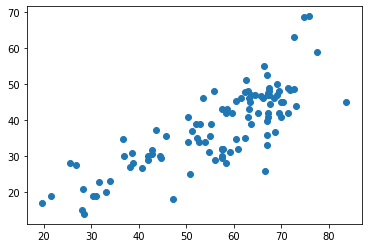

In [ ]:
plt.scatter(df_i['SiO2-%'] , df_o['carbonate'])

In [ ]:
from numpy import savetxt
savetxt('Input_Data.csv', df_i, delimiter=',')

savetxt('Output_Data.csv', df_o, delimiter=',')


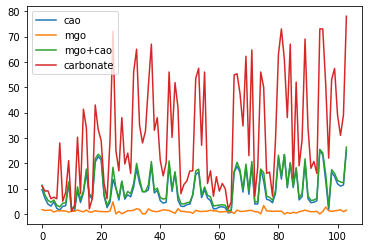

In [ ]:
plt.plot(df_i['CaO-%'], label = 'cao')
plt.plot(df_i['MgO-%'], label = 'mgo')
plt.plot(df_i['CaO-%'] +df_i['MgO-%'], label = 'mgo+cao' )
plt.plot(df_o['carbonate'], label = 'carbonate')
plt.legend()

0.7141658043704747


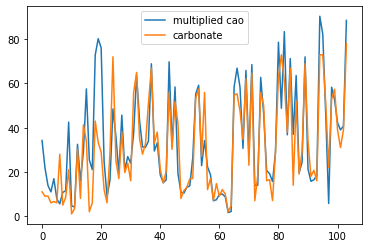

In [ ]:
plt.plot((df_o['carbonate']/df_i['CaO-%']).mean()*df_i['CaO-%'], label = 'multiplied cao')
# plt.plot(df_i['MgO-%'], label = 'mgo')
# plt.plot(df_i['CaO-%'] +df_i['MgO-%'], label = 'mgo+cao' )
plt.plot(df_o['carbonate'], label = 'carbonate')
plt.legend()

print(r2_score((df_o['carbonate']/df_i['CaO-%']).mean()*df_i['CaO-%'],df_o['carbonate'] ))

In [ ]:
from scipy import stats 

c = df_i['K2O-%'] + df_i['Fe2O3-%']/1.7
d = df_i['K2O-%'] + df_i['Al2O3-%']/5
e = df_i['Fe2O3-%'] + df_i['Al2O3-%']/3
f =  df_i['Al2O3-%']/5 + df_i['Fe2O3-%']/1.7 +  df_i['K2O-%']
# df_i['SiO2-%']-(6)*df_i['K2O-%']
pearson_coef, p_value = stats.pearsonr(f , df_o['clay'])
print(pearson_coef, p_value)
# pearson_coef, p_value = stats.pearsonr(df_i['SiO2-%']-(.3)*df_i['K2O-%'] , df_o['clay'])
# print(pearson_coef, p_value)



0.8622715114962015 6.636029050805813e-32


In [ ]:
a = 2
b = 9980 
test_per = 8 
val = [] 
val_0 = [] 
val_elastic = [] 
for b in  np.linspace(1,10000,10):  # [9980]: #
    
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
  
  X_train, X_test, Y_train_0, Y_test_0 = model_selection.train_test_split(df_i, df_o.iloc[:,int(0)], random_state = int(b), test_size= (test_per/10))


  a1 = (Y_train/ X_train['K2O-%'] ).mean()
  a2 = (Y_train/ X_train['Al2O3-%'] ).mean()
  a3 = (Y_train/ X_train['Fe2O3-%'] ).mean()

  Y_pred = (a1*X_test['K2O-%'] + a2*X_test['Al2O3-%'] + a3*X_test['Fe2O3-%'])/3 
  # print(r2_score(Y_test, Y_pred))
  val.append(r2_score(Y_test, a1*X_test['K2O-%']))
  print('score for clay ', r2_score(Y_test, a1*X_test['K2O-%']))

  remainder  = 100 - a1*X_test['K2O-%']

  # print(remainder/ len(remainder))
  max_coef = -99999999999
  max_coef_idx = 0 
  curr_max = -9999999999
  curr_max_idx = 0 

  for i in np.linspace(0,15,20):
    X_train['quart_sio2'] = X_train['SiO2-%'] - i*X_train['K2O-%']
    temp = r2_score(X_train['quart_sio2'] , Y_train_0)
    if temp > curr_max :
      curr_max = temp 
      curr_max_idx = i 
    pearson_coef, p_value = stats.pearsonr(X_train['quart_sio2'] , Y_train_0)
    if pearson_coef > max_coef:
      max_coef = pearson_coef
      max_coef_idx = i 
  print(max_coef, max_coef_idx)
  print(curr_max,curr_max_idx)

  X_train['quart_sio2'] = X_train['SiO2-%'] - curr_max_idx*X_train['K2O-%']
  X_test['quart_sio2'] = X_test['SiO2-%'] - curr_max_idx*X_test['K2O-%']
  
  a4 = (Y_train/ X_train['quart_sio2'] ).mean()
  Y_pred_0 = X_test['SiO2-%'] - curr_max_idx*X_test['K2O-%']

  val_0.append(r2_score(Y_test_0, Y_pred_0))
  print(' for quartz', r2_score(Y_test_0, Y_pred_0))

  regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # hyper_params = [{'alpha': [ 0.001,  1, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(np.array(X_train['quart_sio2']).reshape(-1, 1), Y_train_0)  


  Y_pred_N = model_cv.predict(np.array(X_test['quart_sio2']).reshape(-1, 1))
  print('from elastic net', r2_score(Y_test_0, Y_pred_N))
  # dict_par = model_cv.best_estimator_.__dict__
  # list_r2_score.append(r2_score(Y_test, Y_pred_N))
  # list_alpha.append(dict_par['alpha'])
  val_elastic.append(r2_score(Y_test_0, Y_pred_N))





  # plt.plot(np.array(Y_test_0)) 
  # plt.plot(np.array(Y_pred_0))






  








score for clay  0.7605026661417126
0.8913560532587472 6.315789473684211
0.6716391925523035 9.473684210526315
 for quartz 0.5114165464203635
Fitting 2 folds for each of 280 candidates, totalling 560 fits


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

from elastic net 0.6197188501289539
score for clay  0.7591958744487863
0.9002671535313864 7.894736842105264
0.7296014640474737 9.473684210526315
 for quartz 0.5067017327978807
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.1s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.5475913973349678
score for clay  0.7816820930998957
0.9133891910315564 4.7368421052631575
0.6798413208588842 11.842105263157896
 for quartz 0.48627161313755896
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.1s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.4919814574067046
score for clay  0.6962292581279117
0.9096463072378866 6.315789473684211
0.40960224955930136 9.473684210526315
 for quartz 0.5206584840808566
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.1s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.3448986233872742
score for clay  0.7146464090887075
0.7847084291451932 7.105263157894737
0.2115733639357259 10.263157894736842
 for quartz 0.6228488112235738
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.1s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.6572146034400301
score for clay  0.727080386069173
0.8651465314377974 7.105263157894737
0.6778261051082451 9.473684210526315
 for quartz 0.5574838812295428
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.1s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.6320062494276375
score for clay  0.7603111639825417
0.8800249552946968 8.68421052631579
0.7036672277260354 9.473684210526315
 for quartz 0.5353692229741551
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.1s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.574965636725675
score for clay  0.7111337650687992
0.8324610485569687 7.894736842105264
0.5897162413170594 10.263157894736842
 for quartz 0.5955331435633588
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.0s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.6635513477765909
score for clay  0.7932127602080004
0.8216680028406643 7.105263157894737
0.6055553942517943 11.842105263157896
 for quartz 0.524012642198252
Fitting 2 folds for each of 280 candidates, totalling 560 fits


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.0s finished
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

from elastic net 0.5822237762226374
score for clay  0.7577896535719789
0.8499309731076927 3.1578947368421053
0.5715768547122144 11.842105263157896
 for quartz 0.571549018241694
Fitting 2 folds for each of 280 candidates, totalling 560 fits
from elastic net 0.5510478729630426


[Parallel(n_jobs=1)]: Done 560 out of 560 | elapsed:    1.1s finished


In [ ]:
val_elastic

[0.6197188501289539,
 0.5475913973349678,
 0.4919814574067046,
 0.3448986233872742,
 0.6572146034400301,
 0.6320062494276375,
 0.574965636725675,
 0.6635513477765909,
 0.5822237762226374,
 0.5510478729630426]

In [ ]:
sum(val_elastic)/len(val_elastic)

0.5665199814813514

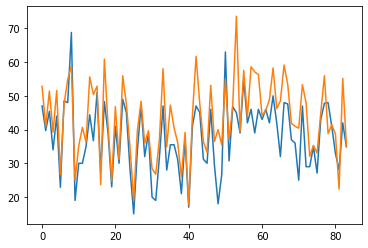

In [ ]:
# plt.plot(np.array(X_train['quart_sio2']))
# plt.plot(np.array(Y_train_0))

plt.plot(np.array(Y_test_0))
plt.plot(np.array(Y_pred_0))


In [ ]:
print(sum(remainder)/ len(remainder))


81.38673263971648


In [ ]:
a = 2
b = 9980 
test_per = 8 
val = [] 
for b in np.linspace(1,10000,30): 
    
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
  a1 = (Y_train/ X_train['K2O-%'] ).mean()
  a2 = (Y_train/ X_train['Al2O3-%'] ).mean()
  a3 = (Y_train/ X_train['Fe2O3-%'] ).mean()

  Y_pred = (a1*X_test['K2O-%'] + a2*X_test['Al2O3-%'] + a3*X_test['Fe2O3-%'])/3 

  print(r2_score(Y_test, Y_pred))

  val.append(r2_score(Y_test, a1*X_test['K2O-%']))
  
  r2_score(Y_test, a1*X_test['K2O-%'])

  # r2_score(Y_test, a2*X_test['Al2O3-%'])

  # r2_score(Y_test, a3*X_test['Fe2O3-%'])



  # remainder is 


In [ ]:
sum(val)/len(val)
# val

0.7448699577616977

In [ ]:
# Predict Clay 


In [ ]:
# a1 = pd.read_csv('NN_Quartz_list_r2_score.csv')
# a2 = pd.read_csv('XGB_Quartz_list_r2_score.csv')
# a3 = pd.read_csv('RF_Quartz_list_r2_score (1).csv')
# a4 = pd.read_csv('enet_quartztest_r2_score.csv')

a1 = pd.read_csv('FE_latestNN_Carbonate_list_r2_score.csv')
a2 = pd.read_csv('XGB_Carbonate_list_r2_score.csv')
a3 = pd.read_csv('RF_carbonate_list_r2_score.csv')
a4 = pd.read_csv('enet_carbonate_test_r2_score.csv')

# a1 = pd.read_csv('NN_Clay_list_r2_score.csv')
# a2 = pd.read_csv('XGB_Clay_list_r2_score.csv')
# a3 = pd.read_csv('RF_clay_list_r2_score.csv')
# a4 = pd.read_csv('enet_clay_test_r2_score.csv')


(0.0, 1.0)

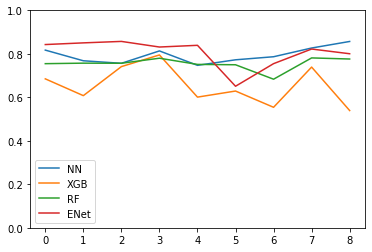

In [ ]:
plt.plot(a1, label = 'NN')
plt.plot(a2[0:9], label = 'XGB')
plt.plot(a3[0:9], label = 'RF')
plt.plot(a4[0:9], label = 'ENet')
plt.legend()
plt.ylim((0,1))

In [ ]:
(df_i['Al2O3-%'] / df_i['Fe2O3-%']).mean()

3.1075557240294454

In [ ]:
Y_test.max()

78.0

In [ ]:
np.linspace(0,5,20)

array([0.        , 0.26315789, 0.52631579, 0.78947368, 1.05263158,
       1.31578947, 1.57894737, 1.84210526, 2.10526316, 2.36842105,
       2.63157895, 2.89473684, 3.15789474, 3.42105263, 3.68421053,
       3.94736842, 4.21052632, 4.47368421, 4.73684211, 5.        ])

In [ ]:
max_coef = -99999999999
max_coef_idx = 0 
for i in np.linspace(0,5,20):
  X_train['carb_mgo'] = X_train['MgO-%'] - i*X_train['K2O-%']
  pearson_coef, p_value = stats.pearsonr(X_train['carb_mgo'] , Y_train)
  if pearson_coef > max_coef:
    max_coef = pearson_coef
    max_coef_idx = i 
print(max_coef, max_coef_idx)

X_train['carb_mgo'] = X_train['MgO-%'] - max_coef_idx*X_train['K2O-%']
X_test['carb_mgo'] = X_test['MgO-%'] - max_coef_idx*X_test['K2O-%']



# X_train['carb_mgo'] = (X_train['carb_mgo'] - X_train['carb_mgo'].min())/(X_train['carb_mgo'] - X_train['carb_mgo'].max())
# a5 = (Y_train/X_train['carb_mgo']).mean()

# X_test['carb_mgo'] = X_test['MgO-%'] - max_coef_idx*X_test['K2O-%']
# Y_pred = a5*X_test['carb_mgo']

# print(r2_score(Y_test, Y_pred))

# plt.plot(np.array(X_train['carb_mgo']))

# plt.plot(np.array(Y_train))

0.7330070686333934 1.8421052631578947


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] 

ValueError: ignored

4.428859948083155

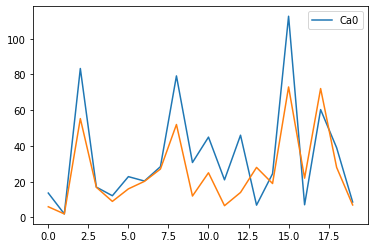

In [ ]:
plt.plot(np.array(a8*X_train['CaO-%']), label = 'Ca0') #  + X_train['MgO-%']
# plt.plot(np.array(X_train['K2O-%']))
plt.plot(np.array(Y_train))
plt.legend()
a8 = (Y_train/(X_train['CaO-%'] )).mean()
# plt.plot(X_test['CaO-%'])
a8

0.532328718057879


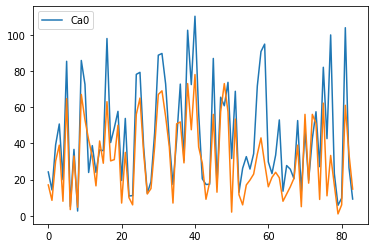

In [ ]:
plt.plot(np.array(a8*(X_test['CaO-%'] )), label = 'Ca0') #  + X_train['MgO-%']
# plt.plot(np.array(X_train['K2O-%']))
plt.plot(np.array(Y_test))
plt.legend()
# a8 = (Y_train/X_train['CaO-%']).mean()
# plt.plot(X_test['CaO-%'])
print(r2_score(a8*X_test['CaO-%'],Y_test))

In [ ]:
df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']

# df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
# df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)






In [ ]:
np.linspace(10,10000,10)

array([   10.,  1120.,  2230.,  3340.,  4450.,  5560.,  6670.,  7780.,
        8890., 10000.])

In [ ]:
np.linspace(10,10000,10)


array([   10.,  1120.,  2230.,  3340.,  4450.,  5560.,  6670.,  7780.,
        8890., 10000.])

In [ ]:
from sklearn.linear_model import ElasticNet
a = 1
# b = 2240 
test_per = 8
list_alpha = []
list_l1 = [] 
list_iter = []
otp_df = pd.DataFrame()
list_r2_score = [] 
count = -1 
for b in   np.linspace(10,10000,10):  # [7780,8890, 10000]: #
  count+=1 

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    
  regr_nn  = MLPRegressor(  early_stopping = True , max_iter=20000 ,activation = 'relu',   solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,
  # regr_nn  = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{'alpha': [ 0.001,  1, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  


  Y_pred_N = model_cv.predict(X_test)
  print(r2_score(Y_test, Y_pred_N))
  dict_par = model_cv.best_estimator_.__dict__
  list_r2_score.append(r2_score(Y_test, Y_pred_N))
  list_alpha.append(dict_par['alpha'])
  # list_l1.append(dict_par['l1_ratio'])
  # list_iter.append(dict_par['max_iter'])


  y1 = model_cv.predict(df_i) 
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)

otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (14,4))
plt.plot(dep, otp_df['median'], label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(dep, otp_df['max'], label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(dep, otp_df['min'], label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(dep, df_o.iloc[:,int(a)], label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('Depth (ft)')
plt.ylabel('% of Mineral')

  # cv_results = pd.DataFrame(model_cv.cv_results_)
  # print(model_cv.best_estimator_)
  # print(cv_results.columns)


  # with open("cv_results_2.txt", 'w') as output:
  #     for row in cv_results:
  #         output.write(str(row) + '\n')


  # cv_results[['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
  #       'param_l1_ratio', 'params', 'split0_test_score', 'split1_test_score',
  #       'mean_test_score', 'std_test_score', 'rank_test_score',
  #       'split0_train_score', 'split1_train_score', 'mean_train_score',
  #       'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 



NameError: ignored

In [ ]:
from sklearn.linear_model import ElasticNet
a = 1
# b = 2240 
test_per = 8
list_alpha = []
list_l1 = [] 
list_iter = []
otp_df = pd.DataFrame()
list_r2_score = [] 
count = -1 
for b in   np.linspace(10,10000,10):  # [7780,8890, 10000]: #
  count+=1 

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    
  regr_nn  = MLPRegressor(  early_stopping = True , max_iter=20000 ,activation = 'relu',   solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,
  # regr_nn  = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

   # step-1: create a cross-validation scheme
  folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  hyper_params = [{'alpha': [ 0.001,  1, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  model_cv = GridSearchCV(estimator = regr_nn, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  


  Y_pred_N = model_cv.predict(X_test)
  print(r2_score(Y_test, Y_pred_N))
  dict_par = model_cv.best_estimator_.__dict__
  list_r2_score.append(r2_score(Y_test, Y_pred_N))
  list_alpha.append(dict_par['alpha'])
  # list_l1.append(dict_par['l1_ratio'])
  # list_iter.append(dict_par['max_iter'])


  y1 = model_cv.predict(df_i) 
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)

otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (14,4))
plt.plot(dep, otp_df['median'], label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(dep, otp_df['max'], label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(dep, otp_df['min'], label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(dep, df_o.iloc[:,int(a)], label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('Depth (ft)')
plt.ylabel('% of Mineral')

  # cv_results = pd.DataFrame(model_cv.cv_results_)
  # print(model_cv.best_estimator_)
  # print(cv_results.columns)


  # with open("cv_results_2.txt", 'w') as output:
  #     for row in cv_results:
  #         output.write(str(row) + '\n')


  # cv_results[['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
  #       'param_l1_ratio', 'params', 'split0_test_score', 'split1_test_score',
  #       'mean_test_score', 'std_test_score', 'rank_test_score',
  #       'split0_train_score', 'split1_train_score', 'mean_train_score',
  #       'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 



In [ ]:
from sklearn.linear_model import ElasticNet
a = 1
# b = 2240 
test_per = 8
list_alpha = []
list_l1 = [] 
list_iter = []
otp_df = pd.DataFrame()
list_r2_score = [] 
count = -1 
for b in   np.linspace(10,10000,10):  # [7780,8890, 10000]: #
  count+=1 

  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    
  regr_nn  = MLPRegressor( alpha = 300, learning_rate_init = 0.01,n_iter_no_change = 1000,   early_stopping = True , max_iter=20000 ,activation = 'relu',   solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train) # learning_rate_init= 0.01,n_iter_no_change = 1000,
  # regr_nn  = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
  # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
  # regr_nn =  ElasticNet(alpha=0.1, l1_ratio=0.7, max_iter=10000, random_state=None).fit(X_train, Y_train) # enet # 

  # regr_nn =  ElasticNet()
  # regr_nn = RandomForestRegressor()
  # regr_nn = XGBRegressor(objective ='reg:squarederror')
 

  # step-1: create a cross-validation scheme
  # folds = KFold(n_splits = 2, shuffle = True, random_state = 100)

  # step-2: specify range of hyperparameters to tune
  # hyper_params = [{'l1_ratio': [0.001, 0.1, 0.2, 0.5, 0.7, 0.8, 0.9] , 'max_iter' : [1000, 3000, 5000, 10000, 20000], 'alpha': [0.001, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99, 0.999]}] 
  # hyper_params = [{ 'max_depth': [2,4,6,8,10] ,'min_samples_split':[2,4,6,8,10], 'max_features' : ['auto', 'sqrt', 'log2']}]
  # hyper_params = [{"max_depth": [2,4,6,8,10], "gamma": [0.01, 0.1, 0.3,0.6,0.7,0.9], "reg_alpha": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9], "reg_lambda": [0.001, 0.1, 0.3, 0.5, 0.7, 0.9]  }]
  # hyper_params = [{'alpha': [ 0.001,  1, 300], 'random_state': [2, 100], 'learning_rate_init': [0.01],'n_iter_no_change' : [10000] }]

  # 3.2 call GridSearchCV()
  # model_cv = GridSearchCV(estimator = regr_nn, scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

  # fit the model
  model_cv.fit(X_train, Y_train)  


  Y_pred_N = model_cv.predict(X_test)
  print(r2_score(Y_test, Y_pred_N))
  dict_par = model_cv.best_estimator_.__dict__
  list_r2_score.append(r2_score(Y_test, Y_pred_N))
  list_alpha.append(dict_par['alpha'])
  # list_l1.append(dict_par['l1_ratio'])
  # list_iter.append(dict_par['max_iter'])


  y1 = model_cv.predict(df_i) 
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)

otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (14,4))
plt.plot(dep, otp_df['median'], label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(dep, otp_df['max'], label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(dep, otp_df['min'], label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(dep, df_o.iloc[:,int(a)], label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('Depth (ft)')
plt.ylabel('% of Mineral')

  # cv_results = pd.DataFrame(model_cv.cv_results_)
  # print(model_cv.best_estimator_)
  # print(cv_results.columns)


  # with open("cv_results_2.txt", 'w') as output:
  #     for row in cv_results:
  #         output.write(str(row) + '\n')


  # cv_results[['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
  #       'param_l1_ratio', 'params', 'split0_test_score', 'split1_test_score',
  #       'mean_test_score', 'std_test_score', 'rank_test_score',
  #       'split0_train_score', 'split1_train_score', 'mean_train_score',
  #       'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 



Fitting 2 folds for each of 6 candidates, totalling 12 fits


Streaming output truncated to the last 5000 lines.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarnin

0.7458621614545304
Fitting 2 folds for each of 6 candidates, totalling 12 fits


Streaming output truncated to the last 5000 lines.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarnin

0.6152556317234525
Fitting 2 folds for each of 6 candidates, totalling 12 fits


Streaming output truncated to the last 5000 lines.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarnin

0.8111250591966648
Fitting 2 folds for each of 6 candidates, totalling 12 fits


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less th

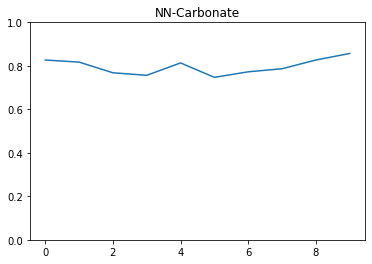

In [ ]:
plt.plot(list_r2_score)
plt.ylim((0,1))
plt.title("NN-Carbonate")
from numpy import savetxt
savetxt('FE_latestNN_Carbonate_mean_median.csv', otp_df, delimiter=',')
# list_r2_score
savetxt('FE_latestNN_Carbonate_list_r2_score.csv', list_r2_score, delimiter=',')

In [ ]:
sum(list_r2_score)/len(list_r2_score)

0.7972398937821709

[0.76568475 0.        ]
[[0.82828969 0.82697394 0.8036717  0.75058843 0.73896405 0.76295191
  0.77702919 0.84514919 0.81412478 0.76001812 0.49358254 0.78651668
  0.8127193  0.56311365 0.81114212 0.76033363 0.81830398 0.80797753
  0.73825865 0.81398586]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.        ]]
[[0.99086738 0.94844415 0.96864712 0.89111015 0.81861096 0.95577545
  0.9179558  0.84538715 0.84374258 0.89991606 0.88069474 0.96664556
  0.80115539 0.93534301 0.65355713 0.86453286 0.94095233 0.95723941
  0.86233596 0.90696207]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.        ]]


ElasticNet(alpha=0.8, copy_X=True, fit_intercept=True, l1_ratio=0.9,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

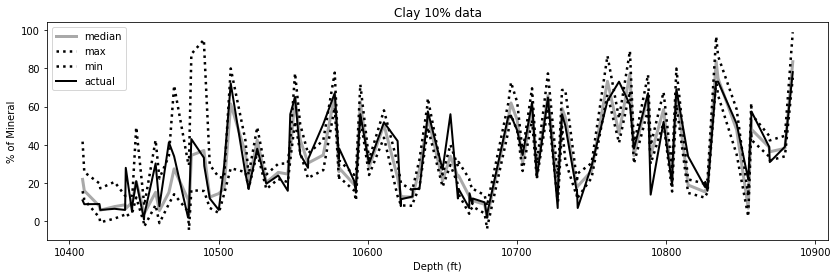

In [ ]:
from sklearn.linear_model import ElasticNet
a = 1
enet_plot_train_error_r2_0 = np.zeros((2,20))
enet_plot_train_error_spear_0 = np.zeros((2,20))
enet_plot_test_error_r2_0 = np.zeros((2,20))
enet_plot_test_error_spear_0 = np.zeros((2,20))

i= -1
j = -1 

otp_df = pd.DataFrame()

for test_per in [9]:
  i += 1 
  j = -1
  for b in np.linspace(10,20000,20): # [10, 1120, 2230, 3340, 4450,5560,6670, ]:
    j+= 1 
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
   
    # regr_nn  = MLPRegressor( max_iter=2000000, alpha =300,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
    # regr_nn  = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4).fit(X_train,Y_train) # = 
    # regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)
    regr_nn =  ElasticNet(alpha=0.8, l1_ratio=0.9, max_iter=1000, random_state=None).fit(X_train, Y_train) # enet 

    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    # plt.figure(figsize = (14,4))
    # plt.plot(np.array(Y_test))
    # plt.plot(np.array(Y_pred_N))
    # plt.title(r2_score(Y_test, Y_pred_N))
    
    # calculate error and store
    enet_plot_train_error_r2_0[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    enet_plot_train_error_spear_0[i,j] = coef1

    enet_plot_test_error_r2_0[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    enet_plot_test_error_spear_0[i,j] = coef 

    y1 = regr_nn.predict(df_i) 
    col_name = 'ABC' + str(i+j)
    otp_df.insert( i+j,col_name, y1)

otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (14,4))
plt.plot(dep, otp_df['median'], label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(dep, otp_df['max'], label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(dep, otp_df['min'], label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(dep, df_o.iloc[:,int(a)], label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('Depth (ft)')
plt.ylabel('% of Mineral')
plt.savefig( 'minmaxmedianactual', dpi  = 300)
plt.title('Clay 10% data')



print(enet_plot_test_error_r2_0.mean(axis = 1))
print(enet_plot_test_error_r2_0)
print(enet_plot_train_error_r2_0)
regr_nn


[0.62980599 0.74283777 0.78301586]
[[0.60474921 0.69275813 0.60713866 0.79984794 0.55329    0.71711268
  0.43374532]
 [0.79362596 0.80502346 0.72801261 0.67089767 0.75286313 0.74716103
  0.70228053]
 [0.83105607 0.7723965  0.80651209 0.74573975 0.5687063  0.83165606
  0.92504427]]
[[0.99981947 0.99981745 0.99968463 0.99977128 0.99978439 0.99957832
  0.99755533]
 [0.98749501 0.98849598 0.99297809 0.99143111 0.98743891 0.99061361
  0.97348606]
 [0.95610979 0.96909955 0.964656   0.96555269 0.98141396 0.96691418
  0.94892704]]


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=2, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [ ]:
from sklearn.linear_model import ElasticNet
a = 2
enet_plot_train_error_r2_0 = np.zeros((3,7))
enet_plot_train_error_spear_0 = np.zeros((3,7))
enet_plot_test_error_r2_0 = np.zeros((3,7))
enet_plot_test_error_spear_0 = np.zeros((3,7))
i= -1
j = -1 

for test_per in [1,3,7]:
  i += 1 
  j = -1
  for b in [10, 1120, 2230, 3340, 4450,5560,6670]:
    j+= 1 
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
   
    regr_nn = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=8).fit(X_train,Y_train)# = regr_nn = XGBRegressor(objective ='reg:squarederror', max_depth=2).fit(X_train, Y_train)

    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    enet_plot_train_error_r2_0[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    enet_plot_train_error_spear_0[i,j] = coef1

    enet_plot_test_error_r2_0[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    enet_plot_test_error_spear_0[i,j] = coef 




In [ ]:
print(enet_plot_test_error_r2_0.mean(axis = 1))
print(enet_plot_test_error_r2_0)
print(enet_plot_train_error_r2_0)
regr_nn

[0.61153513 0.69347081 0.66675259]
[[0.70602007 0.47634067 0.48020148 0.59365944 0.46579817 0.80719509
  0.75153098]
 [0.76231405 0.7120676  0.66966771 0.63837673 0.45610633 0.84398907
  0.77177416]
 [0.72156412 0.67345864 0.67513189 0.61366039 0.654868   0.64690745
  0.68167764]]
[[0.91722057 0.92173666 0.92178343 0.92844224 0.92958491 0.91070681
  0.91452584]
 [0.92430746 0.93737412 0.94435953 0.94181971 0.95726079 0.92286696
  0.92711727]
 [0.96759934 0.9758863  0.98143223 0.99112238 0.98235051 0.98433945
  0.972736  ]]


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=2, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [ ]:
from sklearn.linear_model import ElasticNet
a = 2
enet_plot_train_error_r2_0 = np.zeros((3,7))
enet_plot_train_error_spear_0 = np.zeros((3,7))
enet_plot_test_error_r2_0 = np.zeros((3,7))
enet_plot_test_error_spear_0 = np.zeros((3,7))
i= -1
j = -1 

for test_per in [1,3,7]:
  i += 1 
  j = -1
  for b in [10, 1120, 2230, 3340, 4450,5560,6670]:
    j+= 1 
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
   
    regr_nn = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=8).fit(X_train,Y_train)

    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    enet_plot_train_error_r2_0[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    enet_plot_train_error_spear_0[i,j] = coef1

    enet_plot_test_error_r2_0[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    enet_plot_test_error_spear_0[i,j] = coef 




In [ ]:
print(enet_plot_test_error_r2_0.mean(axis = 1))
print(enet_plot_test_error_r2_0)
print(enet_plot_train_error_r2_0)
regr_nn

[0.64540554 0.72456721 0.68830817]
[[0.65834918 0.42415678 0.66419311 0.56111769 0.5623341  0.81687234
  0.83081557]
 [0.77746502 0.71481611 0.72824685 0.68652166 0.55562276 0.82997598
  0.77932211]
 [0.75400248 0.71050585 0.6452539  0.63134975 0.67366895 0.70403095
  0.69934533]]
[[0.90172604 0.91235789 0.90791808 0.91939172 0.91772793 0.90485045
  0.90357994]
 [0.8851846  0.90135197 0.90831016 0.90847058 0.91807951 0.89815094
  0.90754393]
 [0.83396004 0.85293566 0.89177617 0.9373891  0.8945445  0.89661342
  0.87531333]]


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=8, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [ ]:
from sklearn.linear_model import ElasticNet
a = 0
enet_plot_train_error_r2_0 = np.zeros((3,7))
enet_plot_train_error_spear_0 = np.zeros((3,7))
enet_plot_test_error_r2_0 = np.zeros((3,7))
enet_plot_test_error_spear_0 = np.zeros((3,7))
i= -1
j = -1 

for test_per in [1,3,7]:
  i += 1 
  j = -1
  for b in [10, 1120, 2230, 3340, 4450,5560,6670]:
    j+= 1 
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
   
    regr_nn = ElasticNet(alpha=0.001, l1_ratio=0.7, random_state=None).fit(X_train, Y_train) # enet 

    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    enet_plot_train_error_r2_0[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    enet_plot_train_error_spear_0[i,j] = coef1

    enet_plot_test_error_r2_0[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    enet_plot_test_error_spear_0[i,j] = coef 




/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1324.311492620949, tolerance: 4.11437
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1458.6477454089238, tolerance: 4.48004847311828
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1162.2208747009206, tolerance: 4.176165247311828
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1411.1232363709266, t

In [ ]:
regr_nn

ElasticNet(alpha=0.001, copy_X=True, fit_intercept=True, l1_ratio=0.7,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [ ]:
print(enet_plot_train_error_r2_0)
print(enet_plot_test_error_r2_0.mean(axis = 1))
regr_nn

[[0.86071876 0.88155037 0.86957394 0.86788454 0.86358027 0.84334021
  0.8514106 ]
 [0.85473074 0.87376871 0.87165412 0.86201648 0.92306184 0.82517261
  0.80852291]
 [0.89266218 0.83179589 0.89532314 0.8637174  0.92769241 0.91017558
  0.72052259]]
[0.62322813 0.81323704 0.80934019]


ElasticNet(alpha=0.001, copy_X=True, fit_intercept=True, l1_ratio=0.7,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [ ]:
print(enet_plot_test_error_r2_0.mean(axis = 1))
print(global_enet_plot_test_error_r2_0.mean(axis = 1))


[0.69140158 0.71451994 0.68447606]
[0.79015712 0.74293541 0.77850674]


In [ ]:
from numpy import savetxt
savetxt('enet_plot_train_error_r2_0.csv', enet_plot_train_error_r2_0, delimiter=',')
savetxt('enet_plot_train_error_spear_0.csv', enet_plot_train_error_spear_0, delimiter=',')
savetxt('enet_plot_test_error_r2_0.csv', enet_plot_test_error_r2_0, delimiter=',')
savetxt('enet_plot_test_error_spear_0.csv', enet_plot_test_error_spear_0, delimiter=',')

In [ ]:
from sklearn.linear_model import ElasticNet
a = 0 
global_enet_plot_train_error_r2_0 = np.zeros((3,7))
global_enet_plot_train_error_spear_0 = np.zeros((3,7))
global_enet_plot_test_error_r2_0 = np.zeros((3,7))
global_enet_plot_test_error_spear_0 = np.zeros((3,7))
i= -1
j = -1 

for test_per in [1,3,7]:
  i += 1 
  j = -1
  for b in [10, 1120, 2230, 3340, 4450,5560,6670]:
    j+= 1 
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(6670), test_size= (test_per/10))
   
    regr_nn = ElasticNet(alpha=0.1, l1_ratio=0.7, random_state=b).fit(X_train, Y_train) # enet 

    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    global_enet_plot_train_error_r2_0[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    global_enet_plot_train_error_spear_0[i,j] = coef1

    global_enet_plot_test_error_r2_0[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    global_enet_plot_test_error_spear_0[i,j] = coef 




In [ ]:
from numpy import savetxt

savetxt('global_enet_plot_train_error_r2_0.csv', global_enet_plot_train_error_r2_0, delimiter=',')
savetxt('global_enet_plot_train_error_spear_0.csv', global_enet_plot_train_error_spear_0, delimiter=',')
savetxt('global_enet_plot_test_error_r2_0.csv', global_enet_plot_test_error_r2_0, delimiter=',')
savetxt('global_enet_plot_test_error_spear_0.csv', global_enet_plot_test_error_spear_0, delimiter=',')

savetxt('enet_plot_train_error_r2_0.csv', enet_plot_train_error_r2_0, delimiter=',')
savetxt('enet_plot_train_error_spear_0.csv', enet_plot_train_error_spear_0, delimiter=',')
savetxt('enet_plot_test_error_r2_0.csv', enet_plot_test_error_r2_0, delimiter=',')
savetxt('enet_plot_test_error_spear_0.csv', enet_plot_test_error_spear_0, delimiter=',')

ValueError: ignored

In [ ]:
a = 0 
b = 1120 

plot_train_error_r2_0 = np.zeros((9,10))
plot_train_error_spear_0 = np.zeros((9,10))
plot_test_error_r2_0 = np.zeros((9,10))
plot_test_error_spear_0 = np.zeros((9,10))

i= -1
j = -1

for test_per in np.linspace(1,9,9): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000
  i += 1 
  j = -1
  for rs in np.linspace(2,20,10):
    j+= 1 
    # print(rs,test_per)
    # plot_train_error_r2_0[i,j] = rs+ test_per
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    regr_nn = MLPRegressor( max_iter=2000000, alpha =300,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
    # regr_nn = XGBRegressor(objective ='reg:squarederror').fit(X_train, Y_train) # , random_state = int(rs)
    # predict output both test and train 
    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    plot_train_error_r2_0[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    plot_train_error_spear_0[i,j] = coef1

    plot_test_error_r2_0[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    plot_test_error_spear_0[i,j] = coef 


     
    

  




   
    

    

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving plot_train_error_spear_2.csv to plot_train_error_spear_2.csv
Saving plot_train_error_r2_2.csv to plot_train_error_r2_2.csv
Saving plot_test_error_spear_2.csv to plot_test_error_spear_2.csv
Saving plot_test_error_r2_2.csv to plot_test_error_r2_2.csv
Saving plot_train_error_spear_1.csv to plot_train_error_spear_1.csv
Saving plot_train_error_r2_1.csv to plot_train_error_r2_1.csv
Saving plot_test_error_spear_1.csv to plot_test_error_spear_1.csv
Saving plot_test_error_r2_1.csv to plot_test_error_r2_1.csv
Saving plot_train_error_spear_0.csv to plot_train_error_spear_0.csv
Saving plot_train_error_r2_0.csv to plot_train_error_r2_0.csv
Saving plot_test_error_spear_0.csv to plot_test_error_spear_0.csv
Saving plot_test_error_r2_0.csv to plot_test_error_r2_0.csv


In [ ]:
import pandas as pd 

In [ ]:
import io
plot_train_error_spear_2 = pd.read_csv(io.BytesIO(uploaded['plot_train_error_spear_2.csv']), header = None)
plot_train_error_r2_2 = pd.read_csv(io.BytesIO(uploaded['plot_train_error_r2_2.csv']), header = None)
plot_test_error_spear_2 = pd.read_csv(io.BytesIO(uploaded['plot_test_error_spear_2.csv']), header = None)
plot_test_error_r2_2 = pd.read_csv(io.BytesIO(uploaded['plot_test_error_r2_2.csv']), header = None)


Text(0.5, 1.0, 'clay')

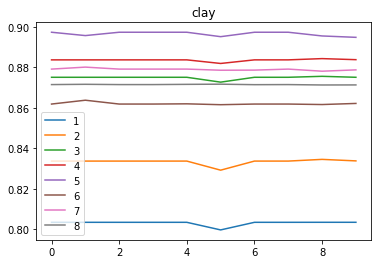

In [ ]:
plot_test_error_spear_2.columns = [1,2,3,4,5,6,7,8,9]
plot_test_error_spear_2  
plt.plot(plot_test_error_spear_2[[1,2,3,4,5,6,7,8]] )
plt.legend([1,2,3,4,5,6,7,8,9])      
plt.title('clay')                                                                                                                                                                                       

Text(0.5, 1.0, 'clay many trials 10 to 90 % ')

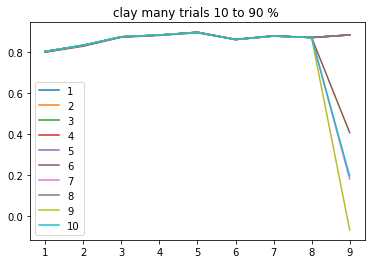

In [ ]:

plot_test_error_spear_2_t =   plot_test_error_spear_2.transpose()
plot_test_error_spear_2_t.columns = [1,2,3,4,5,6,7,8,9,10]
plt.plot(plot_test_error_spear_2_t[[1,2,3,4,5,6,7,8,9,10]] )
plt.legend([1,2,3,4,5,6,7,8,9,10])  # 
plt.title('clay many trials 10 to 90 % ')

In [ ]:
import io
plot_train_error_spear_1 = pd.read_csv(io.BytesIO(uploaded['plot_train_error_spear_1.csv']), header = None)
plot_train_error_r2_1 = pd.read_csv(io.BytesIO(uploaded['plot_train_error_r2_1.csv']), header = None)
plot_test_error_spear_1 = pd.read_csv(io.BytesIO(uploaded['plot_test_error_spear_1.csv']), header = None)
plot_test_error_r2_1 = pd.read_csv(io.BytesIO(uploaded['plot_test_error_r2_1.csv']), header = None)


Text(0.5, 1.0, 'carbonate')

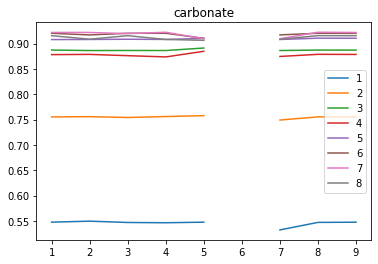

In [ ]:
plot_test_error_spear_1.columns = [1,2,3,4,5,6,7,8,9]
plot_test_error_spear_1
plt.plot(plot_test_error_spear_1[[1,2,3,4,5,6,7,8]] )
plt.legend([1,2,3,4,5,6,7,8,9])  
plt.title('carbonate')

Text(0.5, 1.0, 'carbonate many trials 10 to 90 %')

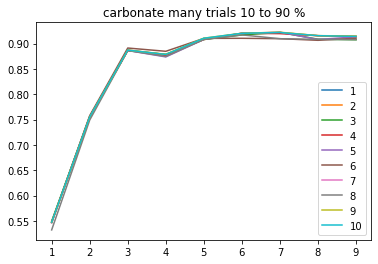

In [ ]:
plot_test_error_spear_1_t =   plot_test_error_spear_1.transpose()
plot_test_error_spear_1_t.columns = [1,2,3,4,5,6,7,8,9,10]
plt.plot(plot_test_error_spear_1_t[[1,2,3,4,5,6,7,8,9,10]] )
plt.legend([1,2,3,4,5,6,7,8,9,10])  # 
plt.title('carbonate many trials 10 to 90 %')

In [ ]:
import io
plot_train_error_spear_0 = pd.read_csv(io.BytesIO(uploaded['plot_train_error_spear_0.csv']), header = None)
plot_train_error_r2_0 = pd.read_csv(io.BytesIO(uploaded['plot_train_error_r2_0.csv']), header = None)
plot_test_error_spear_0 = pd.read_csv(io.BytesIO(uploaded['plot_test_error_spear_0.csv']), header = None)
plot_test_error_r2_0 = pd.read_csv(io.BytesIO(uploaded['plot_test_error_r2_0.csv']), header = None)


Text(0.5, 1.0, 'quartz')

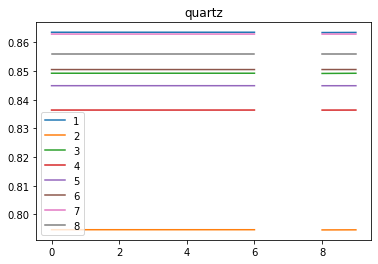

In [ ]:
plot_test_error_spear_0.columns = [1,2,3,4,5,6,7,8,9]
plot_test_error_spear_0
plt.plot(plot_test_error_spear_0[[1,2,3,4,5,6,7,8]] )
plt.legend([1,2,3,4,5,6,7,8,9])
plt.title('quartz')

Text(0.5, 1.0, 'quartz-10-90%')

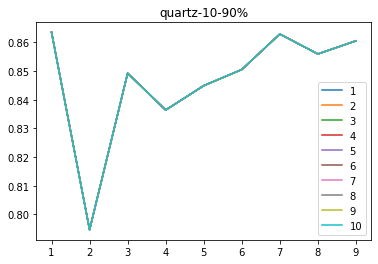

In [ ]:
plot_test_error_spear_0_t =   plot_test_error_spear_0.transpose()
plot_test_error_spear_0_t.columns = [1,2,3,4,5,6,7,8,9,10]
plt.plot(plot_test_error_spear_0_t[[1,2,3,4,5,6,7,8,9,10]] )
plt.legend([1,2,3,4,5,6,7,8,9,10])  # 
plt.title('quartz-10-90%') 

In [ ]:
from google.colab import files 
uploaded = files.upload()

# using data because of less common data in the other files. 

Saving tinput.dat to tinput.dat
Saving toutput.dat to toutput.dat


In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

In [ ]:
import io
import pandas as pd 
#from pandas.compat import StringIO
from io import StringIO

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn import preprocessing


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

from scipy import stats

# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import statistics


from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline



In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']

In [ ]:

df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
# df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)



# 'SiO2-%','CaO-%','MgO-%'
# df_i = df_i.drop(34)
# df_o = df_o.drop(34)

# df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
# df_i['QB'] = 100*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


# df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
# df_i['CRB'] =100*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


# df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
# df_i['CLB1'] =100*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

# df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
# df_i['CLB2'] =100*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

# df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
# df_i['CLB3'] =100*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())



In [ ]:
i= -1
j = -1
plot_train_error_r2_0 = np.zeros((10,9))  # rows 
for rs in np.linspace(2,20,10): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000
  i += 1 
  j = -1
  for test_per in np.linspace(1,9,9): # columns 
    j+= 1
    plot_train_error_r2_0[i,j] = test_per

plot_train_error_r2_0

array([[1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.],
       [1., 2., 3., 4., 5., 6., 7., 8., 9.]])

In [ ]:
a = 0 
b = 1120 

plot_train_error_r2_0 = np.zeros((9,10))
plot_train_error_spear_0 = np.zeros((9,10))
plot_test_error_r2_0 = np.zeros((9,10))
plot_test_error_spear_0 = np.zeros((9,10))

i= -1
j = -1

for test_per in np.linspace(1,9,9): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000
  i += 1 
  j = -1
  for rs in np.linspace(2,20,10):
    j+= 1 
    # print(rs,test_per)
    # plot_train_error_r2_0[i,j] = rs+ test_per
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    regr_nn = MLPRegressor( max_iter=2000000, alpha =300,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
    # regr_nn = XGBRegressor(objective ='reg:squarederror').fit(X_train, Y_train) # , random_state = int(rs)
    # predict output both test and train 
    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    plot_train_error_r2_0[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    plot_train_error_spear_0[i,j] = coef1

    plot_test_error_r2_0[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    plot_test_error_spear_0[i,j] = coef 


     
    

  




   
    

    

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation 

In [ ]:
plot_test_error_r2_0


array([[0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],


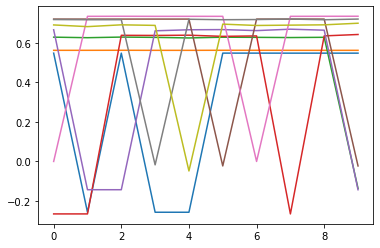

In [ ]:
plt.plot(plot_test_error_r2_0.transpose())

In [ ]:
(pd.DataFrame(plot_test_error_r2_0).iloc[1:3])

,0,1,2,3,4,5,6,7,8,9
1,0.561960,0.561994,0.562244,0.561848,0.561872,0.562219,0.562163,0.562003,0.561871,0.561981
2,0.628575,0.625879,0.628988,0.627495,0.624642,0.628358,0.627644,0.626604,0.627853,-0.137354


In [ ]:
plot_test_error_r2_0 # only depth was dropped and a new si was used. 

array([[0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],
       [0.7613878 , 0.62697725, 0.72424095, 0.68890845, 0.69614434,
        0.74568802, 0.67377536, 0.58822131, 0.38180606],


In [ ]:
plot_test_error_r2_0

array([[0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],
       [0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],
       [0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],
       [0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],
       [0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],
       [0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],
       [0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],
       [0.56213487, 0.55508105, 0.55690276, 0.55153205, 0.57493675,
        0.65241214, 0.60695827, 0.52805714, 0.3582703 ],


In [ ]:
# plot_train_error_r2_0 = np.zeros((10,9))
# plot_train_error_spear_0 = np.zeros((10,9))
# plot_test_error_r2_0 = np.zeros((10,9))
# plot_test_error_spear_0 = np.zeros((10,9))
from numpy import savetxt
savetxt('plot_train_error_r2_0.csv', plot_train_error_r2_0, delimiter=',')
savetxt('plot_train_error_spear_0.csv', plot_train_error_spear_0, delimiter=',')
savetxt('plot_test_error_r2_0.csv', plot_test_error_r2_0, delimiter=',')
savetxt('plot_test_error_spear_0.csv', plot_test_error_spear_0, delimiter=',')


In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']

In [ ]:

# df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']
df_i = df_i.drop(['depthi'], axis = 1)
# df_i = df_i.drop(['SiO2-%'], axis = 1)
# df_i = df_i.drop(['CaO-%'], axis = 1)
# df_i = df_i.drop(['MgO-%'], axis = 1)
# df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)




In [ ]:
a = 1 
b = 1120 

plot_train_error_r2_1 = np.zeros((10,9))
plot_train_error_spear_1 = np.zeros((10,9))
plot_test_error_r2_1 = np.zeros((10,9))
plot_test_error_spear_1 = np.zeros((10,9))

from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
# base_score=0.5, booster='gbtree', colsample_bylevel=1,
#              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
#              importance_type='gain', interaction_constraints='',
#              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
#              min_child_weight=1, missing=nan, monotone_constraints='()',
#              n_estimators=100, n_jobs=2, num_parallel_tree=1, random_state=100,
#              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
#             #  tree_method='exact', validate_parameters=1, verbosity=None

i= -1
j = -1

for rs in  np.linspace(2,20,10): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000
  i += 1 
  j = -1
  for test_per in np.linspace(1,9,9):
    j+= 1 
    # print(rs,test_per)
    # plot_train_error_r2_0[i,j] = rs+ test_per
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    # regr_nn = MLPRegressor(random_state=int(rs), max_iter=2000000, alpha =0.001 ,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
    # scores = cross_val_score(XGBRegressor(), X_train, Y_train, scoring='neg_mean_squared_error')
    regr_nn = XGBRegressor(objective ='reg:squarederror', random_state = int(rs) ).fit(X_train, Y_train) # , colsample_bytree = 0.3, learning_rate = 0.1, max_depth = 5, alpha = 10, n_estimators = 10
    # predict output both test and train 
    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    plot_train_error_r2_1[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    plot_train_error_spear_1[i,j] = coef1

    plot_test_error_r2_1[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    plot_test_error_spear_1[i,j] = coef 


In [ ]:
plot_test_error_r2_1 # attmpt 2, with some features. 

array([[0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],
       [0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],
       [0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],
       [0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],
       [0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],
       [0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],
       [0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],
       [0.1757368 , 0.49123088, 0.7451811 , 0.67656632, 0.76419434,
        0.79012597, 0.77523236, 0.74942099, 0.68563341],


In [ ]:
plot_test_error_r2_1

array([[-0.16791625,  0.7599624 ,  0.75749042,  0.68563341,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-0.16791625,  0.7599624 ,  0.75749042,  0.68563341,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-0.16791625,  0.7599624 ,  0.75749042,  0.68563341,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0

In [ ]:
plot_test_error_r2_1 # first xgb try 


array([[-0.16791625,  0.7599624 ,  0.75749042,  0.68563341,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-0.16791625,  0.7599624 ,  0.75749042,  0.68563341,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-0.16791625,  0.7599624 ,  0.75749042,  0.68563341,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0

In [ ]:
plot_test_error_r2_1

array([[-0.32766354, -0.17379285, -0.01685542, -0.05541871, -0.03305811,
        -0.00501356, -0.0156764 , -0.09457585, -0.00516682],
       [-1.2147066 , -0.23685224,  0.4521748 ,  0.40235494,  0.59287833,
         0.67155134,  0.71941987,  0.71301543,  0.69933582],
       [-1.21152273, -0.23469028,  0.45270587,  0.40271319,  0.59335494,
         0.67189716,  0.71966149,  0.71301543,  0.69933534],
       [-1.21470629, -0.23685304,  0.45216651,  0.40235805,  0.59287863,
         0.67155195,  0.71941987,  0.71301543,  0.69933582],
       [-1.21096533, -0.23398581,  0.45289294,  0.40292066,  0.59360278,
         0.6720024 ,  0.71967169,  0.71301543,  0.69933583],
       [-0.32765981, -0.17378967, -0.01685479, -0.05541869, -0.03305939,
        -0.00501395, -0.01567589, -0.09457587, -0.00516696],
       [-0.32766243, -0.1737899 , -0.01685504, -0.05541957, -0.03305914,
        -0.00501382, -0.01567568, -0.09457422, -0.00516706],
       [-1.20710145, -0.23039932,  0.45379988,  0.4035917 ,  0

In [ ]:
plot_test_error_r2_1

array([[-0.32766359, -0.01685543, -0.01567637, -0.00516679,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-1.06956364,  0.4632713 ,  0.66935067,  0.71847351,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-1.24017261,  0.44956612,  0.71702818,  0.42406527,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0

In [ ]:
from numpy import savetxt
savetxt('plot_train_error_r2_1.csv', plot_train_error_r2_1, delimiter=',')
savetxt('plot_train_error_spear_1.csv', plot_train_error_spear_1, delimiter=',')
savetxt('plot_test_error_r2_1.csv', plot_test_error_r2_1, delimiter=',')
savetxt('plot_test_error_spear_1.csv', plot_test_error_spear_1, delimiter=',')


In [ ]:
plot_test_error_r2_1
plot_test_error_spear_1

array([[       nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan],
       [0.54764481, 0.7551783 , 0.88705868, 0.87808111, 0.90774268,
        0.92014493, 0.92177587, 0.91540227, 0.91322069],
       [0.54960241, 0.75570825, 0.88613643, 0.87852392, 0.90795722,
        0.91689536, 0.92179444, 0.90851898, 0.90738295],
       [0.54701363, 0.75409473, 0.88628281, 0.87599907, 0.90841398,
        0.92020769, 0.91947993, 0.91544117, 0.91418406],
       [0.54647901, 0.75594455, 0.88617542, 0.87354411, 0.9080297 ,
        0.92016377, 0.92216589, 0.90798276, 0.91307132],
       [0.54761713, 0.75768756, 0.89108908, 0.88464453, 0.91011066,
        0.9102516 , 0.9095163 , 0.90631632, 0.9103486 ],
       [       nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan],
       [0.53234124, 0.7490444 , 0.88616228, 0.87445927, 0.90796867,
        0.91700484, 0.90941441, 0.90820909, 0.90775149],


In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']

df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)
dep = df_i['depthi']

In [ ]:

# df_i['new_sio2'] = df_i['SiO2-%'] - 6*df_i['K2O-%']
# df_i['new-mg-ca'] = 100 - df_i['CaO-%'] - df_i['MgO-%']

# df_i['new-mg-ca'] = 100 - df_i['Al2O3-%'] - df_i['Fe2O3-%']  - df_i['K2O-%'] - df_i['SiO2-%']
df_i = df_i.drop(['depthi'], axis = 1)
df_i = df_i.drop(['SiO2-%'], axis = 1)
df_i = df_i.drop(['CaO-%'], axis = 1)
df_i = df_i.drop(['MgO-%'], axis = 1)
df_i = df_i.drop(['Al2O3-%'], axis = 1)
# df_i = df_i.drop(['Fe2O3-%'], axis = 1)
# df_i = df_i.drop(['K2O-%'], axis = 1)



In [ ]:
a = 2 
b = 1120 

plot_train_error_r2_2 = np.zeros((10,9))
plot_train_error_spear_2 = np.zeros((10,9))
plot_test_error_r2_2 = np.zeros((10,9))
plot_test_error_spear_2 = np.zeros((10,9))

i= -1
j = -1

for rs in np.linspace(2,20,10): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000
  i += 1 
  j = -1
  for test_per in np.linspace(1,9,9):
    j+= 1 
    # print(rs,test_per)
    # plot_train_error_r2_0[i,j] = rs+ test_per
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (test_per/10))
    # regr_nn = MLPRegressor(random_state=int(rs), max_iter=2000000, alpha =0.0001,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(3)).fit(X_train, Y_train)
    regr_nn = XGBRegressor(objective ='reg:squarederror', random_state = int(rs) ).fit(X_train, Y_train)
    # predict output both test and train 
    Y_pred_N = regr_nn.predict(X_test)      
    Y_train_pred_N = regr_nn.predict(X_train)
    
    # calculate error and store
    plot_train_error_r2_2[i,j] = r2_score(Y_train, Y_train_pred_N)
    coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
    plot_train_error_spear_2[i,j] = coef1

    plot_test_error_r2_2[i,j] = r2_score(Y_test, Y_pred_N)
    coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
    plot_test_error_spear_2[i,j] = coef 

In [ ]:
from numpy import savetxt
savetxt('plot_train_error_r2_2.csv', plot_train_error_r2_2, delimiter=',')
savetxt('plot_train_error_spear_2.csv', plot_train_error_spear_2, delimiter=',')
savetxt('plot_test_error_r2_2.csv', plot_test_error_r2_2, delimiter=',')
savetxt('plot_test_error_spear_2.csv', plot_test_error_spear_2, delimiter=',')


In [ ]:
plot_test_error_r2_2

array([[0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],
       [0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],
       [0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],
       [0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],
       [0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],
       [0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],
       [0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],
       [0.50963012, 0.50849401, 0.62559194, 0.57060175, 0.71739491,
        0.64863298, 0.68638014, 0.6935796 , 0.35081564],


In [ ]:
plot_test_error_r2_2

array([[ 0.48868191,  0.60618624,  0.69155303,  0.72024735,  0.77561969,
         0.71257087,  0.76201715,  0.75851289,  0.77702316],
       [ 0.48868191,  0.60618623,  0.69155302,  0.72024734,  0.78275243,
         0.72626706,  0.76948195,  0.75913771,  0.77697926],
       [ 0.48868192,  0.60618625,  0.69155304,  0.72024736,  0.7756197 ,
         0.71256806,  0.76201711,  0.75850894,  0.77693242],
       [ 0.4886819 ,  0.60618623,  0.69155302,  0.72024759,  0.77561979,
         0.71256797,  0.76201704,  0.75850876,  0.77701914],
       [ 0.48868192,  0.60618624,  0.69155303,  0.72024735,  0.77561969,
         0.71276638,  0.7620311 ,  0.75873102,  0.77702318],
       [ 0.50037104,  0.60630994,  0.69385926,  0.72187977,  0.7812454 ,
         0.71405958,  0.76405074,  0.75915023, -0.04878942],
       [ 0.48868192,  0.60618624,  0.69155303,  0.72024735,  0.77561969,
         0.71256804,  0.76428167,  0.75892334, -0.51334964],
       [ 0.48868191,  0.60618624,  0.69155303,  0.72024735,  0

In [ ]:

from scipy import stats
plot_train_error_r2_0 = [] 
plot_train_error_spear_0 = [] 
plot_test_error_r2_0 = [] 
plot_test_error_spear_0 = [] 

a = 0
loss_list = [] 
otp_df = pd.DataFrame()
count = -1 

for rs in np.linspace(2,20,10): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000
  for test_per in np.linspace(1,10,10)


  count +=1 
  b = 1120 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (3/10))
  # fit, transform 
  regr_nn = MLPRegressor(random_state=int(rs), max_iter=2000000, alpha =300,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
  # pd.DataFrame(regr_nn.loss_curve_).plot()
  # print(regr_nn.loss_curve_)
  l1 = list(regr_nn.loss_curve_)
  loss_list.append(l1[0:50000])
  y1 = regr_nn.predict(df_i)
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)


  Y_pred_N = regr_nn.predict(X_test)
  # calculate error and store  
  print( " testing",rs,  r2_score(Y_test, Y_pred_N))
  coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
  corr, _ = stats.spearmanr(Y_test , Y_pred_N)
  plot_test_error.append(coef)
  plot_test_error_spear.append(corr)
  Y_train_pred_N = regr_nn.predict(X_train)
  print( " training",rs,  r2_score(Y_train, Y_train_pred_N)) 
  coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
  corr1, _ = stats.spearmanr(Y_train, Y_train_pred_N)
  plot_train_error.append(coef1)
  plot_train_error_spear.append(corr1)
  plt.figure(figsize=(14, 4))
  plt.plot(np.array(Y_test).reshape(-1,1), label = 'Actual Test Data')
  plt.plot(Y_pred_N.reshape(-1,1), label = ' Predicted Test Data')
  plt.xlabel('Index')
  plt.ylabel('output values')
  # plt.title('Clay - Precited and Actual Test Data')
  plt.legend()
  # fname = b 
  plt.savefig( 'quart', dpi  = 300) # 'Overlap_quartz_',b,



In [ ]:

from scipy import stats
plot_train_error_r2_1 = [] 
plot_train_error_spear_1 = [] 
plot_test_error_r2_1 = [] 
plot_test_error_spear_1 = [] 

a = 1
loss_list = [] 
otp_df = pd.DataFrame()
count = -1 

for rs in np.linspace(2,20,10): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000

  count +=1 
  b = 1120 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (3/10))
  # fit, transform 
  regr_nn = MLPRegressor(random_state=int(rs), max_iter=2000000, alpha =300,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
  # pd.DataFrame(regr_nn.loss_curve_).plot()
  # print(regr_nn.loss_curve_)
  l1 = list(regr_nn.loss_curve_)
  loss_list.append(l1[0:50000])
  y1 = regr_nn.predict(df_i)
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)


  Y_pred_N = regr_nn.predict(X_test)
  # calculate error and store  
  print( " testing",rs,  r2_score(Y_test, Y_pred_N))
  coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
  corr, _ = stats.spearmanr(Y_test , Y_pred_N)
  plot_test_error.append(coef)
  plot_test_error_spear.append(corr)
  Y_train_pred_N = regr_nn.predict(X_train)
  print( " training",rs,  r2_score(Y_train, Y_train_pred_N)) 
  coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
  corr1, _ = stats.spearmanr(Y_train, Y_train_pred_N)
  plot_train_error.append(coef1)
  plot_train_error_spear.append(corr1)
  plt.figure(figsize=(14, 4))
  plt.plot(np.array(Y_test).reshape(-1,1), label = 'Actual Test Data')
  plt.plot(Y_pred_N.reshape(-1,1), label = ' Predicted Test Data')
  plt.xlabel('Index')
  plt.ylabel('output values')
  # plt.title('Clay - Precited and Actual Test Data')
  plt.legend()
  # fname = b 
  plt.savefig( 'quart', dpi  = 300) # 'Overlap_quartz_',b,



 testing 2.0 -0.002160640455868501


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:573: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


NameError: ignored

In [ ]:
plot_test_error

NameError: ignored

In [ ]:

from scipy import stats
plot_train_error_r2_2 = [] 
plot_train_error_spear_2 = [] 
plot_test_error_r2_2 = [] 
plot_test_error_spear_2 = [] 

a = 2
loss_list = [] 
otp_df = pd.DataFrame()
count = -1 

for rs in np.linspace(2,20,10): #  [10, 100, 1120, 2230, 3340, 4450,5560,6670,7760,8890, 10000]: # []:  np.linspace(10,10000,10): # 7780,8890  #  5560, 6670, ,10000

  count +=1 
  b = 1120 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (3/10))
  # fit, transform 
  regr_nn = MLPRegressor(random_state=int(rs), max_iter=2000000, alpha =300,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
  # pd.DataFrame(regr_nn.loss_curve_).plot()
  # print(regr_nn.loss_curve_)
  l1 = list(regr_nn.loss_curve_)
  loss_list.append(l1[0:50000])
  y1 = regr_nn.predict(df_i)
  col_name = 'ABC' + str(count)
  otp_df.insert( count,col_name, y1)


  Y_pred_N = regr_nn.predict(X_test)
  # calculate error and store  
  print( " testing",rs,  r2_score(Y_test, Y_pred_N))
  coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
  corr, _ = stats.spearmanr(Y_test , Y_pred_N)
  plot_test_error.append(coef)
  plot_test_error_spear.append(corr)
  Y_train_pred_N = regr_nn.predict(X_train)
  print( " training",rs,  r2_score(Y_train, Y_train_pred_N)) 
  coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
  corr1, _ = stats.spearmanr(Y_train, Y_train_pred_N)
  plot_train_error.append(coef1)
  plot_train_error_spear.append(corr1)
  plt.figure(figsize=(14, 4))
  plt.plot(np.array(Y_test).reshape(-1,1), label = 'Actual Test Data')
  plt.plot(Y_pred_N.reshape(-1,1), label = ' Predicted Test Data')
  plt.xlabel('Index')
  plt.ylabel('output values')
  # plt.title('Clay - Precited and Actual Test Data')
  plt.legend()
  # fname = b 
  plt.savefig( 'quart', dpi  = 300) # 'Overlap_quartz_',b,



In [ ]:

plot_test_error

[0.8492702134587298,
 0.8492651475516472,
 0.84927021345873,
 0.8492702134587298,
 0.8492701982303508,
 0.8492702134587297,
 0.8492702134587298,
 nan,
 0.8491921850075108,
 0.8492566308889731]

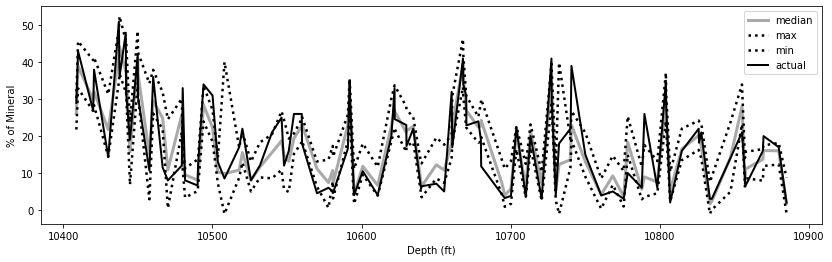

In [ ]:


y1 = regr_nn.predict(df_i)
col_name = 'ABC' + str(count)
otp_df.insert( count,col_name, y1)

otp_df['median'] = otp_df.median(axis = 1 )
otp_df['max'] = otp_df.max(axis = 1 )
otp_df['min'] = otp_df.min(axis = 1 )
otp_df

plt.figure(figsize = (14,4))
plt.plot(dep, otp_df['median'], label = 'median', color = '#A9A9A9' , linewidth=3)
# plt.plot(xa, ya, color='lightcoral', linewidth=4, linestyle=':')
plt.plot(dep, otp_df['max'], label = 'max' ,linewidth=2.5, linestyle=':',color= '#000000')
plt.plot(dep, otp_df['min'], label = 'min', linewidth=2.5, linestyle=':', color = '#000000' )
plt.plot(dep, df_o.iloc[:,int(a)], label = 'actual', linewidth=2 , color = '#000000') 
plt.legend()
plt.xlabel('Depth (ft)')
plt.ylabel('% of Mineral')
plt.savefig( 'minmaxmedianactual', dpi  = 300)

0.039942102706001834
0.8507539408600427


[0.8717735593834591,
 0.884346315453328,
 0.8735841822972342,
 0.8705231416104223,
 0.7451701074433879,
 0.8333415032217213,
 0.8825948736189244,
 0.8356162709127991,
 0.8744784713895565,
 0.836110983269594]

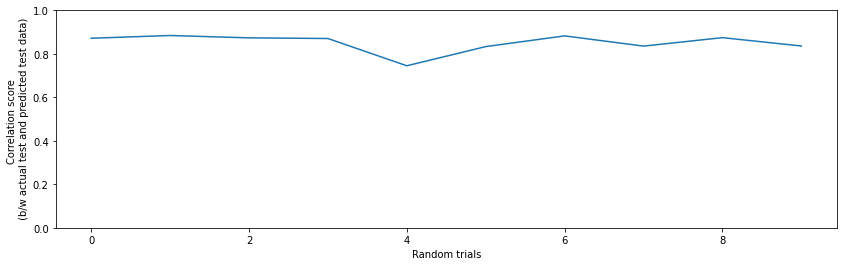

In [ ]:
plt.figure(figsize=(14, 4))
plt.plot(plot_test_error)
plt.xlabel('Random trials')
plt.ylabel('Correlation score \n (b/w actual test and predicted test data)')
# plt.title('Clay - Confidence plot - 10 random trials')
plt.ylim(0,1)
plt.savefig('Clay-confidenceplot.png', dpi  = 300)
np.std([0.86, 0.85,0.84,0.84,0.83,0.87,0.87,0.89,0.88,0.9])
print(np.std(plot_test_error))
print(np.mean(plot_test_error))
plot_test_error


In [ ]:
list_df = pd.DataFrame([ pd.Series(value) for value in loss_list ])
plt.figure(figsize=(14, 4))
for index, row in list_df.iterrows():
    plt.plot(row)
    
    # plt.show()

# plt.title('Carbonate - Loss Curve -  10 Random Trials')
plt.xlabel("Iterations")
plt.ylabel("loss function values")
plt.savefig('carbonatelossf.png', dpi  = 300)

(0.0, 1.0)

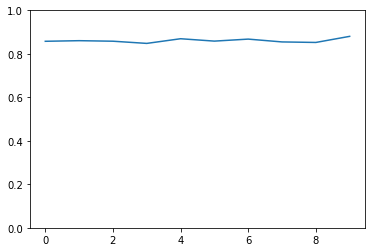

In [ ]:
plt.plot(plot_test_error)
plt.ylim(0,1)
# plt.plot(plot_train_error)

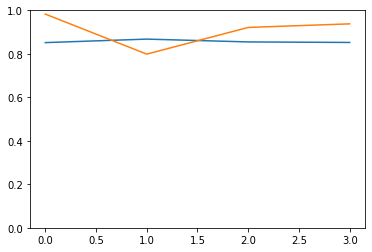

In [ ]:
plt.plot(plot_test_error)
plt.ylim(0,1)
plt.plot(plot_train_error)

In [ ]:
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(6670.0 ), test_size= (9/10))
print( X_train, Y_train) 

        CaO-%     MgO-%     K2O-%   new_sio2
79   8.109302  1.115511  1.210304  55.289526
6    1.558439  1.213629  3.801720  43.805793
35   8.745342  0.115130  2.000445  40.315844
27  12.837341  0.069242  0.775889  45.608260
20  21.407333  0.939987  0.849648  58.032836
41   4.248371  1.605753  2.686756  41.283072
34   8.806047  0.000000  1.961151  40.844296
8    3.220841  1.151916  3.263602  47.396572
21   6.942358  0.889430  2.493899  54.607506
46   5.394218  2.044368  2.102924  44.856484 79    51.0
6     26.0
35    35.0
27    41.0
20    46.0
41    32.0
34    34.0
8     39.7
21    42.0
46    30.0
Name: Quartz-Sio2, dtype: float64


In [ ]:
plot_test_error

[0.8523537860480932,
 0.8591844760756587,
 0.8574899514222464,
 0.8486525117683353,
 0.8710732358895885,
 0.8575398009044968,
 0.8137136173164066,
 0.8558386420709725,
 0.8457513047471857,
 0.8726832335787629]

0.8517594509258897
0.9431110861584026


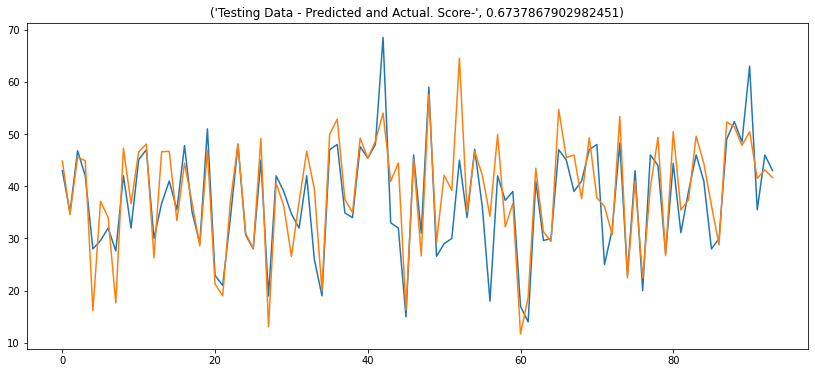

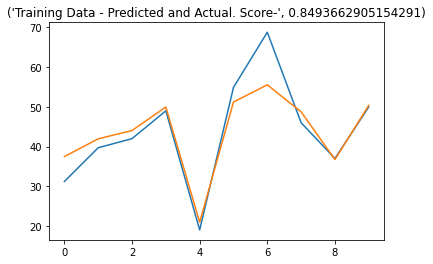

In [ ]:
plt.figure(figsize = (14,6))
plt.plot(np.array(Y_test).reshape(-1,1))
plt.plot(Y_pred_N.reshape(-1,1))
plt.title(('Testing Data - Predicted and Actual. Score-',r2_score(Y_test, Y_pred_N) ))

plt.figure()
plt.plot(np.array(Y_train).reshape(-1,1))
plt.plot(Y_train_pred_N.reshape(-1,1))
plt.title(('Training Data - Predicted and Actual. Score-',r2_score(Y_train, Y_train_pred_N) ))

from scipy import stats
coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
print(coef)

coef1, p_value = stats.pearsonr(Y_train , Y_train_pred_N)
print(coef1)


In [ ]:

from scipy import stats
plot_train_error = [] 
plot_train_error_spear = [] 
plot_test_error = [] 
plot_test_error_spear = [] 

a = 2
loss_list = [] 

for b in   [10, 1120, 2230, 3340, 4450,5560, 6670,7760,8890,10000  ]: # [10, 5560, 6670]:  np.linspace(10,10000,10): # 7780,8890  # 

  
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = int(b), test_size= (9/10))
  # fit, transform 
  regr_nn = MLPRegressor(random_state=100, max_iter=2000000, alpha =300,activation = 'relu', learning_rate_init= 0.0001,n_iter_no_change = 10000,  solver = 'adam',hidden_layer_sizes=(4,2)).fit(X_train, Y_train)
  # pd.DataFrame(regr_nn.loss_curve_).plot()
  # print(regr_nn.loss_curve_)
  l1 = list(regr_nn.loss_curve_)
  loss_list.append(l1[0:50000])

  Y_pred_N = regr_nn.predict(X_test)
  # calculate error and store  
  print( " testing",b,  r2_score(Y_test, Y_pred_N))
  coef, p_value = stats.pearsonr(Y_test , Y_pred_N)
  corr, _ = stats.spearmanr(Y_test , Y_pred_N)
  plot_test_error.append(coef)
  plot_test_error_spear.append(corr)
  Y_train_pred_N = regr_nn.predict(X_train)
  print( " training",b,  r2_score(Y_train, Y_train_pred_N)) 
  coef1, p_value = stats.pearsonr(Y_train, Y_train_pred_N)
  corr1, _ = stats.spearmanr(Y_train, Y_train_pred_N)
  plot_train_error.append(coef1)
  plot_train_error_spear.append(corr1)
  plt.figure(figsize=(14, 4))
  plt.plot(np.array(Y_test).reshape(-1,1), label = 'Actual Test Data')
  plt.plot(Y_pred_N.reshape(-1,1), label = ' Predicted Test Data')
  plt.xlabel('Index')
  plt.ylabel('output values')
  # plt.title('Clay - Precited and Actual Test Data')
  plt.legend()
  # fname = b 
  plt.savefig( 'quart', dpi  = 300) # 'Overlap_quartz_',b,



In [ ]:
lm = MLPRegressor()
hyper_params = [{'alpha': [0.01, 0.1, 1,],'activation' : ['relu'], 'solver' : ['adam'],'max_iter': [20000], 'hidden_layer_sizes': [(3) ,(3,3)]}]   # (int(a_i), int(b_i))

#  3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = lm, param_grid = hyper_params,  scoring= 'r2', verbose = 1, return_train_score=True)      # ,cv = folds

# fit the model
model_cv.fit(X_train, Y_train)



In [ ]:
Y_pred_N = model_cv.predict(X_test)
print(r2_score(Y_test, Y_pred_N))
print(r2_score(Y_train, model_cv.predict(X_train)))
# Y_train
cv_results = pd.DataFrame(model_cv.cv_results_)
print(model_cv.best_estimator_)
print(cv_results.columns)


with open("cv_results_2.txt", 'w') as output:
    for row in cv_results:
        output.write(str(row) + '\n')


cv_results[['param_alpha', 'param_hidden_layer_sizes',
       'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 

# clf_tuned.best_estimator_


test 0.8702354040666409 train 0.6821454904240876
test 0.8702372208805602 train 0.682145490487603
test 0.8702370557246293 train 0.6821454904869741
test 0.8702354040666409 train 0.6821454904240876
test 0.8702188776189833 train 0.6821454841354324
test 0.8700526263649878 train 0.6821448552699108
test 0.8682914360830627 train 0.6820819687177522
test 0.8408117590666867 train 0.6757933135018841
test -0.42076243080950526 train 0.04692779191507812
test -0.5092380791821112 train 0.0
test -0.5092380791821112 train 0.0


'\n# #############################################################################\n# Lasso\nfrom sklearn.linear_model import Lasso\nimport numpy \nfor alpha in numpy.linspace(0.001,10,1000):\n\n  lasso = Lasso(alpha=alpha, max_iter=10000)\n\n  y_pred_lasso = lasso.fit(X_train, y_train).predict(X_test)\n  r2_score_lasso = r2_score(y_test, y_pred_lasso)\n  fin.append(r2_score_lasso)\n  # print(lasso)\n  # print("r^2 on test data : %f" % r2_score_lasso)\nplt.plot(fin)\nplt.title(b)\nplt.figure()\n\n\n  # # y = df_o[\'Quartz-Sio2\']\n  # # clf = LinearRegression(random_state=0).fit(X,y)\n  # clf = ElasticNet().fit(X2,y2)  # X2[0:30,1],y[0:30]\n  # # clf.predict(X[30:60])\n  # # clf.predict_proba(X[:2, :])\n  # # clf.score(X[30:60], clf.predict(X[30:60]))\n\n\n\nimport random\n\nfor loop in range(20): \n    \n  b = random.randint(1,1000)\n  s_test = 2 \n  X_train, X_test, y_train, y_test = model_selection.train_test_split(X2, y2, random_state = b, test_size= (s_test/10))\n\n\n  fin = [] \n

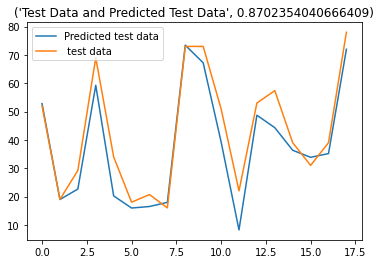

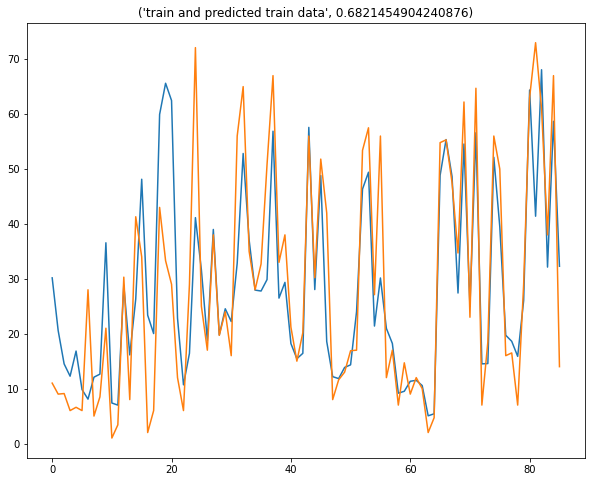

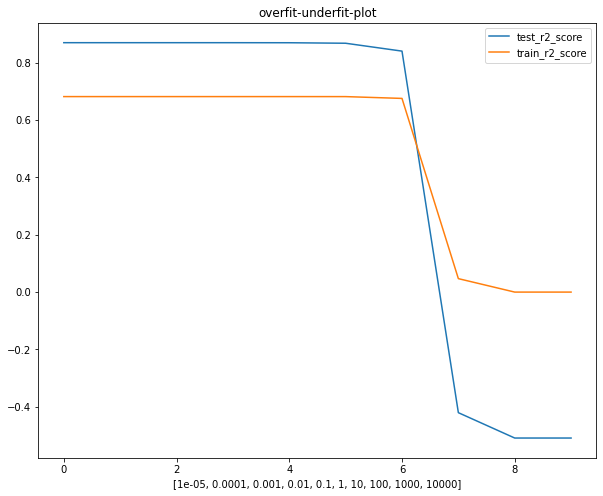

In [ ]:

# X = (df_i['SiO2-%']-(6)*df_i['K2O-%'])
# X =df_i['SiO2-%']
# X = df_i[['K2O-%','Al2O3-%']]


X =df_i['CaO-%']
X1 = np.array(X)
X2 = X1.reshape(-1,1)

y = df_o['carbonate']
y1 = np.array(y)
y2 = y1.reshape(-1,1)


n_samples = X2.shape[0]
a = int(n_samples // 1.2)
X_train, y_train = X2[:a], y2[:a]
X_test, y_test = X2[a:], y2[a:]


lasso = Lasso(alpha=0.001, max_iter=10000)

y_pred_lasso = lasso.fit(X_train, y_train).predict(X_test)
y_pred_lasso_train = lasso.fit(X_train, y_train).predict(X_train)
r2_score_lasso = r2_score(y_test, y_pred_lasso)
print('test' ,  r2_score(y_test, y_pred_lasso), 'train', r2_score(y_train, y_pred_lasso_train))
plt.plot(y_pred_lasso, label = 'Predicted test data')
plt.plot(y_test, label  = " test data")
plt.title(("Test Data and Predicted Test Data", r2_score(y_test, y_pred_lasso)))
plt.legend()

plt.figure(figsize = (10,8))
plt.plot(y_pred_lasso_train)
plt.plot(y_train)
plt.title(("train and predicted train data",r2_score(y_train, y_pred_lasso_train)))


p_coef_alpha_test = [] 
p_coef_alpha_train = [] 

for alphav in  [ 0.00001, 0.0001,0.001,0.01,0.1,1,10,100,1000,10000]: # [1.01, 1.1, 1.2, 1.4,1.5,2,3,4,5]:

  
  n_samples = X2.shape[0]
  a = int(n_samples // 1.2)
  X_train, y_train = X2[:a], y2[:a]
  X_test, y_test = X2[a:], y2[a:]
  
  
  lasso = Lasso(alpha= alphav, max_iter=10000)

  y_pred_lasso = lasso.fit(X_train, y_train).predict(X_test)
  y_pred_lasso_train = lasso.fit(X_train, y_train).predict(X_train)
  r2_score_lasso = r2_score(y_test, y_pred_lasso)
  print('test' ,  r2_score(y_test, y_pred_lasso), 'train', r2_score(y_train, y_pred_lasso_train))
  p_coef_alpha_test.append(r2_score(y_test, y_pred_lasso))
  p_coef_alpha_train.append(r2_score(y_train, y_pred_lasso_train))

plt.figure(figsize = (10,8))
plt.plot(p_coef_alpha_test, label = 'test_r2_score')
plt.plot(p_coef_alpha_train, label = 'train_r2_score')
plt.title('overfit-underfit-plot')
plt.xlabel([ 0.00001, 0.0001,0.001,0.01,0.1,1,10,100,1000,10000])
plt.legend()


'''
# #############################################################################
# Lasso
from sklearn.linear_model import Lasso
import numpy 
for alpha in numpy.linspace(0.001,10,1000):

  lasso = Lasso(alpha=alpha, max_iter=10000)

  y_pred_lasso = lasso.fit(X_train, y_train).predict(X_test)
  r2_score_lasso = r2_score(y_test, y_pred_lasso)
  fin.append(r2_score_lasso)
  # print(lasso)
  # print("r^2 on test data : %f" % r2_score_lasso)
plt.plot(fin)
plt.title(b)
plt.figure()


  # # y = df_o['Quartz-Sio2']
  # # clf = LinearRegression(random_state=0).fit(X,y)
  # clf = ElasticNet().fit(X2,y2)  # X2[0:30,1],y[0:30]
  # # clf.predict(X[30:60])
  # # clf.predict_proba(X[:2, :])
  # # clf.score(X[30:60], clf.predict(X[30:60]))



import random

for loop in range(20): 
    
  b = random.randint(1,1000)
  s_test = 2 
  X_train, X_test, y_train, y_test = model_selection.train_test_split(X2, y2, random_state = b, test_size= (s_test/10))


  fin = [] 
  finrf = [] 

  # for mss in range(2,20,1): 
      
  #   regressor = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=mss)   
  #   # n_features=4, n_informative=2, random_state=0, shuffle=False
  #   # n_estimators=100, criterion='mse', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None
  #   # regressor.fit(X_train, Y_train)
  #   regressor.fit(X_train,y_train)


  #   # Make predictions using the testing set
  #   Y_pred_r = regressor.predict(X_test)

  #   Y_check_r = regressor.predict(X_train)

  #   print( 'mss', mss, r2_score(y_test, Y_pred_r) , r2_score(y_train, Y_check_r))
  #   finrf.append(r2_score(y_test, Y_pred_r))






  # # #############################################################################
  # # Lasso
  # from sklearn.linear_model import Lasso
  # import numpy 
  # for alpha in numpy.linspace(0.001,10,1000):

  #   lasso = Lasso(alpha=alpha, max_iter=10000)

  #   y_pred_lasso = lasso.fit(X_train, y_train).predict(X_test)
  #   r2_score_lasso = r2_score(y_test, y_pred_lasso)
  #   fin.append(r2_score_lasso)
  #   # print(lasso)
  #   # print("r^2 on test data : %f" % r2_score_lasso)
  # plt.plot(fin)
  # plt.title(b)
  # plt.figure()

  # #############################################################################
  # ElasticNet
  from sklearn.linear_model import ElasticNet
  fin2 = [] 
  for alpha in numpy.linspace(0.0001,10,1000):

    enet = ElasticNet(alpha=alpha, l1_ratio=0.7)

    y_pred_enet = enet.fit(X_train, y_train).predict(X_test)
    r2_score_enet = r2_score(y_test, y_pred_enet)
    fin2.append(r2_score_enet)
    # print(enet)
    print("r^2 on test data : %f" % r2_score_enet)
  plt.plot(fin2)
  plt.title(b)
  plt.figure()


  print(b,max(fin2))

  # # y = df_o['Quartz-Sio2']
  # # clf = LinearRegression(random_state=0).fit(X,y)
  # clf = ElasticNet().fit(X2,y2)  # X2[0:30,1],y[0:30]
  # # clf.predict(X[30:60])
  # # clf.predict_proba(X[:2, :])
  # # clf.score(X[30:60], clf.predict(X[30:60]))
  # Xt = (df_i['SiO2-%']-(6)*df_i['K2O-%'])
  # X1t = np.array(X[30:60])
  # X2t = X1.reshape(-1,1)
  # yt = df_o['Quartz-Sio2'][30:60]
  # y1t = np.array(y)
  # y2t = y1.reshape(-1,1)

  # ypred = clf.predict(X2t)

  # print(r2_score(ypred,y2t))
  # print(r2_score(X2,y2))

'''


In [ ]:

arr = []
for i in [1.01, 1.1, 1.2, 1.4,1.5,2,3,4,5]:
  arr.append(int(100/i))
print(arr)

[99, 90, 83, 71, 66, 50, 33, 25, 20]


In [ ]:
plt.plot(fin)
plt.plot(fin2)

In [ ]:
from scipy import stats
p_val = np.array((6,4))
p_vals = pd.DataFrame()
for i, oxide in enumerate(['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%','QB', 'CRB', 'CLB1', 'CLB2','CLB3']):
  for j, miner in enumerate(['Quartz-Sio2','carbonate','clay','others']):
    #   plt.scatter(df_i[i][0:30] , df_i['K2O-%'][0:30])
    #   plt.figure()
    pearson_coef, p_value = stats.pearsonr(df_i[oxide] , df_o[miner])
    print(oxide, miner, pearson_coef, p_value)
    p_vals.loc[(i,j)] = pearson_coef


# plt.scatter(df_i['SiO2-%']-(25/9)*df_i['K2O-%'] , df_o['Quartz-Sio2'])
# # plt.figure()
# for a in np.linspace(3,5 ,num=20):
# # [2,2.1,2.2,2.3,2.4,2.5,2.6,2.7,2.8,2.9,3,3.1,3.2,3.3,3.4,3.5,3.6,3.7,3.8,3.9,4,4.1,4.2,4.3,4.4,4.5,4.6,4.7,4.8,4.9,5,5.1,5.2,5.3,5.4,5.5,5.6,5.7,5.8,5.9,6,6.2,6.4,6.6,6.8,6.99,7.2,7.4]:
#   pearson_coef, p_value = stats.pearsonr(df_i['SiO2-%']-(a)*df_i['Fe2O3-%'] , df_o['Quartz-Sio2'])
#   print(a, pearson_coef)


# plt.scatter(df_i['SiO2-%'] , df_o['Quartz-Sio2'])
# plt.figure()
# pearson_coef, p_value = stats.pearsonr(df_i['SiO2-%'] , df_o['Quartz-Sio2'])
# print(pearson_coef)


# plt.scatter(df_i['SiO2-%']-(25/42)*df_i['Al2O3-%'] , df_o['Quartz-Sio2'])
# plt.figure()
# pearson_coef, p_value = stats.pearsonr(df_i['SiO2-%']-(25/42)*df_i['Al2O3-%'] , df_o['Quartz-Sio2'])
# print(pearson_coef)





# # 'depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%'
# # 'deptho','Quartz-Sio2','carbonate','clay','others'

# print('K2O', 20*df_i['K2O-%'].max())
# df_o['clay'].max()

# from scipy import stats

# # 0.849608591418601
#  print((np.array(df_o['clay']/df_i['Fe2O3-%']).mean()))
# print( df_i['K2O-%'])

In [ ]:
p_vals.columns = ['Quartz-Sio2','carbonate','clay','others']
p_vals.index = ['SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%','QB', 'CRB', 'CLB1' , 'CLB2', 'CLB3']
p_vals

,Quartz-Sio2,carbonate,clay,others
SiO2-%,0.808594,-0.872374,0.559387,0.614976
CaO-%,-0.559036,0.857843,-0.740011,-0.662141
MgO-%,-0.274022,0.160494,0.050903,-0.219778
Al2O3-%,0.293364,-0.780528,0.843646,0.662244
Fe2O3-%,0.123385,-0.542727,0.691593,0.376342
K2O-%,0.262352,-0.767596,0.877931,0.587262
QB,0.824357,-0.764953,0.389129,0.533413
CRB,-0.682635,0.830622,-0.586956,-0.647761
CLB1,0.162920,-0.317428,0.365033,0.111320
CLB2,0.481174,-0.876500,0.829169,0.696776


In [ ]:
df_i['SiO2-%']-(6)*df_i['K2O-%']
pearson_coef, p_value = stats.pearsonr(df_i['SiO2-%'] , df_o['clay'])
print(pearson_coef, p_value)
pearson_coef, p_value = stats.pearsonr(df_i['SiO2-%']-(.3)*df_i['K2O-%'] , df_o['clay'])
print(pearson_coef, p_value)


0.5593872615598189 6.724929396984479e-10
0.5492941628193012 1.5594228517650664e-09


In [ ]:
a = 2
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
scaler = preprocessing.StandardScaler().fit(X_train)
X_scaled = scaler.transform(X_train)
X_scaled_test = scaler.transform(X_test)
X_scaled = X_train
X_scaled_test = X_test
# preprocessing.

In [ ]:
a =0
b = 9

i = -1
j = -1 

scr_train = np.empty([9,10])
scr_test = np.empty([9,10])

for s_test in [1,2,3,4,5,6,7,8,9]:
  i+=1 
  j = -1 
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
  # scaler = preprocessing.StandardScaler().fit(X_train)
  # X_scaled = scaler.transform(X_train)
  # X_scaled_test = scaler.transform(X_test)
  X_scaled  = preprocessing.minmax_scale(X_train, (0,1))
  X_scaled_test  = preprocessing.minmax_scale(X_test, (0,1))
  # X_scaled = scaler.transform(X_train)
  # X_scaled_test = scaler.transform(X_test)


  for mss in [2,4,6,8,10,12,14,16,18,20]:
    j+=1 

    # create regressor object
    regressor = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=mss)   # n_features=4, n_informative=2, random_state=0, shuffle=False
    # n_estimators=100, criterion='mse', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None
    # regressor.fit(X_train, Y_train)
    regressor.fit(X_scaled,Y_train)


    # Make predictions using the testing set
    Y_pred_r = regressor.predict(X_scaled_test)

    Y_check_r = regressor.predict(X_scaled)

    print('stest' , s_test, 'mss', mss, r2_score(Y_test, Y_pred_r) , r2_score(Y_train, Y_check_r))
    scr_train[(i,j)] = r2_score(Y_train, Y_check_r)
    scr_test[(i,j)] = r2_score(Y_test, Y_pred_r)



0.3655223134487757


Text(0.5, 1.05, 'a=0, mss x axis , s_test yaxis')

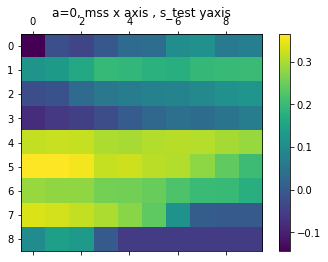

In [ ]:
print(scr_test.max())
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(scr_test, interpolation='nearest')
fig.colorbar(cax)
plt.title('a=0, mss x axis , s_test yaxis')
# ax.set_xticklabels(['']+alpha)
# ax.set_yticklabels(['']+alpha)


In [ ]:
a =2
s_test = 4
mss = 10
import random

for i in range(1,20): 
    
  b = random.randint(1,1000)
  X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
  estimator = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=mss) #  GaussianNB()
  regressor.fit(X_train, Y_train)

  # Make predictions using the testing set
  Y_pred_r = regressor.predict(X_test)

  Y_check_r = regressor.predict(X_train)

  print('stest' , s_test, 'mss', mss, r2_score(Y_test, Y_pred_r) , r2_score(Y_train, Y_check_r))
  print(b,regressor.feature_importances_)

stest 4 mss 10 0.7092006189545106 0.7765951257322851
215 [0.21792415 0.08244783 0.04398631 0.65564172]
stest 4 mss 10 0.6769266317213833 0.8340413416549572
106 [0.10672402 0.18701915 0.01839243 0.6878644 ]
stest 4 mss 10 0.7717707231742821 0.8041670784766813
219 [0.0757918  0.31865126 0.01208165 0.5934753 ]
stest 4 mss 10 0.5669463915450632 0.8480249980875662
747 [0.12045774 0.27533311 0.19836385 0.4058453 ]
stest 4 mss 10 0.6821704860492187 0.8041436929331521
919 [0.48064812 0.16936431 0.03217132 0.31781626]
stest 4 mss 10 0.6709928838211366 0.8135287531447383
588 [0.47937522 0.15600901 0.00741905 0.35719672]
stest 4 mss 10 0.6800312708992065 0.8234357541267391
259 [0.11202187 0.4794238  0.04541566 0.36313867]
stest 4 mss 10 0.5861001756943444 0.8081246692059347
62 [0.15664818 0.50466972 0.00993455 0.32874755]
stest 4 mss 10 0.7179103956979502 0.806487327317124
41 [0.08482148 0.13964201 0.32851845 0.44701806]
stest 4 mss 10 0.7391010060850415 0.7480295653367167
986 [0.09463328 0.31358

In [ ]:
np.linspace(.1, 0.99, 10)

array([0.1       , 0.19888889, 0.29777778, 0.39666667, 0.49555556,
       0.59444444, 0.69333333, 0.79222222, 0.89111111, 0.99      ])

In [ ]:
print(__doc__)

# X = (df_i['SiO2-%']-(6)*df_i['K2O-%'])
# # X = df_i[['K2O-%','Al2O3-%']]
# X1 = np.array(X)
# X2 = X1.reshape(-1,1)

# y = df_o['Quartz-Sio2']
# y1 = np.array(y)
# y2 = y1.reshape(-1,1)



import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.datasets import load_digits
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit


def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 0.99, 10)):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.

    Parameters
    ----------
    estimator : estimator instance
        An estimator instance implementing `fit` and `predict` methods which
        will be cloned for each validation.

    title : str
        Title for the chart.

    X : array-like of shape (n_samples, n_features)
        Training vector, where ``n_samples`` is the number of samples and
        ``n_features`` is the number of features.

    y : array-like of shape (n_samples) or (n_samples, n_features)
        Target relative to ``X`` for classification or regression;
        None for unsupervised learning.

    axes : array-like of shape (3,), default=None
        Axes to use for plotting the curves.

    ylim : tuple of shape (2,), default=None
        Defines minimum and maximum y-values plotted, e.g. (ymin, ymax).

    cv : int, cross-validation generator or an iterable, default=None
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:

          - None, to use the default 5-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, default=None
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like of shape (n_ticks,)
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the ``dtype`` is float, it is regarded
        as a fraction of the maximum size of the training set (that is
        determined by the selected validation method), i.e. it has to be within
        (0, 1]. Otherwise it is interpreted as absolute sizes of the training
        sets. Note that for classification the number of samples usually have
        to be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes,
                       return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="r")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="g")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g",
                 label="Cross-validation score")
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,
                         fit_times_mean + fit_times_std, alpha=0.1)
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1)
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt


estimator = Lasso(alpha=0.001, max_iter=10000)

# estimator = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=4) #  GaussianNB()
estimator = MLPRegressor(activation='relu', alpha=300, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(4, 2), learning_rate='constant',
             learning_rate_init=0.001, max_fun=15000, max_iter=20000,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)
plot_learning_curve(estimator, title, df_i, df_o.iloc[:,int(0)], axes=axes[:, 0], ylim=(0.4, 1.01),cv=cv, n_jobs=4)
# plot_learning_curve(estimator, X_train,Y_train, axes=axes[:, 0], ylim=(0.3, 1.01),cv=cv, n_jobs=4)

title = r"Learning Curves (SVM, RBF kernel, $\gamma=0.001$)"
# # SVC is more expensive so we do a lower number of CV iterations:
# cv = ShuffleSplit(n_splits=10, test_size=0.2, random_state=0)
# estimator = SVC(gamma=0.001)
# plot_learning_curve(estimator, title, X, y, axes=axes[:, 1], ylim=(0.7, 1.01),
#                     cv=cv, n_jobs=4)

plt.show()

# https://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html#sphx-glr-auto-examples-model-selection-plot-learning-curve-py 


Automatically created module for IPython interactive environment


NameError: ignored

In [ ]:
estimator.feature_importances_

NotFittedError: ignored

In [ ]:
from sklearn.model_selection import validation_curve
a = 2
train_scores, valid_scores = validation_curve(RandomForestRegressor(n_estimators = 100, random_state = 0), df_i, df_o.iloc[:,int(a)], "min_samples_split", np.arange(2,40,2), cv=5)


(19, 5)
[0.68990921 0.6899968  0.68850413 0.68363715 0.67925405 0.67889919
 0.67970728 0.68062343 0.68076284 0.67743841 0.67610162 0.67233064
 0.66270384 0.64612574 0.61972895 0.60870504 0.59494283 0.58898686
 0.58065451]


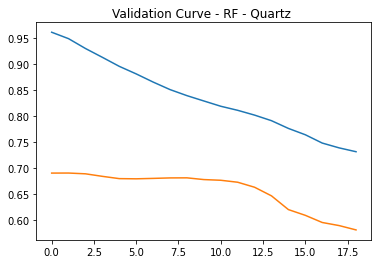

In [ ]:
plt.plot(train_scores.mean(axis = 1))
plt.plot(valid_scores.mean(axis = 1))
plt.title("Validation Curve - RF - Quartz ")
print(train_scores.shape)
print(valid_scores.mean(axis=1))

In [ ]:
a=0  
s_test = 4
# b = 1 

from random import seed
from random import randint
b =randint(1,20)


X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))


In [ ]:
X_scaled = X_train
X_scaled_test = X_test
# fit, transform 
regr_nn = MLPRegressor(random_state=100, max_iter=4000, alpha = 200,activation = 'relu', solver = 'adam',hidden_layer_sizes=((1024,512,256,128,64,32))).fit(X_scaled, Y_train)
Y_pred_N = regr_nn.predict(X_scaled_test)
# calculate error and store  
print( " testing", r2_score(Y_test, Y_pred_N))
Y_train_pred_N = regr_nn.predict(X_scaled)
print( " training", r2_score(Y_train, Y_train_pred_N)) 

In [ ]:
Y_pred.shape

NameError: ignored

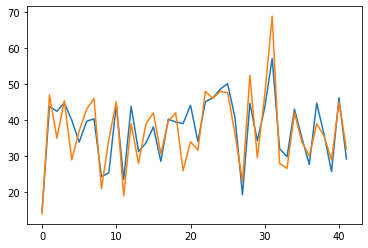

In [ ]:
Y_pred_N.reshape(42,1)
# Y_train.reshape(42,1)
plt.plot(Y_pred_N.reshape(42,1))
plt.plot(np.array(Y_test).reshape(42,1))

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20000) reached and the opti

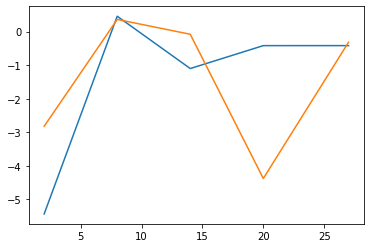

In [ ]:


# tt= -1
# mse_r = pd.DataFrame()
# mse_trian_r = pd.DataFrame()
# r2_r = pd.DataFrame()




# # create regressor object
# regressor = RandomForestRegressor(n_estimators = 100, random_state = 0,min_samples_split=10)   # n_features=4, n_informative=2, random_state=0, shuffle=False

# # n_estimators=100, criterion='mse', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None

# folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
# scores = cross_val_score(regressor, X_train, Y_train, scoring='r2', cv=folds)
# print(scores.mean())
# print(scores)

# regressor.fit(X_train, Y_train)

# # Make predictions using the testing set
# Y_pred_r = regressor.predict(X_test)

# Y_check_r = regressor.predict(X_train)

# print(r2_score(Y_test, Y_pred_r) , r2_score(Y_train, Y_check_r))


from sklearn.model_selection import learning_curve

from matplotlib import pyplot as plt


# ccc = model_cv.best_estimator_
estimator = MLPRegressor(activation='relu', alpha=300, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(4, 2), learning_rate='constant',
             learning_rate_init=0.001, max_fun=15000, max_iter=20000,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)

train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X_train, Y_train, cv=5,return_times=True)

plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))




In [ ]:



# mse = pd.DataFrame()
# mse_trian = pd.DataFrame()
# r2 = pd.DataFrame()

# mse_nn = pd.DataFrame()
# mse_trian_nn = pd.DataFrame()
# r2_nn = pd.DataFrame()


# r2_train = pd.DataFrame()
# coef_val = pd.DataFrame()


tt= -1
mse_r = pd.DataFrame()
mse_trian_r = pd.DataFrame()
r2_r = pd.DataFrame()




# create regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)   # n_features=4, n_informative=2, random_state=0, shuffle=False


folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
scores = cross_val_score(regressor, X_train, Y_train, scoring='r2', cv=folds)
scores



# fit the regressor with x and y data
regressor.fit(X_train, Y_train)

# Make predictions using the testing set
Y_pred_r = regressor.predict(X_test)

Y_check_r = regressor.predict(X_train)
# mean_square_error(Y_check, Y_train)
mse_trian_r.loc[b,c1] = mean_squared_error(Y_check_r, Y_train)

# The coefficients
# print('Coefficients: \n', regressor.coef_)

# The mean squared error # printing only 2 floating point. %.2f 
# print('Mean squared error: %.2f' % mean_squared_error(Y_test, Y_pred_r))
mse_r.loc[b,c1] = mean_squared_error(Y_test, Y_pred_r)

# The coefficient of determination: 1 is perfect prediction
#print('Coefficient of determination: %.2f' % r2_score(Y_test, Y_pred))
r2_r.loc[b,c1] = r2_score(Y_test, Y_pred_r)







for alp in [200] : #[0.001, 0.1, 1, 100,300, 600, 700, 900, 1000]:
    
  a =0
  tt +=1 
  c1 = -1 
  c = 0.4 
  # bi is second hidden layer
  for bi in [2,4,8,16,32]: # [2,4,8,16,32,64,128,256,512,1024]:
    # fi is first hidden layer       
    for fi in [2,4,8,16]: # [2,4,8,16,32,64,128,256,512,1024]: # [256,512] : #  ((2,4,2), (2,4,8,4,2), (2,4,8,16,8,4,2), (16,32,16),(16,32,64,32,16), (16,32,64,128,64,32,16),(32,64,32),(16,32,64,128,64,32,16)) [0.1, 0.3,0.4, 0.5, 0.7, 0.9]: 
      c1 += 1 
      b  = -1 
      
      while b < 0:
        b+=1
        X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size=c)
        

        '''   
        # create regressor object
        regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)   # n_features=4, n_informative=2, random_state=0, shuffle=False
          
        # fit the regressor with x and y data
        regressor.fit(X_train, Y_train)
        
        # Make predictions using the testing set
        Y_pred_r = regressor.predict(X_test)

        Y_check_r = regressor.predict(X_train)
        # mean_square_error(Y_check, Y_train)
        mse_trian_r.loc[b,c1] = mean_squared_error(Y_check_r, Y_train)

        # The coefficients
        # print('Coefficients: \n', regressor.coef_)

        # The mean squared error # printing only 2 floating point. %.2f 
        # print('Mean squared error: %.2f' % mean_squared_error(Y_test, Y_pred_r))
        mse_r.loc[b,c1] = mean_squared_error(Y_test, Y_pred_r)

        # The coefficient of determination: 1 is perfect prediction
        #print('Coefficient of determination: %.2f' % r2_score(Y_test, Y_pred))
        r2_r.loc[b,c1] = r2_score(Y_test, Y_pred_r)


In [ ]:
import matplotlib.pyplot as plt
plt.scatter([10,30,50,70,80,90], mse.mean(axis =0))

NameError: ignored

In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_i = df_i.drop(['depthi'], axis = 1)
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)



df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
df_i['QB'] = 100*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
df_i['CRB'] =100*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
df_i['CLB1'] =100*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
df_i['CLB2'] =100*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
df_i['CLB3'] =100*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())





# df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
# df_i['QB'] = (df_i['SiO2-%'].max())*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


# df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
# df_i['CRB'] =(df_i['CaO-%'].max())*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


# df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
# df_i['CLB1'] =(df_i['MgO-%'].max())*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

# df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
# df_i['CLB2'] =(df_i['Al2O3-%'].max())*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

# df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
# df_i['CLB3'] =(df_i['Al2O3-%'].max())*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())





In [ ]:
r2_nn_0_0 = []
r2_nn_0_100 = []
r2_nn_1_0 = []
r2_nn_1_100 = []
r2_nn_2_0 = []
r2_nn_2_100 = []
r2_nn_0_0 = np.array((3,3,4,3))

# (2,2),(2,4),(2,8),(2,16),(2,32), (4,2),(4,4),(4,8),(4,16),(8,2),(8,4),(8,16),(8,32),(16,2),(16,4),(16,8),(16,16),(16,32),(32,2),(32,4),(32,8),(32,16),(32,32)

k = [] 
for i in [2,4,8,16,32,64,128]:
  for j in [2,4,8,16,32,64,128]:
    for l in [2,4,8,16,32,64,128]: 
      if i >= j and j >= l :
        k.append((i,j,l))
print(k)


print(b)

[(2, 2, 2), (4, 2, 2), (4, 4, 2), (4, 4, 4), (8, 2, 2), (8, 4, 2), (8, 4, 4), (8, 8, 2), (8, 8, 4), (8, 8, 8), (16, 2, 2), (16, 4, 2), (16, 4, 4), (16, 8, 2), (16, 8, 4), (16, 8, 8), (16, 16, 2), (16, 16, 4), (16, 16, 8), (16, 16, 16), (32, 2, 2), (32, 4, 2), (32, 4, 4), (32, 8, 2), (32, 8, 4), (32, 8, 8), (32, 16, 2), (32, 16, 4), (32, 16, 8), (32, 16, 16), (32, 32, 2), (32, 32, 4), (32, 32, 8), (32, 32, 16), (32, 32, 32), (64, 2, 2), (64, 4, 2), (64, 4, 4), (64, 8, 2), (64, 8, 4), (64, 8, 8), (64, 16, 2), (64, 16, 4), (64, 16, 8), (64, 16, 16), (64, 32, 2), (64, 32, 4), (64, 32, 8), (64, 32, 16), (64, 32, 32), (64, 64, 2), (64, 64, 4), (64, 64, 8), (64, 64, 16), (64, 64, 32), (64, 64, 64), (128, 2, 2), (128, 4, 2), (128, 4, 4), (128, 8, 2), (128, 8, 4), (128, 8, 8), (128, 16, 2), (128, 16, 4), (128, 16, 8), (128, 16, 16), (128, 32, 2), (128, 32, 4), (128, 32, 8), (128, 32, 16), (128, 32, 32), (128, 64, 2), (128, 64, 4), (128, 64, 8), (128, 64, 16), (128, 64, 32), (128, 64, 64), (128,

In [ ]:
a=0 
s_test = 2
# b = 1 

from random import seed
from random import randint
b =randint(1,1000)



lm = MLPRegressor()
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))



#X_test = X_scaled
# X_train = X_scaled_test


# folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
# scores = cross_val_score(lm, X_train, Y_train, scoring='r2', cv=folds)
# scores  



# step-1: create a cross-validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'alpha': [200,300,400,500,600,700,800,900,1000,2000,3000],'activation' : ['relu'], 'solver' : ['adam'],'max_iter': [200], 'hidden_layer_sizes': [(2,2),(2,4),(2,8),(2,16),(2,32), (4,2),(4,4),(4,8),(4,16),(8,2),(8,4),(8,16),(8,32),(16,2),(16,4),(16,8),(16,16),(16,32),(32,2),(32,4),(32,8),(32,16),(32,32)]}]   # (int(a_i), int(b_i))




# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = lm, param_grid = hyper_params,  scoring= 'r2',cv = folds, verbose = 1, return_train_score=True)      

# fit the model
model_cv.fit(X_train, Y_train)  




Y_pred_N = model_cv.predict(X_test)
print(r2_score(Y_test, Y_pred_N))

cv_results = pd.DataFrame(model_cv.cv_results_)
print(model_cv.best_estimator_)
print(cv_results.columns)


with open("cv_results_2.txt", 'w') as output:
    for row in cv_results:
        output.write(str(row) + '\n')


cv_results[['param_alpha', 'param_hidden_layer_sizes',
       'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 




# X_scaled = X_train
# X_scaled_test = X_test
# # fit, transform 
# regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(a_i), int(b_i))).fit(X_scaled, Y_train)
# Y_pred_N = regr_nn.predict(X_scaled_test)
# # calculate error and store  
# ravg.append(r2_score(Y_test, Y_pred_N))



Fitting 5 folds for each of 253 candidates, totalling 1265 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached a

GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
             error_score=nan,
             estimator=MLPRegressor(activation='relu', alpha=0.0001,
                                    batch_size='auto', beta_1=0.9, beta_2=0.999,
                                    early_stopping=False, epsilon=1e-08,
                                    hidden_layer_sizes=(100,),
                                    learning_rate='constant',
                                    learning_rate_init=0.001, max_fun=15000,
                                    max_iter=200, momentum=0.9,
                                    n_iter_no_change=10,
                                    nes...
                          'alpha': [200, 300, 400, 500, 600, 700, 800, 900,
                                    1000, 2000, 3000],
                          'hidden_layer_sizes': [(2, 2), (2, 4), (2, 8),
                                                 (2, 16), (2, 32), (4, 2),
                                   

In [ ]:
Y_pred_N = model_cv.predict(X_test)
print(r2_score(Y_test, Y_pred_N))

cv_results = pd.DataFrame(model_cv.cv_results_)
print(model_cv.best_estimator_)
print(cv_results.columns)


with open("cv_results_2.txt", 'w') as output:
    for row in cv_results:
        output.write(str(row) + '\n')


cv_results[['param_alpha', 'param_hidden_layer_sizes',
       'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score']].sort_values(by = 'mean_test_score',ascending = False)# 



# clf_tuned.best_estimator_


0.6325441537023044
MLPRegressor(activation='relu', alpha=300, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(16, 16), learning_rate='constant',
             learning_rate_init=0.001, max_fun=15000, max_iter=200,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_activation', 'param_alpha', 'param_hidden_layer_sizes',
       'param_max_iter', 'param_solver', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_tra

,param_alpha,param_hidden_layer_sizes,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
39,300,"(16, 16)",0.733973,0.447257,0.805729,0.654745,0.614469,0.651235,0.121396,1,0.665272,0.758653,0.535316,0.755701,0.744814,0.691951,0.085503
43,300,"(32, 8)",0.747123,0.356554,0.782087,0.702861,0.651236,0.647972,0.152162,2,0.722824,0.790892,0.708774,0.771971,0.766229,0.752138,0.031092
42,300,"(32, 4)",0.715286,0.303150,0.826997,0.721539,0.656534,0.644701,0.179396,3,0.740329,0.813164,0.707211,0.748647,0.737357,0.749342,0.034853
90,500,"(32, 16)",0.762554,0.346346,0.785963,0.693865,0.623665,0.642478,0.158553,4,0.726209,0.776471,0.712299,0.749068,0.737942,0.740398,0.021787
158,800,"(32, 8)",0.714651,0.317726,0.800323,0.679277,0.654605,0.633316,0.165330,5,0.693114,0.800358,0.714498,0.758196,0.710217,0.735276,0.038983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,500,"(4, 2)",0.568314,-19.402950,-12.963365,-23.018275,-9.706050,-12.904465,8.200836,249,0.489875,-10.896478,-12.544776,-11.741628,-12.126687,-9.363939,4.956818
185,1000,"(2, 4)",-2.141528,-46.136870,-13.411183,-2.654039,-0.238556,-12.916435,17.239409,250,-3.473282,-30.589477,-12.540845,-1.418291,-0.544165,-9.713212,11.274997
179,900,"(32, 2)",-8.245537,-19.683022,-12.310874,-20.240460,-10.494428,-14.194864,4.884798,251,-14.869113,-11.018278,-11.612811,-11.177350,-13.078867,-12.351284,1.453906
82,500,"(16, 2)",-7.619258,-20.696059,-12.159475,-21.799750,-11.299903,-14.714889,5.558955,252,-13.808580,-11.587937,-11.465978,-12.025215,-13.987108,-12.574963,1.097475


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarni

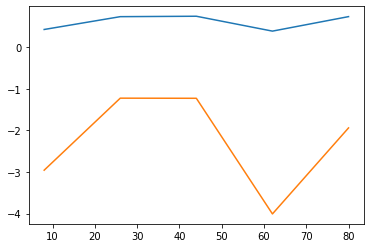

In [ ]:
from sklearn.model_selection import learning_curve

from matplotlib import pyplot as plt


ccc = model_cv.best_estimator_
estimator = MLPRegressor(activation='relu', alpha=600, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(4, 8), learning_rate='constant',
             learning_rate_init=0.001, max_fun=15000, max_iter=2000,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)

train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X_train, Y_train, cv=10,return_times=True)

plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))

In [ ]:
X_scaled = X_train
X_scaled_test = X_test
# fit, transform 
regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = 500,activation = 'relu', solver = 'adam',hidden_layer_sizes=((64,16))).fit(X_scaled, Y_train)
Y_pred_N = regr_nn.predict(X_scaled_test)
# calculate error and store  
print( " testing", r2_score(Y_test, Y_pred_N))
Y_train_pred_N = regr_nn.predict(X_scaled)
print( " training", r2_score(Y_train, Y_train_pred_N))

 testing 0.28329140920028495
 training 0.8313455258433395


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


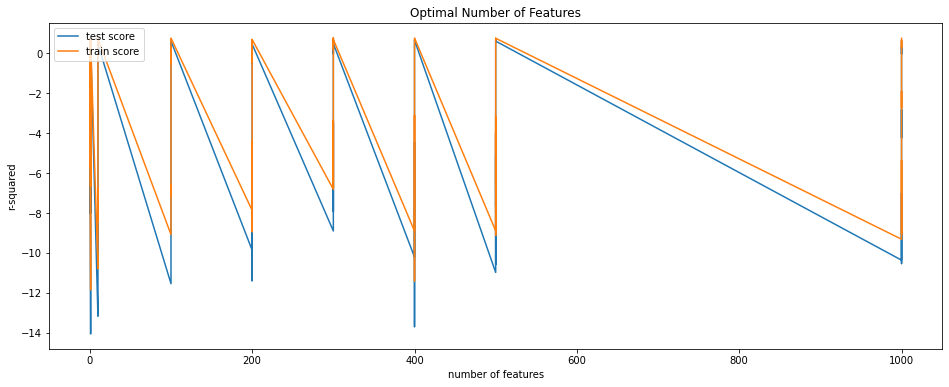

In [ ]:
cv_results['mean_test_score']
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_alpha"], cv_results["mean_test_score"])
plt.plot(cv_results["param_alpha"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [ ]:
df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
df_i['QB'] = (df_i['SiO2-%'].max())*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
df_i['CRB'] =(df_i['CaO-%'].max())*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
df_i['CLB1'] =(df_i['MgO-%'].max())*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
df_i['CLB2'] =(df_i['Al2O3-%'].max())*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
df_i['CLB3'] =(df_i['Al2O3-%'].max())*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())



In [ ]:
df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
df_i['QB'] = (df_i['SiO2-%'].max())*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
df_i['CRB'] =(df_i['CaO-%'].max())*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
df_i['CLB1'] =(df_i['MgO-%'].max())*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
df_i['CLB2'] =(df_i['Al2O3-%'].max())*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
df_i['CLB3'] =(df_i['Al2O3-%'].max())*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())










a =0
y = -1
x = -1 
z = -1 
w = -1 
for s_test in [1,4,7]: # [1,2,3,4,5,6,7]:
  # calculate split value and iterate 
  w +=1  
  x = -1
  for b_i in [4,8,16]  : # [2,4,8,16,32]: # this is y axis 
    # iterate  x variable 
    x +=1 
    y = -1
    for a_i in[2,4,8,16]: # [1,2,4,8,16,32]: # this is x axis 
      # do test-train split for random initial state 
      y +=1 
      z = -1
      for alp in [0.1, 300, 1000]:   #[0.1,1,10,100,200,300,400,500,1000]: 
        z +=1
        ravg = []
        for avgv in [0,1]: 
            
          b = int(np.random.randint(100))
          X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
          # iterate y variable 
          
          # scale 
          X_scaled = X_train
          X_scaled_test = X_test
          # fit, transform 
          regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(a_i), int(b_i))).fit(X_scaled, Y_train)
          Y_pred_N = regr_nn.predict(X_scaled_test)
          # calculate error and store  
          ravg.append(r2_score(Y_test, Y_pred_N))

      # r2_nn_0_0.loc[x,y] = statistics.mean(ravg) # r2_score(Y_test, Y_pred_N)
        ''' 
        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(a_i), int(b_i))).fit(X_scaled, Y_train)
        Y_pred_N = regr_nn.predict(X_scaled_test)
        # calculate error and store  
        r2_nn_0_0.loc[x,y] = r2_score(Y_test, Y_pred_N)
        # r2_nn_0_0.loc[int(x),int(y),int(z),int(w)] = r2_score(Y_test, Y_pred_N)
        # r2_nn_0_0.append(r2_score(Y_test, Y_pred_N))
        # print(r2_score(Y_test, Y_pred_N))
        ''' 

''' 
arr = np.asarray(r2_nn_0_0).reshape(9,6,5,7)
arr
with open("r2_nn_0_0arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')



a =1
y = -1
x = -1 
z = -1 
w = -1 
for s_test in [4]: # [1,2,3,4,5,6,7]:
  # calculate split value and iterate 
  w +=1  
  for b_i in [8]: # [2,4,8,16,32]:
    # iterate  x variable 
    x +=1 
    for a_i in [1]: # [1,2,4,8,16,32]:
      # do test-train split for random initial state 
      b = int(np.random.randint(100))
      X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
      # iterate y variable 
      y +=1 
      # scale 
      X_scaled = X_train
      X_scaled_test = X_test
      # fit, transform 
       
      for alp in [0.1] : # [0.1,1,10,100,200,300,400,500,1000]: 
        z +=1
        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(a_i), int(b_i))).fit(X_scaled, Y_train)
        Y_pred_N = regr_nn.predict(X_scaled_test)
        # calculate error and store  
        # r2_nn_0_0.loc[x,y,z,w] = r2_score(Y_test, Y_pred_N)
        # r2_nn_0_0.loc[int(x),int(y),int(z),int(w)] = r2_score(Y_test, Y_pred_N)
        r2_nn_1_0.append(r2_score(Y_test, Y_pred_N))
        print(r2_score(Y_test, Y_pred_N))
       

arr = np.asarray(r2_nn_1_0).reshape(9,6,5,7)
arr
with open("r2_nn_1_0arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

a =2
y = -1
x = -1 
z = -1 
w = -1 
for s_test in [1,2,3,4,5,6,7]:
  # calculate split value and iterate 
  w +=1  
  for b_i in [2,4,8,16,32]:
    # iterate  x variable 
    x +=1 
    for a_i in [1,2,4,8,16,32]:
      # do test-train split for random initial state 
      b = int(np.random.randint(100))
      X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
      # iterate y variable 
      y +=1 
      # scale 
      X_scaled = X_train
      X_scaled_test = X_test
      # fit, transform 
       
      for alp in  [0.1,1,10,100,200,300,400,500,1000]: 
        z +=1
        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(a_i), int(b_i))).fit(X_scaled, Y_train)
        Y_pred_N = regr_nn.predict(X_scaled_test)
        # calculate error and store  
        # r2_nn_0_0.loc[x,y,z,w] = r2_score(Y_test, Y_pred_N)
        # r2_nn_0_0.loc[int(x),int(y),int(z),int(w)] = r2_score(Y_test, Y_pred_N)
        r2_nn_2_0.append(r2_score(Y_test, Y_pred_N))

arr = np.asarray(r2_nn_2_0).reshape(9,6,5,7)
arr
with open("r2_nn_2_0arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

'''

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarni

' \narr = np.asarray(r2_nn_0_0).reshape(9,6,5,7)\narr\nwith open("r2_nn_0_0arr.txt", \'w\') as output:\n    for row in arr:\n        output.write(str(row) + \'\n\')\n\n\n\na =1\ny = -1\nx = -1 \nz = -1 \nw = -1 \nfor s_test in [4]: # [1,2,3,4,5,6,7]:\n  # calculate split value and iterate \n  w +=1  \n  for b_i in [8]: # [2,4,8,16,32]:\n    # iterate  x variable \n    x +=1 \n    for a_i in [1]: # [1,2,4,8,16,32]:\n      # do test-train split for random initial state \n      b = int(np.random.randint(100))\n      X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))\n      # iterate y variable \n      y +=1 \n      # scale \n      X_scaled = X_train\n      X_scaled_test = X_test\n      # fit, transform \n       \n      for alp in [0.1] : # [0.1,1,10,100,200,300,400,500,1000]: \n        z +=1\n        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = \'relu\', solver = \'ada

In [ ]:
r2_nn_0_0

,0,1,2,3
0,0.721006,0.687664,0.706707,0.715474
1,0.728209,0.751733,0.731346,0.707709
2,0.710284,0.732700,0.691733,0.686717


In [ ]:
r2_nn_0_0

,0,1,2,3
0,0.738929,0.722140,0.670713,0.716579
1,0.688773,0.695911,0.713399,0.757670
2,0.752803,0.699845,0.753179,0.727239


In [ ]:
r2_nn_0_0_p4_400arr = r2_nn_0_0
# arr = np.asarray(r2_nn_0_0).reshape(9,6,5,7)
# arr
with open("r2_nn_0_0_p4_400arr.txt", 'w') as output:
    for row in r2_nn_0_0:
        output.write(str(row) + '\n')

In [ ]:
print(max(r2_nn_2_0), max(r2_nn_1_0),max(r2_nn_0_0))

0.8959357741088999 0.9683285670976585 0.9192900498023922


In [ ]:

Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_i = df_i.drop(['depthi'], axis = 1)
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)

 

df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
df_i['QB'] = 100*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
df_i['CRB'] =100*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
df_i['CLB1'] =100*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
df_i['CLB2'] =100*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
df_i['CLB3'] =100*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())


a =0
y = -1
x = -1 
z = -1 
w = -1 
for s_test in [1,2,3,4,5,6,7]:
  # calculate split value and iterate 
  w +=1  
  for b_i in [2,4,8,16,32]:
    # iterate  x variable 
    x +=1 
    for a_i in [1,2,4,8,16,32]:
      # do test-train split for random initial state 
      b = int(np.random.randint(100))
      X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
      # iterate y variable 
      y +=1 
      # scale 
      X_scaled = X_train
      X_scaled_test = X_test
      # fit, transform 
       
      for alp in  [0.1,1,10,100,200,300,400,500,1000]: 
        z +=1
        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(fi), int(bi))).fit(X_scaled, Y_train)
        Y_pred_N = regr_nn.predict(X_scaled_test)
        # calculate error and store  
        # r2_nn_0_0.loc[x,y,z,w] = r2_score(Y_test, Y_pred_N)
        # r2_nn_0_0.loc[int(x),int(y),int(z),int(w)] = r2_score(Y_test, Y_pred_N)
        r2_nn_0_100.append(r2_score(Y_test, Y_pred_N))


a =1
y = -1
x = -1 
z = -1 
w = -1 
for s_test in [1,2,3,4,5,6,7]:
  # calculate split value and iterate 
  w +=1  
  for b_i in [2,4,8,16,32]:
    # iterate  x variable 
    x +=1 
    for a_i in [1,2,4,8,16,32]:
      # do test-train split for random initial state 
      b = int(np.random.randint(100))
      X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
      # iterate y variable 
      y +=1 
      # scale 
      X_scaled = X_train
      X_scaled_test = X_test
      # fit, transform 
       
      for alp in  [0.1,1,10,100,200,300,400,500,1000]: 
        z +=1
        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(fi), int(bi))).fit(X_scaled, Y_train)
        Y_pred_N = regr_nn.predict(X_scaled_test)
        # calculate error and store  
        # r2_nn_0_0.loc[x,y,z,w] = r2_score(Y_test, Y_pred_N)
        # r2_nn_0_0.loc[int(x),int(y),int(z),int(w)] = r2_score(Y_test, Y_pred_N)
        r2_nn_1_100.append(r2_score(Y_test, Y_pred_N))



a =2
y = -1
x = -1 
z = -1 
w = -1 
for s_test in [1,2,3,4,5,6,7]:
  # calculate split value and iterate 
  w +=1  
  for b_i in [2,4,8,16,32]:
    # iterate  x variable 
    x +=1 
    for a_i in [1,2,4,8,16,32]:
      # do test-train split for random initial state 
      b = int(np.random.randint(100))
      X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size= (s_test/10))
      # iterate y variable 
      y +=1 
      # scale 
      X_scaled = X_train
      X_scaled_test = X_test
      # fit, transform 
       
      for alp in  [0.1,1,10,100,200,300,400,500,1000]: 
        z +=1
        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(fi), int(bi))).fit(X_scaled, Y_train)
        Y_pred_N = regr_nn.predict(X_scaled_test)
        # calculate error and store  
        # r2_nn_0_0.loc[x,y,z,w] = r2_score(Y_test, Y_pred_N)
        # r2_nn_0_0.loc[int(x),int(y),int(z),int(w)] = r2_score(Y_test, Y_pred_N)
        r2_nn_2_100.append(r2_score(Y_test, Y_pred_N))




Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't

In [ ]:
print(max(r2_nn_2_100))
print(max(r2_nn_1_100))
print(max((r2_nn_0_100)))


0.929174350524696
0.9382298932993399
0.9596666350271233


In [ ]:
pip install --Ashok https://github.com/pyexcel/pyexcel-xlsx/archive/master.zip
import pyexcel
pyexcel.save_as(array=r2_nn_0_0, dest_file_name="r2_nn_0_0.xls")
pyexcel.save_as(array=r2_nn_0_100, dest_file_name="r2_nn_0_0.xls")
pyexcel.save_as(array=r2_nn_1_0, dest_file_name="r2_nn_0_0.xls")
pyexcel.save_as(array=r2_nn_1_100, dest_file_name="r2_nn_0_0.xls")
pyexcel.save_as(array=r2_nn_2_0, dest_file_name="r2_nn_0_0.xls")
pyexcel.save_as(array=r2_nn_2_100, dest_file_name="r2_nn_0_0.xls")
# pyexcel.save_as(array=r2_nn_0_0, dest_file_name="r2_nn_0_0.xls")
# pyexcel.save_as(array=r2_nn_0_0, dest_file_name="r2_nn_0_0.xls")






SyntaxError: ignored

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 6.000e+00,
        2.000e+01, 9.300e+01, 5.710e+02, 1.198e+03]),
 array([-2.31663152, -1.99205093, -1.66747035, -1.34288976, -1.01830917,
        -0.69372859, -0.369148  , -0.04456741,  0.28001318,  0.60459376,
         0.92917435]),
 <a list of 10 Patch objects>)

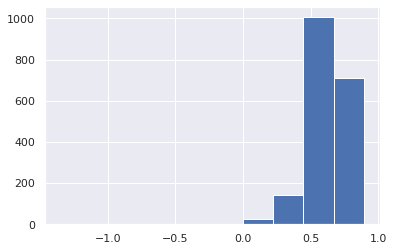

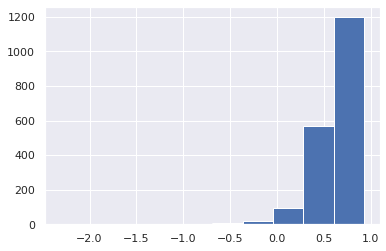

In [ ]:
# matplot
# hist(r2_nn_0_0)
import matplotlib.pyplot as plt
plt.hist(r2_nn_2_0)
plt.figure()
plt.hist( r2_nn_2_100)

In [ ]:
arr = np.asarray(r2_nn_0_0).reshape(9,6,5,7)
arr
with open("arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

In [ ]:
arr = np.asarray(r2_nn_0_100).reshape(9,6,5,7)
arr
with open("r2_nn_0_100arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

In [ ]:
arr = np.asarray(r2_nn_1_0).reshape(9,6,5,7)
arr
with open("r2_nn_1_0arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

In [ ]:
arr = np.asarray(r2_nn_1_100).reshape(9,6,5,7)
arr
with open("r2_nn_1_100arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

In [ ]:
arr = np.asarray(r2_nn_2_0).reshape(9,6,5,7)
arr
with open("r2_nn_2_0arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

In [ ]:
arr = np.asarray(r2_nn_2_100).reshape(9,6,5,7)
arr
with open("r2_nn_2_100arr.txt", 'w') as output:
    for row in arr:
        output.write(str(row) + '\n')

In [ ]:
#r2_nn_0_0.reshape(2,3,2,2)
print(np.reshape(r2_nn_0_0, (2,3,2,2)))

In [ ]:
import pandas as pd

new_list = [["first", "second"], ["third", "four"], ["five", "six"]]
df = pd.DataFrame(new_list)
writer = pd.ExcelWriter('test.xlsx', engine='xlsxwriter')
df.to_excel(writer, sheet_name='welcome', index=False)
writer.save()

In [ ]:
r2_nn_0_0

In [ ]:
b = np.random.randint(100)
b

92

In [ ]:



mse = pd.DataFrame()
mse_trian = pd.DataFrame()
r2 = pd.DataFrame()

mse_r = pd.DataFrame()
mse_trian_r = pd.DataFrame()
r2_r = pd.DataFrame()

mse_nn = pd.DataFrame()
mse_trian_nn = pd.DataFrame()
r2_nn = pd.DataFrame()


r2_train = pd.DataFrame()
coef_val = pd.DataFrame()

tt= -1

for alp in [200] : #[0.001, 0.1, 1, 100,300, 600, 700, 900, 1000]:
    
  a =0
  tt +=1 
  c1 = -1 
  c = 0.4 
  # bi is second hidden layer
  for bi in [2,4,8,16,32]: # [2,4,8,16,32,64,128,256,512,1024]:
    # fi is first hidden layer       
    for fi in [2,4,8,16]: # [2,4,8,16,32,64,128,256,512,1024]: # [256,512] : #  ((2,4,2), (2,4,8,4,2), (2,4,8,16,8,4,2), (16,32,16),(16,32,64,32,16), (16,32,64,128,64,32,16),(32,64,32),(16,32,64,128,64,32,16)) [0.1, 0.3,0.4, 0.5, 0.7, 0.9]: 
      c1 += 1 
      b  = -1 
      
      while b < 0:
        b+=1
        X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size=c)
        

        '''   
        # create regressor object
        regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)   # n_features=4, n_informative=2, random_state=0, shuffle=False
          
        # fit the regressor with x and y data
        regressor.fit(X_train, Y_train)
        
        # Make predictions using the testing set
        Y_pred_r = regressor.predict(X_test)

        Y_check_r = regressor.predict(X_train)
        # mean_square_error(Y_check, Y_train)
        mse_trian_r.loc[b,c1] = mean_squared_error(Y_check_r, Y_train)

        # The coefficients
        # print('Coefficients: \n', regressor.coef_)

        # The mean squared error # printing only 2 floating point. %.2f 
        # print('Mean squared error: %.2f' % mean_squared_error(Y_test, Y_pred_r))
        mse_r.loc[b,c1] = mean_squared_error(Y_test, Y_pred_r)

        # The coefficient of determination: 1 is perfect prediction
        #print('Coefficient of determination: %.2f' % r2_score(Y_test, Y_pred))
        r2_r.loc[b,c1] = r2_score(Y_test, Y_pred_r)

        
        
        # Create linear regression object
        regr = linear_model.LinearRegression()

        # Train the model using the training sets
        regr.fit(X_train, Y_train)

        # Make predictions using the testing set
        Y_pred = regr.predict(X_test)

        Y_check = regr.predict(X_train)
        # mean_square_error(Y_check, Y_train)
        mse_trian.loc[b,c1] = mean_squared_error(Y_check, Y_train)

        # The coefficients
        # print('Coefficients: \n', regr.coef_)

        # The mean squared error # printing only 2 floating point. %.2f 
        #print('Mean squared error: %.2f' % mean_squared_error(Y_test, Y_pred))
        mse.loc[b,c1] = mean_squared_error(Y_test, Y_pred)

        # The coefficient of determination: 1 is perfect prediction
        #print('Coefficient of determination: %.2f' % r2_score(Y_test, Y_pred))
        r2.loc[b,c1] = r2_score(Y_test, Y_pred)
        ''' 
        

        scaler = preprocessing.StandardScaler().fit(X_train)
        X_scaled = scaler.transform(X_train)
        X_scaled_test = scaler.transform(X_test)
        # int(fi),int(2*fi),int(4*fi),(8*fi),int(4*fi),int(2*fi),int(fi))

        X_scaled = X_train
        X_scaled_test = X_test




        # regr_nn = MLPRegressor(random_state=1, max_iter=500).fit(X_train, Y_train)
        regr_nn = MLPRegressor(random_state=100, max_iter=2000, alpha = alp,activation = 'relu', solver = 'adam',hidden_layer_sizes=(int(fi), int(bi))).fit(X_scaled, Y_train)  # learning_rate
        Y_pred_N = regr_nn.predict(X_scaled_test)

        Y_check_nn = regr_nn.predict(X_scaled)
        # mean_square_error(Y_check, Y_train)
        # mse_trian_nn.loc[b,c1] = mean_squared_error(Y_check_nn, Y_train)
        print(Y_pred_N, Y_test)




        mse_nn.loc[tt,c1] = mean_squared_error(Y_test, Y_pred_N)

        #regr_nn.score(X_test, y_test)
        r2_nn.loc[tt,c1] = r2_score(Y_test, Y_pred_N)

        ''' 
        y_hats2 = regr.predict(df_i)
        df_i['y_hats_diff'] = abs((y_hats2 - df_o.iloc[:,int(a)])/(df_o.iloc[:,int(a)]+1))

        df_i['input'] = df_o.iloc[:,int(a)]

        df_i.sort_values('y_hats_diff',ascending=False)
      
      mse.loc[iter+1,c1] = mean(mse[:,c1])
      r2_score.loc[iter+1,c1] = mean(r2_score[:,c1])
      ''' 
    









In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_i = df_i.drop(['depthi'], axis = 1)
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)

 

df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
df_i['QB'] = 100*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
df_i['CRB'] =100*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
df_i['CLB1'] =100*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
df_i['CLB2'] =100*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
df_i['CLB3'] =100*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())



In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(10, 6), dpi=80)

plt.plot(Y_pred_N.reshape(42,1) )
plt.plot(np.array(Y_test).reshape(42,1))



In [ ]:
Y_pred_N.shape

(42,)

In [ ]:
(Y_pred_N, Y_test)

In [ ]:
plt.figure(figsize =(20,8))
df_i.hist()

Text(0, 0.5, 'test r2_score')

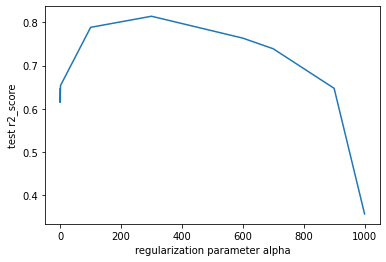

In [ ]:
'''
xx = pd.DataFrame()
xx['pred'] = Y_pred_N
xx['actual'] = Y_test
print(xx)
'''
# r2_score(Y_pred_N,Y_test)
# xx['']

import matplotlib.pyplot as plt
x = np.array( [0.001, 0.1, 1, 100,300, 600, 700, 900, 1000]).reshape(9,1)
y = np.array(r2_nn).reshape(9,1)
plt.plot( x,y) 
plt.xlabel("regularization parameter alpha")
plt.ylabel("test r2_score")



In [ ]:
from sklearn import preprocessing
scaler = preprocessing.StandardScaler().fit(X_train)
X_scaled = scaler.transform(X_train)


# https://stackoverflow.com/questions/52670012/convergencewarning-liblinear-failed-to-converge-increase-the-number-of-iterati


In [ ]:
'''
print(mse.mean())
print(mse_r.mean())
print(mse_nn.mean())

print(mse_trian_nn.mean())
print(r2.mean())
print(r2_r.mean())
''' 
print(r2_nn.mean())
print(r2_nn)

0     -5.757419
1      0.266279
2    -10.093309
3      0.703262
4      0.060747
5      0.687938
6      0.771310
7      0.588595
8      0.794737
9      0.781279
10     0.635967
11     0.762624
dtype: float64
         0         1          2   ...        9         10        11
0 -5.757419  0.266279 -10.093309  ...  0.781279  0.635967  0.762624

[1 rows x 12 columns]


         0          1        2   ...        17       18        19
0 -6.006987 -10.378353  0.69943  ...  0.822751  0.81763  0.816338

[1 rows x 20 columns]
5
[[ -6.00698693 -10.3783528    0.69942978   0.81602643]
 [  0.82069954   0.82324714   0.81258784   0.82184092]
 [  0.81978969   0.82107206   0.81371842   0.81780066]
 [  0.81577106   0.8228456    0.81670155   0.81238664]
 [  0.82047407   0.82275106   0.81763036   0.81633808]]
[-3.71747088  0.81959386  0.8180952   0.81692621  0.81929839]
[-0.54605051 -1.41768739  0.79201359  0.81687854]


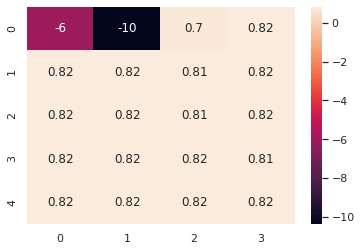

In [ ]:
print(r2_nn)
c = np.array(r2_nn).reshape(5,4)
# ((2,4,2), (2,4,8,4,2), (2,4,8,16,8,4,2), (16,32,16),(16,32,64,32,16), (16,32,64,128,64,32,16),(32,64,32),(16,32,64,128,64,32,16))

np.histogram(c)
#plt.hist(c)
print(c.argmax())
print(c)
a = np.random.random((16, 16))
# plt.imshow(c, cmap='hot')
# plt.show()

import numpy as np
# np.random.seed(0)
import seaborn as sns; sns.set_theme()
uniform_data = np.random.rand(10, 12)
ax = sns.heatmap(c,annot=True)

print(c.mean(axis=1))
print(c.mean(axis=0))

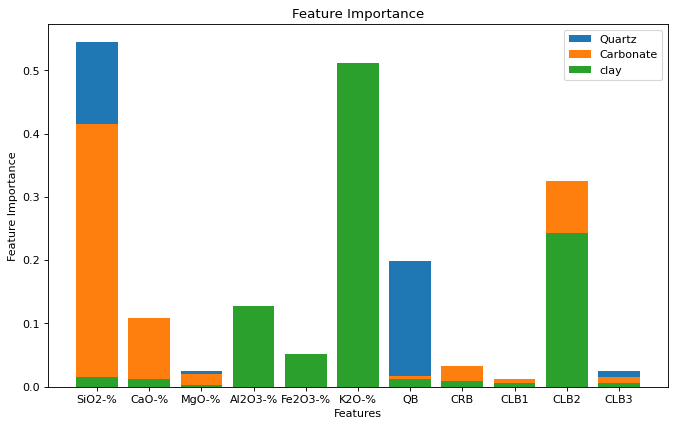

In [ ]:
# Feature importance  - 

# https://romainlhardy.medium.com/estimating-feature-importance-the-easy-way-2ebe970c600c 

# https://datascience.stackexchange.com/questions/44700/how-do-i-get-the-feature-importace-for-a-mlpclassifier

# very good feature importance concept - https://towardsdatascience.com/feature-importance-with-neural-network-346eb6205743
from matplotlib.pyplot import figure
figure(figsize=(10, 6), dpi=80)


from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor 



a =0 
X_train0, X_test, Y_train0, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size=c)
a = 1 
X_train1, X_test, Y_train1, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size=c)
a = 2 
X_train2, X_test, Y_train2, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size=c)

gb0 = GradientBoostingRegressor(n_estimators=100)
gb1 = GradientBoostingRegressor(n_estimators=100)
gb2 = GradientBoostingRegressor(n_estimators=100)


gb0.fit(X_train0, Y_train0.values.ravel())
gb1.fit(X_train1, Y_train1.values.ravel())
gb2.fit(X_train2, Y_train2.values.ravel())


plt.bar(range(X_train1.shape[1]), gb0.feature_importances_, label = "Quartz")

plt.bar(range(X_train1.shape[1]), gb1.feature_importances_, label =  'Carbonate') 
        
plt.bar(range(X_train1.shape[1]), gb2.feature_importances_, label = 'clay') 
        
plt.xticks(range(X_train1.shape[1]), ['SiO2-%', 'CaO-%', 'MgO-%', 'Al2O3-%', 'Fe2O3-%', 'K2O-%', 'QB', 'CRB',
       'CLB1', 'CLB2', 'CLB3'])
# print(X_train.columns)

'''
X = ['Group A','Group B','Group C','Group D']
Ygirls = [10,20,20,40]
Zboys = [20,30,25,30]
  
X_axis = np.arange(len(X))
  
plt.bar(X_axis - 0.2, Ygirls, 0.4, label = 'Girls')
plt.bar(X_axis + 0.2, Zboys, 0.4, label = 'Boys')
''' 
# X_axis = np.arange(len(X)) 
# plt.xticks(11,  ['SiO2-%', 'CaO-%', 'MgO-%', 'Al2O3-%', 'Fe2O3-%', 'K2O-%', 'QB', 'CRB','CLB1', 'CLB2', 'CLB3'])
plt.xlabel("Features")
plt.ylabel("Feature Importance")
plt.title("Feature Importance")
plt.legend()
plt.show()




In [ ]:
def loaddatfile(): 
    
  Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                  sep="\s+")

  Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                  sep="\s+")
  df_i = pd.DataFrame(Df_i)
  df_o = pd.DataFrame(Df_o)

In [ ]:
def modify_colmns():
    
  df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
  df_i = df_i.drop(['depthi'], axis = 1)
  df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
  df_o = df_o.drop(['deptho'], axis = 1)

In [ ]:
mse = pd.DataFrame()   # will store the mean square error from the iterations 
r2 = pd.DataFrame()  # this has r2 , 1 means perfect match and 0 means no matching in the algorithm 
coef = pd.DataFrame()  # accuracy 

def runmodel()

# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train, Y_train)
y_model = regr.predict(X_train)
y_model.reshape(-1,1)

print(mean_squared_error(Y_train, y_model))
print(r2_score(Y_train, y_model))

# Finally, we compute the fraction of correctly labeled points:
# Make predictions using the testing set
Y_pred = regr.predict(X_test)

# The coefficients
print('Coefficients: \n', regr.coef_)

# The mean squared error # printing only 2 floating point. %.2f 
print('Mean squared error: %.2f' 
      % mean_squared_error(Y_test, Y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'
      % r2_score(Y_test, Y_pred))

y_hats2 = regr.predict(df_i)
df_i['y_hats_diff'] = abs((y_hats2 - df_o.iloc[:,int(a)])/(df_o.iloc[:,int(a)]+1))

df_i['input'] = df_o.iloc[:,int(a)]

df_i.sort_values('y_hats_diff',ascending=False)
#a.loc[a,b] = accuracy_score(Y_train, y_model)
# print( 'accuracy score between train and predicted on train: %.2f' % accuracy_score(Y_train, y_model))



In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df_i['input'], df_i['y_hats_diff'])

In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_i = df_i.drop(['depthi'], axis = 1)
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)


In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_i = df_i.drop(['depthi'], axis = 1)
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)

df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
df_i['QB'] =100*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
df_i['CRB'] =100*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
df_i['CLB1'] =100*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
df_i['CLB2'] =100*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
df_i['CLB3'] =100*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())

mse = pd.DataFrame()
mse_trian = pd.DataFrame()
r2 = pd.DataFrame()
r2_train = pd.DataFrame()
coef_val = pd.DataFrame()


a =1
c1 = -1 
for c in [0.1, 0.3, 0.5, 0.7,0.8, 0.9]: 
  c1 += 1 
  b  = -1 
  
  while b < 20:
    b+=1
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size=c)
    # Create linear regression object
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(X_train, Y_train)

    # Make predictions using the testing set
    Y_pred = regr.predict(X_test)

    Y_check = regr.predict(X_train)
    # mean_square_error(Y_check, Y_train)
    mse_trian.loc[b,c1] = mean_squared_error(Y_check, Y_train)

    # The coefficients
    print('Coefficients: \n', regr.coef_)

    # The mean squared error # printing only 2 floating point. %.2f 
    print('Mean squared error: %.2f' 
          % mean_squared_error(Y_test, Y_pred))
    mse.loc[b,c1] = mean_squared_error(Y_test, Y_pred)

    # The coefficient of determination: 1 is perfect prediction
    #print('Coefficient of determination: %.2f' % r2_score(Y_test, Y_pred))
    r2.loc[b,c1] = r2_score(Y_test, Y_pred)

    ''' 
    y_hats2 = regr.predict(df_i)
    df_i['y_hats_diff'] = abs((y_hats2 - df_o.iloc[:,int(a)])/(df_o.iloc[:,int(a)]+1))

    df_i['input'] = df_o.iloc[:,int(a)]

    df_i.sort_values('y_hats_diff',ascending=False)
  
  mse.loc[iter+1,c1] = mean(mse[:,c1])
  r2_score.loc[iter+1,c1] = mean(r2_score[:,c1])
''' 

  







In [ ]:
rom sklearn.neural_network import MLPRegressor
>>> from sklearn.datasets import make_regression
>>> from sklearn.model_selection import train_test_split
>>> X, y = make_regression(n_samples=200, random_state=1)
>>> X_train, X_test, y_train, y_test = train_test_split(X, y,
...                                                     random_state=1)
>>> regr = MLPRegressor(random_state=1, max_iter=500).fit(X_train, y_train)
>>> regr.predict(X_test[:2])
array([-0.9..., -7.1...])
>>> regr.score(X_test, y_test)

In [ ]:
Df_i = pd.read_csv(io.BytesIO(uploaded["tinput.dat"]),
                sep="\s+")

Df_o = pd.read_csv(io.BytesIO(uploaded["toutput.dat"]),
                sep="\s+")
df_i = pd.DataFrame(Df_i)
df_o = pd.DataFrame(Df_o)

df_i.columns = ['depthi','SiO2-%','CaO-%','MgO-%','Al2O3-%','Fe2O3-%','K2O-%']
df_i = df_i.drop(['depthi'], axis = 1)
df_o.columns = ['deptho','Quartz-Sio2','carbonate','clay','others']
df_o = df_o.drop(['deptho'], axis = 1)

df_i['QB'] =  df_i['SiO2-%']/(df_i['CaO-%'] +df_i['MgO-%']+ df_i['Al2O3-%']+ df_i['Fe2O3-%']+ df_i['K2O-%'])
df_i['QB'] =100*(df_i['QB'] -df_i['QB'].min())/(df_i['QB'].max() -df_i['QB'].min())


df_i['CRB'] = (df_i['CaO-%'] +df_i['MgO-%']+ df_i['Fe2O3-%']+ df_i['K2O-%']) / (df_i['SiO2-%'] + df_i['Al2O3-%'])
df_i['CRB'] =100*(df_i['CRB'] -df_i['CRB'].min())/(df_i['CRB'].max() -df_i['CRB'].min())


df_i['CLB1'] = df_i['SiO2-%'] * df_i['MgO-%']
df_i['CLB1'] =100*(df_i['CLB1'] -df_i['CLB1'].min())/(df_i['CLB1'].max() -df_i['CLB1'].min())

df_i['CLB2'] = df_i['SiO2-%'] * df_i['Al2O3-%']
df_i['CLB2'] =100*(df_i['CLB2'] -df_i['CLB2'].min())/(df_i['CLB2'].max() -df_i['CLB2'].min())

df_i['CLB3'] = df_i['SiO2-%'] * df_i['Al2O3-%'] * df_i['MgO-%']
df_i['CLB3'] =100*(df_i['CLB3'] -df_i['CLB3'].min())/(df_i['CLB3'].max() -df_i['CLB3'].min())

mse = pd.DataFrame()
mse_trian = pd.DataFrame()
r2 = pd.DataFrame()
r2_train = pd.DataFrame()
coef_val = pd.DataFrame()


a =1
c1 = -1 
for c in [0.1, 0.3, 0.5, 0.7,0.8, 0.9]: 
  c1 += 1 
  b  = -1 
  
  while b < 20:
    b+=1
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(df_i, df_o.iloc[:,int(a)], random_state = b, test_size=c)
    # Create linear regression object
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(X_train, Y_train)

    # Make predictions using the testing set
    Y_pred = regr.predict(X_test)

    Y_check = regr.predict(X_train)
    # mean_square_error(Y_check, Y_train)
    mse_trian.loc[b,c1] = mean_squared_error(Y_check, Y_train)

    # The coefficients
    print('Coefficients: \n', regr.coef_)

    # The mean squared error # printing only 2 floating point. %.2f 
    print('Mean squared error: %.2f' 
          % mean_squared_error(Y_test, Y_pred))
    mse.loc[b,c1] = mean_squared_error(Y_test, Y_pred)

    # The coefficient of determination: 1 is perfect prediction
    #print('Coefficient of determination: %.2f' % r2_score(Y_test, Y_pred))
    r2.loc[b,c1] = r2_score(Y_test, Y_pred)

    ''' 
    y_hats2 = regr.predict(df_i)
    df_i['y_hats_diff'] = abs((y_hats2 - df_o.iloc[:,int(a)])/(df_o.iloc[:,int(a)]+1))

    df_i['input'] = df_o.iloc[:,int(a)]

    df_i.sort_values('y_hats_diff',ascending=False)
  
  mse.loc[iter+1,c1] = mean(mse[:,c1])
  r2_score.loc[iter+1,c1] = mean(r2_score[:,c1])
''' 

  







In [ ]:
# https://youtu.be/yTkLpvK2OrM

# sarthak kalyani childhood. 
